# Machine learning pour la prévision de productions agricoles au Sénégal

Ce notebook présente les travaux de Mountaga Wane, stagiaire à l'ANSD entre Juillet et Août 2024 au sein du BRI/DMI/DMCI avec pour maître de stage Moussa Diallo.

## Chargement des shapefiles / Départements du Sénégal

In [1]:
# Importation des librairies

import geopandas as gpd
import matplotlib.pyplot as plt


In [2]:
import numpy as np

In [3]:
import pandas as pd

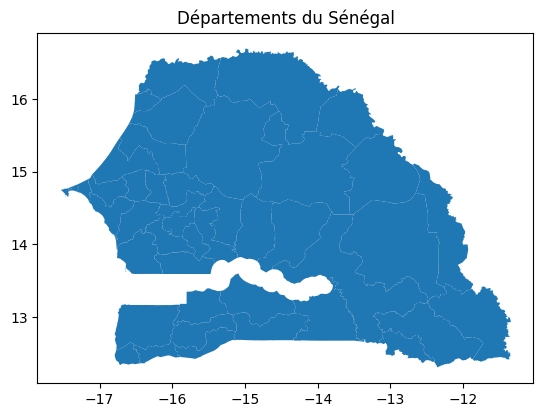

In [4]:
# Charger le shapefile
shapefile_path = 'gadm41_SEN_2.shx'
gdf = gpd.read_file(shapefile_path)

# Visualiser le shapefile
gdf.plot()
plt.title('Départements du Sénégal')
plt.show()


In [26]:
gdf

,geometry,Region Name
0,"MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...",DAKAR
1,"POLYGON ((-17.42902 14.76355, -17.42896 14.763...",GUEDIAWAYE
2,"POLYGON ((-17.29675 14.75111, -17.29622 14.750...",PIKINE
3,"POLYGON ((-17.25486 14.70375, -17.25486 14.704...",RUFISQUE
4,"POLYGON ((-16.52628 14.60573, -16.52672 14.605...",BAMBEY
5,"POLYGON ((-16.10407 14.80849, -16.09813 14.808...",DIOURBEL
6,"MULTIPOLYGON (((-16.06890 14.66287, -16.06885 ...",MBACKE
7,"POLYGON ((-16.72214 13.99249, -16.72281 13.992...",FATICK
8,"MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...",FOUNDIOUGNE
9,"POLYGON ((-16.10754 14.36886, -16.10828 14.370...",GOSSAS


Nous nous apercevons que le fichier ne contient pas les noms des départements associés à leur géométrie. Nous ferons cette association un peu plus tard. Pour l'instant, il s'agissait simplement de charger les fichiers shapefile.

## Arachides

In [6]:
#charger arachides

import pandas as pd

# Charger le fichier Excel
# Actualiser le chemin
file_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\yields\arachides.csv"
data = pd.read_csv(file_path)

# Afficher les premières lignes des données
print(data.head())

# Afficher les informations générales sur les données
print(data.info())

                 Region        SN            SN-DK  SN-DK-RU  \
0           Region Name   SENEGAL  REGION DE DAKAR  RUFISQUE   
1  Region - Description       NaN              NaN       NaN   
2     Region - RegionId        SN            SN-DK  SN-DK-RU   
3               Culture       ARA              ARA       ARA   
4          Culture Name  ARACHIDE         ARACHIDE  ARACHIDE   

                SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK  \
0  REGION DE DIOURBEL    BAMBEY  DIOURBEL    MBACKE  REGION DE FATICK   
1                 NaN       NaN       NaN       NaN               NaN   
2               SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK   
3                 ARA       ARA       ARA       ARA               ARA   
4            ARACHIDE  ARACHIDE  ARACHIDE  ARACHIDE          ARACHIDE   

   SN-FK-FD  ...    SN-TC-KO     SN-TC-TD            SN-TH  SN-TH-MB  \
0    FATICK  ...  KOUPENTOUM  TAMBACOUNDA  REGION DE THIES     MBOUR   
1       NaN  ...         NaN    

In [7]:
# Transposer le DataFrame
data_transposed = data.transpose()

# Liste des indices des colonnes à supprimer
columns_to_drop_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

# Supprimer les colonnes spécifiées du DataFrame transposé
data_cleaned = data_transposed.drop(columns_to_drop_indices, axis=1)


# Afficher les premières lignes du DataFrame nettoyé
print(data_cleaned.head(10))

arachides=data_cleaned

arachides.head()

                          0            18           19          20  \
Region           Region Name         2017         2018        2019   
SN                   SENEGAL  1405223.324   1437219.52  1421288.11   
SN-DK        REGION DE DAKAR  1884.493889  55.76201556          80   
SN-DK-RU            RUFISQUE  1884.493889  55.76201556          80   
SN-DB     REGION DE DIOURBEL  53146.62224  63368.84542       55487   
SN-DB-BA              BAMBEY    24425.557  16801.17092       13846   
SN-DB-DD            DIOURBEL  11634.92349    10649.345       10191   
SN-DB-MB              MBACKE  17086.14175   35918.3295       31450   
SN-FK       REGION DE FATICK   230104.166     228148.5      239750   
SN-FK-FD              FATICK  66953.04222        61254       78000   

                   21           22           23  
Region           2020         2021         2022  
SN        1797486.113  1677803.559  1501498.402  
SN-DK     556.5293069  741.7500419        662.2  
SN-DK-RU  556.5293069  741.75

,0,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,1405223.324,1437219.52,1421288.11,1797486.113,1677803.559,1501498.402
SN-DK,REGION DE DAKAR,1884.493889,55.76201556,80,556.5293069,741.7500419,662.2
SN-DK-RU,RUFISQUE,1884.493889,55.76201556,80,556.5293069,741.7500419,662.2
SN-DB,REGION DE DIOURBEL,53146.62224,63368.84542,55487,85433.09127,54125.19957,54760.79216


In [8]:
arachides.rename(columns={0: 'Region Name'}, inplace=True)

arachides.head()

,Region Name,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,1405223.324,1437219.52,1421288.11,1797486.113,1677803.559,1501498.402
SN-DK,REGION DE DAKAR,1884.493889,55.76201556,80,556.5293069,741.7500419,662.2
SN-DK-RU,RUFISQUE,1884.493889,55.76201556,80,556.5293069,741.7500419,662.2
SN-DB,REGION DE DIOURBEL,53146.62224,63368.84542,55487,85433.09127,54125.19957,54760.79216


In [9]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
arachides = arachides[~arachides['Region Name'].str.startswith('REGION')]

# Vérifier le changement
print(arachides)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN                  SENEGAL  1405223.324   1437219.52   1421288.11   
SN-DK-RU           RUFISQUE  1884.493889  55.76201556           80   
SN-DB-BA             BAMBEY    24425.557  16801.17092        13846   
SN-DB-DD           DIOURBEL  11634.92349    10649.345        10191   
SN-DB-MB             MBACKE  17086.14175   35918.3295        31450   
SN-FK-FD             FATICK  66953.04222        61254        78000   
SN-FK-FO        FOUNDIOUGNE  83413.14378      92398.5       101250   
SN-FK-GO             GOSSAS     79737.98        74496        60500   
SN-KA-BI          BIRKILANE     44933.07        77250        66000   
SN-KA-KA           KAFFRINE  54190.86572        59520        45000   
SN-KA-KO          KOUNGHEUL  47463.15448        63750        78000   
SN-KA-MO       MALEM HODDAR  69004.94524        72050        70460   
SN-KL-GU         GUI

In [10]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
arachides = arachides[~arachides['Region Name'].str.startswith('SENEGAL')]

# Vérifier le changement
print(arachides)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN-DK-RU           RUFISQUE  1884.493889  55.76201556           80   
SN-DB-BA             BAMBEY    24425.557  16801.17092        13846   
SN-DB-DD           DIOURBEL  11634.92349    10649.345        10191   
SN-DB-MB             MBACKE  17086.14175   35918.3295        31450   
SN-FK-FD             FATICK  66953.04222        61254        78000   
SN-FK-FO        FOUNDIOUGNE  83413.14378      92398.5       101250   
SN-FK-GO             GOSSAS     79737.98        74496        60500   
SN-KA-BI          BIRKILANE     44933.07        77250        66000   
SN-KA-KA           KAFFRINE  54190.86572        59520        45000   
SN-KA-KO          KOUNGHEUL  47463.15448        63750        78000   
SN-KA-MO       MALEM HODDAR  69004.94524        72050        70460   
SN-KL-GU         GUINGUINEO  30921.48151  23237.28234        25500   
SN-KL-KA            

Le dataframe ne contenait pas les départements de Dakar, Pikine et Rufisque, pour lesquels les productions en arachide sont considérées nulles. Pourtant, le fichier shapefile contient ces départements. On va donc les rajouter pour plus de cohérence.

In [11]:
# Créer un DataFrame pour les nouvelles lignes
new_rows = pd.DataFrame({
    'Region Name': ['DAKAR', 'GUEDIAWAYE', 'PIKINE'],
    18: [0, 0, 0],
    19: [0, 0, 0],
    20: [0, 0, 0],
    21: [0, 0, 0],
    22: [0, 0, 0],
    23: [0, 0, 0]
})

# Ajouter les nouvelles lignes en haut du DataFrame existant
arachides = pd.concat([new_rows, arachides], ignore_index=True)

# Vérifier le changement
print(arachides)

          Region Name           18           19           20           21  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
3         Region Name         2017         2018         2019         2020   
4            RUFISQUE  1884.493889  55.76201556           80  556.5293069   
5              BAMBEY    24425.557  16801.17092        13846  22627.62325   
6            DIOURBEL  11634.92349    10649.345        10191  22692.64875   
7              MBACKE  17086.14175   35918.3295        31450  40112.81927   
8              FATICK  66953.04222        61254        78000  59891.25042   
9         FOUNDIOUGNE  83413.14378      92398.5       101250  79171.78862   
10             GOSSAS     79737.98        74496        60500  92743.98387   
11          BIRKILANE     44933.07        77250        66000  89967.09047   

In [12]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
arachides = arachides[~arachides['Region Name'].str.startswith('Region Name')]

# Vérifier le changement
print(arachides)

          Region Name           18           19           20           21  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE  1884.493889  55.76201556           80  556.5293069   
5              BAMBEY    24425.557  16801.17092        13846  22627.62325   
6            DIOURBEL  11634.92349    10649.345        10191  22692.64875   
7              MBACKE  17086.14175   35918.3295        31450  40112.81927   
8              FATICK  66953.04222        61254        78000  59891.25042   
9         FOUNDIOUGNE  83413.14378      92398.5       101250  79171.78862   
10             GOSSAS     79737.98        74496        60500  92743.98387   
11          BIRKILANE     44933.07        77250        66000  89967.09047   
12           KAFFRINE  54190.86572        59520        45000  99173.90781   

In [13]:
arachides.rename(columns={18: 2017}, inplace=True)
arachides.rename(columns={19: 2018}, inplace=True)
arachides.rename(columns={20: 2019}, inplace=True)
arachides.rename(columns={21: 2020}, inplace=True)
arachides.rename(columns={22: 2021}, inplace=True)
arachides.rename(columns={23: 2022}, inplace=True)

In [14]:
print(arachides)

          Region Name         2017         2018         2019         2020  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE  1884.493889  55.76201556           80  556.5293069   
5              BAMBEY    24425.557  16801.17092        13846  22627.62325   
6            DIOURBEL  11634.92349    10649.345        10191  22692.64875   
7              MBACKE  17086.14175   35918.3295        31450  40112.81927   
8              FATICK  66953.04222        61254        78000  59891.25042   
9         FOUNDIOUGNE  83413.14378      92398.5       101250  79171.78862   
10             GOSSAS     79737.98        74496        60500  92743.98387   
11          BIRKILANE     44933.07        77250        66000  89967.09047   
12           KAFFRINE  54190.86572        59520        45000  99173.90781   

Après avoir observé les données, nous remarquons que de manière générale, les données manquantes correspondent en réalité à une absence de production. Nous les remplaçons donc par des 0.

In [15]:
# Remplacer les NaN par 0
arachides.fillna(0, inplace=True)

print(arachides)

          Region Name         2017         2018         2019         2020  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE  1884.493889  55.76201556           80  556.5293069   
5              BAMBEY    24425.557  16801.17092        13846  22627.62325   
6            DIOURBEL  11634.92349    10649.345        10191  22692.64875   
7              MBACKE  17086.14175   35918.3295        31450  40112.81927   
8              FATICK  66953.04222        61254        78000  59891.25042   
9         FOUNDIOUGNE  83413.14378      92398.5       101250  79171.78862   
10             GOSSAS     79737.98        74496        60500  92743.98387   
11          BIRKILANE     44933.07        77250        66000  89967.09047   
12           KAFFRINE  54190.86572        59520        45000  99173.90781   

In [16]:
print(gdf)

                                             geometry
0   MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...
1   POLYGON ((-17.42902 14.76355, -17.42896 14.763...
2   POLYGON ((-17.29675 14.75111, -17.29622 14.750...
3   POLYGON ((-17.25486 14.70375, -17.25486 14.704...
4   POLYGON ((-16.52628 14.60573, -16.52672 14.605...
5   POLYGON ((-16.10407 14.80849, -16.09813 14.808...
6   MULTIPOLYGON (((-16.06890 14.66287, -16.06885 ...
7   POLYGON ((-16.72214 13.99249, -16.72281 13.992...
8   MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...
9   POLYGON ((-16.10754 14.36886, -16.10828 14.370...
10  POLYGON ((-15.55763 13.86664, -15.55969 13.865...
11  POLYGON ((-15.38576 13.76408, -15.38912 13.761...
12  POLYGON ((-14.61230 13.93118, -14.61858 13.928...
13  POLYGON ((-15.46018 14.06274, -15.45937 14.063...
14  POLYGON ((-15.96120 14.11024, -15.96336 14.111...
15  POLYGON ((-15.70095 13.93366, -15.69934 13.932...
16  POLYGON ((-15.50253 13.59068, -15.53174 13.590...
17  POLYGON ((-11.90298 12.4

Nous allons associer à chacune des géométries du shapefile le nom du département correspondant. Ils sont rangés selon l'ordre alphabétique des régions, puis au sein d'une région selon l'ordre alphabétique des départements.

In [17]:
# Liste des noms des départements correspondant à l'ordre des géométries dans le GeoDataFrame
noms_departements = [
    'DAKAR', 'GUEDIAWAYE', 'PIKINE', 'RUFISQUE',
    'BAMBEY', 'DIOURBEL', 'MBACKE',
    'FATICK', 'FOUNDIOUGNE', 'GOSSAS',
    'BIRKILANE', 'KAFFRINE', 'KOUNGHEUL', 'MALEM HODDAR',
    'GUINGUINEO', 'KAOLACK', 'NIORO DU RIP',
    'KEDOUGOU', 'SALEMATA', 'SARAYA',
    'KOLDA', 'MEDINA YORO FOULA', 'VELINGARA',
    'KEBEMER', 'LINGUERE', 'LOUGA', 
    'KANEL', 'MATAM', 'RANEROU', 
    'DAGANA', 'PODOR', 'SAINT-LOUIS',
    'BOUNKILING', 'GOUDOMP', 'SEDHIOU',
    'BAKEL', 'GOUDIRY', 'KOUPENTOUM', 'TAMBACOUNDA',
    'MBOUR', 'THIES', 'TIVAOUANE',
    'BIGNONA', 'OUSSOUYE', 'ZIGUINCHOR'
]

# Vérifier que le nombre de noms correspond au nombre de géométries
print(len(noms_departements), len(gdf))

# Ajouter la colonne des noms des départements au GeoDataFrame
gdf['Region Name'] = noms_departements

# Afficher les premières lignes pour vérifier l'ajout
print(gdf.head())


45 45
                                            geometry Region Name
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY


On affiche le résultat.

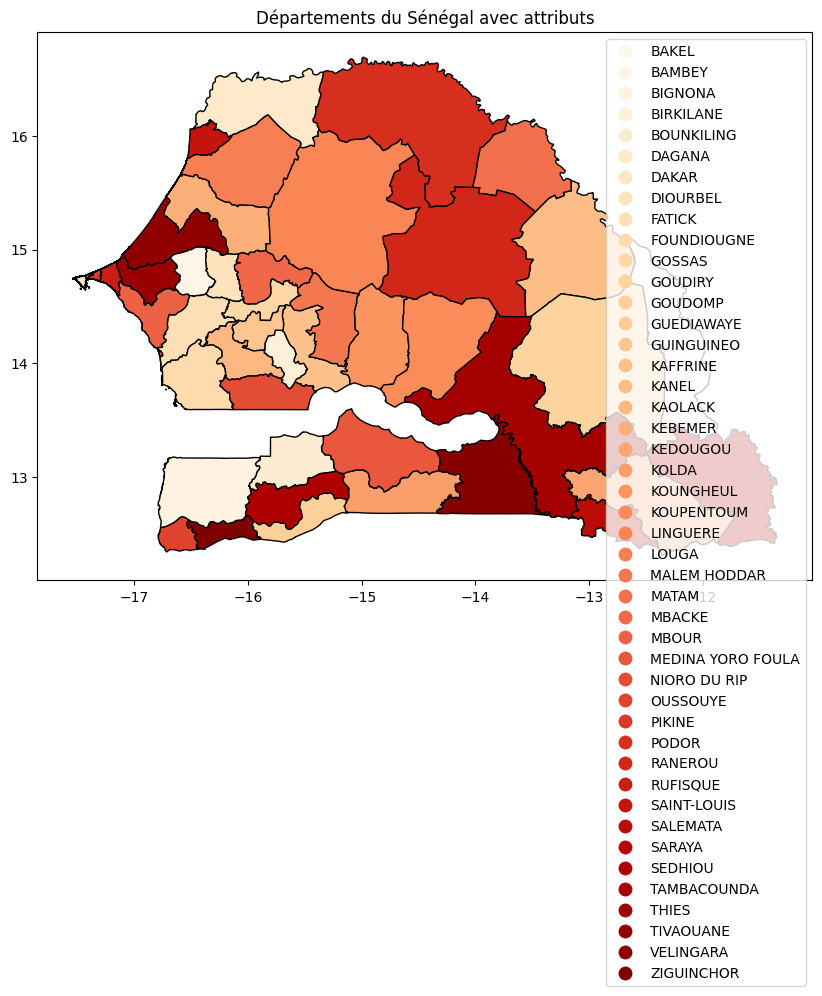

In [18]:


# Personnaliser la visualisation
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(column='Region Name', ax=ax, legend=True,
         cmap='OrRd', edgecolor='black')

plt.title('Départements du Sénégal avec attributs')
plt.show()


A présent, nous allons faire fusionner les 2 tableaux pour associer à chaque département sa géométrie ainsi que ses productions agricoles annuelles d'arachides entre 2017 et 2022.

In [19]:
# Fusionner les données
merged_gdf = gdf.merge(arachides, on='Region Name')

# Afficher les premières lignes pour vérifier la fusion
print(merged_gdf.head())

                                            geometry Region Name         2017  \
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR            0   
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE            0   
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE            0   
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE  1884.493889   
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY    24425.557   

          2018   2019         2020         2021        2022  
0            0      0            0            0           0  
1            0      0            0            0           0  
2            0      0            0            0           0  
3  55.76201556     80  556.5293069  741.7500419       662.2  
4  16801.17092  13846  22627.62325  20300.85484  15062.2224  


In [20]:
print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)

2017    object
2018    object
2019    object
2020    object
2021    object
2022    object
dtype: object


In [21]:
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    merged_gdf[year] = pd.to_numeric(merged_gdf[year], errors='coerce')

In [22]:
print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)

2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
2022    float64
dtype: object


Nous allons maintenant afficher une carte de chaleur de la production d'arachides par département de 2017 à 2022.

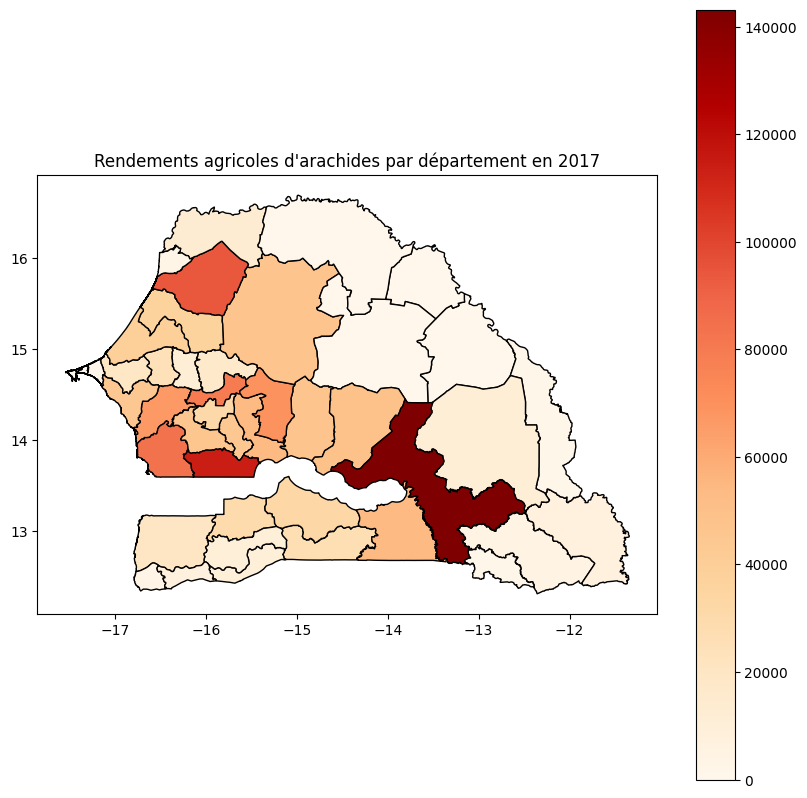

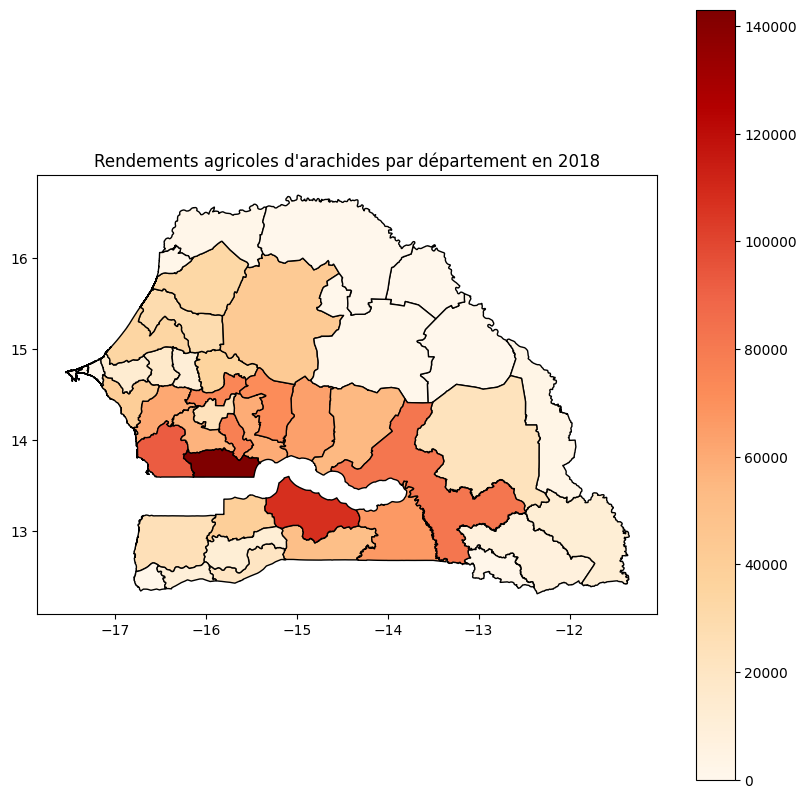

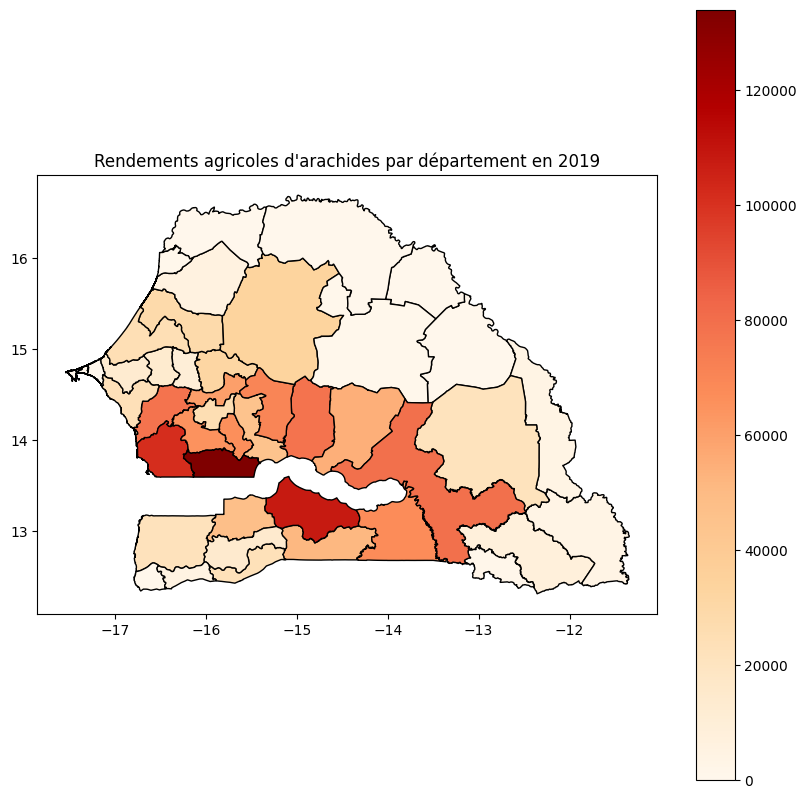

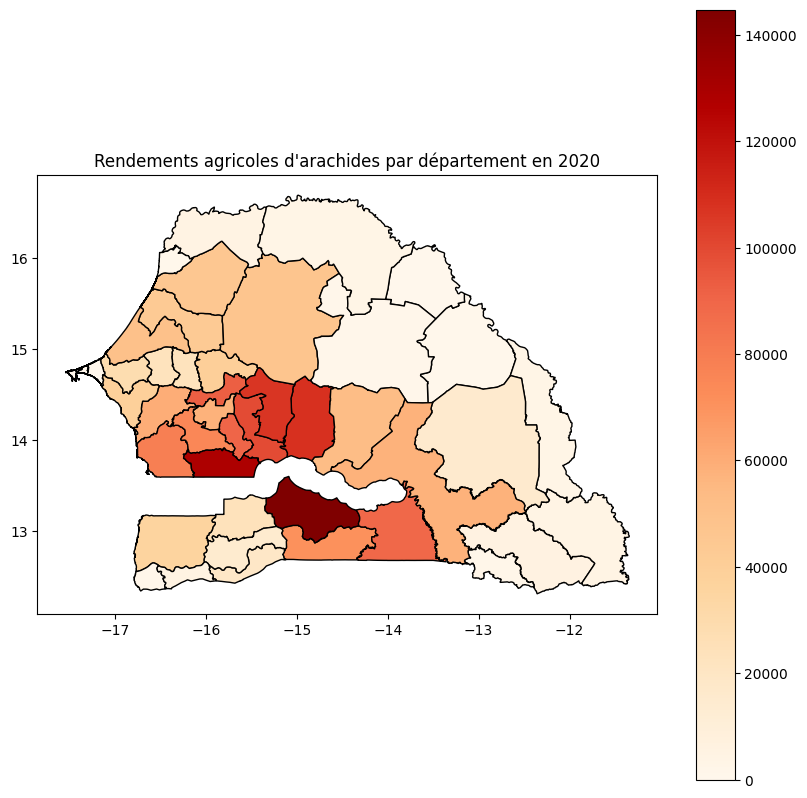

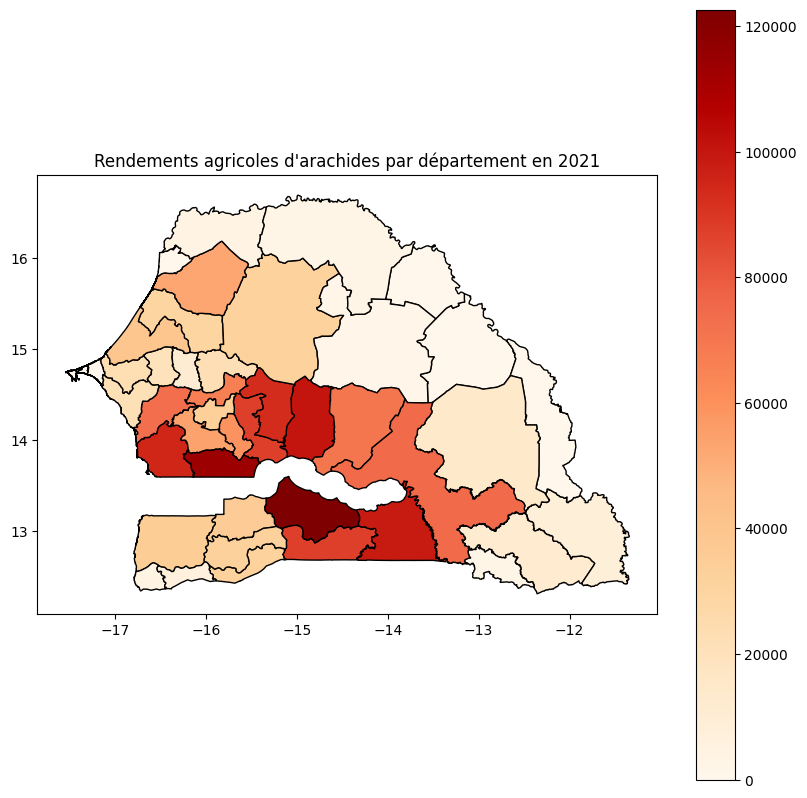

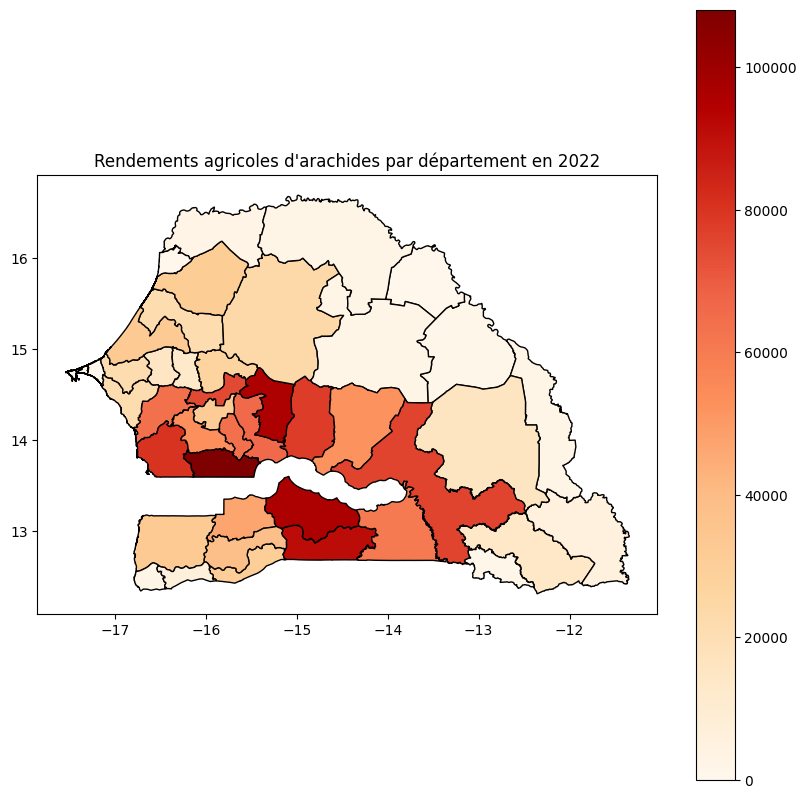

In [21]:
years = [2017, 2018, 2019, 2020, 2021, 2022]

for year in years:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    merged_gdf.plot(column=year, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
    plt.title(f'Rendements agricoles d\'arachides par département en {year}')
    plt.show()

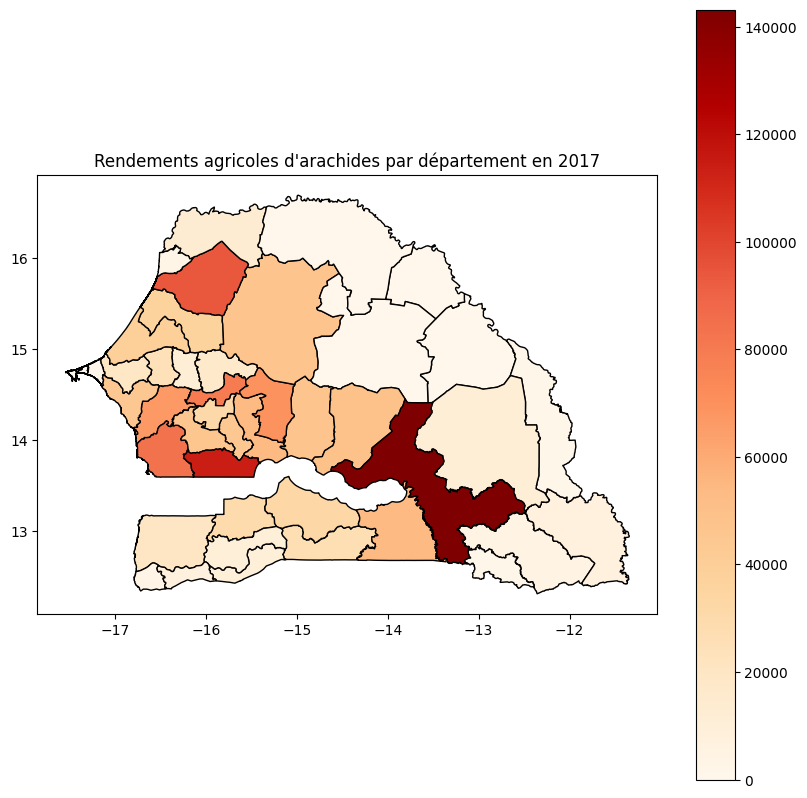

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
merged_gdf.plot(column=2017, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
plt.title(f'Rendements agricoles d\'arachides par département en 2017')
plt.show()

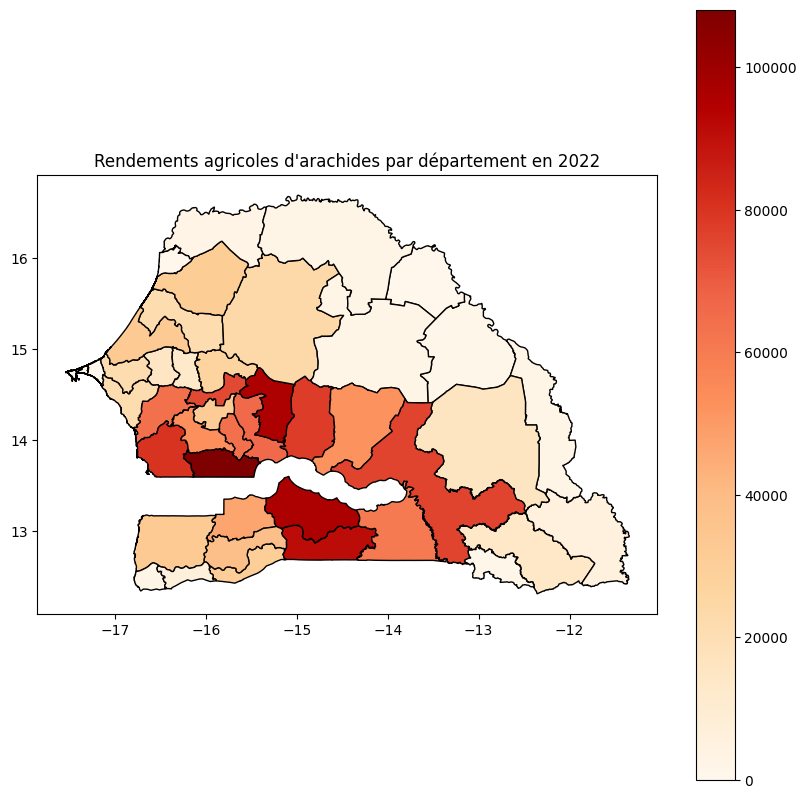

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
merged_gdf.plot(column=2022, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
plt.title(f'Rendements agricoles d\'arachides par département en 2022')
plt.show()

## Extraction des données d'entrée

La prochaine étape consiste à extraire nos features ou données d'entrée. Il s'agit des variables dont nous disposons pour chaque département et que nous souhaitons utiliser afin de prédire la production agricole en arachides. 

Nos données d'entrée sont la pluviométrie, la température du sol et le NDVI (Normalized Desertification Vegetation Index). Ce dernier est un indice qui est calculé à partir de données satellites, plus précisément des valeurs issues des bandes B4 et B8.

In [27]:
# CODE NDVI

import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
# pour éviter les warnings que j'avais nanei là
import os

# Chemin vers le dossier contenant les fichiers CSV
folder_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\features\ndvi"

# Liste des colonnes à recueillir
columns_to_collect = ['2022', '2021', '2020']

# Dictionnaire pour stocker les DataFrames
departments_ndvi = {}

# Initialisation d'un DataFrame vide pour stocker les données
ndvi_global = pd.DataFrame()

# Fonction pour calculer la moyenne bimensuelle et traiter le mois d'octobre
def process_monthly_data(df):
    # Sélection des lignes par mois
    monthly_data = {
        'Jan': df.loc[df['Month'] == 'Jan', columns_to_collect].mean(),
        'Feb': df.loc[df['Month'] == 'Feb', columns_to_collect].mean(),
        'Mar': df.loc[df['Month'] == 'Mar', columns_to_collect].mean(),
        'Apr': df.loc[df['Month'] == 'Apr', columns_to_collect].mean(),
        'May': df.loc[df['Month'] == 'May', columns_to_collect].mean(),
        'Jun': df.loc[df['Month'] == 'Jun', columns_to_collect].mean(),
        'Jul': df.loc[df['Month'] == 'Jul', columns_to_collect].mean(),
        'Aug': df.loc[df['Month'] == 'Aug', columns_to_collect].mean(),
        'Sept': df.loc[df['Month'] == 'Sept', columns_to_collect].mean(),
        'Oct': df.loc[df['Month'] == 'Oct', columns_to_collect].mean(),  # Mois d'octobre
        'Nov': df.loc[df['Month'] == 'Nov', columns_to_collect].mean(),
        'Dec': df.loc[df['Month'] == 'Dec', columns_to_collect].mean()
    }
    return pd.DataFrame(monthly_data)

# Parcourir tous les fichiers CSV dans le dossier
for file_name in os.listdir(folder_path):
    if file_name.endswith('_ndvi.csv'):  # Vérifie si le fichier correspond au format attendu
        file_path = os.path.join(folder_path, file_name)
        
        # Charger le fichier CSV
        df = pd.read_csv(file_path, sep=";")
        
        
        # Vérifier les colonnes disponibles
        #print(f"Colonnes disponibles dans {file_name}: {df.columns.tolist()}")
        
        # Remplacer les virgules par des points dans les colonnes numériques
        for column in columns_to_collect:
            df[column] = df[column].str.replace(',', '.').astype(float)
        
        # Ajouter une colonne pour le mois (1-23 en mois Jan-Dec)
        df['Month'] = ['Jan', 'Jan', 'Feb', 'Feb', 'Mar', 'Mar', 'Apr', 'Apr', 'May', 'May', 'Jun', 'Jun', 'Jul', 'Jul', 'Aug', 'Aug', 'Sept', 'Sept', 'Oct', 'Nov', 'Nov', 'Dec', 'Dec']
        
        # Conversion des noms de colonnes en int
        # df[columns_to_collect].columns = [int(s) for s in df[columns_to_collect].columns]
        
        # Sélectionner uniquement les colonnes souhaitées
        df_selected = df[['Month'] + columns_to_collect]
        
        # Calculer la moyenne bimensuelle pour chaque mois
        monthly_averages = process_monthly_data(df_selected)
        
        # Ajouter une colonne pour indiquer le nom du département
        department_name = file_name.split('_')[0]
        monthly_averages['Department'] = department_name
        # print(monthly_averages)
        
        # Stocker le DataFrame dans le dictionnaire
        departments_ndvi[department_name] = monthly_averages
        
        # Ajouter les données au DataFrame global
        ndvi_global = pd.concat([ndvi_global, monthly_averages], ignore_index=False)

# Afficher les données collectées
print(ndvi_global)

# Optionnel : sauvegarder le DataFrame dans un fichier CSV
# all_data.to_csv('collected_monthly_averages.csv', index=False)


           Jan       Feb       Mar       Apr       May       Jun       Jul  \
2022  0.257735  0.231381  0.211214  0.204057  0.218718  0.402606  0.568914   
2021  0.268100  0.239797  0.218682  0.215520  0.202898  0.315088  0.474743   
2020  0.261373  0.243739  0.223248  0.217857  0.212408  0.370194  0.512371   
2022  0.242286  0.223021  0.212909  0.203344  0.193739  0.202880  0.289891   
2021  0.248305  0.228972  0.217411  0.211568  0.201723  0.215428  0.290294   
...        ...       ...       ...       ...       ...       ...       ...   
2021  0.432087  0.333917  0.295071  0.334567  0.346571  0.452654  0.613265   
2020  0.397468  0.316537  0.302161  0.319346  0.321595  0.437144  0.551721   
2022  0.547683  0.468462  0.418164  0.410621  0.442483  0.543734  0.547937   
2021  0.522238  0.472681  0.420854  0.407441  0.413720  0.481157  0.524097   
2020  0.492111  0.465013  0.413373  0.375735  0.366080  0.457983  0.515613   

           Aug      Sept       Oct       Nov       Dec  Departm

In [28]:
# CODE LST

import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import os

# Chemin vers le dossier contenant les fichiers CSV
folder_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\features\land surface temperature"

# Liste des colonnes à recueillir
columns_to_collect = ['2022', '2021', '2020']

# Dictionnaire pour stocker les DataFrames
departments_landtemp = {}

# Initialisation d'un DataFrame vide pour stocker les données
landtemp_global = pd.DataFrame()

# Fonction pour remplir les valeurs manquantes
def fill_missing_values(df, columns):
    for col in columns:
        for i in range(len(df)):
            if pd.isna(df.loc[i, col]):
                # Trouver les valeurs non manquantes encadrantes
                prev_value = df.loc[:i-1, col].dropna().iloc[-1] if not df.loc[:i-1, col].dropna().empty else None
                next_value = df.loc[i+1:, col].dropna().iloc[0] if not df.loc[i+1:, col].dropna().empty else None
                # Remplir les valeurs manquantes
                if prev_value is not None and next_value is not None:
                    df.loc[i, col] = (prev_value + next_value) / 2
                elif prev_value is not None:
                    df.loc[i, col] = prev_value
                elif next_value is not None:
                    df.loc[i, col] = next_value
    return df

# Fonction pour calculer la moyenne mensuelle
def process_monthly_data(df):
    # Sélection des lignes par mois
    monthly_data = {
        'Jan': df.loc[df['Month'] == 'Jan', columns_to_collect].mean(),
        'Feb': df.loc[df['Month'] == 'Feb', columns_to_collect].mean(),
        'Mar': df.loc[df['Month'] == 'Mar', columns_to_collect].mean(),
        'Apr': df.loc[df['Month'] == 'Apr', columns_to_collect].mean(),
        'May': df.loc[df['Month'] == 'May', columns_to_collect].mean(),
        'Jun': df.loc[df['Month'] == 'Jun', columns_to_collect].mean(),
        'Jul': df.loc[df['Month'] == 'Jul', columns_to_collect].mean(),
        'Aug': df.loc[df['Month'] == 'Aug', columns_to_collect].mean(),
        'Sept': df.loc[df['Month'] == 'Sept', columns_to_collect].mean(),
        'Oct': df.loc[df['Month'] == 'Oct', columns_to_collect].mean(),
        'Nov': df.loc[df['Month'] == 'Nov', columns_to_collect].mean(),
        'Dec': df.loc[df['Month'] == 'Dec', columns_to_collect].mean()
    }
    return pd.DataFrame(monthly_data)

# Parcourir tous les fichiers CSV dans le dossier
for file_name in os.listdir(folder_path):
    if file_name.endswith('_lst.csv'):  # Vérifie si le fichier correspond au format attendu
        file_path = os.path.join(folder_path, file_name)
        
        # Charger le fichier CSV
        df = pd.read_csv(file_path, sep=";")
        
        # Vérifier les colonnes disponibles
        # print(f"Colonnes disponibles dans {file_name}: {df.columns.tolist()}")
        
        # Remplacer les virgules par des points dans les colonnes numériques
        for column in columns_to_collect:
            df[column] = df[column].str.replace(',', '.').astype(float)
        
        # Ajouter une colonne pour le mois (1-46 en mois Jan-Dec)
        df['Month'] = ['Jan', 'Jan', 'Jan', 'Jan', 'Feb', 'Feb', 'Feb', 'Feb', 'Mar', 'Mar', 'Mar', 'Mar', 'Apr', 'Apr', 'Apr', 'May', 'May', 'May', 'May', 'Jun', 'Jun', 'Jun', 'Jun', 'Jul', 'Jul', 'Jul', 'Jul', 'Aug', 'Aug', 'Aug', 'Aug', 'Sept', 'Sept', 'Sept', 'Sept', 'Oct', 'Oct', 'Oct', 'Nov', 'Nov', 'Nov', 'Nov', 'Dec', 'Dec', 'Dec', 'Dec']
        
        # Conversion des noms de colonnes en int
        # df[columns_to_collect].columns = [int(s) for s in df[columns_to_collect].columns]
        
        # Réindexer pour s'assurer que l'index est correct
        df.reset_index(drop=True, inplace=True)
        
        # Remplir les valeurs manquantes
        df_filled = fill_missing_values(df, columns_to_collect)
        
        # Sélectionner uniquement les colonnes souhaitées
        df_selected = df_filled[['Month'] + columns_to_collect]
        
        # Calculer la moyenne bimensuelle pour chaque mois
        monthly_averages = process_monthly_data(df_selected)
        
        # Ajouter une colonne pour indiquer le nom du département
        department_name = file_name.split('_')[0]
        monthly_averages['Department'] = department_name
        # print(monthly_averages)
        
        # Stocker le DataFrame dans le dictionnaire
        departments_landtemp[department_name] = monthly_averages
        
        # Ajouter les données au DataFrame global
        landtemp_global = pd.concat([landtemp_global, monthly_averages], ignore_index=False)

        # print(f"DataFrame créé pour le département : {department_name}")

# Afficher un message de fin de traitement
print("Traitement terminé et DataFrames créés.")


Traitement terminé et DataFrames créés.


In [25]:
print(landtemp_global)

            Jan        Feb        Mar        Apr        May        Jun  \
2022  39.077749  38.377054  42.172265  45.570837  44.362749  34.924287   
2021  40.161125  40.247311  43.810676  50.470607  43.994165  37.044306   
2020  34.395264  40.613716  47.375648  47.237254  47.203396  31.291789   
2022  36.640563  35.863638  38.342256  40.980742  41.836672  36.523629   
2021  34.081900  36.124152  39.727764  43.467797  39.106836  37.960676   
...         ...        ...        ...        ...        ...        ...   
2021  34.525105  37.144665  39.732530  43.786086  39.375880  34.646570   
2020  31.285971  38.903967  42.740633  43.311810  39.574964  31.396549   
2022  28.703656  30.046174  31.681443  33.897563  32.397051  29.144130   
2021  28.418898  28.664583  32.063317  34.362103  32.086008  31.920919   
2020  27.213629  32.251954  35.811764  36.122631  34.607821  29.619057   

            Jul        Aug       Sept        Oct        Nov        Dec  \
2022  29.875933  25.575331  28.397314

Pour la pluviométrie, n'ayant pas de données sur Guediawaye, nous allons faire la moyenne entre Dakar et Pikine, les 2 départements les plus proches. Le code ci-après !

In [29]:
# CODE RAINFALL

import pandas as pd
import os

pd.options.mode.chained_assignment = None  # Pour éviter les warnings

# Chemin vers le dossier contenant les fichiers CSV
folder_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\features\rainfall"

# Liste des colonnes à recueillir
columns_to_collect = ['2022', '2021', '2020']

# Dictionnaire pour stocker les DataFrames
departments_rainfall = {}

# Initialisation d'un DataFrame global pour stocker les données
rainfall_global = pd.DataFrame()

# Fonction pour calculer la moyenne journalière par mois
def process_monthly_data(df):
    monthly_data = {
        'Jan': df.loc[df['Month'] == 'Jan', columns_to_collect].mean(),
        'Feb': df.loc[df['Month'] == 'Feb', columns_to_collect].mean(),
        'Mar': df.loc[df['Month'] == 'Mar', columns_to_collect].mean(),
        'Apr': df.loc[df['Month'] == 'Apr', columns_to_collect].mean(),
        'May': df.loc[df['Month'] == 'May', columns_to_collect].mean(),
        'Jun': df.loc[df['Month'] == 'Jun', columns_to_collect].mean(),
        'Jul': df.loc[df['Month'] == 'Jul', columns_to_collect].mean(),
        'Aug': df.loc[df['Month'] == 'Aug', columns_to_collect].mean(),
        'Sept': df.loc[df['Month'] == 'Sept', columns_to_collect].mean(),
        'Oct': df.loc[df['Month'] == 'Oct', columns_to_collect].mean(),
        'Nov': df.loc[df['Month'] == 'Nov', columns_to_collect].mean(),
        'Dec': df.loc[df['Month'] == 'Dec', columns_to_collect].mean()
    }
    return pd.DataFrame(monthly_data)

# Parcourir tous les fichiers CSV dans le dossier
for file_name in os.listdir(folder_path):
    if file_name.endswith('_rain.csv'):  # Vérifie si le fichier correspond au format attendu
        file_path = os.path.join(folder_path, file_name)
        
        # Charger le fichier CSV
        df = pd.read_csv(file_path, sep=";")
        
        # Remplacer les virgules par des points dans les colonnes numériques
        for column in columns_to_collect:
            df[column] = df[column].str.replace(',', '.').astype(float)
        
        # Ajouter une colonne pour le mois (1-365 en mois Jan-Dec)
        df['Month'] = [
            'Jan'] * 31 + ['Feb'] * 28 + ['Mar'] * 31 + ['Apr'] * 30 + ['May'] * 31 + ['Jun'] * 30 + \
            ['Jul'] * 31 + ['Aug'] * 31 + ['Sept'] * 30 + ['Oct'] * 31 + ['Nov'] * 30 + ['Dec'] * 31
        
        # Conversion des noms de colonnes en int
        # df[columns_to_collect].columns = [int(s) for s in df[columns_to_collect].columns]
        
        # Sélectionner uniquement les colonnes souhaitées
        df_selected = df[['Month'] + columns_to_collect]
        
        # Calculer les moyennes journalières par mois
        monthly_averages = process_monthly_data(df_selected)
        
        # Ajouter le nom du département
        department_name = file_name.split('_')[0]
        monthly_averages['Department'] = department_name
        
        # Stocker dans le dictionnaire et concaténer dans le DataFrame global
        departments_rainfall[department_name] = monthly_averages
        rainfall_global = pd.concat([rainfall_global, monthly_averages], ignore_index=False)
        
# print(rainfall_global)

# Ajouter les données pour Guediawaye en calculant la moyenne des départements voisins
dakar = departments_rainfall['dakar']
pikine = departments_rainfall['pikine']

guediawaye = (dakar[["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sept","Oct","Nov","Dec"]] + pikine[["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sept","Oct","Nov","Dec"]]) / 2

guediawaye['Department'] = 'guediawaye'


# Ajouter Guediawaye au DataFrame global
rainfall_global = pd.concat([rainfall_global, guediawaye], ignore_index=False)

# Stocker Guediawaye dans le dictionnaire
departments_rainfall['guediawaye'] = guediawaye

# Trier le DataFrame global par le nom des départements
rainfall_global = rainfall_global.sort_values(by='Department')



# Afficher les données collectées
print(rainfall_global)

# Optionnel : sauvegarder le DataFrame dans un fichier CSV
# rainfall_global.to_csv('collected_monthly_averages_rainfall.csv', index=False)


           Jan       Feb       Mar       Apr       May       Jun        Jul  \
2022  0.000723  0.001887  0.000026  0.000000  0.866107  2.977087   4.399444   
2021  0.000328  0.005730  0.000014  0.000045  0.208235  2.566674   3.893498   
2020  0.000507  0.002999  0.000029  0.001563  0.237699  3.512035   5.744763   
2022  0.024342  0.011403  0.000011  0.000000  0.050276  1.190531   4.575609   
2021  0.026807  0.014306  0.000009  0.000000  0.000000  0.908360   1.149613   
...        ...       ...       ...       ...       ...       ...        ...   
2021  0.000623  0.009613  0.000059  0.003988  0.070670  2.893619   6.156199   
2020  0.000112  0.005980  0.000012  0.012434  0.230709  4.478495   7.407844   
2022  0.003717  0.001282  0.010722  0.000000  0.581797  4.673295   9.929908   
2021  0.004168  0.008345  0.000025  0.000651  0.018270  2.577361   7.877212   
2020  0.002795  0.005375  0.004075  0.000000  0.057973  3.621631  18.072622   

            Aug       Sept       Oct       Nov     

In [26]:
merged_gdf

,geometry,Region Name,2017,2018,2019,2020,2021,2022
0,"MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...",DAKAR,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
1,"POLYGON ((-17.42902 14.76355, -17.42896 14.763...",GUEDIAWAYE,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2,"POLYGON ((-17.29675 14.75111, -17.29622 14.750...",PIKINE,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
3,"POLYGON ((-17.25486 14.70375, -17.25486 14.704...",RUFISQUE,1884.493889,55.762016,80.00000,556.529307,741.750042,662.200000
4,"POLYGON ((-16.52628 14.60573, -16.52672 14.605...",BAMBEY,24425.557000,16801.170920,13846.00000,22627.623250,20300.854840,15062.222400
5,"POLYGON ((-16.10407 14.80849, -16.09813 14.808...",DIOURBEL,11634.923490,10649.345000,10191.00000,22692.648750,11420.381700,12691.575070
6,"MULTIPOLYGON (((-16.06890 14.66287, -16.06885 ...",MBACKE,17086.141750,35918.329500,31450.00000,40112.819270,22403.963030,27006.994690
7,"POLYGON ((-16.72214 13.99249, -16.72281 13.992...",FATICK,66953.042220,61254.000000,78000.00000,59891.250420,72991.321800,63980.232300
8,"MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...",FOUNDIOUGNE,83413.143780,92398.500000,101250.00000,79171.788620,94976.533620,80517.139230
9,"POLYGON ((-16.10754 14.36886, -16.10828 14.370...",GOSSAS,79737.980000,74496.000000,60500.00000,92743.983870,67041.605710,74432.340740


Nous allons ordonner le geodataframe par ordre alphabétique pour plus de simplicité.

In [30]:
# Assurez-vous d'importer la bibliothèque geopandas si ce n'est pas déjà fait
import geopandas as gpd

# Exemple d'initialisation si ce n'est pas déjà fait
# merged_gdf = gpd.read_file('path_to_your_geodatafile.shp')

# Tri du GeoDataFrame par ordre alphabétique de la colonne 'Region Name'
merged_gdf_sorted = merged_gdf.sort_values(by='Region Name').reset_index(drop=True)

# Afficher le GeoDataFrame trié
print(merged_gdf_sorted.head())

# Optionnel: Sauvegarder le GeoDataFrame trié si nécessaire
# merged_gdf_sorted.to_file('sorted_geodatafile.shp')


                                            geometry Region Name         2017  \
0  POLYGON ((-12.06774 13.70753, -12.06079 13.700...       BAKEL   1139.75847   
1  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY  24425.55700   
2  POLYGON ((-15.99612 12.82992, -15.99748 12.829...     BIGNONA  20001.33276   
3  POLYGON ((-15.55763 13.86664, -15.55969 13.865...   BIRKILANE  44933.07000   
4  POLYGON ((-15.85103 13.18076, -15.82677 13.180...  BOUNKILING  29983.34116   

          2018         2019         2020          2021          2022  
0   2971.53500   4018.80000   2843.90751    886.634974   1760.201815  
1  16801.17092  13846.00000  22627.62325  20300.854840  15062.222400  
2  24975.00000  21600.00000  35863.33864  35056.371600  32800.482000  
3  77250.00000  66000.00000  89967.09047  59874.456720  63889.146100  
4  39289.79364  47627.98339  24196.37762  36076.521590  46995.696310  


On réduit tous les noms de départements en minuscules afin de réussir la concaténation.

In [31]:
# Supposons que vous ayez les DataFrames pour NDVI, LST, et Rainfall
# Vous pouvez les préparer pour chaque année comme suit :

# Vérifiez la cohérence des noms de départements
ndvi_global['Department'] = ndvi_global['Department'].str.lower()
landtemp_global['Department'] = landtemp_global['Department'].str.lower()
rainfall_global['Department'] = rainfall_global['Department'].str.lower()
merged_gdf_sorted['Region Name'] = merged_gdf_sorted['Region Name'].str.lower()


Nous allons maintenant fusionner tous les éléments que nous avons généré / chargé plus haut pour chacune des 3 années 2020, 2021 et 2022.

In [32]:
# Fusionner les features avec les données de rendements
def prepare_features(year):
    ndvi_year = ndvi_global.loc[str(year)].reset_index(drop=True)
    # print(ndvi_year)
    lst_year = landtemp_global.loc[str(year)].reset_index(drop=True)
    rainfall_year = rainfall_global.loc[str(year)].reset_index(drop=True)

    # Fusionner les features sur le nom du département
    # temp = ndvi_year.merge(lst_year, on='Department', suffixes=(str(year)+'_ndvi', str(year)+'_lst'))
    # features = temp.merge(rainfall_year, on='Department', suffixes=('_', str(year)+'_rain'))
    features = ndvi_year.merge(lst_year.merge(rainfall_year, on='Department', suffixes=(str(year)+'_lst', str(year)+'_rain')), on='Department').rename(columns = {'Jan': 'Jan'+str(year)+'_ndvi', 'Feb': 'Feb'+str(year)+'_ndvi', 'Mar': 'Mar'+str(year)+'_ndvi', 'Apr': 'Apr'+str(year)+'_ndvi', 'May': 'May'+str(year)+'_ndvi', 'Jun': 'Jun'+str(year)+'_ndvi', 'Jul': 'Jul'+str(year)+'_ndvi', 'Aug': 'Aug'+str(year)+'_ndvi', 'Sept': 'Sept'+str(year)+'_ndvi', 'Oct': 'Oct'+str(year)+'_ndvi', 'Nov': 'Nov'+str(year)+'_ndvi', 'Dec': 'Dec'+str(year)+'_ndvi'})
    # print(features)
    
    # Ajouter les données de rendements pour l'année donnée
    yields = merged_gdf_sorted[['Region Name', year]].rename(columns={'Region Name': 'Department', year: 'Yield'+str(year)})
    # print(yields)
    
    #print(yields.columns.tolist())
    #print(features.columns.tolist())
    
    # Joindre les rendements avec les features
    data = features.merge(yields, on='Department')
    # print(data)

    return data

In [33]:

# Préparer les données pour toutes les années disponibles
data_2020 = prepare_features(2020)
data_2021 = prepare_features(2021)
data_2022 = prepare_features(2022)
# print(data_2020)

# Essai pour traiter le problème des na là

# data_2020.reset_index(drop=True, inplace=True)
# data_2021.reset_index(drop=True, inplace=True)
# data_2022.reset_index(drop=True, inplace=True)
# ca marche pas mdr

# Concaténer toutes les données pour un ensemble complet
all_data = pd.concat([data_2020, data_2021, data_2022], ignore_index=False, axis=1)

# Afficher le DataFrame résultant
print(all_data)
print(all_data.columns)

# x c'est ndvi
# y c'est land temperature
# rien c'est rainfall

    Jan2020_ndvi  Feb2020_ndvi  Mar2020_ndvi  Apr2020_ndvi  May2020_ndvi  \
0       0.261373      0.243739      0.223248      0.217857      0.212408   
1       0.226884      0.220627      0.207836      0.196056      0.187545   
2       0.450318      0.367808      0.325922      0.307612      0.306105   
3       0.239233      0.227222      0.214794      0.199590      0.188848   
4       0.371602      0.293450      0.277845      0.269917      0.272437   
5       0.198287      0.198479      0.193791      0.213732      0.217972   
6       0.150289      0.142762      0.135471      0.131776      0.123340   
7       0.224278      0.215301      0.202208      0.191190      0.182863   
8       0.208799      0.203343      0.194405      0.187499      0.184056   
9       0.314511      0.294715      0.271235      0.253902      0.253502   
10      0.225760      0.215473      0.202012      0.190561      0.180744   
11      0.279911      0.256492      0.238674      0.238304      0.234552   
12      0.50

In [66]:
print(all_data.columns.tolist())

['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Department', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', '

In [34]:
all_data = all_data.loc[:,~all_data.columns.duplicated()].copy()

In [35]:
print(all_data.columns.tolist())

['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [69]:
len(all_data.columns.tolist())

112

In [36]:
# shift column 'Name' to first position 
first_column = all_data.pop('Department') 
  
# insert column using insert(position,column_name, 
# first_column) function 
all_data.insert(0, 'Department', first_column) 

In [37]:
len(all_data.columns.tolist())

112

In [38]:
print(all_data.columns.tolist())

['Department', 'Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

Voici le dataframe final avec toutes les informations pour les 45 départements.

In [73]:
all_data

,Department,Jan2020_ndvi,Feb2020_ndvi,Mar2020_ndvi,Apr2020_ndvi,May2020_ndvi,Jun2020_ndvi,Jul2020_ndvi,Aug2020_ndvi,Sept2020_ndvi,...,Apr2022_rain,May2022_rain,Jun2022_rain,Jul2022_rain,Aug2022_rain,Sept2022_rain,Oct2022_rain,Nov2022_rain,Dec2022_rain,Yield2022
0,bakel,0.261373,0.243739,0.223248,0.217857,0.212408,0.370194,0.512371,0.671292,0.651548,...,0.000000,0.866107,2.977087,4.399444,7.388785,7.243591,1.746660,0.005339,0.002446,1760.201815
1,bambey,0.226884,0.220627,0.207836,0.196056,0.187545,0.170401,0.284244,0.471026,0.562099,...,0.000000,0.050276,1.190531,4.575609,7.269067,8.766813,0.876772,0.022057,0.000000,15062.222400
2,bignona,0.450318,0.367808,0.325922,0.307612,0.306105,0.345220,0.481271,0.580475,0.679081,...,0.001169,0.608071,3.893955,10.892989,13.504675,11.673111,4.672372,0.037030,0.017494,32800.482000
3,birkilane,0.239233,0.227222,0.214794,0.199590,0.188848,0.176756,0.351311,0.559009,0.672464,...,0.000000,0.226210,2.321544,5.137638,5.749611,8.109597,2.451720,0.026425,0.017775,63889.146100
4,bounkiling,0.371602,0.293450,0.277845,0.269917,0.272437,0.339902,0.588389,0.671528,0.773928,...,0.000000,0.853228,3.876809,6.081213,8.588116,8.855931,4.012135,0.030140,0.021445,46995.696310
5,dagana,0.198287,0.198479,0.193791,0.213732,0.217972,0.186565,0.272792,0.367371,0.431870,...,0.000000,0.000606,0.235756,1.521307,4.326585,3.253017,0.336511,0.013001,0.000266,2699.256547
6,dakar,0.150289,0.142762,0.135471,0.131776,0.123340,0.099332,0.149810,0.235678,0.261945,...,0.000000,0.000000,0.601789,5.208088,8.485175,8.551696,2.164734,0.028748,0.000000,0.000000
7,diourbel,0.224278,0.215301,0.202208,0.191190,0.182863,0.169467,0.299093,0.500402,0.571452,...,0.000000,0.052294,1.467391,4.043882,6.940349,7.831623,1.002531,0.025236,0.000000,12691.575070
8,fatick,0.208799,0.203343,0.194405,0.187499,0.184056,0.170761,0.260488,0.424824,0.498386,...,0.000000,0.063905,1.686016,5.685575,7.903929,9.155368,1.517372,0.028964,0.001491,63980.232300
9,foundiougne,0.314511,0.294715,0.271235,0.253902,0.253502,0.255724,0.406952,0.534988,0.598463,...,0.000000,0.119529,2.147411,7.046733,9.530447,9.533622,2.394796,0.035448,0.014554,80517.139230


Pour un premier modèle, nous allons faire une simplification. Nous nous entraînerons sur les données de 2021 puis nous ferons des prédictions pour l'année 2022 que nous comparerons aux données réelles.

In [39]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np


In [40]:


# Supposons que vous ayez déjà votre DataFrame `all_data` avec les colonnes correctement nommées

# Renommer les colonnes pour 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')

# print(features_2021)
# print(features_2022)

# Séparer les features et labels pour l'entraînement et le test
X_train = features_2021.drop(columns='Yield2021')
y_train = features_2021['Yield2021']

X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']







Nous normalisons les données en entrée. En effet, celà permet der endre l'apprentissage plus efficient en évitant d'avoir une trop grande variabilité des inputs.

In [41]:
# Normalisation des données
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
print(X_train_scaled.shape)
X_test_scaled = scaler.transform(X_test)



(45, 36)


In [42]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)



Nous définissons 2 réseaux de neurones très simples composés globalement de couches fully connected.

In [43]:

# Définir le modèle de réseau de neurones
class SimpleNN(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 12800)
        self.fc2 = nn.Linear(12800, 6400)
        self.fc3 = nn.Linear(6400, 3200)
        self.fc4 = nn.Linear(3200, 1)
        self.dropout = nn.Dropout(0.3)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x


In [44]:
# Autre modèle de réseau de neurones

class SimpleNN2(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN2, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=45, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(45)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.ReLU()

    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        x = self.softmax(x)
        return x

In [45]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN2(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


36


In [84]:
# Entraîner le modèle
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor.T)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

C:\Users\ADIE\myenv\Lib\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [10/100], Loss: 2715790336.0000
Epoch [20/100], Loss: 2715790336.0000
Epoch [30/100], Loss: 2715790336.0000
Epoch [40/100], Loss: 2715790336.0000
Epoch [50/100], Loss: 2715790336.0000
Epoch [60/100], Loss: 2715790336.0000
Epoch [70/100], Loss: 2715790336.0000
Epoch [80/100], Loss: 2715790336.0000
Epoch [90/100], Loss: 2715790336.0000
Epoch [100/100], Loss: 2715790336.0000


In [53]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor, y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 1092313344.0000


In [54]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[32518.62 ]
 [35486.242]
 [41438.082]
 [32393.604]
 [34250.316]
 [32858.848]
 [28913.97 ]
 [34689.105]
 [29240.252]
 [31409.955]
 [32902.137]
 [35481.707]
 [69139.414]
 [26171.916]
 [31469.287]
 [32632.682]
 [31424.613]
 [29761.994]
 [33923.816]
 [36272.4  ]
 [38041.23 ]
 [32062.975]
 [33954.44 ]
 [36010.23 ]
 [34787.348]
 [32800.45 ]
 [30392.264]
 [33748.695]
 [34716.49 ]
 [34391.223]
 [31810.36 ]
 [48873.11 ]
 [27835.205]
 [31685.139]
 [31314.457]
 [30634.867]
 [31105.057]
 [37361.66 ]
 [36509.996]
 [40624.42 ]
 [33153.3  ]
 [34147.934]
 [34302.164]
 [35066.94 ]
 [64026.613]]
Véritables valeurs: [  1760.201815   15062.2224     32800.482      63889.1461
  46995.69631     2699.256547       0.         12691.57507
  63980.2323     80517.13923    74432.34074    15657.39595
  30771.21935        0.         31590.54875    66263.436
    932.6284438  53352.31806    21358.91888    13851.6247
  91130.39       77815.41625    52767.3112     23224.87393
  30870.60298    96216.95646   

In [55]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.numpy()

# Calcul des métriques d'erreur
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 29074.8566
Mean Squared Error (MSE): 1134595190.9705
Root Mean Squared Error (RMSE): 33683.7526
R-squared (R²): -0.1024


En affichant les métriques d'erreur, on voit les très mauvais résultats produits par le modèle.

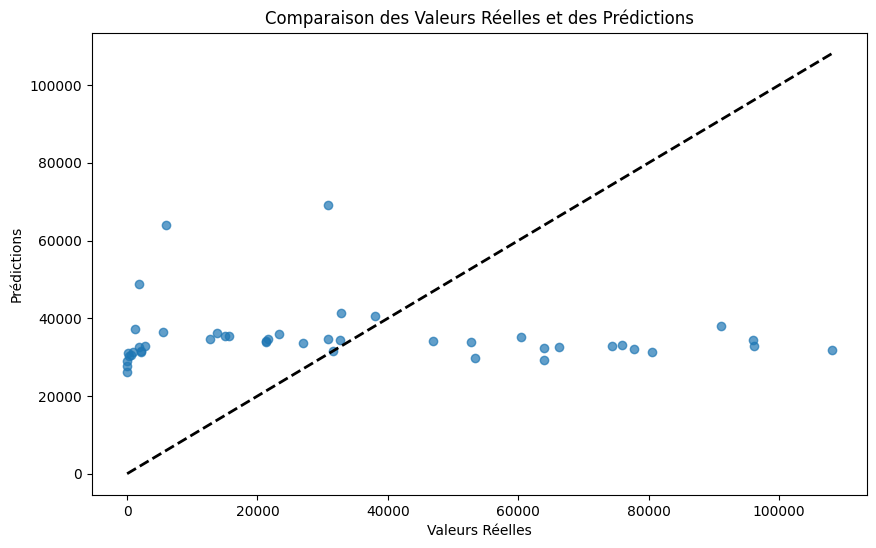

In [56]:

# résultats pas bons. Uniquement 2021 et 2022 et lr pas adapté
# The amount that the weights are updated during training is referred to as the step size or the “learning rate.”


# Tracer les prédictions vs les valeurs réelles
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

Nous décidons faire un réseau de neurones un peu plus élaboré. En effet, nous rajoutons des couches de Batch Normalisation en sortie des couches de convolution. Ces dernières maintiennent la sortie moyenne des couches précédentes à 0 et l'écart-type à 1. Cela permet d’avoir des données plus stables car appartenant à une même échelle. Par conséquent, le réseau de neurones a plus de facilité à s’entraîner.

Nous rajoutons également des couches de dropout qui permettent de limiter le surapprentissage ainsi que des couches fortement connectées, très utiles dans les problèmes de classification notamment.

In [85]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ImprovedNN(nn.Module):
    def __init__(self, input_size):
        super(ImprovedNN, self).__init__()
        
        # Couches convolutionnelles
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=32, kernel_size=1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=1)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=1)
        
        # Batch Normalization
        self.bn1 = nn.BatchNorm1d(32)
        self.bn2 = nn.BatchNorm1d(64)
        self.bn3 = nn.BatchNorm1d(128)
        
        # Couches fully connected
        #  * (input_size // 4)
        self.fc1 = nn.Linear(128, 2048)  # Réduction de la taille des couches fully connected
        self.fc2 = nn.Linear(2048, 512)
        self.fc3 = nn.Linear(512, 1)
        
        # Autres couches
        self.dropout = nn.Dropout(0.3)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(kernel_size=2, stride=2)

    def forward(self, x):
        # Ajout d'une dimension pour la convolution
        x = x.unsqueeze(2)
        
        # Convolution et max pooling
        # print(x.shape)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        # x = self.relu(self.bn1(self.conv1(x)))
        # x = self.maxpool(x)
        x = self.relu(self.bn2(self.conv2(x)))
        # x = self.maxpool(x)
        x = self.relu(self.bn3(self.conv3(x)))
        # x = self.maxpool(x)
        
        # Flatten
        x = x.view(x.size(0), -1)
        
        # Fully connected layers
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        
        return x


In [142]:
# Initialisation du modèle
input_size = X_train_tensor.shape[1]
model = ImprovedNN(input_size)

# Définir l'optimiseur et la fonction de perte
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)




In [144]:
# Entraînement du modèle
num_epochs = 1000
for epoch in range(num_epochs):
    model.train()
    
    # Forward pass
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/1000], Loss: 1326431744.0000
Epoch [20/1000], Loss: 1326400768.0000
Epoch [30/1000], Loss: 1326358912.0000
Epoch [40/1000], Loss: 1326087296.0000
Epoch [50/1000], Loss: 1326297088.0000
Epoch [60/1000], Loss: 1326114176.0000
Epoch [70/1000], Loss: 1326098944.0000
Epoch [80/1000], Loss: 1326171008.0000
Epoch [90/1000], Loss: 1326166912.0000
Epoch [100/1000], Loss: 1326152448.0000
Epoch [110/1000], Loss: 1326128768.0000
Epoch [120/1000], Loss: 1326224768.0000
Epoch [130/1000], Loss: 1326083584.0000
Epoch [140/1000], Loss: 1326151424.0000
Epoch [150/1000], Loss: 1326120576.0000
Epoch [160/1000], Loss: 1326138880.0000
Epoch [170/1000], Loss: 1326062336.0000
Epoch [180/1000], Loss: 1326272640.0000
Epoch [190/1000], Loss: 1326317440.0000
Epoch [200/1000], Loss: 1326110592.0000
Epoch [210/1000], Loss: 1326170752.0000
Epoch [220/1000], Loss: 1326209408.0000
Epoch [230/1000], Loss: 1326208640.0000
Epoch [240/1000], Loss: 1326344320.0000
Epoch [250/1000], Loss: 1326022528.0000
Epoch [26

In [145]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor, y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 1083426432.0000


In [146]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[32598.074]
 [32265.104]
 [40662.543]
 [26535.596]
 [39413.125]
 [36240.777]
 [33011.082]
 [32093.805]
 [27557.938]
 [33268.387]
 [29275.576]
 [36454.527]
 [68772.34 ]
 [32738.703]
 [27465.799]
 [31769.908]
 [31755.453]
 [26840.002]
 [31894.436]
 [34143.36 ]
 [39492.633]
 [34688.152]
 [34629.07 ]
 [36300.16 ]
 [34860.45 ]
 [31519.81 ]
 [30808.852]
 [29981.834]
 [25902.074]
 [37601.26 ]
 [31057.889]
 [43256.16 ]
 [31400.947]
 [34013.793]
 [32810.465]
 [30065.764]
 [33986.582]
 [34559.984]
 [37502.75 ]
 [42975.465]
 [35902.418]
 [28780.555]
 [32219.97 ]
 [36311.04 ]
 [55278.96 ]]
Véritables valeurs: [  1760.201815   15062.2224     32800.482      63889.1461
  46995.69631     2699.256547       0.         12691.57507
  63980.2323     80517.13923    74432.34074    15657.39595
  30771.21935        0.         31590.54875    66263.436
    932.6284438  53352.31806    21358.91888    13851.6247
  91130.39       77815.41625    52767.3112     23224.87393
  30870.60298    96216.95646   

In [147]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.numpy()

# Calcul des métriques d'erreur
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 28715.1552
Mean Squared Error (MSE): 1118123897.4627
Root Mean Squared Error (RMSE): 33438.3597
R-squared (R²): -0.0864


Les performances du modèle ne se sont améliorées que très légèrement et les prédictions restent mauvaises. Le problème se trouve donc ailleurs.

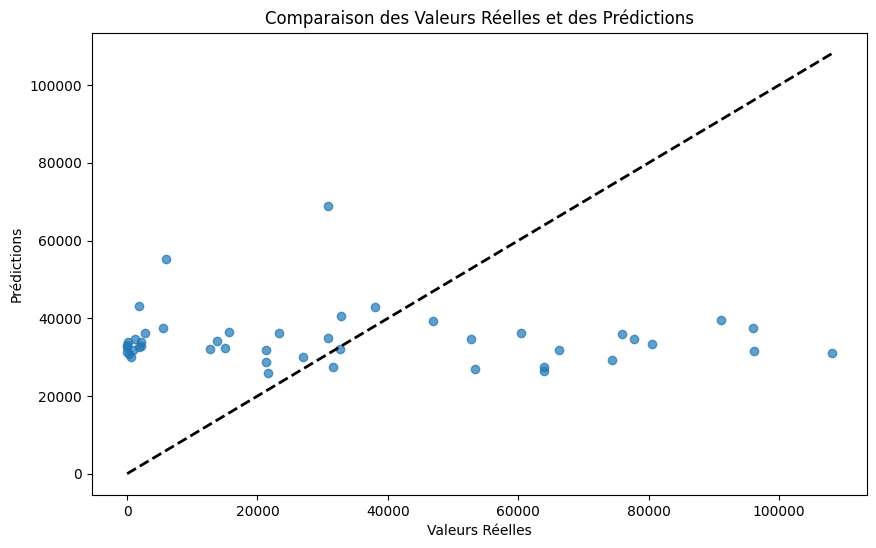

In [148]:
# Tracer les prédictions vs les valeurs réelles
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

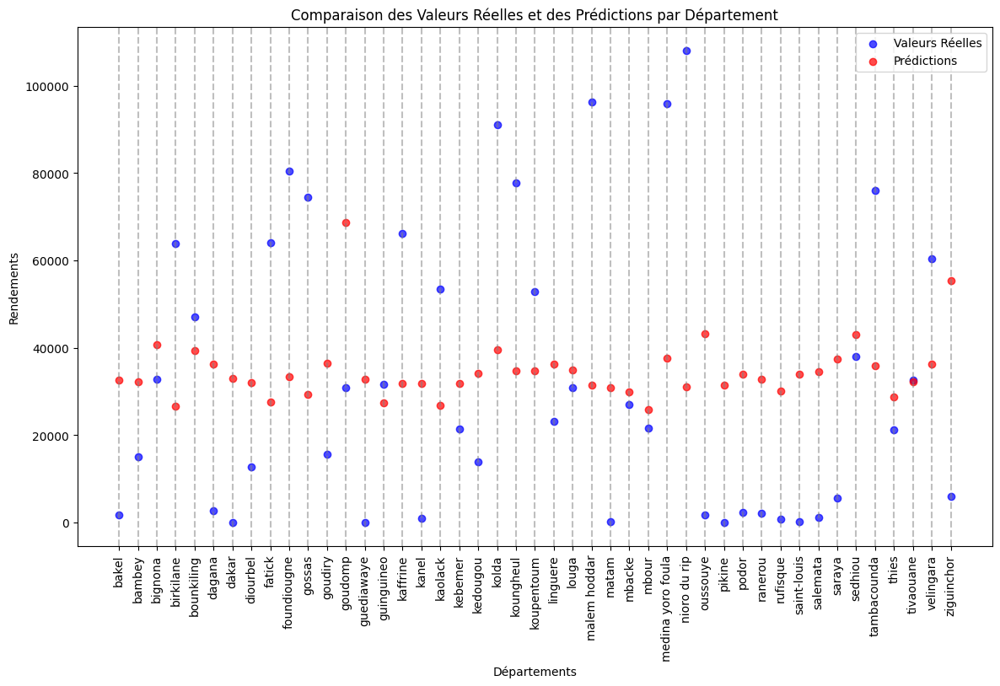

In [151]:
# pointtt : prédictions pas bonnes


import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


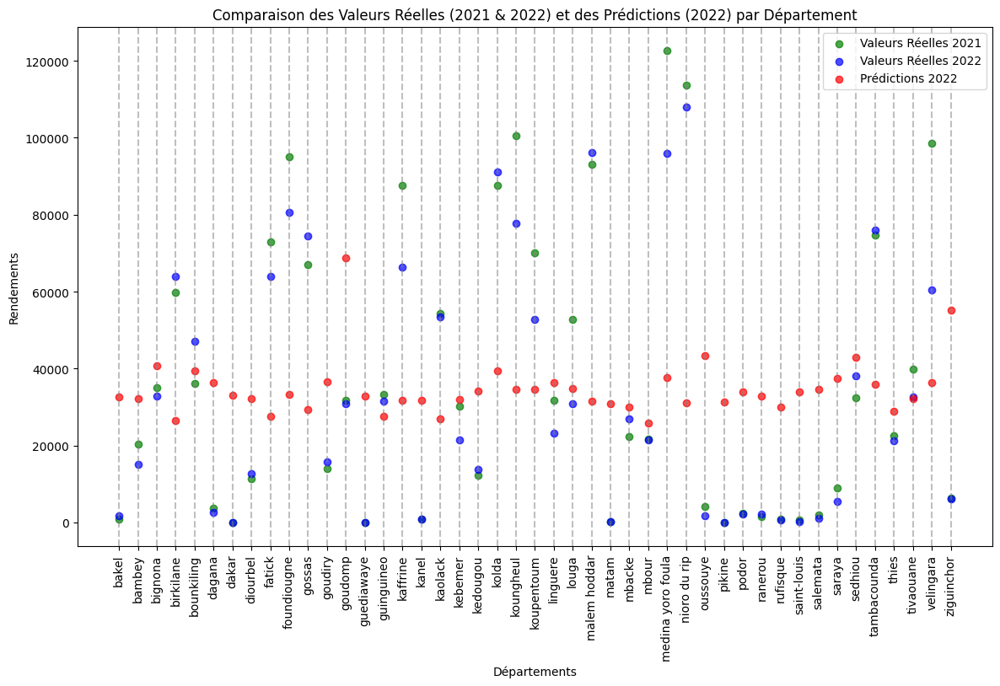

In [153]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train, color='green', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


Nous allons tenter de faire un apprentissage sans normaliser les données en entrée. Nous avions fait celà initialement afin de rendre l'apprentissage plus stable.

In [146]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

In [147]:
X_train

,Jan_ndvi,Feb_ndvi,Mar_ndvi,Apr_ndvi,May_ndvi,Jun_ndvi,Jul_ndvi,Aug_ndvi,Sept_ndvi,Oct_ndvi,...,Mar_rain,Apr_rain,May_rain,Jun_rain,Jul_rain,Aug_rain,Sept_rain,Oct_rain,Nov_rain,Dec_rain
0,0.268100,0.239797,0.218682,0.215520,0.202898,0.315088,0.474743,0.652848,0.623001,0.480244,...,0.000014,0.000045,0.208235,2.566674,3.893498,11.238800,4.248837,1.230169,0.030564,0.000892
1,0.248305,0.228972,0.217411,0.211568,0.201723,0.215428,0.290294,0.475978,0.504067,0.410814,...,0.000009,0.000000,0.000000,0.908360,1.149613,10.497971,3.638650,0.863658,0.000094,0.066452
2,0.483523,0.396199,0.333543,0.326697,0.340669,0.422455,0.477648,0.586336,0.628054,0.609955,...,0.000172,0.003802,0.019874,2.289953,6.200789,13.188679,10.219160,1.922315,0.029028,0.029404
3,0.275517,0.245068,0.228231,0.215096,0.206506,0.224838,0.352295,0.584483,0.611735,0.511212,...,0.000006,0.000000,0.000000,1.837314,3.653978,9.406191,4.870818,1.289661,0.004801,0.024869
4,0.443753,0.337556,0.289710,0.315587,0.332132,0.396171,0.634101,0.722367,0.757181,0.726716,...,0.000005,0.000000,0.024965,2.715240,5.648990,10.513983,7.231072,2.267598,0.026567,0.010117
5,0.227008,0.208674,0.206395,0.222168,0.227738,0.230209,0.218868,0.339140,0.355510,0.289440,...,0.000006,0.000017,0.000000,0.252603,0.120625,4.808416,2.224642,0.372102,0.002793,0.019077
6,0.092220,0.075234,0.066922,0.073507,0.055830,0.075033,0.092688,0.124644,0.172902,0.168072,...,0.002173,0.000000,0.003368,0.341966,0.643530,11.027603,4.117521,1.094792,0.000000,0.192759
7,0.250590,0.230029,0.215257,0.210821,0.200025,0.217022,0.294077,0.500383,0.517976,0.390323,...,0.000034,0.000000,0.000000,0.956656,1.164947,8.842652,3.664224,0.877856,0.000029,0.045205
8,0.230673,0.208083,0.201676,0.196039,0.189293,0.206184,0.249441,0.419433,0.445115,0.368123,...,0.000019,0.000000,0.000000,1.001756,1.810979,11.378980,3.953227,1.205274,0.006017,0.082908
9,0.330808,0.282500,0.255826,0.247665,0.235425,0.299759,0.373423,0.498733,0.532090,0.506230,...,0.000186,0.000000,0.000000,1.348988,2.761478,12.656536,5.769612,1.763327,0.002819,0.061052


In [148]:
X_train_tensor

tensor([[2.6810e-01, 2.3980e-01, 2.1868e-01,  ..., 1.2302e+00, 3.0564e-02,
         8.9169e-04],
        [2.4831e-01, 2.2897e-01, 2.1741e-01,  ..., 8.6366e-01, 9.3698e-05,
         6.6452e-02],
        [4.8352e-01, 3.9620e-01, 3.3354e-01,  ..., 1.9223e+00, 2.9028e-02,
         2.9404e-02],
        ...,
        [2.5318e-01, 2.3356e-01, 2.2053e-01,  ..., 8.6944e-01, 1.4055e-03,
         7.3924e-02],
        [4.3209e-01, 3.3392e-01, 2.9507e-01,  ..., 3.1377e+00, 2.5909e-02,
         1.5762e-02],
        [5.2224e-01, 4.7268e-01, 4.2085e-01,  ..., 2.5298e+00, 4.9184e-02,
         3.4994e-02]])

In [149]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train.shape[1]
print(input_size)
model = SimpleNN(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

36


In [151]:
# Entraîner le modèle
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/300], Loss: 1334167168.0000
Epoch [20/300], Loss: 1334890752.0000
Epoch [30/300], Loss: 1333744128.0000
Epoch [40/300], Loss: 1333530752.0000
Epoch [50/300], Loss: 1334700672.0000
Epoch [60/300], Loss: 1333037568.0000
Epoch [70/300], Loss: 1332366848.0000
Epoch [80/300], Loss: 1332978048.0000
Epoch [90/300], Loss: 1333749632.0000
Epoch [100/300], Loss: 1332326016.0000
Epoch [110/300], Loss: 1333506816.0000
Epoch [120/300], Loss: 1332627328.0000
Epoch [130/300], Loss: 1332128128.0000
Epoch [140/300], Loss: 1332777728.0000
Epoch [150/300], Loss: 1332183424.0000
Epoch [160/300], Loss: 1332068352.0000
Epoch [170/300], Loss: 1331424000.0000
Epoch [180/300], Loss: 1332405376.0000
Epoch [190/300], Loss: 1331664896.0000
Epoch [200/300], Loss: 1332041856.0000
Epoch [210/300], Loss: 1330242432.0000
Epoch [220/300], Loss: 1332035200.0000
Epoch [230/300], Loss: 1331961984.0000
Epoch [240/300], Loss: 1331389952.0000
Epoch [250/300], Loss: 1330605312.0000
Epoch [260/300], Loss: 1329725568.

In [152]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor, y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 1038522560.0000


In [153]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[37210.34 ]
 [38364.72 ]
 [35707.117]
 [36477.535]
 [34893.195]
 [35776.51 ]
 [33145.863]
 [38165.33 ]
 [35997.793]
 [34940.484]
 [37217.67 ]
 [36356.105]
 [34659.2  ]
 [32129.578]
 [36527.25 ]
 [37044.43 ]
 [36932.258]
 [36229.516]
 [37521.96 ]
 [35557.633]
 [35770.516]
 [36475.586]
 [37171.08 ]
 [37632.227]
 [37406.08 ]
 [36882.69 ]
 [36292.57 ]
 [37412.562]
 [37318.11 ]
 [35728.08 ]
 [36912.047]
 [36081.83 ]
 [33718.21 ]
 [36789.777]
 [36495.65 ]
 [35245.402]
 [35409.527]
 [35862.633]
 [35507.723]
 [34812.953]
 [35719.715]
 [37375.004]
 [37289.254]
 [35144.848]
 [35993.316]]
Véritables valeurs: [  1760.201815   15062.2224     32800.482      63889.1461
  46995.69631     2699.256547       0.         12691.57507
  63980.2323     80517.13923    74432.34074    15657.39595
  30771.21935        0.         31590.54875    66263.436
    932.6284438  53352.31806    21358.91888    13851.6247
  91130.39       77815.41625    52767.3112     23224.87393
  30870.60298    96216.95646   

In [154]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.numpy()

# Calcul des métriques d'erreur
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 28061.7354
Mean Squared Error (MSE): 1028720149.9206
Root Mean Squared Error (RMSE): 32073.6675
R-squared (R²): 0.0004


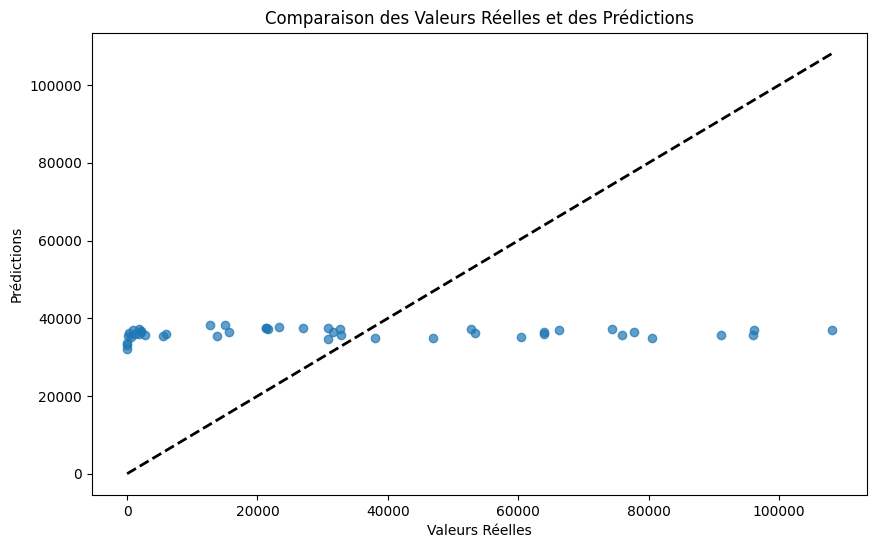

In [155]:

# Tracer les prédictions vs les valeurs réelles
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

Le R2 est légèrement plus élevé ici mais les prédictions sont médiocres. Elles tournent toutes autour de 30.000. L'apprentissage est mauvais et incomplet. Il est donc mieux de conserver la démarche initiale, à savoir normaliser les données en entrée.

Avant de pousser l'étude, nous sommes curieux de nous demander les résultats qui seraient produits par des modèles autres que des réseaux de neurones. Il s'agit par exemple des forêts aléatoires, des gradient boosting method, etc.

In [155]:
# Random Forest

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Créer et entraîner le modèle
rf = RandomForestRegressor(n_estimators=10000, criterion='squared_error', random_state=42)
rf.fit(X_train, y_train)

# Prédictions
y_pred = rf.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')

# criterion
# squarred_error, 10.000 estimators, r2=0.24
# absolute_error, 10.000 estimators, r2=0.24
# friedman_mse, 10.000 estimators, r2=0.23
# squarred_error, 10.000 estimators, r2=0.24
# poisson, 10.000 estimators, r2=0.21

# okay donc je vais laisser le criterion par défaut, squarred_error

# je mets 1.000.000 d'estimators
# c'est extremement long, je m'y attendais
# j'ai laissé tomber du coup

# j'ai fait pour 50.000, ça fait 0.23 donc pas bon

RMSE: 28051.68, R2 Score: 0.24


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


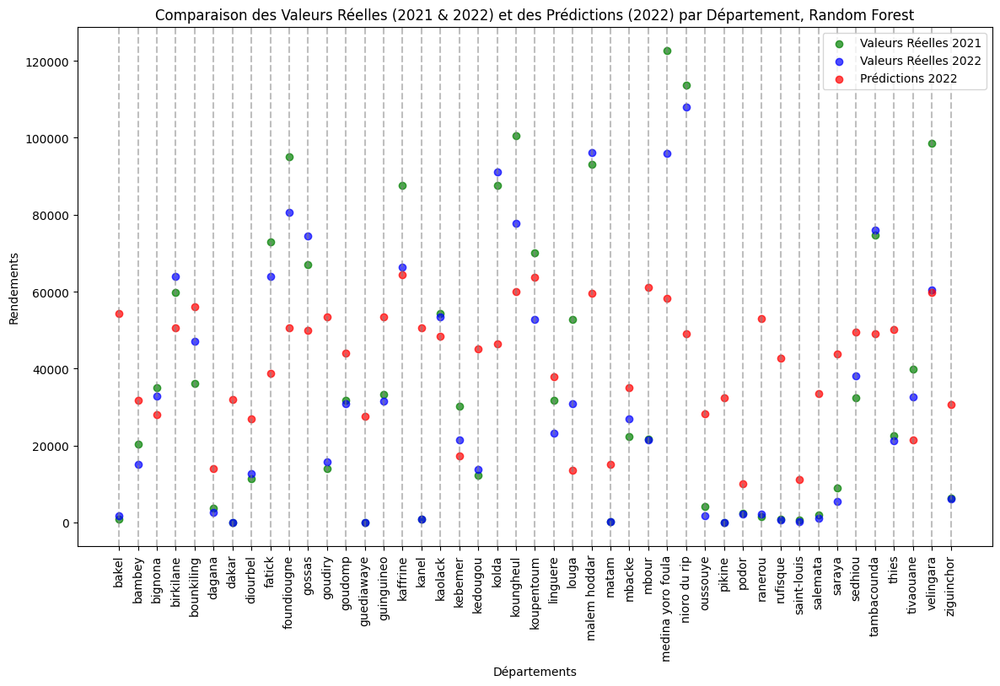

In [156]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train, color='green', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département, Random Forest")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


In [94]:
# Gradient Boosting Regressor

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor

# Créer et entraîner le modèle
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.005, random_state=42)
gb.fit(X_train, y_train)

# Prédictions
y_pred = gb.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')


RMSE: 30756.23, R2 Score: 0.08


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [100]:
pip install xgboost


[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: C:\Users\ADIE\myenv\Scripts\python.exe -m pip install --upgrade pip



  Using cached xgboost-2.1.1-py3-none-win_amd64.whl (124.9 MB)


In [101]:
# XG Boost

import xgboost as xgb

# Créer et entraîner le modèle
xgbr = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgbr.fit(X_train, y_train)

# Prédictions
y_pred = xgbr.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')

# Très mauvais

RMSE: 37334.08, R2 Score: -0.35


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [102]:
pip install lightgbm

     ---------------------------------------- 1.4/1.4 MB 965.7 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: C:\Users\ADIE\myenv\Scripts\python.exe -m pip install --upgrade pip


In [107]:
# LightGBM
# mais bon bi je suis quasiment sûr que c pas pertinent
# Il me semble que ça bosse sur des données volumineuses

import lightgbm as lgb

# Créer et entraîner le modèle
lgbm = lgb.LGBMRegressor(n_estimators=10000, learning_rate=0.001, random_state=42)
lgbm.fit(X_train, y_train)

# Prédictions
y_pred = lgbm.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')

# très mauvais

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 559
[LightGBM] [Info] Number of data points in the train set: 45, number of used features: 36
[LightGBM] [Info] Start training from score 37284.523364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [108]:
pip install catboost


[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: C:\Users\ADIE\myenv\Scripts\python.exe -m pip install --upgrade pip



     ------------------------------------- 101.1/101.1 MB 91.5 kB/s eta 0:00:00
     -------------------------------------- 47.1/47.1 kB 472.9 kB/s eta 0:00:00


In [95]:
from catboost import CatBoostRegressor

# Créer et entraîner le modèle
catboost = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost.fit(X_train, y_train)

# Prédictions
y_pred = catboost.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')

# le r2 score est positif, c'est déjà bien lol
# guilleu nanei il est négatif

RMSE: 29530.54, R2 Score: 0.15


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [115]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso

# Régression Linéaire
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)

print(f'Linear Regression - RMSE: {rmse_lr:.2f}, R2 Score: {r2_lr:.2f}')

# R2 score négatif

Linear Regression - RMSE: 113563.39, R2 Score: -11.53


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [116]:
# Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
y_pred_ridge = ridge.predict(X_test)
rmse_ridge = mean_squared_error(y_test, y_pred_ridge, squared=False)
r2_ridge = r2_score(y_test, y_pred_ridge)

print(f'Ridge Regression - RMSE: {rmse_ridge:.2f}, R2 Score: {r2_ridge:.2f}')

# r2 score négatif encore

Ridge Regression - RMSE: 37116.90, R2 Score: -0.34


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [117]:
# Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)
rmse_lasso = mean_squared_error(y_test, y_pred_lasso, squared=False)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f'Lasso Regression - RMSE: {rmse_lasso:.2f}, R2 Score: {r2_lasso:.2f}')

# r2 score négatif encore une fois

Lasso Regression - RMSE: 81854.75, R2 Score: -5.51


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.628e+09, tolerance: 5.966e+06
  model = cd_fast.enet_coordinate_descent(
C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [126]:
# Support Vector Regression

from sklearn.svm import SVR

# Créer et entraîner le modèle
svr = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr.fit(X_train, y_train)

# Prédictions
y_pred = svr.predict(X_test)

# Évaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}, R2 Score: {r2:.2f}')

# r2 score à -0.01 qqsoient les modifications que je fais

RMSE: 32239.32, R2 Score: -0.01


C:\Users\ADIE\myenv\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Pour l'instant, celui qui fait mieux, c'est RandomForest. Mais son score est limité (0.24). Nous voyons donc que globalement, les résultats produits par ces modèles ne sont pas bons.

Rappelons que jusqu'à présent, nous utilisions comme seule année d'entraînement l'année 2021. Maintenant,nous allons essayer d'entraîner le modèle sur 2020 et 2021 pour voir si les résultats sont plus intéressants.

In [46]:
# Renommer les colonnes pour 2020, 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2020 = all_data.filter(regex='2020')
features_2020 = rename_features(features_2020, '2020')

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')

In [47]:


# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

In [48]:
# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


In [49]:
# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

In [50]:
# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

In [51]:
X_train_scaled.shape

(45, 72)

In [52]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, 36, 45)


In [53]:
X_train_scaled.shape

(2, 36, 45)

In [54]:
X_test_scaled.shape

(1, 36, 45)

In [105]:
# Autre modèle de réseau de neurones

class SimpleNN3(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=45, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(45)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x

In [106]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)

36


In [107]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


In [108]:
print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [109]:
# Entraîner le modèle
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/400], Loss: 334236384.0000
Epoch [20/400], Loss: 172236256.0000
Epoch [30/400], Loss: 80265584.0000
Epoch [40/400], Loss: 50962500.0000
Epoch [50/400], Loss: 43263376.0000
Epoch [60/400], Loss: 39055480.0000
Epoch [70/400], Loss: 35995676.0000
Epoch [80/400], Loss: 35089532.0000
Epoch [90/400], Loss: 33379676.0000
Epoch [100/400], Loss: 31858498.0000
Epoch [110/400], Loss: 27892204.0000
Epoch [120/400], Loss: 18958158.0000
Epoch [130/400], Loss: 5823107.5000
Epoch [140/400], Loss: 24729106.0000
Epoch [150/400], Loss: 10712825.0000
Epoch [160/400], Loss: 2820061.2500
Epoch [170/400], Loss: 458215.2500
Epoch [180/400], Loss: 58950.5234
Epoch [190/400], Loss: 43487.1328
Epoch [200/400], Loss: 35151.7852
Epoch [210/400], Loss: 25810.6914
Epoch [220/400], Loss: 2444.4167
Epoch [230/400], Loss: 2883.7310
Epoch [240/400], Loss: 856.3136
Epoch [250/400], Loss: 156.6480
Epoch [260/400], Loss: 31.6612
Epoch [270/400], Loss: 23.7589
Epoch [280/400], Loss: 20.3174
Epoch [290/400], Loss: 

In [110]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

torch.Size([45])
torch.Size([45])
Test Loss: 184654032.0000


In [111]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[[2.3080303e+03]
  [2.2268986e+04]
  [3.5149902e+04]
  [8.1165422e+04]
  [2.6801305e+04]
  [5.0885151e+03]
  [2.3685303e+02]
  [2.0107020e+04]
  [6.2215293e+04]
  [8.1827133e+04]
  [8.4963375e+04]
  [1.5568703e+04]
  [2.2030691e+04]
  [2.2362045e+02]
  [5.1253828e+04]
  [9.4716938e+04]
  [7.5647180e+02]
  [6.8911781e+04]
  [3.9537926e+04]
  [8.1632246e+03]
  [7.3802805e+04]
  [1.0453601e+05]
  [5.6397129e+04]
  [4.2479938e+04]
  [4.6563000e+04]
  [1.0159624e+05]
  [4.2341071e+02]
  [3.5182863e+04]
  [3.4469836e+04]
  [1.3686259e+05]
  [1.2281215e+05]
  [2.1694204e+03]
  [4.2531990e+01]
  [2.9649104e+03]
  [1.6271228e+03]
  [6.8065076e+02]
  [9.0159186e+02]
  [1.8905719e+03]
  [6.0392031e+03]
  [1.9279633e+04]
  [6.1169047e+04]
  [2.6897193e+04]
  [4.6979480e+04]
  [9.0125266e+04]
  [6.0249038e+03]]]
Véritables valeurs: [  1760.201815   15062.2224     32800.482      63889.1461
  46995.69631     2699.256547       0.         12691.57507
  63980.2323     80517.13923    74432.

In [112]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

# Calcul des métriques d'erreur
# print(y_test.shape)
# print(y_pred.shape)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# le loss est quasi nul sur mon apprentissage. Mais faut faire attention car ça peut fausser le résultat final si je fais du surapprentissage
# le R2 est de 0.81 avec 200 epochs
# le R2 est de 0.83 avec 300 epochs
# le R2 est de 0.83 avec 400 epochs, il a diminué: signe de surapprentissage

Mean Absolute Error (MAE): 9333.8725
Mean Squared Error (MSE): 184654024.3971
Root Mean Squared Error (RMSE): 13588.7462
R-squared (R²): 0.8206


Nous voyons que nous avons ici le premier modèle qui produit des résultats intéressants. Ce qui change ici, c'est le taux d'apprentissage (learning rate). Nous nous sommes rendus dompte de l'importante influence qu'il a sur les performances du modèle. En fonction du fait qu'il soit trop ou pas assez élevé, le modèle a plus ou moins de difficultés à apprendre des données d'entrée. Dans ce cas précis, nous avons donc augmenté le taux d'apprentissage en conservant la normalisation des données d'entrée.

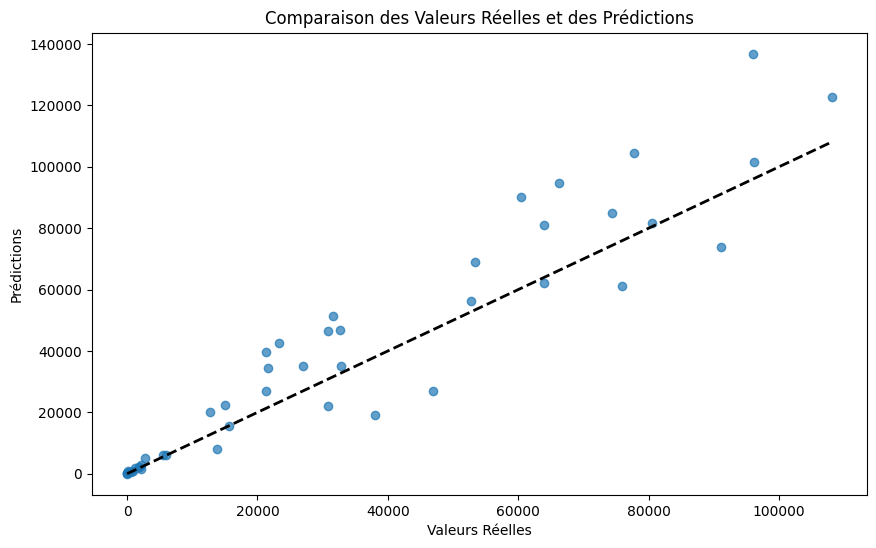

In [113]:
# pointtt : premiers bons résultats
# lr mis à jour et inputs scalés


import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

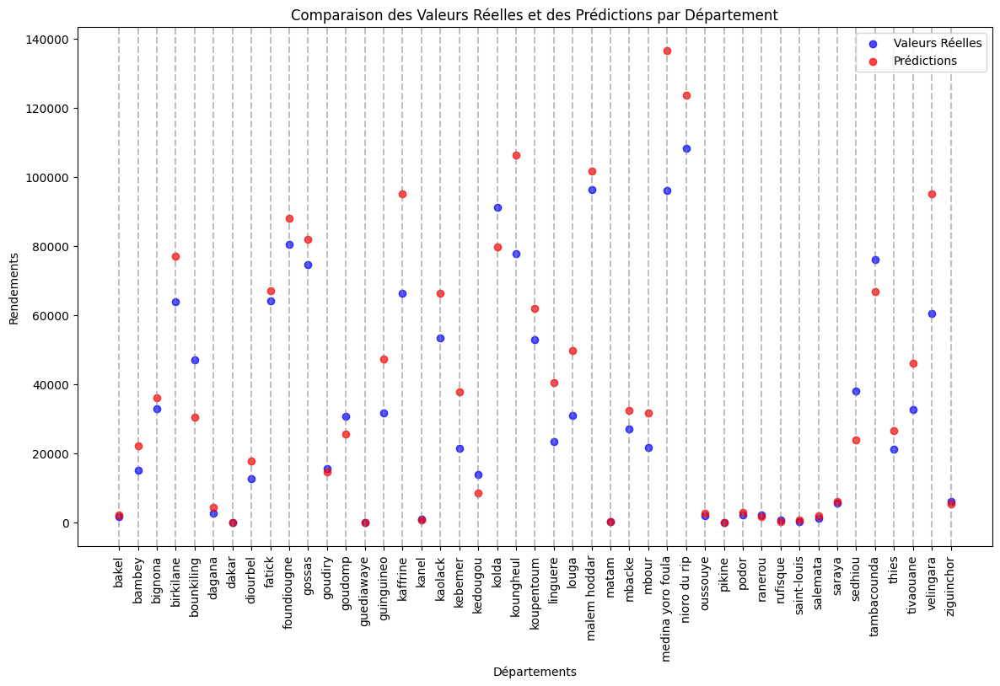

In [400]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

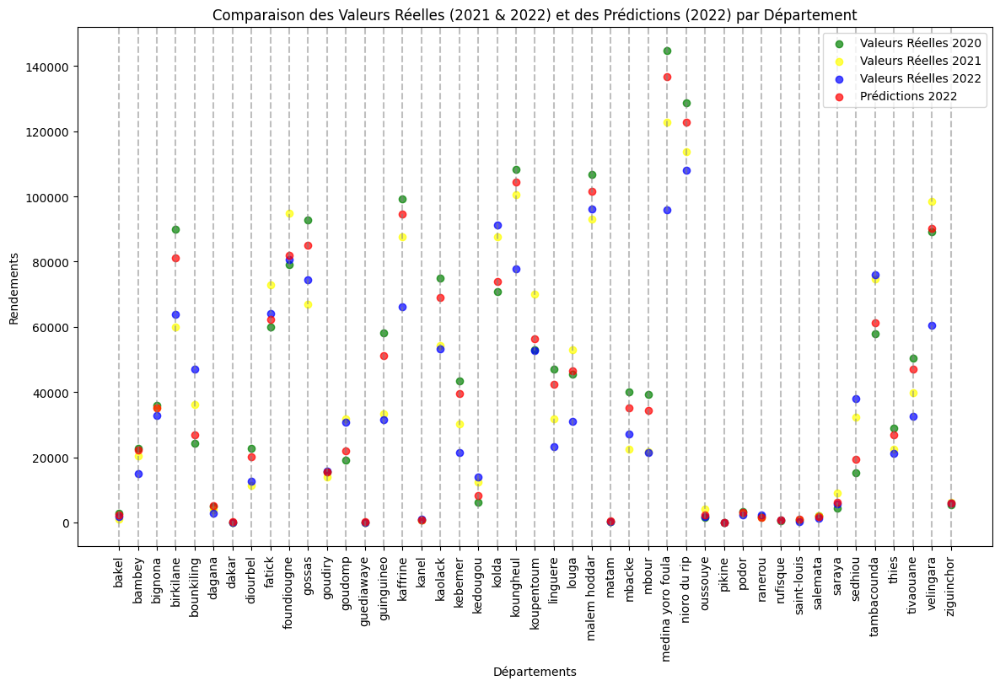

In [114]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

# pointtt : prédictions au milieu quasi à chaque fois

Nous reproduisosns le même modèle sans normalisation au préalable.

In [55]:
# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

In [56]:
print(X_train.shape)

(45, 72)


In [57]:
print(X_test.shape)

(45, 36)


In [58]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
print(X_train_tensor.shape)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 2)
# print(y_train.values.shape)
print(y_train_tensor.shape)

X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
print(X_test_tensor.shape)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)
print(y_test_tensor.shape)

torch.Size([45, 72])
torch.Size([45, 2])
torch.Size([45, 36])
torch.Size([45, 1])


In [59]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_tensor = X_train_tensor.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_tensor = X_test_tensor.reshape(1, 36, 45)

In [60]:
X_train_tensor.shape

torch.Size([2, 36, 45])

In [61]:
X_test_tensor.shape

torch.Size([1, 36, 45])

In [528]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_tensor.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)

36


In [529]:
# Entraîner le modèle
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/300], Loss: 3627234048.0000
Epoch [20/300], Loss: 588588800.0000
Epoch [30/300], Loss: 2607104512.0000
Epoch [40/300], Loss: 369014880.0000
Epoch [50/300], Loss: 108538616.0000
Epoch [60/300], Loss: 69544080.0000
Epoch [70/300], Loss: 46175372.0000
Epoch [80/300], Loss: 39152172.0000
Epoch [90/300], Loss: 34274196.0000
Epoch [100/300], Loss: 30010144.0000
Epoch [110/300], Loss: 25535110.0000
Epoch [120/300], Loss: 21921700.0000
Epoch [130/300], Loss: 20137690.0000
Epoch [140/300], Loss: 17870416.0000
Epoch [150/300], Loss: 15485514.0000
Epoch [160/300], Loss: 14556470.0000
Epoch [170/300], Loss: 13881569.0000
Epoch [180/300], Loss: 13370564.0000
Epoch [190/300], Loss: 12980466.0000
Epoch [200/300], Loss: 12663252.0000
Epoch [210/300], Loss: 12569617.0000
Epoch [220/300], Loss: 12234981.0000
Epoch [230/300], Loss: 11917254.0000
Epoch [240/300], Loss: 11721445.0000
Epoch [250/300], Loss: 11413873.0000
Epoch [260/300], Loss: 11364752.0000
Epoch [270/300], Loss: 11061938.0000
Epo

In [530]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor.squeeze())
    print(f'Test Loss: {test_loss.item():.4f}')

torch.Size([1, 45, 1])
torch.Size([45, 1])
Test Loss: 181060080.0000


In [531]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

# Calcul des métriques d'erreur
# print(y_test.shape)
# print(y_pred.shape)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

Mean Absolute Error (MAE): 9291.6552
Mean Squared Error (MSE): 181060066.5678
Root Mean Squared Error (RMSE): 13455.8562
R-squared (R²): 0.8241


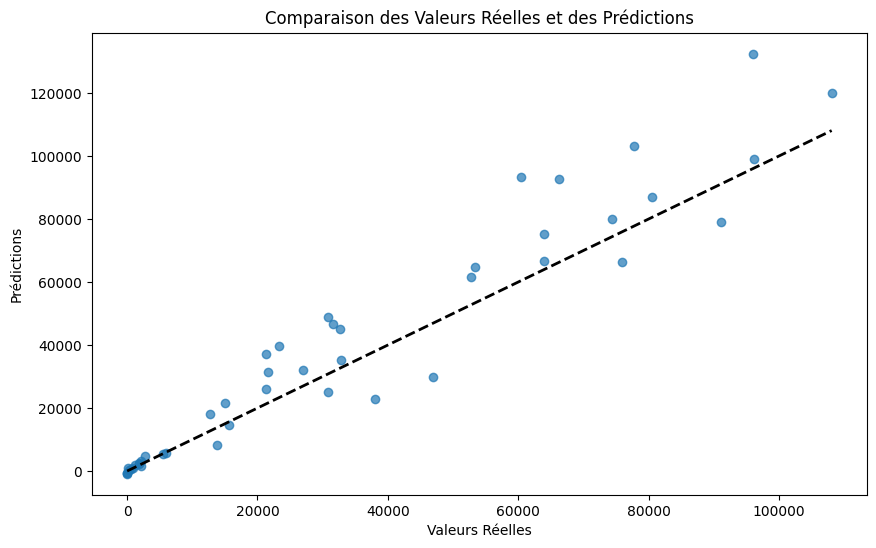

In [438]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

Les résultats sont assez similaires. Là encore, l'ajustement semble meilleur en normalisant les données d'entrée.

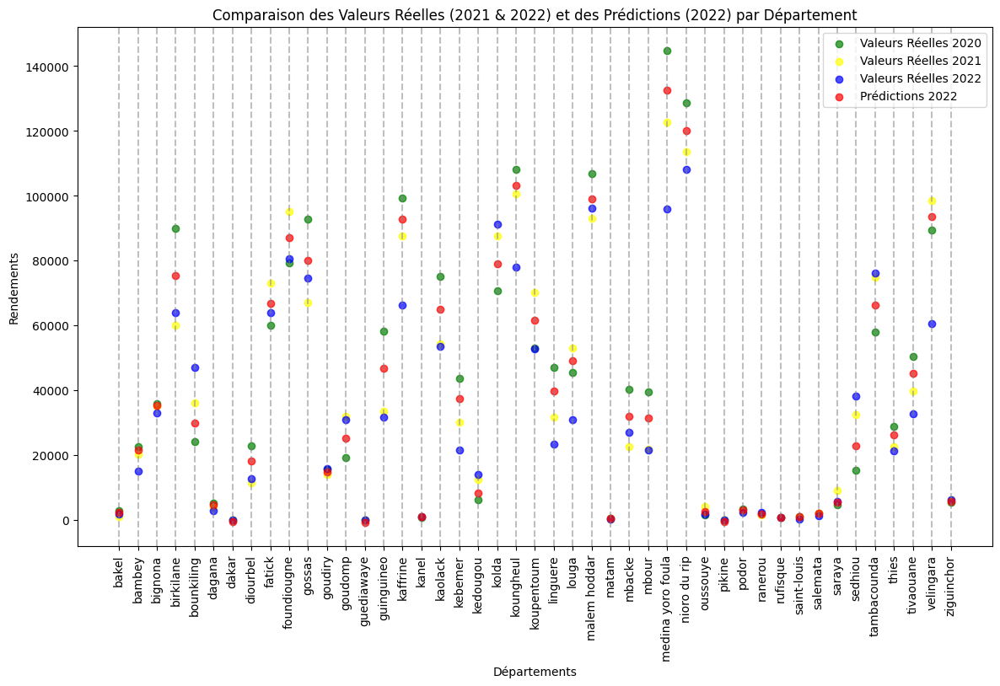

In [439]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

En analysant les résultats de plus près, on se rend compte que le modèle a tendance à prédire les productions pour 2022 de sorte à ce qu'elles soient quasi systématiquement comprises entre 2020 et 2021, comme une sorte de moyenne. Pour remédier à celà, nous allons tenter 2 approches.

La première consiste à mettre des couches fully_connected (fortement connectées) en fin de réseau afin d'améliorer l'apprentissage.

In [62]:
# premier modèle avec des couches fully connected pour capter les temporalités
# on verra ce qu'on peut explorer par la suite

import torch
import torch.nn as nn

class SimpleNN3_fc(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 45)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x


In [63]:


# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']



In [64]:
# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

X_train_scaled.shape

(45, 72)

In [65]:


# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, 36, 45)


print(X_train_scaled.shape)

print(X_test_scaled.shape)

(2, 36, 45)
(1, 36, 45)


In [66]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
print(X_train_tensor.shape)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 2)
# print(y_train.values.shape)
print(y_train_tensor.shape)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
print(X_test_tensor.shape)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)
print(y_test_tensor.shape)

torch.Size([2, 36, 45])
torch.Size([45, 2])
torch.Size([1, 36, 45])
torch.Size([45, 1])


In [67]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_tensor.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1.5)

36


In [68]:
# Entraîner le modèle
num_epochs = 250
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    # print(outputs.shape)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/250], Loss: 230406944.0000
Epoch [20/250], Loss: 108763592.0000
Epoch [30/250], Loss: 55487648.0000
Epoch [40/250], Loss: 37005300.0000
Epoch [50/250], Loss: 27784104.0000
Epoch [60/250], Loss: 6498552.0000
Epoch [70/250], Loss: 1891224.0000
Epoch [80/250], Loss: 605843.9375
Epoch [90/250], Loss: 300616.2812
Epoch [100/250], Loss: 71251.2422
Epoch [110/250], Loss: 27660.9473
Epoch [120/250], Loss: 12024.6309
Epoch [130/250], Loss: 4608.8999
Epoch [140/250], Loss: 1630.2625
Epoch [150/250], Loss: 479.4746
Epoch [160/250], Loss: 197.1263
Epoch [170/250], Loss: 50.0142
Epoch [180/250], Loss: 22.1707
Epoch [190/250], Loss: 8.4499
Epoch [200/250], Loss: 3.7867
Epoch [210/250], Loss: 8.1613
Epoch [220/250], Loss: 1301.2974
Epoch [230/250], Loss: 3311405.2500
Epoch [240/250], Loss: 4108510.2500
Epoch [250/250], Loss: 94607.0703


In [69]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor.squeeze())
    print(f'Test Loss: {test_loss.item():.4f}')

torch.Size([1, 45])
torch.Size([45, 1])
Test Loss: 75334368.0000


In [70]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()


In [71]:
# Calcul des métriques d'erreur
# print(y_test.shape)
# print(y_pred.shape)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# surapprentissage entre 400 et 500 epochs
# waw mais avec un learning rate de 1 et 300 epochs jai 0.886 de r2

Mean Absolute Error (MAE): 5387.0809
Mean Squared Error (MSE): 75334369.2946
Root Mean Squared Error (RMSE): 8679.5374
R-squared (R²): 0.9268


Nous voyons que les performances du modèle se sont nettement améliorées. De plus, les prédictions sont mieux ajustées aux valeurs réelles pour 2022.

In [ ]:
# c'est beaucoup mieux
# 300 epochs, lr de 0.1, r2 de 0.876
# 300 epochs, lr de 1.0, r2 de 0.886
# 300 epochs, lr de 1.2, r2 de 0.887
# 300 epochs, lr de 1.5, r2 de 0.931
# 300 epochs, lr de 1.7, r2 de 0.891
# encore une fois à peu près, ça change d'une exécution à une autre. Le modèle est pas stable

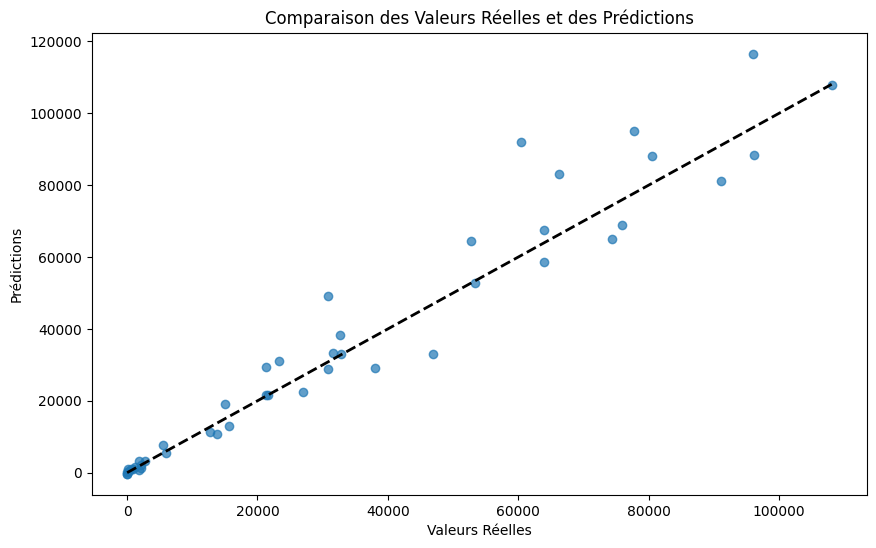

In [72]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()


# pointtt : ajustement bon

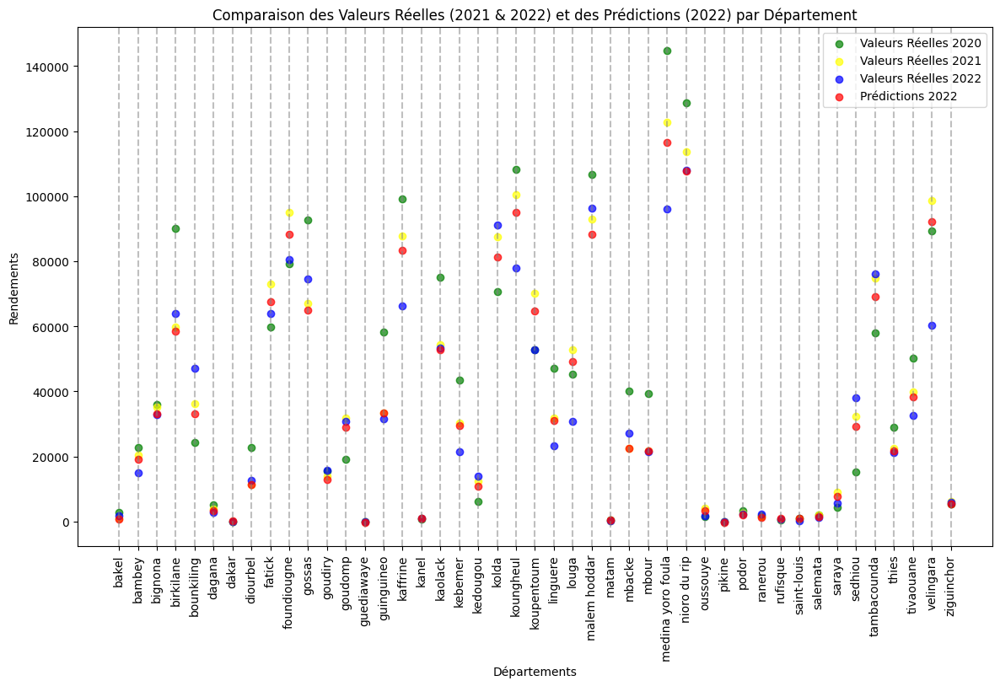

In [73]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


# pointtt : on n'est plus au milieu à chaque fois. On se rapproche de 2021. Juste ajouter des fully connected

Normalité des résidus

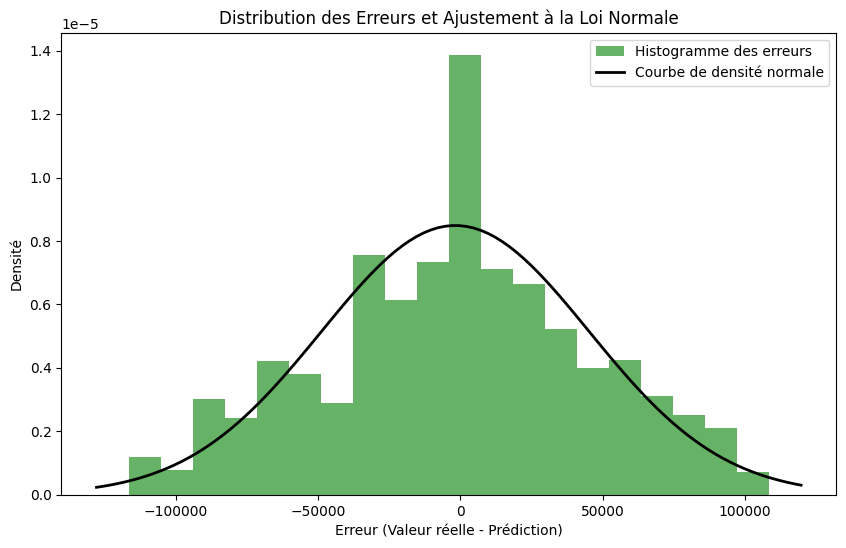

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Calcul des erreurs (résidus)
erreurs = (y_test_tensor.numpy() - y_pred).flatten()

# Tracer l'histogramme des erreurs
plt.figure(figsize=(10, 6))
plt.hist(erreurs, bins=20, density=True, alpha=0.6, color='g', label='Histogramme des erreurs')

# Ajuster une distribution normale aux erreurs
mu, std = norm.fit(erreurs)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Courbe de densité normale')

plt.xlabel('Erreur (Valeur réelle - Prédiction)')
plt.ylabel('Densité')
plt.title('Distribution des Erreurs et Ajustement à la Loi Normale')
plt.legend()
plt.show()


La répartition des erreurs semble être proche de celle d'une loi normale. Nous allons donc faire cette hypothèse. Celà va nous permettre de simplifier le calcul des intervalles de confiance.

Indépendance des erreurs

In [84]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.stattools import durbin_watson
from statsmodels.graphics.tsaplots import plot_acf

# Calculer les erreurs résiduelles
erreurs = y_test - y_pred

# Vérification de l'indépendance des erreurs (Test de Durbin-Watson)
dw_statistic = durbin_watson(erreurs)
print(f'Statistique de Durbin-Watson: {dw_statistic:.2f}')

Statistique de Durbin-Watson: 1.77


La statistique du test est proche de 2. Les erreurs peuvent alors être considérées indépendantes.

L'hypothèse d'homoscédasticité des erreurs, dans notre cas d'étude de réseau de neurones, n'est pas critique comme elle pourrait l'être pour les modèles linéaires classiques.

Nous allons donc construire des intervalles de confiance autour de ces prédictions. La méthode de calcul consiste à réaliser plusieurs prédictions, un nombre n_iter que l'on fixe à 100 par exemple. Ensuite, nous calculons la moyenne et l'écart-type de notre échantillon puis nous en tirons les bornes innférieure et supérieure de nos intervalles de confiance pour chacun des départements.

In [ ]:
# Fonction pour calculer l'intervalle de confiance
def predict_with_uncertainty(model, X, n_iter=100):
    # model.eval()  # Mode évaluation
    predictions = []
    for _ in range(n_iter):
        model = SimpleNN3_fc(input_size)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=1.5)
        num_epochs = 250
        for epoch in range(num_epochs):
            model.train()
            optimizer.zero_grad()
            outputs = model(X_train_tensor)
            outputs = outputs.squeeze()
            loss = criterion(outputs.T, y_train_tensor)
            loss.backward()
            optimizer.step()
            output = model(X)
            predictions.append(output.cpu().numpy())

        # Prédictions sur les données de test
        model.eval()
        with torch.no_grad():
            output = model(X)
            predictions.append(output.cpu().numpy())
    
    predictions = np.array(predictions)
    mean_pred = predictions.mean(axis=0)  # Moyenne des prédictions
    std_pred = predictions.std(axis=0)    # Écart-type des prédictions
    return mean_pred, std_pred

# Exemple d'utilisation :
X_test_tensor = torch.tensor(X_test_scaled).float()  # Assurez-vous que X_test est au bon format
mean_pred, std_pred = predict_with_uncertainty(model, X_test_tensor)

# Calculer les intervalles de confiance (IC à 95 %)
lower_bound = mean_pred - 1.96 * std_pred
upper_bound = mean_pred + 1.96 * std_pred

La deuxième solution consiste à mettre en place une fonction de perte "customisée" qui pénalisera plus les écarts aux données récentes, et donc de facto, les prédictions seront plus proches des données plus récentes, donc celles de 2021.

In [86]:
import torch
import torch.nn as nn

class WeightedMSELoss(nn.Module):
    def __init__(self, weights):
        super(WeightedMSELoss, self).__init__()
        self.weights = weights

    def forward(self, outputs, targets):
        # Calculer l'erreur quadratique moyenne (MSE)
        loss = (outputs - targets) ** 2

        # Appliquer les poids
        weighted_loss = self.weights * loss

        # Retourner la perte moyenne pondérée
        return weighted_loss.mean()

# Exemple d'utilisation:
# Supposons que nous voulons donner 70% d'importance aux données de 2021 et 30% aux données de 2020
weights = torch.tensor([0.3, 0.7])

# Créer une instance de la perte pondérée
criterion = WeightedMSELoss(weights)


In [126]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_tensor.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
# criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1.5)

36


In [127]:
# Supposons que vous avez déjà préparé X_train_tensor et y_train_tensor
# et défini votre modèle et votre optimiseur

num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()

    outputs = model(X_train_tensor)
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()

    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/300], Loss: 48384840.0000
Epoch [20/300], Loss: 31506532.0000
Epoch [30/300], Loss: 19319032.0000
Epoch [40/300], Loss: 17028114.0000
Epoch [50/300], Loss: 16173527.0000
Epoch [60/300], Loss: 15602510.0000
Epoch [70/300], Loss: 15427263.0000
Epoch [80/300], Loss: 15360145.0000
Epoch [90/300], Loss: 15349699.0000
Epoch [100/300], Loss: 15330990.0000
Epoch [110/300], Loss: 15319043.0000
Epoch [120/300], Loss: 15306678.0000
Epoch [130/300], Loss: 15386148.0000
Epoch [140/300], Loss: 15408320.0000
Epoch [150/300], Loss: 15534022.0000
Epoch [160/300], Loss: 15227675.0000
Epoch [170/300], Loss: 14460669.0000
Epoch [180/300], Loss: 11940995.0000
Epoch [190/300], Loss: 10125749.0000
Epoch [200/300], Loss: 4371685.5000
Epoch [210/300], Loss: 255632.5312
Epoch [220/300], Loss: 404444.1875
Epoch [230/300], Loss: 34285.4844
Epoch [240/300], Loss: 59472.4961
Epoch [250/300], Loss: 19077.6992
Epoch [260/300], Loss: 8504.2021
Epoch [270/300], Loss: 1606.7947
Epoch [280/300], Loss: 1049.5341

In [128]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.T, y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

torch.Size([1, 45])
torch.Size([45, 1])
Test Loss: 39105640.0000


In [129]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()


In [130]:
# Calcul des métriques d'erreur
# print(y_test.shape)
# print(y_pred.shape)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# presque 0.94, c'est excellent là !

Mean Absolute Error (MAE): 5420.1836
Mean Squared Error (MSE): 78211271.5727
Root Mean Squared Error (RMSE): 8843.7137
R-squared (R²): 0.9240


Il s'agit là du meilleur ajustement à nos données que nous ayons eu pour l'instant. Il faut toutefois nuancer ce résultat en rappelant que nous ne disposons que de 2 années d'entraînement et une année de test. Ce type de modèle ne peut réaliser des prédictions qu'à très court terme. L'apprentissage ne s'est pas fait de manière assez profonde pour que l'on puisse espérer avoir des prédictions excellentes pour 2023 par exemple.

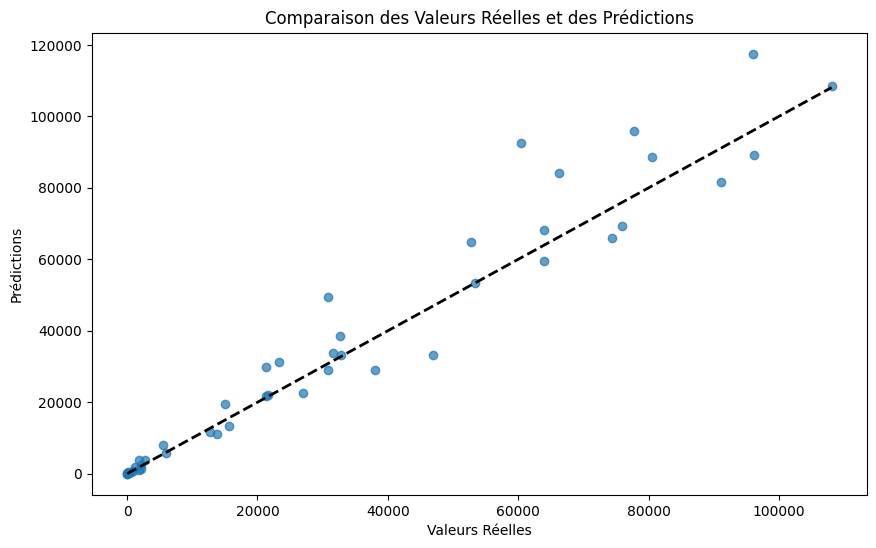

In [131]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

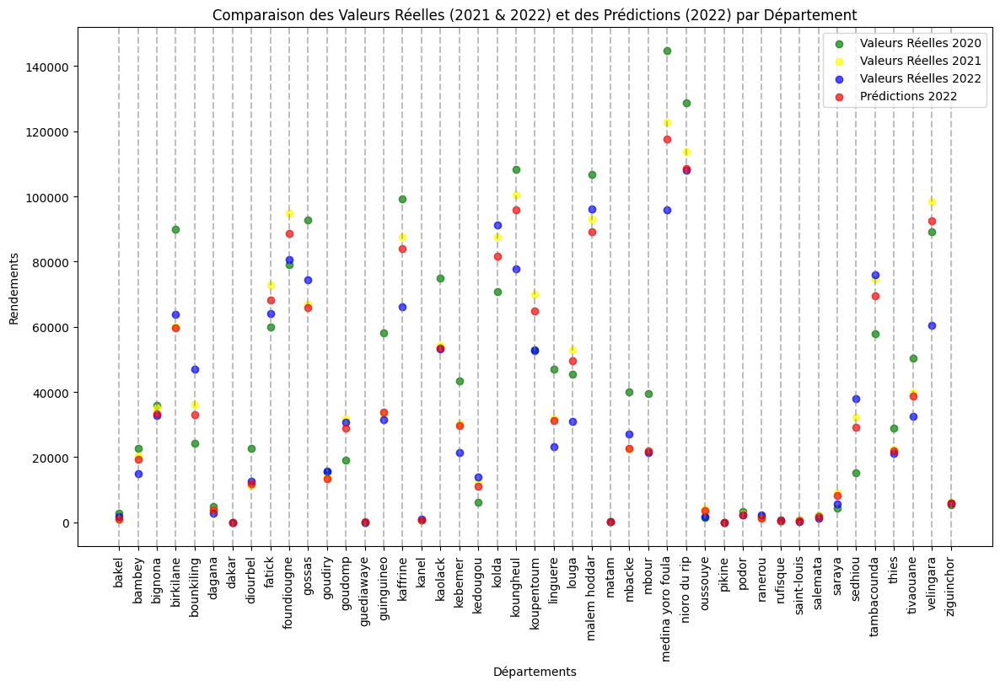

In [132]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()


# pointtt : ici on a carrément modifié la fonction de point pour "pénaliser" 2020. Résultats très bons mais attention, on est que sur 3 ans ...

Normalité des résidus

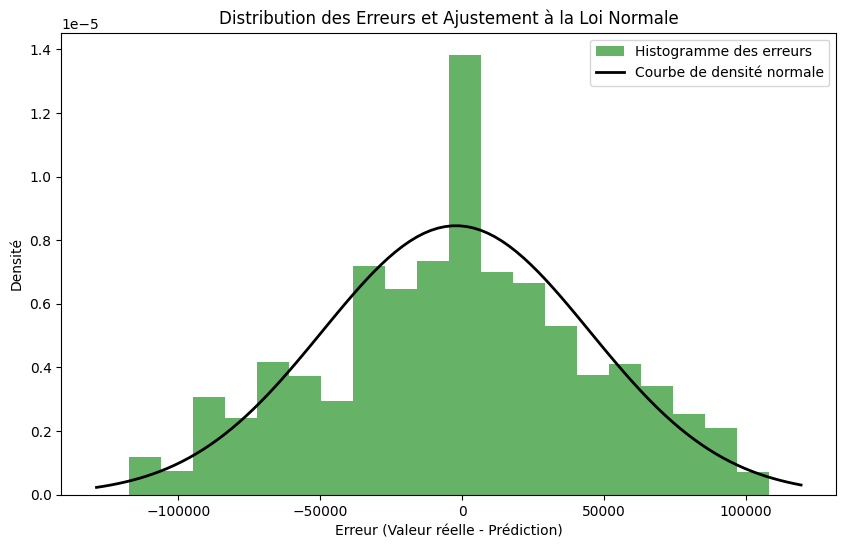

In [133]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Calcul des erreurs (résidus)
erreurs = (y_test_tensor.numpy() - y_pred).flatten()

# Tracer l'histogramme des erreurs
plt.figure(figsize=(10, 6))
plt.hist(erreurs, bins=20, density=True, alpha=0.6, color='g', label='Histogramme des erreurs')

# Ajuster une distribution normale aux erreurs
mu, std = norm.fit(erreurs)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Courbe de densité normale')

plt.xlabel('Erreur (Valeur réelle - Prédiction)')
plt.ylabel('Densité')
plt.title('Distribution des Erreurs et Ajustement à la Loi Normale')
plt.legend()
plt.show()


La répartition des erreurs semble être proche de celle d'une loi normale. Nous allons donc faire cette hypothèse. Celà va nous permettre de simplifier le calcul des intervalles de confiance.

Indépendance des erreurs

In [134]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.stattools import durbin_watson
from statsmodels.graphics.tsaplots import plot_acf

# Calculer les erreurs résiduelles
erreurs = y_test - y_pred

# Vérification de l'indépendance des erreurs (Test de Durbin-Watson)
dw_statistic = durbin_watson(erreurs)
print(f'Statistique de Durbin-Watson: {dw_statistic:.2f}')

Statistique de Durbin-Watson: 1.72


La statistique du test est proche de 2. Les erreurs peuvent alors être considérées indépendantes.

L'hypothèse d'homoscédasticité des erreurs, dans notre cas d'étude de réseau de neurones, n'est pas critique comme elle pourrait l'être pour les modèles linéaires classiques.

Nous allons donc construire des intervalles de confiance autour de ces prédictions. La méthode de calcul consiste à réaliser plusieurs prédictions, un nombre n_iter que l'on fixe à 100 par exemple. Ensuite, nous calculons la moyenne et l'écart-type de notre échantillon puis nous en tirons les bornes innférieure et supérieure de nos intervalles de confiance pour chacun des départements.

In [167]:
y_test.std(axis=0)

32443.08905316624

In [166]:
y_test.mean(axis=0)

33366.631153031114

In [196]:
# Fonction pour calculer l'intervalle de confiance
def predict_with_uncertainty(model, X, n_iter=100):
    # model.eval()  # Mode évaluation
    predictions = []
    for _ in range(n_iter):
        model = SimpleNN3_fc(input_size)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=1.5)
        num_epochs = 250
        for epoch in range(num_epochs):
            model.train()
            optimizer.zero_grad()
            outputs = model(X_train_tensor)
            outputs = outputs.squeeze()
            loss = criterion(outputs.T, y_train_tensor)
            loss.backward()
            optimizer.step()
            output = model(X)

        # Prédictions sur les données de test
        model.eval()
        with torch.no_grad():
            output = model(X)
            predictions.append(output.cpu().numpy())
    
    predictions = np.array(predictions)
    print(predictions)
    mean_pred = predictions.mean(axis=0)  # Moyenne des prédictions
    std_pred = predictions.std(axis=0)    # Écart-type des prédictions
    return mean_pred, std_pred

# Exemple d'utilisation :
# X_test_tensor = torch.tensor(X_test_scaled).float()
mean_pred, std_pred = predict_with_uncertainty(model, X_test_tensor)

# Calculer les intervalles de confiance (IC à 95 %)
lower_bound = mean_pred - 1.96 * std_pred
upper_bound = mean_pred + 1.96 * std_pred

[[[ 1218.7574  20182.434   34229.836   ... 40074.543   97648.74
    6480.6206 ]]

 [[ 1062.3785  19444.137   32808.805   ... 38411.18    90253.45
    5895.9565 ]]

 [[  860.4942  19903.156   33597.9     ... 40031.508   91539.805
    5689.5    ]]

 ...

 [[ 2220.64    17240.816   28817.352   ... 37471.8     75116.55
    5102.3027 ]]

 [[  545.92957 16915.81    29530.271   ... 33211.758   83870.586
    5235.655  ]]

 [[ 1393.3467  19085.252   31907.064   ... 38941.96    88689.52
    5357.851  ]]]


In [197]:
std_pred

array([[  834.40076,  1465.6477 ,  2132.8987 , 10129.83   ,  4532.8228 ,
          605.82245,   431.7691 ,  3744.784  ,  6092.671  ,  7556.246  ,
         8887.211  ,   962.08844,  4564.7617 ,   429.7236 ,  8263.28   ,
         5780.309  ,   499.90765,  7257.1787 ,  4631.0537 ,  2205.918  ,
         7541.9604 ,  5769.404  ,  7092.099  ,  5258.24   ,  4063.4795 ,
         6410.05   ,   465.19647,  5895.265  ,  5886.8057 ,  9314.825  ,
         7487.0693 ,  1014.499  ,   419.77832,   534.00055,   505.83368,
          480.2065 ,   507.74133,   515.36914,  1612.5765 ,  5910.3853 ,
         7140.3564 ,  2468.3843 ,  4057.9922 ,  6352.668  ,   614.7245 ]],
      dtype=float32)

In [198]:
lower_bound

array([[   197.21802,  17284.53   ,  28893.887  ,  51413.273  ,
         18711.531  ,   2984.7861 ,   -808.0494 ,   9117.412  ,
         49609.4    ,  65947.87   ,  58325.05   ,  11979.553  ,
         14280.752  ,   -864.7945 ,  27532.99   ,  76513.75   ,
          -236.19507,  47054.914  ,  25770.006  ,   4104.02   ,
         58528.586  ,  86698.8    ,  42848.04   ,  26959.395  ,
         37575.46   ,  81448.56   ,   -641.3928 ,  18300.04   ,
         17654.46   , 108035.34   ,  99465.44   ,    515.77234,
          -898.8262 ,   1710.8853 ,    516.6502 ,   -354.71637,
          -282.56775,    824.92676,   2980.2688 ,   9916.275  ,
         47276.06   ,  19385.531  ,  34489.355  ,  74997.18   ,
          4221.9185 ]], dtype=float32)

In [199]:
upper_bound

array([[  3468.069  ,  23029.87   ,  37254.848  ,  91122.21   ,
         36480.195  ,   5359.6104 ,    884.48553,  23796.967  ,
         73492.664  ,  95568.35   ,  93162.92   ,  15750.939  ,
         32174.62   ,    819.7221 ,  59925.047  ,  99172.56   ,
          1723.443  ,  75503.055  ,  43923.734  ,  12751.219  ,
         88093.07   , 109314.86   ,  70649.07   ,  47571.7    ,
         53504.297  , 106575.95   ,   1182.1774 ,  41409.477  ,
         40730.74   , 144549.47   , 128814.75   ,   4492.6084 ,
           746.70483,   3804.1675 ,   2499.5183 ,   1527.6931 ,
          1707.7783 ,   2845.1738 ,   9301.569  ,  33084.984  ,
         75266.26   ,  29061.598  ,  50396.684  ,  99899.63   ,
          6631.638  ]], dtype=float32)

In [200]:
mean_pred

array([[ 1.8326436e+03,  2.0157199e+04,  3.3074367e+04,  7.1267742e+04,
         2.7595863e+04,  4.1721982e+03,  3.8218079e+01,  1.6457189e+04,
         6.1551031e+04,  8.0758109e+04,  7.5743984e+04,  1.3865246e+04,
         2.3227686e+04, -2.2536213e+01,  4.3729020e+04,  8.7843156e+04,
         7.4362396e+02,  6.1278984e+04,  3.4846871e+04,  8.4276191e+03,
         7.3310828e+04,  9.8006828e+04,  5.6748555e+04,  3.7265547e+04,
         4.5539879e+04,  9.4012258e+04,  2.7039230e+02,  2.9854758e+04,
         2.9192600e+04,  1.2629241e+05,  1.1414009e+05,  2.5041904e+03,
        -7.6060661e+01,  2.7575264e+03,  1.5080842e+03,  5.8648840e+02,
         7.1260529e+02,  1.8350503e+03,  6.1409189e+03,  2.1500631e+04,
         6.1271156e+04,  2.4223564e+04,  4.2443020e+04,  8.7448406e+04,
         5.4267783e+03]], dtype=float32)

Représentation graphique des intervalles de confiance

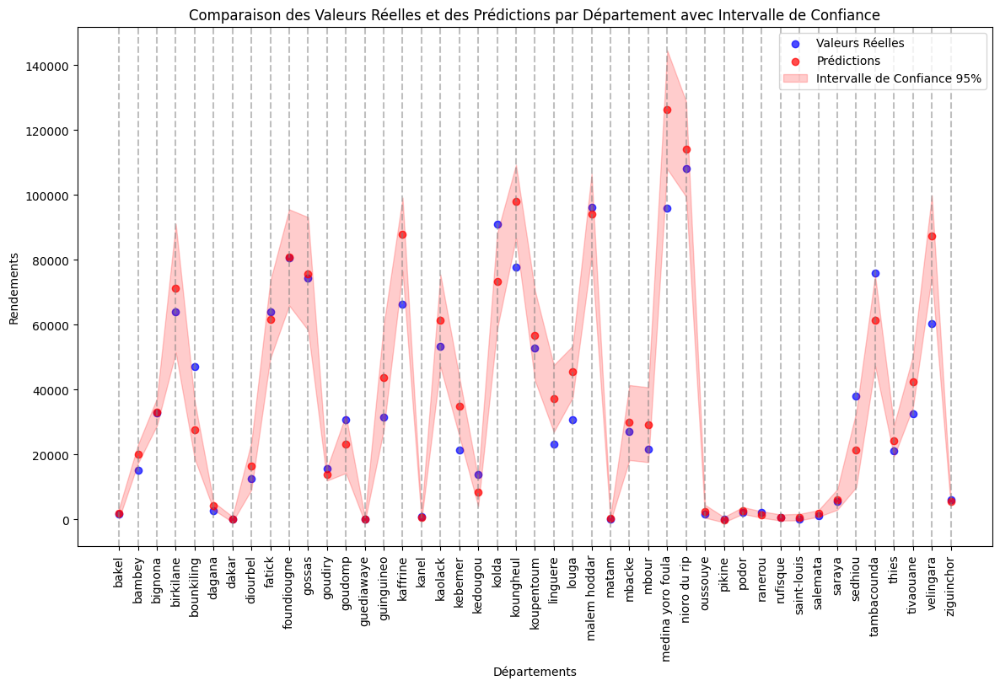

In [201]:
import matplotlib.pyplot as plt
import numpy as np

# Assurez-vous que `departments`, `y_test`, `mean_pred`, `lower_bound`, et `upper_bound` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, mean_pred, color='red', label='Prédictions', alpha=0.7)

# Tracer les intervalles de confiance autour des prédictions
plt.fill_between(departments, lower_bound.flatten(), upper_bound.flatten(), color='red', alpha=0.2, label='Intervalle de Confiance 95%')

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département avec Intervalle de Confiance")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


Non finalisé encore, il y a des erreurs que à revoir

Rappelons que l'ensemble des discussions que nous avons eu pour l'instant concernent uniquement l'arachide qui est la culture de référence que nous avons choisie.

Maintenant que nous commençons à voir de bons résultats émerger, l'idée est de pouvoir étendre ces modèles à d'autres cultures afin de voir ce que nous pourrions obtenir.

## Manioc

Dans un premier temps, nous allons nous attaquer au manioc.

In [193]:


import pandas as pd

# Charger le fichier Excel
file_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\yields\manioc.csv"
data = pd.read_csv(file_path)

# Afficher les premières lignes des données
print(data.head())

# Afficher les informations générales sur les données
print(data.info())



                 Region       SN            SN-DK  SN-DK-RU  \
0           Region Name  SENEGAL  REGION DE DAKAR  RUFISQUE   
1  Region - Description      NaN              NaN       NaN   
2     Region - RegionId       SN            SN-DK  SN-DK-RU   
3               Culture      MAN              MAN       MAN   
4          Culture Name   MANIOC           MANIOC    MANIOC   

                SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK  \
0  REGION DE DIOURBEL    BAMBEY  DIOURBEL    MBACKE  REGION DE FATICK   
1                 NaN       NaN       NaN       NaN               NaN   
2               SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK   
3                 MAN       MAN       MAN       MAN               MAN   
4              MANIOC    MANIOC    MANIOC    MANIOC            MANIOC   

   SN-FK-FD  ...    SN-TC-KO     SN-TC-TD            SN-TH  SN-TH-MB  \
0    FATICK  ...  KOUPENTOUM  TAMBACOUNDA  REGION DE THIES     MBOUR   
1       NaN  ...         NaN          

In [194]:
# Transposer le DataFrame
data_transposed = data.transpose()

# Liste des indices des colonnes à supprimer
columns_to_drop_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

# Supprimer les colonnes spécifiées du DataFrame transposé
data_cleaned = data_transposed.drop(columns_to_drop_indices, axis=1)


# Afficher les premières lignes du DataFrame nettoyé
print(data_cleaned.head(10))


                          0            18           19           20  \
Region           Region Name         2017         2018         2019   
SN                   SENEGAL  747472.9963  943138.0474  1030592.477   
SN-DK        REGION DE DAKAR       2599.2      2859.12         3000   
SN-DK-RU            RUFISQUE       2599.2      2859.12         3000   
SN-DB     REGION DE DIOURBEL     18801.25        85875   108072.072   
SN-DB-BA              BAMBEY      1301.25        38675    60522.072   
SN-DB-DD            DIOURBEL         1500        26800        28350   
SN-DB-MB              MBACKE        16000        20400        19200   
SN-FK       REGION DE FATICK        29425      39927.5     46261.31   
SN-FK-FD              FATICK        20400        30000        32400   

                   21           22           23  
Region           2020         2021         2022  
SN        1346474.341  1328888.709  1322802.544  
SN-DK     3648.822946  3700.971254  3238.349847  
SN-DK-RU  3648.822

In [195]:
manioc=data_cleaned

manioc.head()

manioc.rename(columns={0: 'Region Name'}, inplace=True)

manioc.head()

,Region Name,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,747472.9963,943138.0474,1030592.477,1346474.341,1328888.709,1322802.544
SN-DK,REGION DE DAKAR,2599.2,2859.12,3000,3648.822946,3700.971254,3238.349847
SN-DK-RU,RUFISQUE,2599.2,2859.12,3000,3648.822946,3700.971254,3238.349847
SN-DB,REGION DE DIOURBEL,18801.25,85875,108072.072,114590.5437,95109.71778,114119.113


In [196]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
manioc = manioc[~manioc['Region Name'].str.startswith('REGION')]

# Vérifier le changement
print(manioc)

# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
manioc = manioc[~manioc['Region Name'].str.startswith('SENEGAL')]

# Vérifier le changement
print(manioc)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN                  SENEGAL  747472.9963  943138.0474  1030592.477   
SN-DK-RU           RUFISQUE       2599.2      2859.12         3000   
SN-DB-BA             BAMBEY      1301.25        38675    60522.072   
SN-DB-DD           DIOURBEL         1500        26800        28350   
SN-DB-MB             MBACKE        16000        20400        19200   
SN-FK-FD             FATICK        20400        30000        32400   
SN-FK-FO        FOUNDIOUGNE         3825       4207.5       5482.5   
SN-FK-GO             GOSSAS         5200         5720      8378.81   
SN-KA-BI          BIRKILANE  2623.112927  1731.254532         2400   
SN-KA-KA           KAFFRINE          798        877.8         1800   
SN-KA-KO          KOUNGHEUL          225          297         1437   
SN-KA-MO       MALEM HODDAR          NaN   3.43229228        501.9   
SN-KL-GU         GUI

In [197]:
# Créer un DataFrame pour les nouvelles lignes
new_rows = pd.DataFrame({
    'Region Name': ['DAKAR', 'GUEDIAWAYE', 'PIKINE', 'BAKEL'],
    18: [0, 0, 0, 0],
    19: [0, 0, 0, 0],
    20: [0, 0, 0, 0],
    21: [0, 0, 0, 0],
    22: [0, 0, 0, 0],
    23: [0, 0, 0, 0]
})

# Ajouter les nouvelles lignes en haut du DataFrame existant
manioc = pd.concat([new_rows, manioc], ignore_index=True)

# Vérifier le changement
print(manioc)

          Region Name           18           19         20           21  \
0               DAKAR            0            0          0            0   
1          GUEDIAWAYE            0            0          0            0   
2              PIKINE            0            0          0            0   
3               BAKEL            0            0          0            0   
4         Region Name         2017         2018       2019         2020   
5            RUFISQUE       2599.2      2859.12       3000  3648.822946   
6              BAMBEY      1301.25        38675  60522.072  33070.07813   
7            DIOURBEL         1500        26800      28350  39881.55735   
8              MBACKE        16000        20400      19200  41638.90825   
9              FATICK        20400        30000      32400  23257.63983   
10        FOUNDIOUGNE         3825       4207.5     5482.5  14662.35671   
11             GOSSAS         5200         5720    8378.81  9838.947888   
12          BIRKILANE  26

In [198]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
manioc = manioc[~manioc['Region Name'].str.startswith('Region Name')]

# Vérifier le changement
print(manioc)



          Region Name           18           19         20           21  \
0               DAKAR            0            0          0            0   
1          GUEDIAWAYE            0            0          0            0   
2              PIKINE            0            0          0            0   
3               BAKEL            0            0          0            0   
5            RUFISQUE       2599.2      2859.12       3000  3648.822946   
6              BAMBEY      1301.25        38675  60522.072  33070.07813   
7            DIOURBEL         1500        26800      28350  39881.55735   
8              MBACKE        16000        20400      19200  41638.90825   
9              FATICK        20400        30000      32400  23257.63983   
10        FOUNDIOUGNE         3825       4207.5     5482.5  14662.35671   
11             GOSSAS         5200         5720    8378.81  9838.947888   
12          BIRKILANE  2623.112927  1731.254532       2400  2419.952018   
13           KAFFRINE    

In [199]:
manioc.rename(columns={18: 2017}, inplace=True)
manioc.rename(columns={19: 2018}, inplace=True)
manioc.rename(columns={20: 2019}, inplace=True)
manioc.rename(columns={21: 2020}, inplace=True)
manioc.rename(columns={22: 2021}, inplace=True)
manioc.rename(columns={23: 2022}, inplace=True)

print(manioc)

          Region Name         2017         2018       2019         2020  \
0               DAKAR            0            0          0            0   
1          GUEDIAWAYE            0            0          0            0   
2              PIKINE            0            0          0            0   
3               BAKEL            0            0          0            0   
5            RUFISQUE       2599.2      2859.12       3000  3648.822946   
6              BAMBEY      1301.25        38675  60522.072  33070.07813   
7            DIOURBEL         1500        26800      28350  39881.55735   
8              MBACKE        16000        20400      19200  41638.90825   
9              FATICK        20400        30000      32400  23257.63983   
10        FOUNDIOUGNE         3825       4207.5     5482.5  14662.35671   
11             GOSSAS         5200         5720    8378.81  9838.947888   
12          BIRKILANE  2623.112927  1731.254532       2400  2419.952018   
13           KAFFRINE    

In [200]:
# Remplacer les NaN par 0
manioc.fillna(0, inplace=True)

print(manioc)


          Region Name         2017         2018       2019         2020  \
0               DAKAR            0            0          0            0   
1          GUEDIAWAYE            0            0          0            0   
2              PIKINE            0            0          0            0   
3               BAKEL            0            0          0            0   
5            RUFISQUE       2599.2      2859.12       3000  3648.822946   
6              BAMBEY      1301.25        38675  60522.072  33070.07813   
7            DIOURBEL         1500        26800      28350  39881.55735   
8              MBACKE        16000        20400      19200  41638.90825   
9              FATICK        20400        30000      32400  23257.63983   
10        FOUNDIOUGNE         3825       4207.5     5482.5  14662.35671   
11             GOSSAS         5200         5720    8378.81  9838.947888   
12          BIRKILANE  2623.112927  1731.254532       2400  2419.952018   
13           KAFFRINE    

In [202]:
# Liste des noms des départements correspondant à l'ordre des géométries dans le GeoDataFrame
noms_departements = [
    'DAKAR', 'GUEDIAWAYE', 'PIKINE', 'RUFISQUE',
    'BAMBEY', 'DIOURBEL', 'MBACKE',
    'FATICK', 'FOUNDIOUGNE', 'GOSSAS',
    'BIRKILANE', 'KAFFRINE', 'KOUNGHEUL', 'MALEM HODDAR',
    'GUINGUINEO', 'KAOLACK', 'NIORO DU RIP',
    'KEDOUGOU', 'SALEMATA', 'SARAYA',
    'KOLDA', 'MEDINA YORO FOULA', 'VELINGARA',
    'KEBEMER', 'LINGUERE', 'LOUGA', 
    'KANEL', 'MATAM', 'RANEROU', 
    'DAGANA', 'PODOR', 'SAINT-LOUIS',
    'BOUNKILING', 'GOUDOMP', 'SEDHIOU',
    'BAKEL', 'GOUDIRY', 'KOUPENTOUM', 'TAMBACOUNDA',
    'MBOUR', 'THIES', 'TIVAOUANE',
    'BIGNONA', 'OUSSOUYE', 'ZIGUINCHOR'
]

# Vérifier que le nombre de noms correspond au nombre de géométries
print(len(noms_departements), len(gdf))

# Ajouter la colonne des noms des départements au GeoDataFrame
gdf['Region Name'] = noms_departements

# Afficher les premières lignes pour vérifier l'ajout
print(gdf.head())



45 45
                                            geometry Region Name
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY


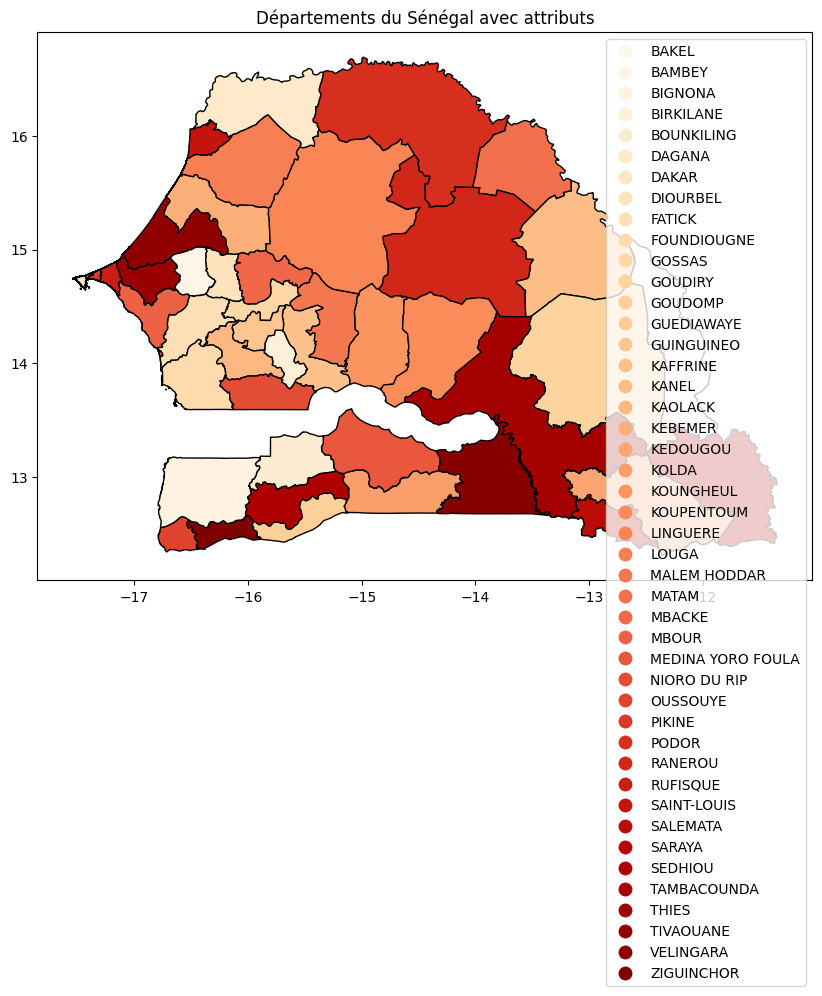

In [160]:
# Personnaliser la visualisation
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(column='Region Name', ax=ax, legend=True,
         cmap='OrRd', edgecolor='black')

plt.title('Départements du Sénégal avec attributs')
plt.show()


In [203]:
# Fusionner les données
merged_gdf = gdf.merge(manioc, on='Region Name')

# Afficher les premières lignes pour vérifier la fusion
print(merged_gdf.head())

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)



                                            geometry Region Name     2017  \
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR        0   
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE        0   
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE        0   
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE   2599.2   
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY  1301.25   

      2018       2019         2020         2021         2022  
0        0          0            0            0            0  
1        0          0            0            0            0  
2        0          0            0            0            0  
3  2859.12       3000  3648.822946  3700.971254  3238.349847  
4    38675  60522.072  33070.07813  24149.71778     30269.35  
2017    object
2018    object
2019    object
2020    object
2021    object
2022    object
dtype: object


In [204]:
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    merged_gdf[year] = pd.to_numeric(merged_gdf[year], errors='coerce')

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)


2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
2022    float64
dtype: object


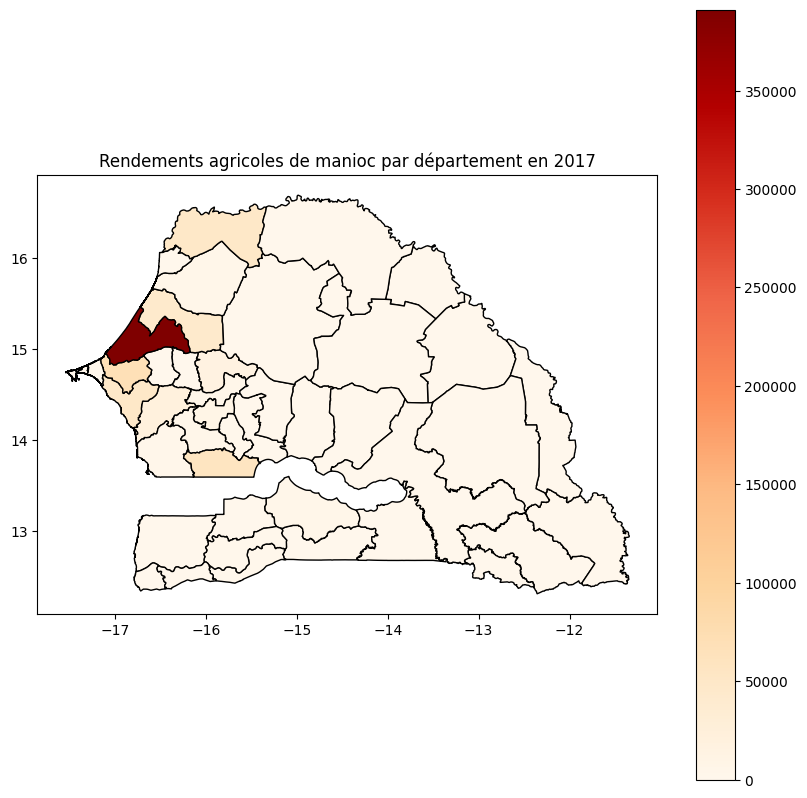

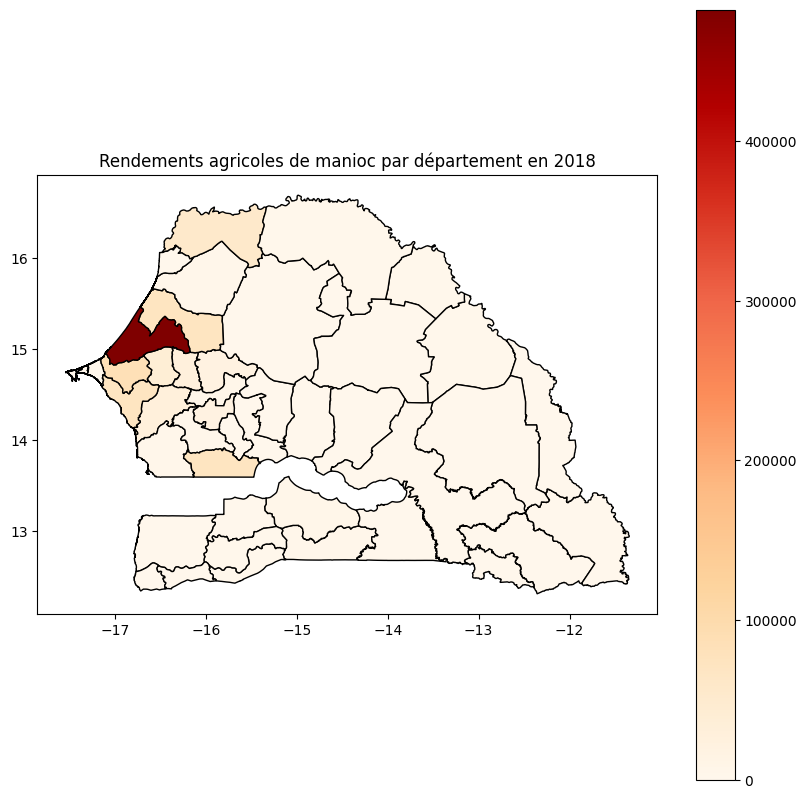

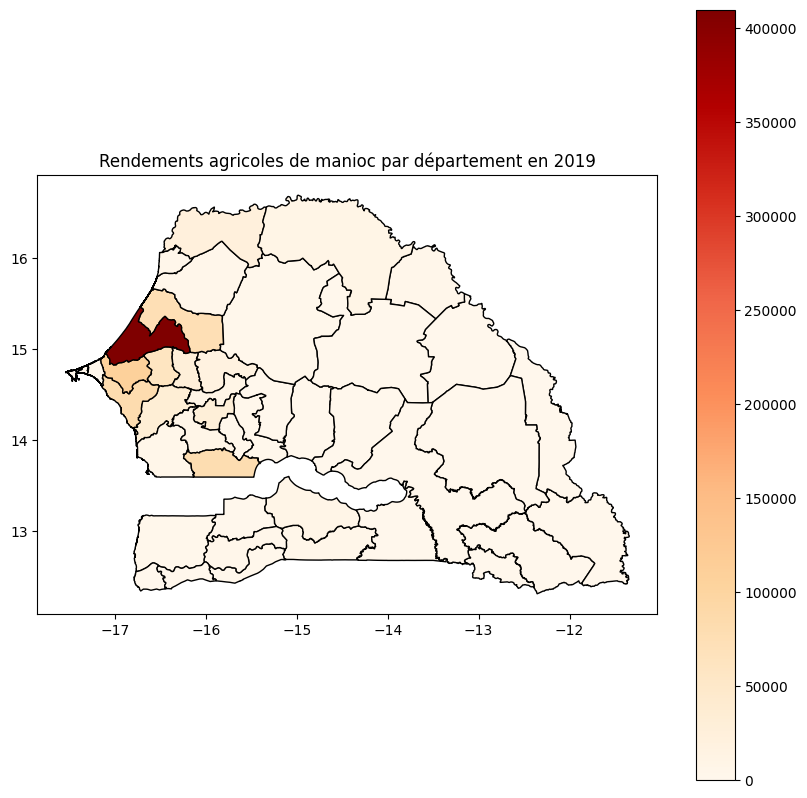

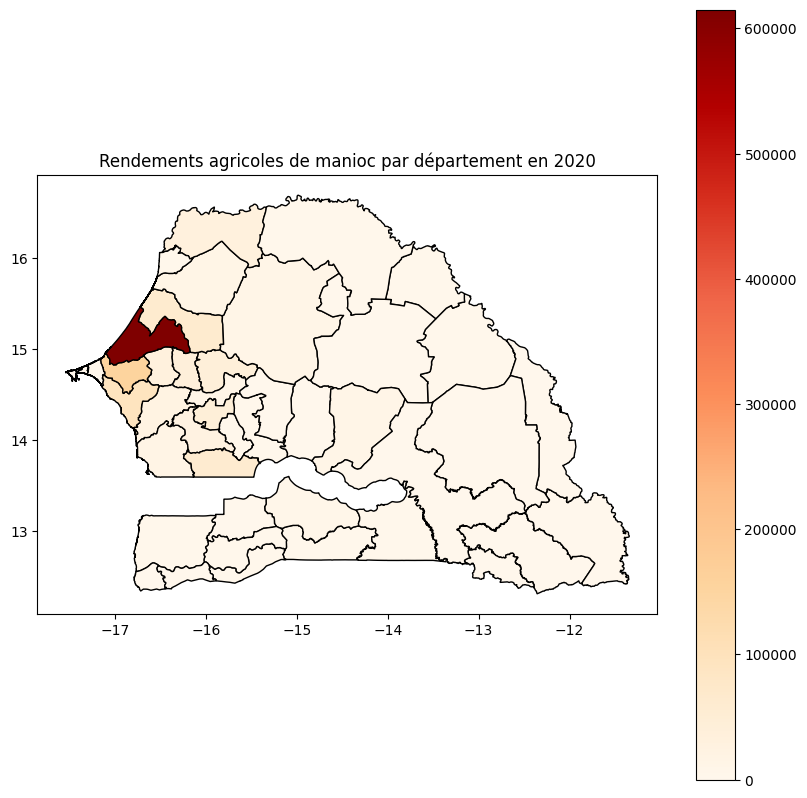

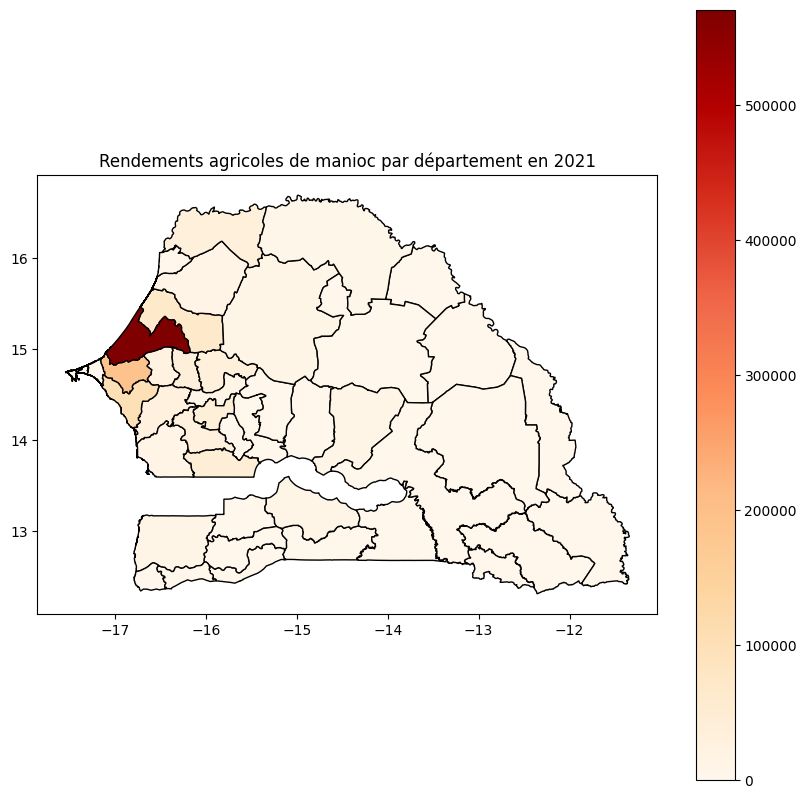

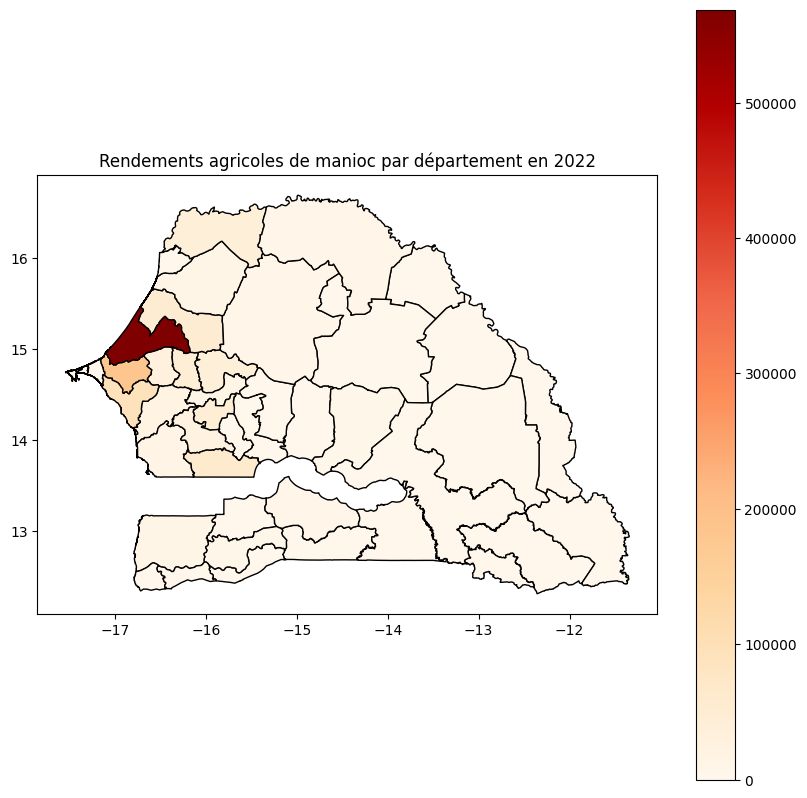

In [205]:
years = [2017, 2018, 2019, 2020, 2021, 2022]

for year in years:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    merged_gdf.plot(column=year, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
    plt.title(f'Rendements agricoles de manioc par département en {year}')
    plt.show()

# pointtt : extension de manioc

In [207]:
import geopandas as gpd

# Exemple d'initialisation si ce n'est pas déjà fait
# merged_gdf = gpd.read_file('path_to_your_geodatafile.shp')

# Tri du GeoDataFrame par ordre alphabétique de la colonne 'Region Name'
merged_gdf_sorted = merged_gdf.sort_values(by='Region Name').reset_index(drop=True)

# Afficher le GeoDataFrame trié
print(merged_gdf_sorted.head())



                                            geometry Region Name         2017  \
0  POLYGON ((-12.06774 13.70753, -12.06079 13.700...       BAKEL     0.000000   
1  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY  1301.250000   
2  POLYGON ((-15.99612 12.82992, -15.99748 12.829...     BIGNONA   153.000000   
3  POLYGON ((-15.55763 13.86664, -15.55969 13.865...   BIRKILANE  2623.112927   
4  POLYGON ((-15.85103 13.18076, -15.82677 13.180...  BOUNKILING   224.898472   

           2018       2019          2020          2021          2022  
0      0.000000      0.000      0.000000      0.000000      0.000000  
1  38675.000000  60522.072  33070.078130  24149.717780  30269.350000  
2   1683.000000   2133.670   4530.680559  11302.923710  12706.740290  
3   1731.254532   2400.000   2419.952018   2380.042446   2206.907106  
4    224.898472    274.725   1683.389084   1914.000000   2270.400000  


In [208]:

# Vérifiez la cohérence des noms de départements
ndvi_global['Department'] = ndvi_global['Department'].str.lower()
landtemp_global['Department'] = landtemp_global['Department'].str.lower()
rainfall_global['Department'] = rainfall_global['Department'].str.lower()
merged_gdf_sorted['Region Name'] = merged_gdf_sorted['Region Name'].str.lower()


In [210]:
# Fusionner les features avec les données de rendements
def prepare_features(year):
    ndvi_year = ndvi_global.loc[str(year)].reset_index(drop=True)
    # print(ndvi_year)
    lst_year = landtemp_global.loc[str(year)].reset_index(drop=True)
    rainfall_year = rainfall_global.loc[str(year)].reset_index(drop=True)

    # Fusionner les features sur le nom du département
    # temp = ndvi_year.merge(lst_year, on='Department', suffixes=(str(year)+'_ndvi', str(year)+'_lst'))
    # features = temp.merge(rainfall_year, on='Department', suffixes=('_', str(year)+'_rain'))
    features = ndvi_year.merge(lst_year.merge(rainfall_year, on='Department', suffixes=(str(year)+'_lst', str(year)+'_rain')), on='Department').rename(columns = {'Jan': 'Jan'+str(year)+'_ndvi', 'Feb': 'Feb'+str(year)+'_ndvi', 'Mar': 'Mar'+str(year)+'_ndvi', 'Apr': 'Apr'+str(year)+'_ndvi', 'May': 'May'+str(year)+'_ndvi', 'Jun': 'Jun'+str(year)+'_ndvi', 'Jul': 'Jul'+str(year)+'_ndvi', 'Aug': 'Aug'+str(year)+'_ndvi', 'Sept': 'Sept'+str(year)+'_ndvi', 'Oct': 'Oct'+str(year)+'_ndvi', 'Nov': 'Nov'+str(year)+'_ndvi', 'Dec': 'Dec'+str(year)+'_ndvi'})
    # print(features)
    
    # Ajouter les données de rendements pour l'année donnée
    yields = merged_gdf_sorted[['Region Name', year]].rename(columns={'Region Name': 'Department', year: 'Yield'+str(year)})
    # print(yields)
    
    #print(yields.columns.tolist())
    #print(features.columns.tolist())
    
    # Joindre les rendements avec les features
    data = features.merge(yields, on='Department')
    # print(data)

    return data



In [211]:
# Préparer les données pour toutes les années disponibles
data_2020 = prepare_features(2020)
data_2021 = prepare_features(2021)
data_2022 = prepare_features(2022)
# print(data_2020)


In [212]:
# Concaténer toutes les données pour un ensemble complet
all_data = pd.concat([data_2020, data_2021, data_2022], ignore_index=False, axis=1)

# Afficher le DataFrame résultant
print(all_data)
print(all_data.columns)

    Jan2020_ndvi  Feb2020_ndvi  Mar2020_ndvi  Apr2020_ndvi  May2020_ndvi  \
0       0.261373      0.243739      0.223248      0.217857      0.212408   
1       0.226884      0.220627      0.207836      0.196056      0.187545   
2       0.450318      0.367808      0.325922      0.307612      0.306105   
3       0.239233      0.227222      0.214794      0.199590      0.188848   
4       0.371602      0.293450      0.277845      0.269917      0.272437   
5       0.198287      0.198479      0.193791      0.213732      0.217972   
6       0.150289      0.142762      0.135471      0.131776      0.123340   
7       0.224278      0.215301      0.202208      0.191190      0.182863   
8       0.208799      0.203343      0.194405      0.187499      0.184056   
9       0.314511      0.294715      0.271235      0.253902      0.253502   
10      0.225760      0.215473      0.202012      0.190561      0.180744   
11      0.279911      0.256492      0.238674      0.238304      0.234552   
12      0.50

In [214]:
all_data = all_data.loc[:,~all_data.columns.duplicated()].copy()

print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [216]:
# shift column 'Name' to first position 
first_column = all_data.pop('Department') 
  
# insert column using insert(position,column_name, 
# first_column) function 
all_data.insert(0, 'Department', first_column) 

In [303]:
# normal

# Renommer les colonnes pour 2020, 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2020 = all_data.filter(regex='2020')
features_2020 = rename_features(features_2020, '2020')

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')



In [304]:
# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


In [222]:
# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

X_train_scaled.shape



(45, 72)

In [223]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, 36, 45)


X_train_scaled.shape

(2, 36, 45)

In [224]:
X_test_scaled.shape

(1, 36, 45)

In [225]:
# Autre modèle de réseau de neurones

class SimpleNN3(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=45, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(45)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [226]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [227]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [228]:
# Entraîner le modèle
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 844718720.0000
Epoch [20/400], Loss: 267314560.0000
Epoch [30/400], Loss: 80963360.0000
Epoch [40/400], Loss: 48871584.0000
Epoch [50/400], Loss: 22761952.0000
Epoch [60/400], Loss: 18806640.0000
Epoch [70/400], Loss: 16275684.0000
Epoch [80/400], Loss: 15341377.0000
Epoch [90/400], Loss: 15033284.0000
Epoch [100/400], Loss: 15301807.0000
Epoch [110/400], Loss: 14486444.0000
Epoch [120/400], Loss: 49264528.0000
Epoch [130/400], Loss: 21000252.0000
Epoch [140/400], Loss: 17430332.0000
Epoch [150/400], Loss: 16782014.0000
Epoch [160/400], Loss: 16434927.0000
Epoch [170/400], Loss: 17642990.0000
Epoch [180/400], Loss: 15041748.0000
Epoch [190/400], Loss: 12821218.0000
Epoch [200/400], Loss: 51137604.0000
Epoch [210/400], Loss: 45275760.0000
Epoch [220/400], Loss: 13426202.0000
Epoch [230/400], Loss: 11797579.0000
Epoch [240/400], Loss: 7518126.0000
Epoch [250/400], Loss: 1528974.2500
Epoch [260/400], Loss: 362508.4375
Epoch [270/400], Loss: 142784.2500
Epoch [280/400

Note que j'ajuste au fur et à mesure le nombre d'epochs d'entraînement pour avoir le meilleur ajustement aux données test à la fin. On pourrait imaginer un processus automatisé qui fait plusieurs apprentissages en changeant à chaque fois le nombre d'epochs et plusieurs autres paramètres tels que le taux d'apprentissage etc. Toutefois, si nous voulions le faire de manière exhaustive, le temps d'exécution aurait certainement été long et la puissance de calcul de mon ordinateur personnel insuffisante.

In [229]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([45])
torch.Size([45])
Test Loss: 68782048.0000


In [240]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[[-8.9559039e+02]
  [ 2.9619982e+04]
  [ 5.7361323e+03]
  [ 7.9489502e+02]
  [-1.7254254e+02]
  [ 3.6605508e+04]
  [-9.6207373e+02]
  [ 4.0433523e+04]
  [ 2.8092340e+04]
  [ 1.6735963e+04]
  [ 1.1770316e+04]
  [-8.9795441e+02]
  [ 1.9120643e+03]
  [-9.4141052e+02]
  [ 4.6267938e+04]
  [ 1.2176595e+03]
  [ 1.1331267e+03]
  [ 2.8739234e+04]
  [ 6.9410047e+04]
  [-9.5030109e+02]
  [ 1.2749155e+03]
  [-8.3523816e+02]
  [ 1.4308675e+04]
  [ 1.2533467e+04]
  [ 1.6502703e+04]
  [-1.1699712e+03]
  [ 1.4988866e+03]
  [ 3.9814180e+04]
  [ 1.0403470e+05]
  [ 1.0563409e+04]
  [ 5.5304562e+04]
  [ 1.7797351e+03]
  [-1.2395969e+03]
  [ 2.8632319e+03]
  [-5.9740839e+02]
  [ 2.0663240e+03]
  [ 1.3151179e+03]
  [-8.2980939e+02]
  [-1.5239359e+03]
  [ 2.5049160e+03]
  [-4.4797470e+02]
  [ 1.8772086e+05]
  [ 6.1551394e+05]
  [ 4.9983384e+03]
  [-7.3758521e+02]]]
Véritables valeurs: [0.00000000e+00 3.02693500e+04 1.27067403e+04 2.20690711e+03
 2.27040000e+03 4.18382366e+04 0.00000000e+00 4.5

In [231]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [232]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 4162.9211
Mean Squared Error (MSE): 68782041.8982
Root Mean Squared Error (RMSE): 8293.4939
R-squared (R²): 0.9910


Voici le R2 score calculé pour le manioc, et ce sans couches fortement connectées dans le réseau.

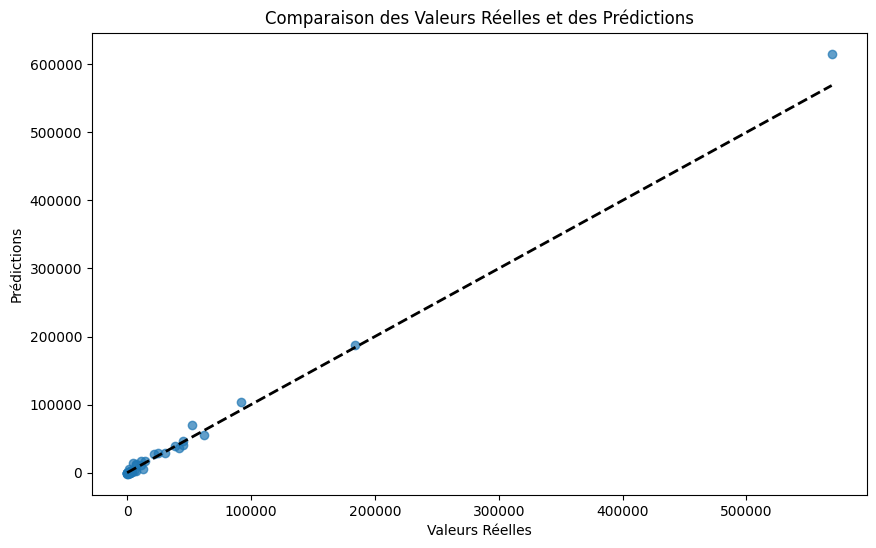

In [233]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

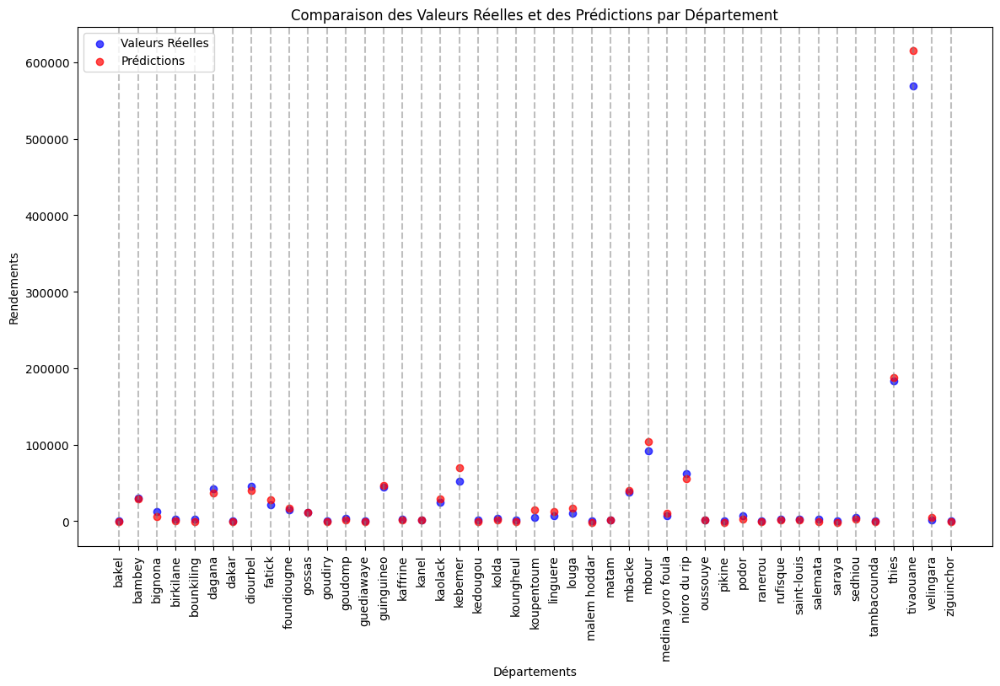

In [234]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

# niowal fi


# pointtt : tivavouane et thies produisent beaucoup plus de manioc que les autres

Nous remarquons tout de suite qu'un département en particulier se distingue dans la production de manioc, il s'agit de Tivavouane.

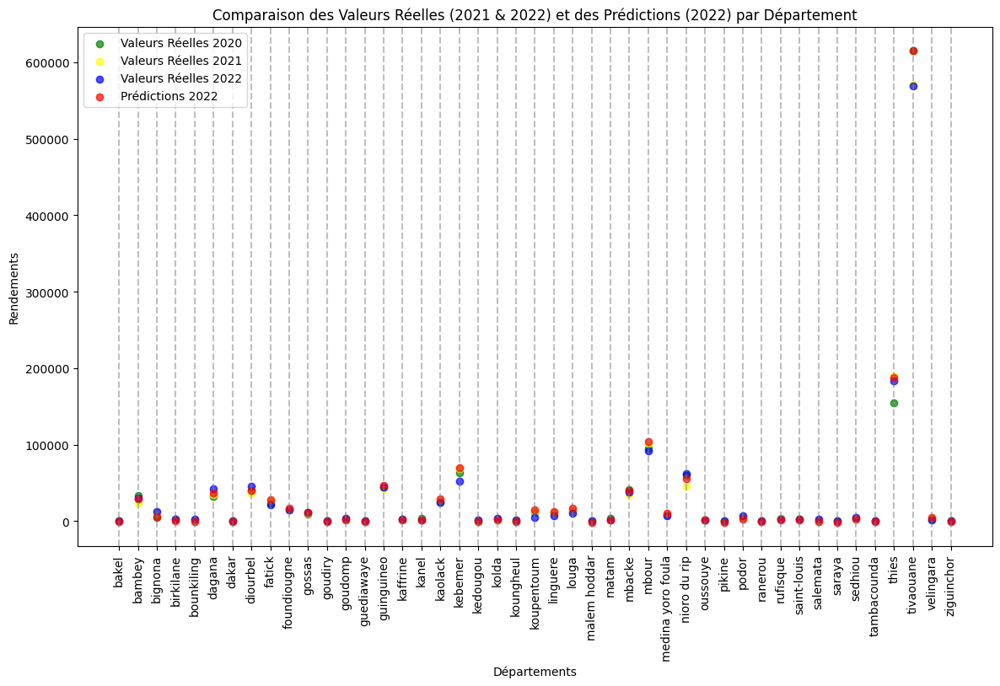

In [235]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

La production à Tivaouane est beaucoup plus élevée que partout ailleurs dans le pays, à Thies également dans une moindre mesure. Ca en fait, non pas une valeur aberrante, mais un point levier/influent du modèle. En effet, il s'aligne plutôt bien à la droite de régression.

Nous allons le retirer de l'apprentissage pour voir le résultat qu'on a !

In [329]:
# Exclure Tivaouane des données d'entraînement et de test

# train
X_train_filtered = X_train[~X_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(X_train_filtered.shape)
y_train_filtered = y_train[~y_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(y_train_filtered.shape)

# test
X_test_filtered = X_test[~X_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(X_test_filtered.shape)
y_test_filtered = y_test[~y_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(y_test_filtered.shape)

(44, 72)
(44, 2)
(44, 36)
(44,)


In [330]:
print(y_train_filtered)

        Yield2020      Yield2021
0        0.000000       0.000000
1    33070.078130   24149.717780
2     4530.680559   11302.923710
3     2419.952018    2380.042446
4     1683.389084    1914.000000
5    32222.564850   34865.197130
6        0.000000       0.000000
7    39881.557350   36400.000000
8    23257.639830   27123.515280
9    14662.356710   14709.800000
10    9838.947888    9990.000000
11       0.000000       0.000000
12    3217.768174    3749.156695
13       0.000000       0.000000
14   44747.500000   42223.500000
15    3058.336496    2779.325262
16    3701.250000    1200.000000
17   25170.000000   26848.000000
18   63794.609610   68333.264750
19       0.000000     315.400000
20    3228.320700    3050.000000
21     893.374140    1562.222124
22   11478.862320   13077.494160
23   10304.448000   10319.400000
24   13928.088000   13818.000000
25     134.269511      84.385896
26    3725.654625    1243.000000
27   41638.908250   34560.000000
28   94824.521000  102235.000000
29    8725

In [331]:
# Reformater les données sans Tivaouane

# train
X_train_filtered_scaled = scaler.fit_transform(X_train_filtered)
print(X_train_filtered_scaled.shape)
X_train_filtered_scaled = X_train_filtered_scaled.reshape(2, X_train_filtered_scaled.shape[1] // 2, X_train_filtered_scaled.shape[0])
print(X_train_filtered_scaled.shape)

# test
X_test_filtered_scaled = scaler.fit_transform(X_test_filtered)
print(X_test_filtered_scaled.shape)
X_test_filtered_scaled = X_test_filtered_scaled.reshape(1, X_test_filtered_scaled.shape[1], X_test_filtered_scaled.shape[0])
print(X_test_filtered_scaled.shape)


(44, 72)
(2, 36, 44)
(44, 36)
(1, 36, 44)


In [332]:
# Autre modèle de réseau de neurones
# sans Tivaouane

class SimpleNN3_sans_tiv(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_sans_tiv, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=44, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(44)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [333]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_sans_tiv(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [334]:
# Initialiser le modèle et les tenseurs avec les nouvelles données filtrées

# train
X_train_tensor = torch.tensor(X_train_filtered_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_filtered.values, dtype=torch.float32)

# test
X_test_tensor = torch.tensor(X_test_filtered_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_filtered.values, dtype=torch.float32)


In [336]:
# Entraînement du modèle avec les données sans Tivaouane
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    outputs = outputs.squeeze()
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/400], Loss: 110188064.0000
Epoch [20/400], Loss: 44235812.0000
Epoch [30/400], Loss: 16745628.0000
Epoch [40/400], Loss: 10896241.0000
Epoch [50/400], Loss: 9737396.0000
Epoch [60/400], Loss: 7592257.5000
Epoch [70/400], Loss: 7034664.5000
Epoch [80/400], Loss: 6867625.5000
Epoch [90/400], Loss: 6708584.5000
Epoch [100/400], Loss: 6608870.0000
Epoch [110/400], Loss: 6538059.5000
Epoch [120/400], Loss: 6419747.5000
Epoch [130/400], Loss: 5876191.5000
Epoch [140/400], Loss: 2680938.2500
Epoch [150/400], Loss: 805093.2500
Epoch [160/400], Loss: 409632.6875
Epoch [170/400], Loss: 279224.7188
Epoch [180/400], Loss: 71337.8438
Epoch [190/400], Loss: 18550.3086
Epoch [200/400], Loss: 10632.1846
Epoch [210/400], Loss: 8782.5156
Epoch [220/400], Loss: 4701.5918
Epoch [230/400], Loss: 1018.3933
Epoch [240/400], Loss: 49877.7344
Epoch [250/400], Loss: 8928734.0000
Epoch [260/400], Loss: 1611742.8750
Epoch [270/400], Loss: 700198.4375
Epoch [280/400], Loss: 340847.6250
Epoch [290/400], L

In [315]:
# Évaluer le modèle comme avant
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 21814400.0000


In [283]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()
y_test = y_test_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred.shape)
print("Véritables valeurs:", y_test.shape)

Prédictions: (1, 44, 1)
Véritables valeurs: (44,)


In [318]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

mae = mean_absolute_error(y_test_filtered, y_pred)
mse = mean_squared_error(y_test_filtered, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test_filtered, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

Mean Absolute Error (MAE): 2576.3847
Mean Squared Error (MSE): 21814399.5701
Root Mean Squared Error (RMSE): 4670.5888
R-squared (R²): 0.9792


Nous voyons que le R2 a légèrement diminué mais reste tout de même très bon. Ce modèle est plus fiable que le répécdent car ses performances seront moins déterminées par la production d'un département très influent.

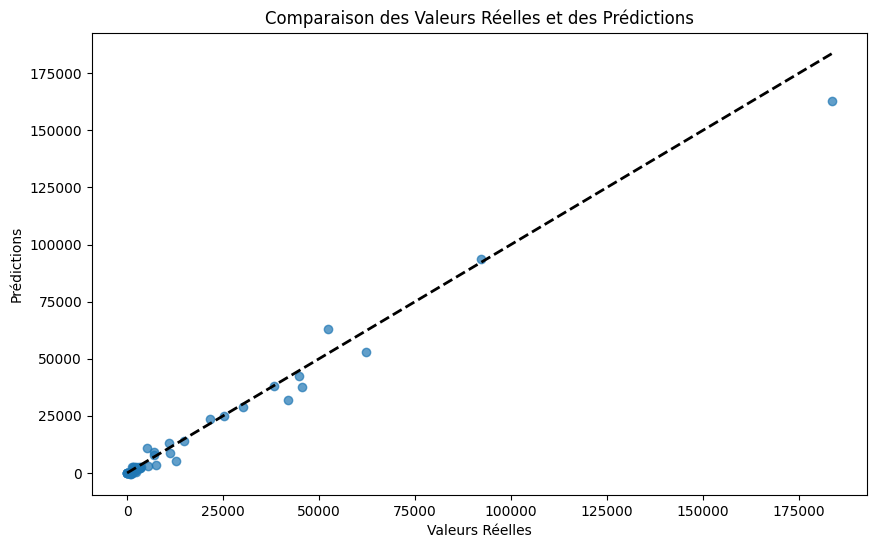

In [320]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_filtered, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test_filtered.min(), y_test_filtered.max()], [y_test_filtered.min(), y_test_filtered.max()], 'k--', lw=2)
plt.show()


# pointtt : valeurs extrêmes mais pas aberrantes car alignées

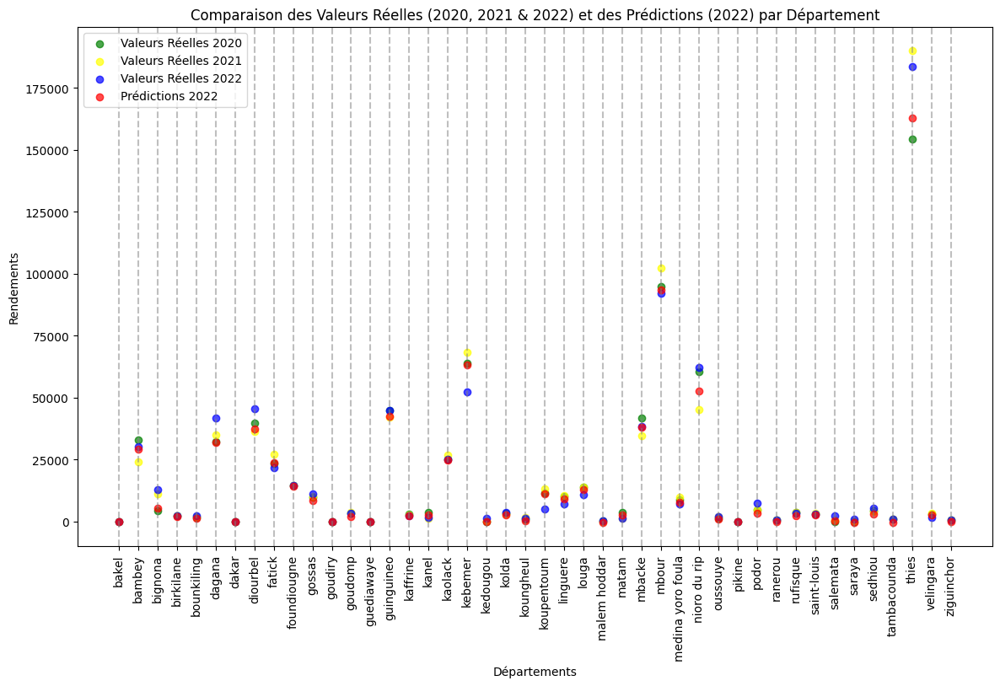

In [348]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que departments soit une liste avec les noms des départements
# y_test contient les valeurs réelles pour 2022
# y_pred contient les prédictions pour 2022
# y_train_2021 contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que departments, y_test, y_pred, et y_train_2021 sont alignés correctement
departments = all_data[all_data['Department'] != 'tivaouane']['Department'].unique()
# departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train_filtered['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train_filtered['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test_filtered, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Les erreurs sont plus visibles sur le graphique lorsqu'elles ne sont pas écrasées par celles que nous avons à Tivavoaune. Nous allons maintenant retirer Thies de l'apprentissage en plus de Tivavouane. En effet, c'est un département qui peut aussi être considéré comme point influent.

In [352]:
# Exclure Tivaouane et Thiès des données d'entraînement et de test

# train
X_train_filtered = X_train[~X_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
X_train_filtered = X_train_filtered[~X_train_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(X_train_filtered.shape)
y_train_filtered = y_train[~y_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
y_train_filtered = y_train_filtered[~y_train_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(y_train_filtered.shape)

# test
X_test_filtered = X_test[~X_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
X_test_filtered = X_test_filtered[~X_test_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(X_test_filtered.shape)
y_test_filtered = y_test[~y_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
y_test_filtered = y_test_filtered[~y_test_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(y_test_filtered.shape)

(43, 72)
(43, 2)
(43, 36)
(43,)


In [353]:
print(y_train_filtered)

       Yield2020      Yield2021
0       0.000000       0.000000
1   33070.078130   24149.717780
2    4530.680559   11302.923710
3    2419.952018    2380.042446
4    1683.389084    1914.000000
5   32222.564850   34865.197130
6       0.000000       0.000000
7   39881.557350   36400.000000
8   23257.639830   27123.515280
9   14662.356710   14709.800000
10   9838.947888    9990.000000
11      0.000000       0.000000
12   3217.768174    3749.156695
13      0.000000       0.000000
14  44747.500000   42223.500000
15   3058.336496    2779.325262
16   3701.250000    1200.000000
17  25170.000000   26848.000000
18  63794.609610   68333.264750
19      0.000000     315.400000
20   3228.320700    3050.000000
21    893.374140    1562.222124
22  11478.862320   13077.494160
23  10304.448000   10319.400000
24  13928.088000   13818.000000
25    134.269511      84.385896
26   3725.654625    1243.000000
27  41638.908250   34560.000000
28  94824.521000  102235.000000
29   8725.584572    9709.312958
30  6048

In [354]:
# Reformater les données sans Tivaouane et Thies

# train
X_train_filtered_scaled = scaler.fit_transform(X_train_filtered)
print(X_train_filtered_scaled.shape)
X_train_filtered_scaled = X_train_filtered_scaled.reshape(2, X_train_filtered_scaled.shape[1] // 2, X_train_filtered_scaled.shape[0])
print(X_train_filtered_scaled.shape)

# test
X_test_filtered_scaled = scaler.fit_transform(X_test_filtered)
print(X_test_filtered_scaled.shape)
X_test_filtered_scaled = X_test_filtered_scaled.reshape(1, X_test_filtered_scaled.shape[1], X_test_filtered_scaled.shape[0])
print(X_test_filtered_scaled.shape)

(43, 72)
(2, 36, 43)
(43, 36)
(1, 36, 43)


In [358]:
# Autre modèle de réseau de neurones
# sans Tivaouane et Thies

class SimpleNN3_sans_tiv_thies(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_sans_tiv_thies, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=43, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(43)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [359]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_filtered_scaled.shape[1]
print(input_size)
model = SimpleNN3_sans_tiv_thies(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [360]:
# Initialiser le modèle et les tenseurs avec les nouvelles données filtrées

# train
X_train_tensor = torch.tensor(X_train_filtered_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_filtered.values, dtype=torch.float32)

# test
X_test_tensor = torch.tensor(X_test_filtered_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_filtered.values, dtype=torch.float32)



In [361]:
# Entraînement du modèle avec les données sans Tivaouane
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    outputs = outputs.squeeze()
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 286834496.0000
Epoch [20/400], Loss: 107474264.0000
Epoch [30/400], Loss: 27809876.0000
Epoch [40/400], Loss: 6432703.5000
Epoch [50/400], Loss: 3408620.0000
Epoch [60/400], Loss: 2794311.7500
Epoch [70/400], Loss: 1859462.1250
Epoch [80/400], Loss: 537381.6250
Epoch [90/400], Loss: 147636.9531
Epoch [100/400], Loss: 46770.7539
Epoch [110/400], Loss: 48239.4492
Epoch [120/400], Loss: 8893.7432
Epoch [130/400], Loss: 7480.8960
Epoch [140/400], Loss: 3795.7136
Epoch [150/400], Loss: 1242.9363
Epoch [160/400], Loss: 410.2768
Epoch [170/400], Loss: 372.3844
Epoch [180/400], Loss: 928.0476
Epoch [190/400], Loss: 179063.3906
Epoch [200/400], Loss: 17112.9238
Epoch [210/400], Loss: 19210.9883
Epoch [220/400], Loss: 2627.4824
Epoch [230/400], Loss: 4583.7837
Epoch [240/400], Loss: 260.1201
Epoch [250/400], Loss: 368.2858
Epoch [260/400], Loss: 294.2064
Epoch [270/400], Loss: 7649.5435
Epoch [280/400], Loss: 42536.9922
Epoch [290/400], Loss: 62815.8125
Epoch [300/400], Los

In [362]:
# Évaluer le modèle comme avant
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


Test Loss: 11903101.0000


In [ ]:
# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()
y_test = y_test_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred.shape)
print("Véritables valeurs:", y_test.shape)


In [363]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

mae = mean_absolute_error(y_test_filtered, y_pred)
mse = mean_squared_error(y_test_filtered, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test_filtered, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')



Mean Absolute Error (MAE): 2019.3861
Mean Squared Error (MSE): 11903099.5082
Root Mean Squared Error (RMSE): 3450.0869
R-squared (R²): 0.9712


L'ajustement du modèle est similaire. Nous allons nous arrêter là concernant l'étude des points influents.

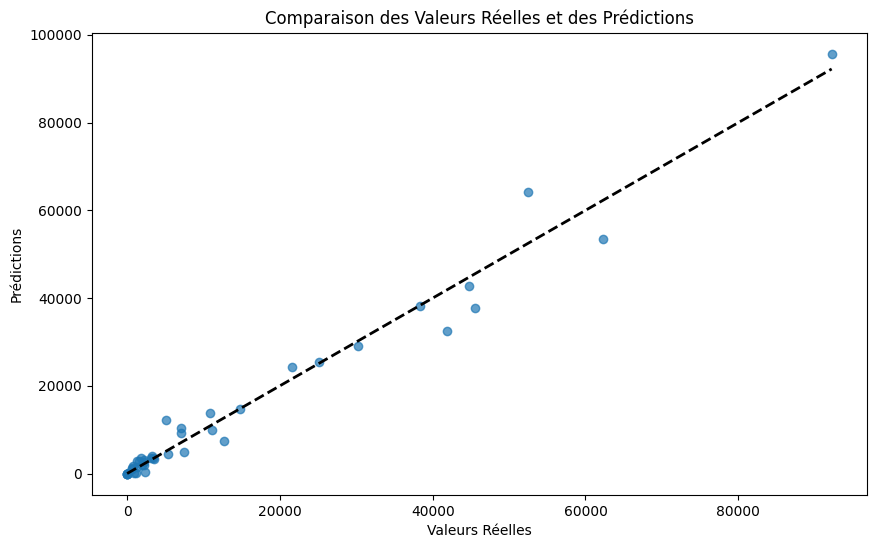

In [364]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_filtered, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test_filtered.min(), y_test_filtered.max()], [y_test_filtered.min(), y_test_filtered.max()], 'k--', lw=2)
plt.show()


C:\Users\ADIE\AppData\Local\Temp\ipykernel_6152\841200844.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  departments = all_data[all_data['Department'] != 'tivaouane'][all_data['Department'] != 'thies']['Department'].unique()


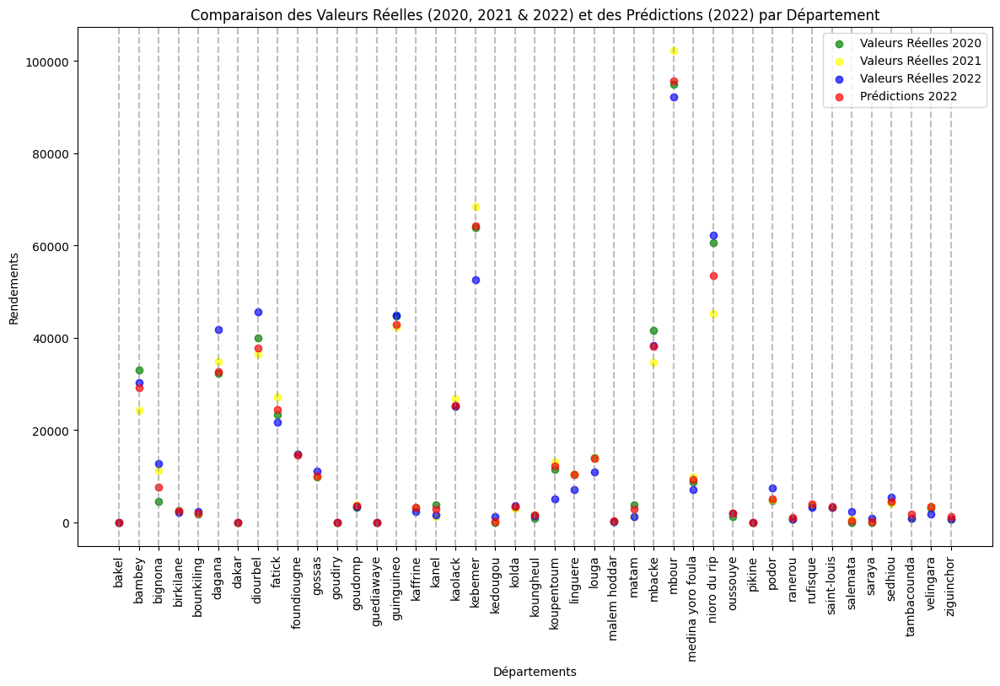

In [366]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que departments soit une liste avec les noms des départements
# y_test contient les valeurs réelles pour 2022
# y_pred contient les prédictions pour 2022
# y_train_2021 contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que departments, y_test, y_pred, et y_train_2021 sont alignés correctement
departments = all_data[all_data['Department'] != 'tivaouane'][all_data['Department'] != 'thies']['Department'].unique()
# departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train_filtered['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train_filtered['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test_filtered, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Nous allons reprendre exactement la même démarche mais en ajoutant des couches fortemet connectées en fin de réseau et en incluant des couches de batch normalization.

In [367]:
# Exclure Tivaouane des données d'entraînement et de test

# train
X_train_filtered = X_train[~X_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(X_train_filtered.shape)
y_train_filtered = y_train[~y_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(y_train_filtered.shape)

# test
X_test_filtered = X_test[~X_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(X_test_filtered.shape)
y_test_filtered = y_test[~y_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
print(y_test_filtered.shape)

(44, 72)
(44, 2)
(44, 36)
(44,)


In [368]:
print(y_train_filtered)

        Yield2020      Yield2021
0        0.000000       0.000000
1    33070.078130   24149.717780
2     4530.680559   11302.923710
3     2419.952018    2380.042446
4     1683.389084    1914.000000
5    32222.564850   34865.197130
6        0.000000       0.000000
7    39881.557350   36400.000000
8    23257.639830   27123.515280
9    14662.356710   14709.800000
10    9838.947888    9990.000000
11       0.000000       0.000000
12    3217.768174    3749.156695
13       0.000000       0.000000
14   44747.500000   42223.500000
15    3058.336496    2779.325262
16    3701.250000    1200.000000
17   25170.000000   26848.000000
18   63794.609610   68333.264750
19       0.000000     315.400000
20    3228.320700    3050.000000
21     893.374140    1562.222124
22   11478.862320   13077.494160
23   10304.448000   10319.400000
24   13928.088000   13818.000000
25     134.269511      84.385896
26    3725.654625    1243.000000
27   41638.908250   34560.000000
28   94824.521000  102235.000000
29    8725

In [370]:
# Reformater les données sans Tivaouane

# train
X_train_filtered_scaled = scaler.fit_transform(X_train_filtered)
print(X_train_filtered_scaled.shape)
X_train_filtered_scaled = X_train_filtered_scaled.reshape(2, X_train_filtered_scaled.shape[1] // 2, X_train_filtered_scaled.shape[0])
print(X_train_filtered_scaled.shape)

# test
X_test_filtered_scaled = scaler.fit_transform(X_test_filtered)
print(X_test_filtered_scaled.shape)
X_test_filtered_scaled = X_test_filtered_scaled.reshape(1, X_test_filtered_scaled.shape[1], X_test_filtered_scaled.shape[0])
print(X_test_filtered_scaled.shape)


(44, 72)
(2, 36, 44)
(44, 36)
(1, 36, 44)


In [371]:
# Autre modèle de réseau de neurones
# sans Tivaouane

import torch
import torch.nn as nn

class SimpleNN3_fc_sans_tiv(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc_sans_tiv, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 44)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x



In [372]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc_sans_tiv(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [373]:
# Initialiser le modèle et les tenseurs avec les nouvelles données filtrées

# train
X_train_tensor = torch.tensor(X_train_filtered_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_filtered.values, dtype=torch.float32)

# test
X_test_tensor = torch.tensor(X_test_filtered_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_filtered.values, dtype=torch.float32)


In [374]:
# Entraînement du modèle avec les données sans Tivaouane
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    outputs = outputs.squeeze()
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/400], Loss: 1215038976.0000
Epoch [20/400], Loss: 734506560.0000
Epoch [30/400], Loss: 266407536.0000
Epoch [40/400], Loss: 55421516.0000
Epoch [50/400], Loss: 21106982.0000
Epoch [60/400], Loss: 13720463.0000
Epoch [70/400], Loss: 8859873.0000
Epoch [80/400], Loss: 7257357.0000
Epoch [90/400], Loss: 7115772.5000
Epoch [100/400], Loss: 6777980.5000
Epoch [110/400], Loss: 6756755.0000
Epoch [120/400], Loss: 6713414.0000
Epoch [130/400], Loss: 6695102.0000
Epoch [140/400], Loss: 6673549.0000
Epoch [150/400], Loss: 6637486.5000
Epoch [160/400], Loss: 6562233.5000
Epoch [170/400], Loss: 6726094.5000
Epoch [180/400], Loss: 6261395.0000
Epoch [190/400], Loss: 5904205.5000
Epoch [200/400], Loss: 5154156.5000
Epoch [210/400], Loss: 3827292.2500
Epoch [220/400], Loss: 2304591.0000
Epoch [230/400], Loss: 704386.3125
Epoch [240/400], Loss: 154775.0312
Epoch [250/400], Loss: 70858.2578
Epoch [260/400], Loss: 27621.9512
Epoch [270/400], Loss: 11440.3311
Epoch [280/400], Loss: 7451.8188
Ep

In [375]:
# Évaluer le modèle comme avant
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 55406480.0000


In [376]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

mae = mean_absolute_error(y_test_filtered, y_pred)
mse = mean_squared_error(y_test_filtered, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test_filtered, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

Mean Absolute Error (MAE): 3382.3272
Mean Squared Error (MSE): 55406487.2119
Root Mean Squared Error (RMSE): 7443.5534
R-squared (R²): 0.9472


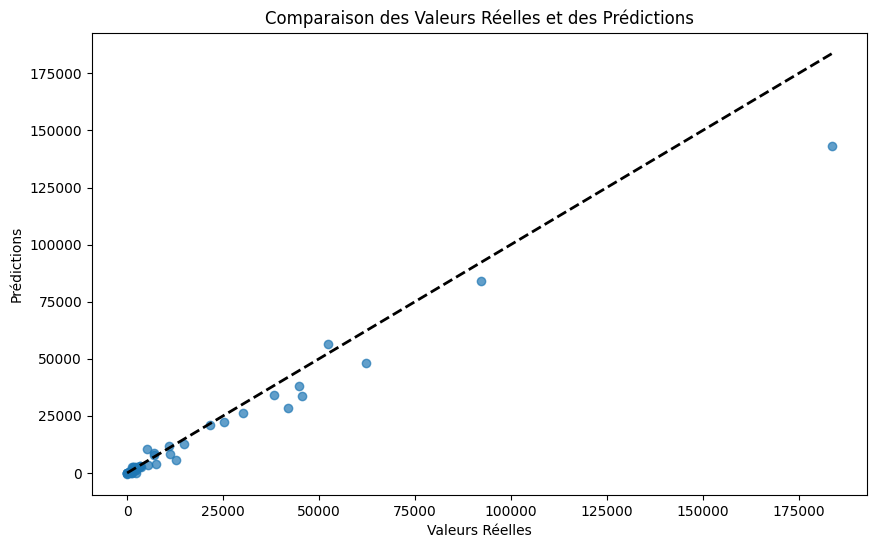

In [377]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_filtered, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test_filtered.min(), y_test_filtered.max()], [y_test_filtered.min(), y_test_filtered.max()], 'k--', lw=2)
plt.show()

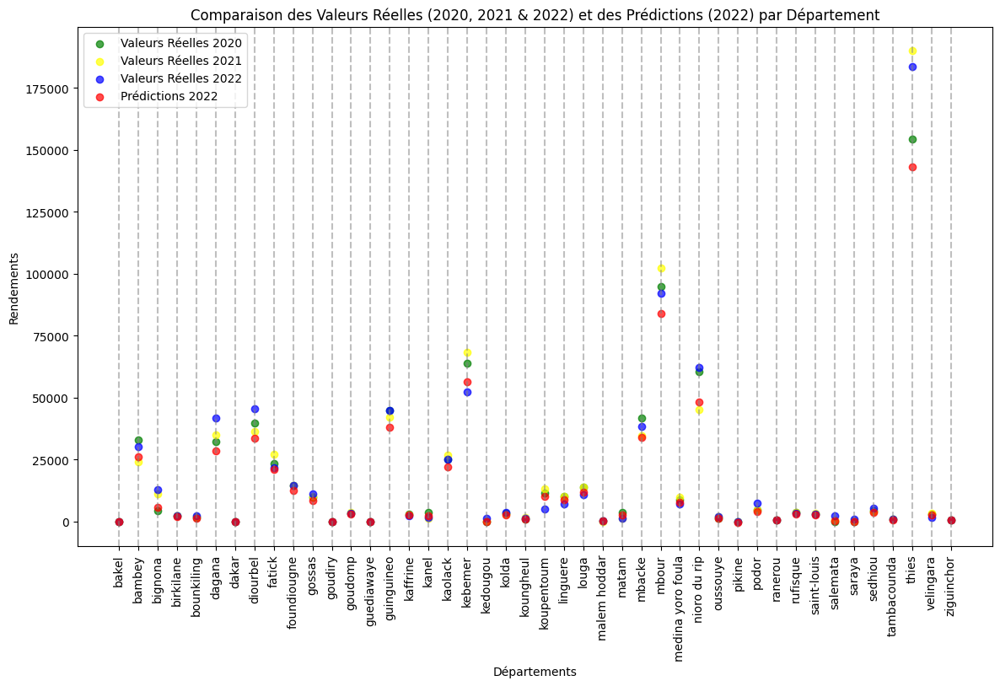

In [378]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que departments soit une liste avec les noms des départements
# y_test contient les valeurs réelles pour 2022
# y_pred contient les prédictions pour 2022
# y_train_2021 contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que departments, y_test, y_pred, et y_train_2021 sont alignés correctement
departments = all_data[all_data['Department'] != 'tivaouane']['Department'].unique()
# departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train_filtered['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train_filtered['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test_filtered, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

In [379]:
# Exclure Tivaouane et Thiès des données d'entraînement et de test

# train
X_train_filtered = X_train[~X_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
X_train_filtered = X_train_filtered[~X_train_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(X_train_filtered.shape)
y_train_filtered = y_train[~y_train.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
y_train_filtered = y_train_filtered[~y_train_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(y_train_filtered.shape)

# test
X_test_filtered = X_test[~X_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
X_test_filtered = X_test_filtered[~X_test_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(X_test_filtered.shape)
y_test_filtered = y_test[~y_test.index.isin(all_data[all_data['Department'] == 'tivaouane'].index)]
y_test_filtered = y_test_filtered[~y_test_filtered.index.isin(all_data[all_data['Department'] == 'thies'].index)]
print(y_test_filtered.shape)

(43, 72)
(43, 2)
(43, 36)
(43,)


In [380]:
print(y_train_filtered)

       Yield2020      Yield2021
0       0.000000       0.000000
1   33070.078130   24149.717780
2    4530.680559   11302.923710
3    2419.952018    2380.042446
4    1683.389084    1914.000000
5   32222.564850   34865.197130
6       0.000000       0.000000
7   39881.557350   36400.000000
8   23257.639830   27123.515280
9   14662.356710   14709.800000
10   9838.947888    9990.000000
11      0.000000       0.000000
12   3217.768174    3749.156695
13      0.000000       0.000000
14  44747.500000   42223.500000
15   3058.336496    2779.325262
16   3701.250000    1200.000000
17  25170.000000   26848.000000
18  63794.609610   68333.264750
19      0.000000     315.400000
20   3228.320700    3050.000000
21    893.374140    1562.222124
22  11478.862320   13077.494160
23  10304.448000   10319.400000
24  13928.088000   13818.000000
25    134.269511      84.385896
26   3725.654625    1243.000000
27  41638.908250   34560.000000
28  94824.521000  102235.000000
29   8725.584572    9709.312958
30  6048

In [381]:
# Reformater les données sans Tivaouane et Thies

# train
X_train_filtered_scaled = scaler.fit_transform(X_train_filtered)
print(X_train_filtered_scaled.shape)
X_train_filtered_scaled = X_train_filtered_scaled.reshape(2, X_train_filtered_scaled.shape[1] // 2, X_train_filtered_scaled.shape[0])
print(X_train_filtered_scaled.shape)

# test
X_test_filtered_scaled = scaler.fit_transform(X_test_filtered)
print(X_test_filtered_scaled.shape)
X_test_filtered_scaled = X_test_filtered_scaled.reshape(1, X_test_filtered_scaled.shape[1], X_test_filtered_scaled.shape[0])
print(X_test_filtered_scaled.shape)

(43, 72)
(2, 36, 43)
(43, 36)
(1, 36, 43)


In [387]:
# Autre modèle de réseau de neurones
# sans Tivaouane et Thies

import torch
import torch.nn as nn

class SimpleNN3_fc_sans_tiv_thies(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc_sans_tiv_thies, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 43)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x


In [388]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_filtered_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc_sans_tiv_thies(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [389]:
# Initialiser le modèle et les tenseurs avec les nouvelles données filtrées

# train
X_train_tensor = torch.tensor(X_train_filtered_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_filtered.values, dtype=torch.float32)

# test
X_test_tensor = torch.tensor(X_test_filtered_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_filtered.values, dtype=torch.float32)



In [390]:
# Entraînement du modèle avec les données sans Tivaouane
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    outputs = outputs.squeeze()
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 558258240.0000
Epoch [20/400], Loss: 217199120.0000
Epoch [30/400], Loss: 38864652.0000
Epoch [40/400], Loss: 14612679.0000
Epoch [50/400], Loss: 6676264.0000
Epoch [60/400], Loss: 4687605.0000
Epoch [70/400], Loss: 3265739.2500
Epoch [80/400], Loss: 2482898.0000
Epoch [90/400], Loss: 943517.8750
Epoch [100/400], Loss: 102320.5547
Epoch [110/400], Loss: 90255.7109
Epoch [120/400], Loss: 25059.8379
Epoch [130/400], Loss: 6843.0996
Epoch [140/400], Loss: 4292.2339
Epoch [150/400], Loss: 781.8785
Epoch [160/400], Loss: 583.6069
Epoch [170/400], Loss: 263.2067
Epoch [180/400], Loss: 168.3361
Epoch [190/400], Loss: 453.1913
Epoch [200/400], Loss: 53.5246
Epoch [210/400], Loss: 219.3355
Epoch [220/400], Loss: 246.5067
Epoch [230/400], Loss: 202.9592
Epoch [240/400], Loss: 453.9553
Epoch [250/400], Loss: 615.2265
Epoch [260/400], Loss: 1743.0793
Epoch [270/400], Loss: 576.7156
Epoch [280/400], Loss: 1612.0603
Epoch [290/400], Loss: 617.8157
Epoch [300/400], Loss: 1115.81

In [391]:
# Évaluer le modèle comme avant
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


Test Loss: 11335661.0000


In [392]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

mae = mean_absolute_error(y_test_filtered, y_pred)
mse = mean_squared_error(y_test_filtered, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test_filtered, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')



Mean Absolute Error (MAE): 1973.8306
Mean Squared Error (MSE): 11335659.4181
Root Mean Squared Error (RMSE): 3366.8471
R-squared (R²): 0.9726


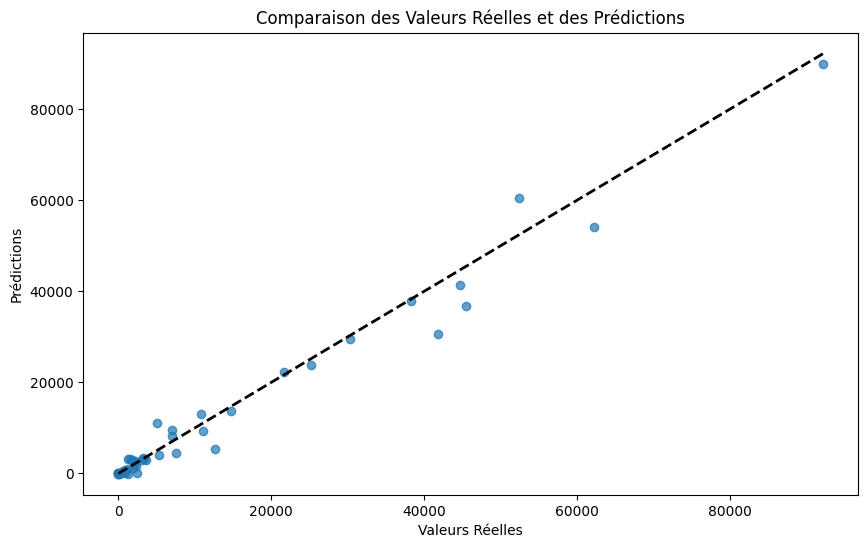

In [393]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_filtered, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test_filtered.min(), y_test_filtered.max()], [y_test_filtered.min(), y_test_filtered.max()], 'k--', lw=2)
plt.show()

Les performances sont sensiblement les mêmes. Notons déjà qu'elles étaient quasi-excellentes même sans ajout de couches.

C:\Users\ADIE\AppData\Local\Temp\ipykernel_6152\3334320944.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  departments = all_data[all_data['Department'] != 'tivaouane'][all_data['Department'] != 'thies']['Department'].unique()


(43,)


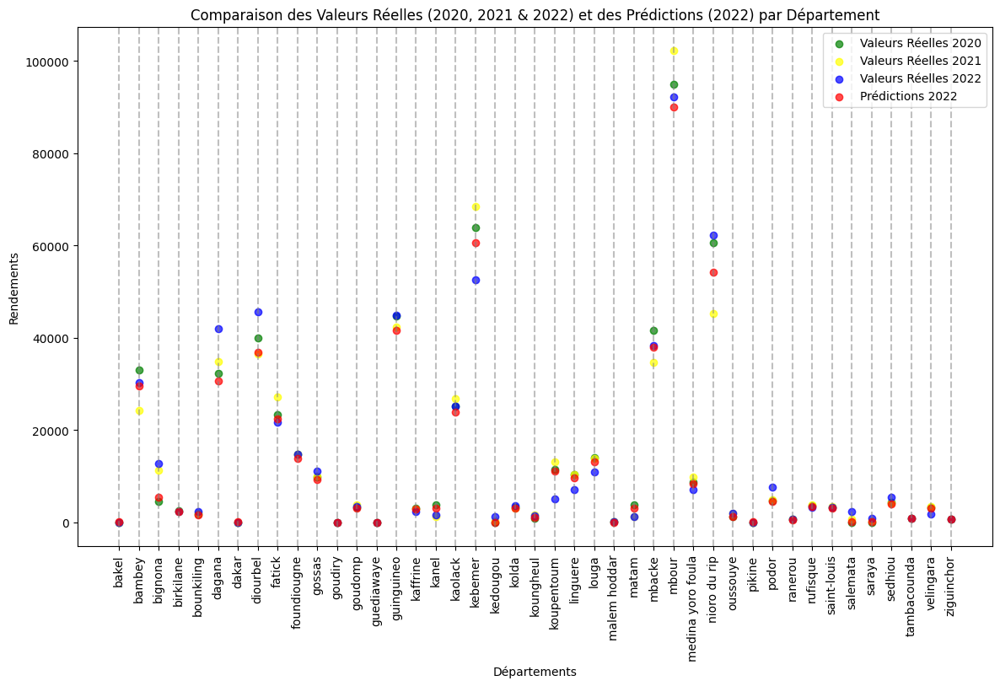

In [395]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que departments soit une liste avec les noms des départements
# y_test contient les valeurs réelles pour 2022
# y_pred contient les prédictions pour 2022
# y_train_2021 contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que departments, y_test, y_pred, et y_train_2021 sont alignés correctement
departments = all_data[all_data['Department'] != 'tivaouane'][all_data['Department'] != 'thies']['Department'].unique()
# departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train_filtered['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train_filtered['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test_filtered, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

## Sorgho

A présent, nous passons à une nouvelle culture, le sorgho. La spécifité de ctte culture est qu'elle n'est pas aussi importante globalement, en tonnage, que le riz ou l'arachide par exemple, mais sa production est assez homogène sur l'ensemble du territoire. Nous nous en rendrons compte en cisualisant la carte de production que nous chargerons dans les quelques cellules qui viennent.

In [204]:
# sorgho

import pandas as pd

# Charger le fichier Excel
file_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\yields\sorgho.csv"
data = pd.read_csv(file_path)

# Afficher les premières lignes des données
print(data.head())

# Afficher les informations générales sur les données
print(data.info())



                 Region       SN            SN-DK  SN-DK-RU  \
0           Region Name  SENEGAL  REGION DE DAKAR  RUFISQUE   
1  Region - Description      NaN              NaN       NaN   
2     Region - RegionId       SN            SN-DK  SN-DK-RU   
3               Culture      SOR              SOR       SOR   
4          Culture Name   SORGHO           SORGHO    SORGHO   

                SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK  \
0  REGION DE DIOURBEL    BAMBEY  DIOURBEL    MBACKE  REGION DE FATICK   
1                 NaN       NaN       NaN       NaN               NaN   
2               SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK   
3                 SOR       SOR       SOR       SOR               SOR   
4              SORGHO    SORGHO    SORGHO    SORGHO            SORGHO   

   SN-FK-FD  ...    SN-TC-KO     SN-TC-TD            SN-TH  SN-TH-MB  \
0    FATICK  ...  KOUPENTOUM  TAMBACOUNDA  REGION DE THIES     MBOUR   
1       NaN  ...         NaN          

In [205]:
# Transposer le DataFrame
data_transposed = data.transpose()

# Liste des indices des colonnes à supprimer
columns_to_drop_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

# Supprimer les colonnes spécifiées du DataFrame transposé
data_cleaned = data_transposed.drop(columns_to_drop_indices, axis=1)


# Afficher les premières lignes du DataFrame nettoyé
print(data_cleaned.head(10))


                          0            18           19           20  \
Region           Region Name         2017         2018         2019   
SN                   SENEGAL  215490.8552  283710.9191  270168.3095   
SN-DK        REGION DE DAKAR        169.5          NaN            0   
SN-DK-RU            RUFISQUE        169.5          NaN          NaN   
SN-DB     REGION DE DIOURBEL    9482.9185   11752.1884      13762.5   
SN-DB-BA              BAMBEY    6183.1295         7225       9562.5   
SN-DB-DD            DIOURBEL      1247.87    1647.1884         1500   
SN-DB-MB              MBACKE     2051.919         2880         2700   
SN-FK       REGION DE FATICK       9135.6     10210.91      14215.6   
SN-FK-FD              FATICK       2457.7      2703.47       3368.4   

                   21           22           23  
Region           2020         2021         2022  
SN        377322.8625  352474.3363  363163.6224  
SN-DK             NaN            0          NaN  
SN-DK-RU          

In [206]:
sorgho=data_cleaned

sorgho.head()

sorgho.rename(columns={0: 'Region Name'}, inplace=True)

sorgho.head()

,Region Name,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,215490.8552,283710.9191,270168.3095,377322.8625,352474.3363,363163.6224
SN-DK,REGION DE DAKAR,169.5,NaN,0,NaN,0,NaN
SN-DK-RU,RUFISQUE,169.5,NaN,NaN,NaN,0,NaN
SN-DB,REGION DE DIOURBEL,9482.9185,11752.1884,13762.5,14888.57975,10227.38943,12278.97271


In [207]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
sorgho = sorgho[~sorgho['Region Name'].str.startswith('REGION')]

# Vérifier le changement
print(sorgho)

# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
sorgho = sorgho[~sorgho['Region Name'].str.startswith('SENEGAL')]

# Vérifier le changement
print(sorgho)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN                  SENEGAL  215490.8552  283710.9191  270168.3095   
SN-DK-RU           RUFISQUE        169.5          NaN          NaN   
SN-DB-BA             BAMBEY    6183.1295         7225       9562.5   
SN-DB-DD           DIOURBEL      1247.87    1647.1884         1500   
SN-DB-MB             MBACKE     2051.919         2880         2700   
SN-FK-FD             FATICK       2457.7      2703.47       3368.4   
SN-FK-FO        FOUNDIOUGNE         4713      4147.44       6607.2   
SN-FK-GO             GOSSAS       1964.9         3360         4240   
SN-KA-BI          BIRKILANE     9761.727   10737.8997        12350   
SN-KA-KA           KAFFRINE    20168.792     22392.37        19800   
SN-KA-KO          KOUNGHEUL   22879.6974  26088.43545        25800   
SN-KA-MO       MALEM HODDAR       9687.5        19200      18918.4   
SN-KL-GU         GUI

In [208]:
# Créer un DataFrame pour les nouvelles lignes
new_rows = pd.DataFrame({
    'Region Name': ['DAKAR', 'GUEDIAWAYE', 'PIKINE'],
    18: [0, 0, 0],
    19: [0, 0, 0],
    20: [0, 0, 0],
    21: [0, 0, 0],
    22: [0, 0, 0],
    23: [0, 0, 0]
})

# Ajouter les nouvelles lignes en haut du DataFrame existant
sorgho = pd.concat([new_rows, sorgho], ignore_index=True)

# Vérifier le changement
print(sorgho)

          Region Name           18           19          20           21  \
0               DAKAR            0            0           0            0   
1          GUEDIAWAYE            0            0           0            0   
2              PIKINE            0            0           0            0   
3         Region Name         2017         2018        2019         2020   
4            RUFISQUE        169.5          NaN         NaN          NaN   
5              BAMBEY    6183.1295         7225      9562.5  7810.979748   
6            DIOURBEL      1247.87    1647.1884        1500       2757.6   
7              MBACKE     2051.919         2880        2700         4320   
8              FATICK       2457.7      2703.47      3368.4  7280.477251   
9         FOUNDIOUGNE         4713      4147.44      6607.2     7937.844   
10             GOSSAS       1964.9         3360        4240      5764.08   
11          BIRKILANE     9761.727   10737.8997       12350    23001.993   
12          

In [209]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
sorgho = sorgho[~sorgho['Region Name'].str.startswith('Region Name')]

# Vérifier le changement
print(sorgho)



          Region Name           18           19          20           21  \
0               DAKAR            0            0           0            0   
1          GUEDIAWAYE            0            0           0            0   
2              PIKINE            0            0           0            0   
4            RUFISQUE        169.5          NaN         NaN          NaN   
5              BAMBEY    6183.1295         7225      9562.5  7810.979748   
6            DIOURBEL      1247.87    1647.1884        1500       2757.6   
7              MBACKE     2051.919         2880        2700         4320   
8              FATICK       2457.7      2703.47      3368.4  7280.477251   
9         FOUNDIOUGNE         4713      4147.44      6607.2     7937.844   
10             GOSSAS       1964.9         3360        4240      5764.08   
11          BIRKILANE     9761.727   10737.8997       12350    23001.993   
12           KAFFRINE    20168.792     22392.37       19800    25574.811   
13          

In [210]:
sorgho.rename(columns={18: 2017}, inplace=True)
sorgho.rename(columns={19: 2018}, inplace=True)
sorgho.rename(columns={20: 2019}, inplace=True)
sorgho.rename(columns={21: 2020}, inplace=True)
sorgho.rename(columns={22: 2021}, inplace=True)
sorgho.rename(columns={23: 2022}, inplace=True)

print(sorgho)

          Region Name         2017         2018        2019         2020  \
0               DAKAR            0            0           0            0   
1          GUEDIAWAYE            0            0           0            0   
2              PIKINE            0            0           0            0   
4            RUFISQUE        169.5          NaN         NaN          NaN   
5              BAMBEY    6183.1295         7225      9562.5  7810.979748   
6            DIOURBEL      1247.87    1647.1884        1500       2757.6   
7              MBACKE     2051.919         2880        2700         4320   
8              FATICK       2457.7      2703.47      3368.4  7280.477251   
9         FOUNDIOUGNE         4713      4147.44      6607.2     7937.844   
10             GOSSAS       1964.9         3360        4240      5764.08   
11          BIRKILANE     9761.727   10737.8997       12350    23001.993   
12           KAFFRINE    20168.792     22392.37       19800    25574.811   
13          

In [211]:
# Remplacer les NaN par 0
sorgho.fillna(0, inplace=True)

print(sorgho)


          Region Name         2017         2018        2019         2020  \
0               DAKAR            0            0           0            0   
1          GUEDIAWAYE            0            0           0            0   
2              PIKINE            0            0           0            0   
4            RUFISQUE        169.5            0           0            0   
5              BAMBEY    6183.1295         7225      9562.5  7810.979748   
6            DIOURBEL      1247.87    1647.1884        1500       2757.6   
7              MBACKE     2051.919         2880        2700         4320   
8              FATICK       2457.7      2703.47      3368.4  7280.477251   
9         FOUNDIOUGNE         4713      4147.44      6607.2     7937.844   
10             GOSSAS       1964.9         3360        4240      5764.08   
11          BIRKILANE     9761.727   10737.8997       12350    23001.993   
12           KAFFRINE    20168.792     22392.37       19800    25574.811   
13          

In [212]:
# Liste des noms des départements correspondant à l'ordre des géométries dans le GeoDataFrame
noms_departements = [
    'DAKAR', 'GUEDIAWAYE', 'PIKINE', 'RUFISQUE',
    'BAMBEY', 'DIOURBEL', 'MBACKE',
    'FATICK', 'FOUNDIOUGNE', 'GOSSAS',
    'BIRKILANE', 'KAFFRINE', 'KOUNGHEUL', 'MALEM HODDAR',
    'GUINGUINEO', 'KAOLACK', 'NIORO DU RIP',
    'KEDOUGOU', 'SALEMATA', 'SARAYA',
    'KOLDA', 'MEDINA YORO FOULA', 'VELINGARA',
    'KEBEMER', 'LINGUERE', 'LOUGA', 
    'KANEL', 'MATAM', 'RANEROU', 
    'DAGANA', 'PODOR', 'SAINT-LOUIS',
    'BOUNKILING', 'GOUDOMP', 'SEDHIOU',
    'BAKEL', 'GOUDIRY', 'KOUPENTOUM', 'TAMBACOUNDA',
    'MBOUR', 'THIES', 'TIVAOUANE',
    'BIGNONA', 'OUSSOUYE', 'ZIGUINCHOR'
]

# Vérifier que le nombre de noms correspond au nombre de géométries
print(len(noms_departements), len(gdf))

# Ajouter la colonne des noms des départements au GeoDataFrame
gdf['Region Name'] = noms_departements

# Afficher les premières lignes pour vérifier l'ajout
print(gdf.head())



45 45
                                            geometry Region Name
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY


In [213]:
# Fusionner les données
merged_gdf = gdf.merge(sorgho, on='Region Name')

# Afficher les premières lignes pour vérifier la fusion
print(merged_gdf.head())

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)



                                            geometry Region Name       2017  \
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR          0   
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE          0   
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE          0   
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE      169.5   
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY  6183.1295   

   2018    2019         2020         2021        2022  
0     0       0            0            0           0  
1     0       0            0            0           0  
2     0       0            0            0           0  
3     0       0            0            0           0  
4  7225  9562.5  7810.979748  5974.999266  7888.37453  
2017    object
2018    object
2019    object
2020    object
2021    object
2022    object
dtype: object


In [214]:
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    merged_gdf[year] = pd.to_numeric(merged_gdf[year], errors='coerce')

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)


2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
2022    float64
dtype: object


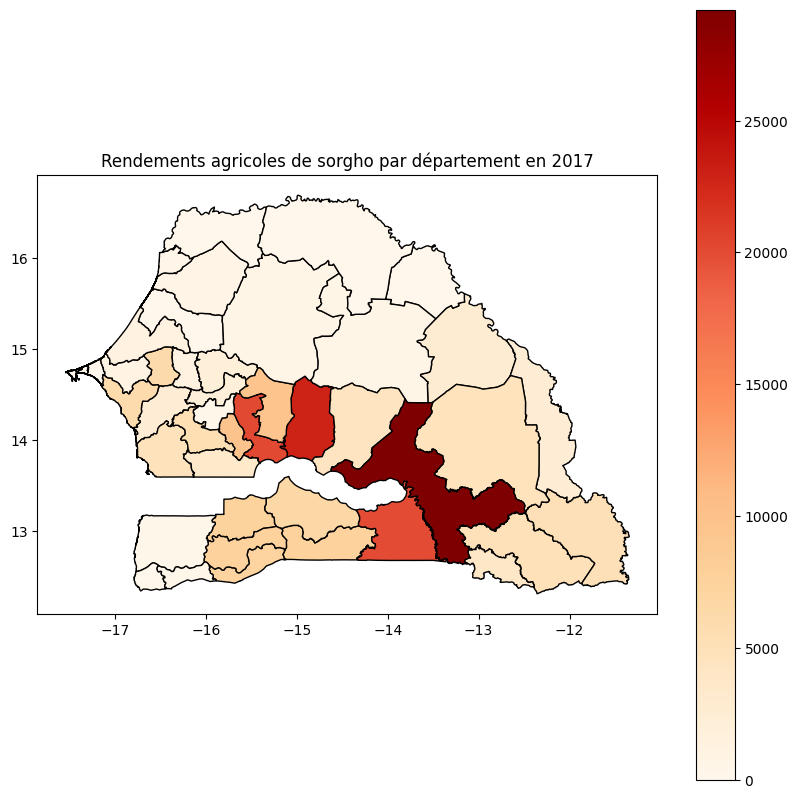

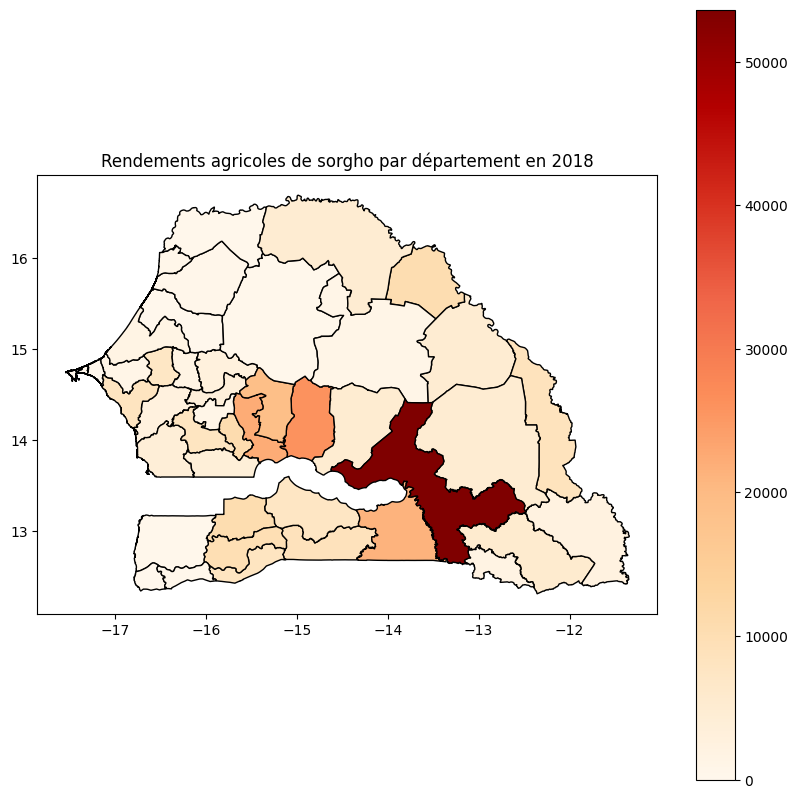

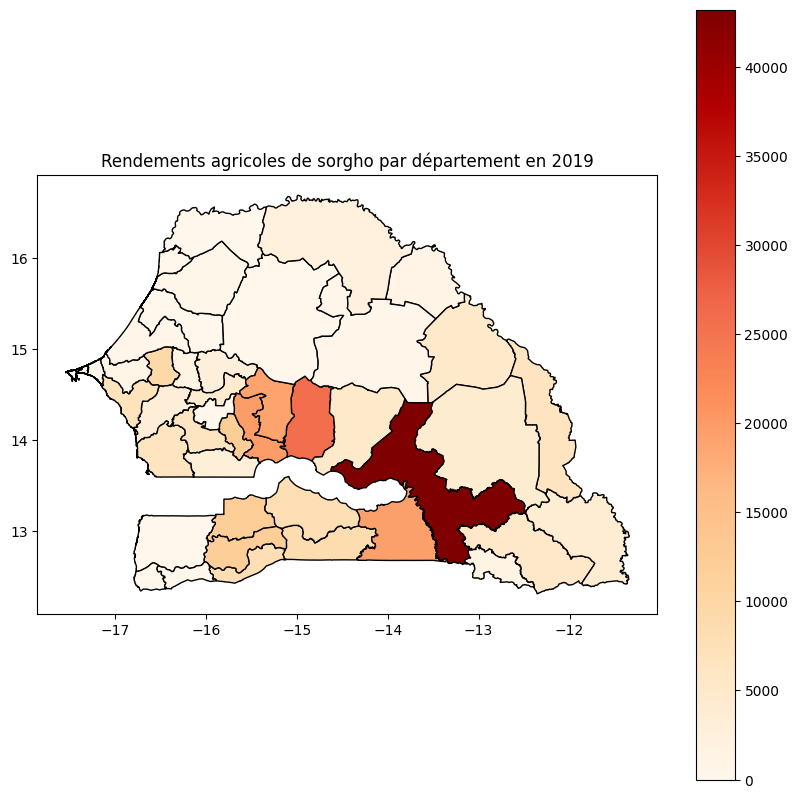

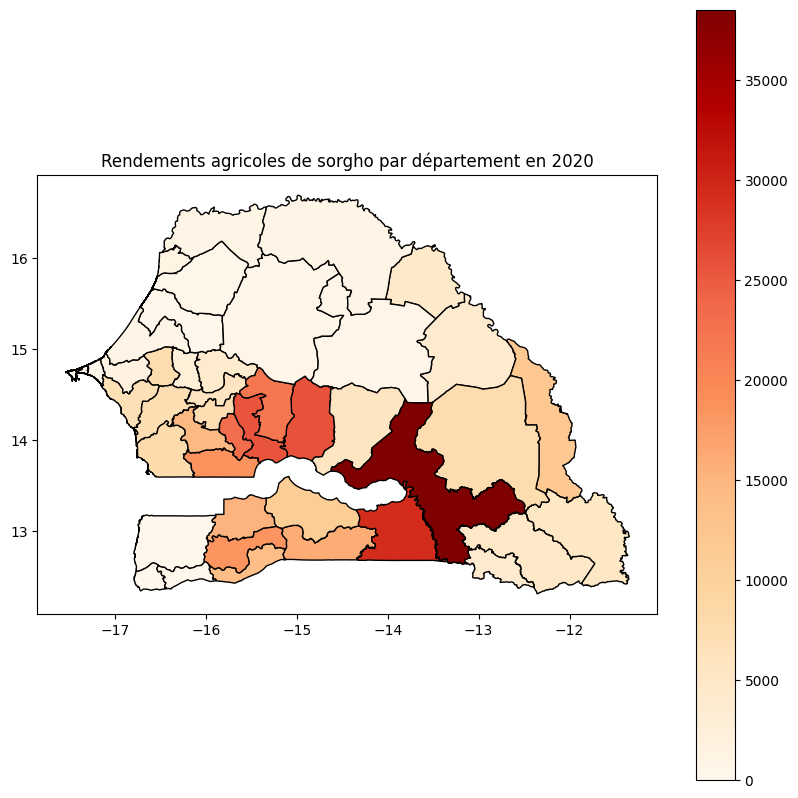

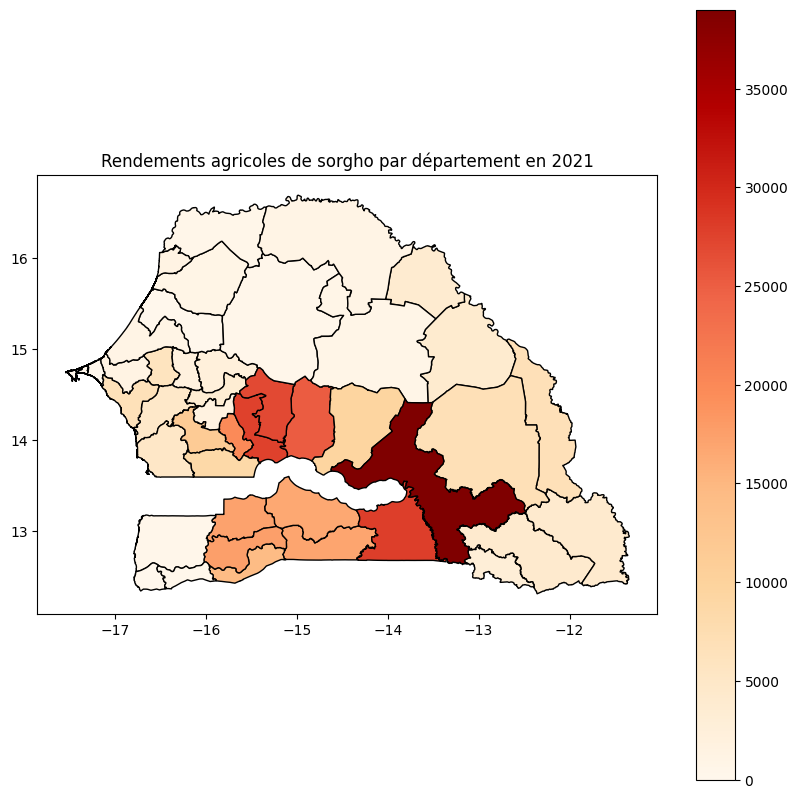

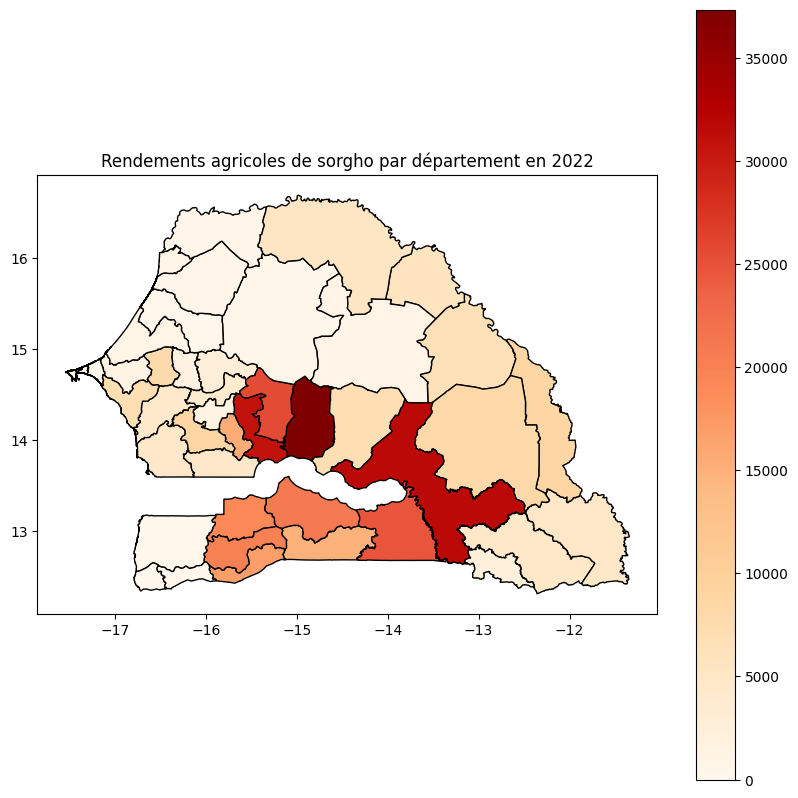

In [215]:
years = [2017, 2018, 2019, 2020, 2021, 2022]

for year in years:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    merged_gdf.plot(column=year, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
    plt.title(f'Rendements agricoles de sorgho par département en {year}')
    plt.show()


# adaptation au sorgho. Assez homogène, plus que le manioc en tout cas

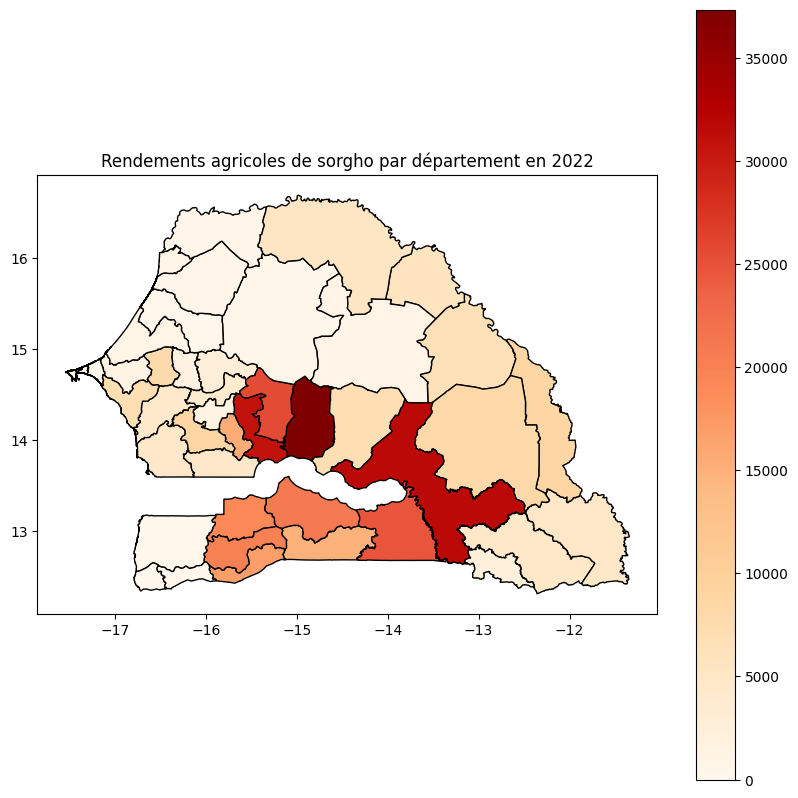

In [216]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
merged_gdf.plot(column=2022, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
plt.title(f'Rendements agricoles de sorgho par département en 2022')
plt.show()

Comme je l'ai dit plus haut, nous voyons que la production de sorgho est assez homogène. Elle est quand même plus présente dans la moitié sud du pays, du bassin arachidier vers la Casamance en passant par le Sénégal oriental.

In [412]:
import geopandas as gpd

# Exemple d'initialisation si ce n'est pas déjà fait
# merged_gdf = gpd.read_file('path_to_your_geodatafile.shp')

# Tri du GeoDataFrame par ordre alphabétique de la colonne 'Region Name'
merged_gdf_sorted = merged_gdf.sort_values(by='Region Name').reset_index(drop=True)

# Afficher le GeoDataFrame trié
print(merged_gdf_sorted.head())



                                            geometry Region Name         2017  \
0  POLYGON ((-12.06774 13.70753, -12.06079 13.700...       BAKEL  2424.102531   
1  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY  6183.129500   
2  POLYGON ((-15.99612 12.82992, -15.99748 12.829...     BIGNONA   283.293760   
3  POLYGON ((-15.55763 13.86664, -15.55969 13.865...   BIRKILANE  9761.727000   
4  POLYGON ((-15.85103 13.18076, -15.82677 13.180...  BOUNKILING  7423.080000   

           2018        2019          2020          2021          2022  
0   8529.674029   6513.3250  11912.696250   6813.423917   8866.789324  
1   7225.000000   9562.5000   7810.979748   5974.999266   7888.374530  
2    319.286000    297.5000    247.277618    307.135822    249.267859  
3  10737.899700  12350.0000  23001.993000  19871.523320  15539.785960  
4  10502.800000  12246.2648  15342.701000  17370.570380  19094.605860  


In [413]:

# Vérifiez la cohérence des noms de départements
ndvi_global['Department'] = ndvi_global['Department'].str.lower()
landtemp_global['Department'] = landtemp_global['Department'].str.lower()
rainfall_global['Department'] = rainfall_global['Department'].str.lower()
merged_gdf_sorted['Region Name'] = merged_gdf_sorted['Region Name'].str.lower()


In [414]:
merged_gdf_sorted

,geometry,Region Name,2017,2018,2019,2020,2021,2022
0,"POLYGON ((-12.06774 13.70753, -12.06079 13.700...",bakel,2424.102531,8529.674029,6513.32500,11912.696250,6813.423917,8866.789324
1,"POLYGON ((-16.52628 14.60573, -16.52672 14.605...",bambey,6183.129500,7225.000000,9562.50000,7810.979748,5974.999266,7888.374530
2,"POLYGON ((-15.99612 12.82992, -15.99748 12.829...",bignona,283.293760,319.286000,297.50000,247.277618,307.135822,249.267859
3,"POLYGON ((-15.55763 13.86664, -15.55969 13.865...",birkilane,9761.727000,10737.899700,12350.00000,23001.993000,19871.523320,15539.785960
4,"POLYGON ((-15.85103 13.18076, -15.82677 13.180...",bounkiling,7423.080000,10502.800000,12246.26480,15342.701000,17370.570380,19094.605860
5,"POLYGON ((-15.44986 15.91898, -15.45394 15.916...",dagana,210.127187,385.000000,281.25000,708.750000,460.732049,579.784515
6,"MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...",dakar,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
7,"POLYGON ((-16.10407 14.80849, -16.09813 14.808...",diourbel,1247.870000,1647.188400,1500.00000,2757.600000,1855.535662,1524.605400
8,"POLYGON ((-16.72214 13.99249, -16.72281 13.992...",fatick,2457.700000,2703.470000,3368.40000,7280.477251,4754.161718,4314.527541
9,"MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...",foundiougne,4713.000000,4147.440000,6607.20000,7937.844000,5126.390057,4617.942000


In [415]:
# Fusionner les features avec les données de rendements
def prepare_features(year):
    ndvi_year = ndvi_global.loc[str(year)].reset_index(drop=True)
    # print(ndvi_year)
    lst_year = landtemp_global.loc[str(year)].reset_index(drop=True)
    rainfall_year = rainfall_global.loc[str(year)].reset_index(drop=True)

    # Fusionner les features sur le nom du département
    # temp = ndvi_year.merge(lst_year, on='Department', suffixes=(str(year)+'_ndvi', str(year)+'_lst'))
    # features = temp.merge(rainfall_year, on='Department', suffixes=('_', str(year)+'_rain'))
    features = ndvi_year.merge(lst_year.merge(rainfall_year, on='Department', suffixes=(str(year)+'_lst', str(year)+'_rain')), on='Department').rename(columns = {'Jan': 'Jan'+str(year)+'_ndvi', 'Feb': 'Feb'+str(year)+'_ndvi', 'Mar': 'Mar'+str(year)+'_ndvi', 'Apr': 'Apr'+str(year)+'_ndvi', 'May': 'May'+str(year)+'_ndvi', 'Jun': 'Jun'+str(year)+'_ndvi', 'Jul': 'Jul'+str(year)+'_ndvi', 'Aug': 'Aug'+str(year)+'_ndvi', 'Sept': 'Sept'+str(year)+'_ndvi', 'Oct': 'Oct'+str(year)+'_ndvi', 'Nov': 'Nov'+str(year)+'_ndvi', 'Dec': 'Dec'+str(year)+'_ndvi'})
    # print(features)
    
    # Ajouter les données de rendements pour l'année donnée
    yields = merged_gdf_sorted[['Region Name', year]].rename(columns={'Region Name': 'Department', year: 'Yield'+str(year)})
    # print(yields)
    
    #print(yields.columns.tolist())
    #print(features.columns.tolist())
    
    # Joindre les rendements avec les features
    data = features.merge(yields, on='Department')
    # print(data)

    return data



In [416]:
# Préparer les données pour toutes les années disponibles
data_2020 = prepare_features(2020)
data_2021 = prepare_features(2021)
data_2022 = prepare_features(2022)
# print(data_2020)


In [417]:
# Concaténer toutes les données pour un ensemble complet
all_data = pd.concat([data_2020, data_2021, data_2022], ignore_index=False, axis=1)

# Afficher le DataFrame résultant
print(all_data)
print(all_data.columns)

    Jan2020_ndvi  Feb2020_ndvi  Mar2020_ndvi  Apr2020_ndvi  May2020_ndvi  \
0       0.261373      0.243739      0.223248      0.217857      0.212408   
1       0.226884      0.220627      0.207836      0.196056      0.187545   
2       0.450318      0.367808      0.325922      0.307612      0.306105   
3       0.239233      0.227222      0.214794      0.199590      0.188848   
4       0.371602      0.293450      0.277845      0.269917      0.272437   
5       0.198287      0.198479      0.193791      0.213732      0.217972   
6       0.150289      0.142762      0.135471      0.131776      0.123340   
7       0.224278      0.215301      0.202208      0.191190      0.182863   
8       0.208799      0.203343      0.194405      0.187499      0.184056   
9       0.314511      0.294715      0.271235      0.253902      0.253502   
10      0.225760      0.215473      0.202012      0.190561      0.180744   
11      0.279911      0.256492      0.238674      0.238304      0.234552   
12      0.50

In [418]:
print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Department', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', '

In [419]:
all_data = all_data.loc[:,~all_data.columns.duplicated()].copy()

print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [420]:
len(all_data.columns.tolist())

112

In [421]:
# shift column 'Name' to first position 
first_column = all_data.pop('Department') 
  
# insert column using insert(position,column_name, 
# first_column) function 
all_data.insert(0, 'Department', first_column) 

In [422]:
len(all_data.columns.tolist())

112

In [423]:
print(all_data.columns.tolist())


['Department', 'Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

Ci-après le fichier global avec toutes les données concaténées, les features ainsi que les productions agricoles.

In [424]:
all_data


,Department,Jan2020_ndvi,Feb2020_ndvi,Mar2020_ndvi,Apr2020_ndvi,May2020_ndvi,Jun2020_ndvi,Jul2020_ndvi,Aug2020_ndvi,Sept2020_ndvi,...,Apr2022_rain,May2022_rain,Jun2022_rain,Jul2022_rain,Aug2022_rain,Sept2022_rain,Oct2022_rain,Nov2022_rain,Dec2022_rain,Yield2022
0,bakel,0.261373,0.243739,0.223248,0.217857,0.212408,0.370194,0.512371,0.671292,0.651548,...,0.000000,0.866107,2.977087,4.399444,7.388785,7.243591,1.746660,0.005339,0.002446,8866.789324
1,bambey,0.226884,0.220627,0.207836,0.196056,0.187545,0.170401,0.284244,0.471026,0.562099,...,0.000000,0.050276,1.190531,4.575609,7.269067,8.766813,0.876772,0.022057,0.000000,7888.374530
2,bignona,0.450318,0.367808,0.325922,0.307612,0.306105,0.345220,0.481271,0.580475,0.679081,...,0.001169,0.608071,3.893955,10.892989,13.504675,11.673111,4.672372,0.037030,0.017494,249.267859
3,birkilane,0.239233,0.227222,0.214794,0.199590,0.188848,0.176756,0.351311,0.559009,0.672464,...,0.000000,0.226210,2.321544,5.137638,5.749611,8.109597,2.451720,0.026425,0.017775,15539.785960
4,bounkiling,0.371602,0.293450,0.277845,0.269917,0.272437,0.339902,0.588389,0.671528,0.773928,...,0.000000,0.853228,3.876809,6.081213,8.588116,8.855931,4.012135,0.030140,0.021445,19094.605860
5,dagana,0.198287,0.198479,0.193791,0.213732,0.217972,0.186565,0.272792,0.367371,0.431870,...,0.000000,0.000606,0.235756,1.521307,4.326585,3.253017,0.336511,0.013001,0.000266,579.784515
6,dakar,0.150289,0.142762,0.135471,0.131776,0.123340,0.099332,0.149810,0.235678,0.261945,...,0.000000,0.000000,0.601789,5.208088,8.485175,8.551696,2.164734,0.028748,0.000000,0.000000
7,diourbel,0.224278,0.215301,0.202208,0.191190,0.182863,0.169467,0.299093,0.500402,0.571452,...,0.000000,0.052294,1.467391,4.043882,6.940349,7.831623,1.002531,0.025236,0.000000,1524.605400
8,fatick,0.208799,0.203343,0.194405,0.187499,0.184056,0.170761,0.260488,0.424824,0.498386,...,0.000000,0.063905,1.686016,5.685575,7.903929,9.155368,1.517372,0.028964,0.001491,4314.527541
9,foundiougne,0.314511,0.294715,0.271235,0.253902,0.253502,0.255724,0.406952,0.534988,0.598463,...,0.000000,0.119529,2.147411,7.046733,9.530447,9.533622,2.394796,0.035448,0.014554,4617.942000


In [425]:
# Renommer les colonnes pour 2020, 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2020 = all_data.filter(regex='2020')
features_2020 = rename_features(features_2020, '2020')

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')



In [426]:
# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


In [427]:
# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

X_train_scaled.shape



(45, 72)

In [428]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, 36, 45)


X_train_scaled.shape

(2, 36, 45)

In [429]:
X_test_scaled.shape

(1, 36, 45)

In [430]:
# Autre modèle de réseau de neurones

class SimpleNN3(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=45, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(45)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [431]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [432]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [433]:
# Entraîner le modèle
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 95072648.0000
Epoch [20/400], Loss: 28287440.0000
Epoch [30/400], Loss: 14633175.0000
Epoch [40/400], Loss: 7591046.5000
Epoch [50/400], Loss: 4089999.0000
Epoch [60/400], Loss: 2146980.5000
Epoch [70/400], Loss: 1874613.3750
Epoch [80/400], Loss: 1533210.5000
Epoch [90/400], Loss: 1408050.0000
Epoch [100/400], Loss: 1297392.0000
Epoch [110/400], Loss: 1199566.8750
Epoch [120/400], Loss: 1052156.7500
Epoch [130/400], Loss: 816361.8750
Epoch [140/400], Loss: 606843.8750
Epoch [150/400], Loss: 457239.4375
Epoch [160/400], Loss: 162542.5469
Epoch [170/400], Loss: 57744.2383
Epoch [180/400], Loss: 8588.9883
Epoch [190/400], Loss: 13849.4639
Epoch [200/400], Loss: 8971.0996
Epoch [210/400], Loss: 21598.5234
Epoch [220/400], Loss: 414835.2812
Epoch [230/400], Loss: 213952.7344
Epoch [240/400], Loss: 75468.3047
Epoch [250/400], Loss: 19371.1719
Epoch [260/400], Loss: 18282.1074
Epoch [270/400], Loss: 9323.2363
Epoch [280/400], Loss: 125696.3906
Epoch [290/400], Loss: 710

In [434]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([45])
torch.Size([45])
Test Loss: 13029972.0000


In [435]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[[10594.547   ]
  [ 7283.8066  ]
  [   76.07388 ]
  [22251.078   ]
  [15851.249   ]
  [  379.85336 ]
  [  -50.151005]
  [ 2642.7847  ]
  [ 6575.012   ]
  [ 7143.211   ]
  [ 5102.419   ]
  [ 7324.8037  ]
  [14034.738   ]
  [  -80.47501 ]
  [ 5031.7964  ]
  [26250.225   ]
  [ 4015.1187  ]
  [13859.854   ]
  [  -51.847454]
  [ 4704.885   ]
  [16315.896   ]
  [25731.312   ]
  [ 6551.3037  ]
  [  272.4253  ]
  [  304.00732 ]
  [23320.146   ]
  [ 4240.664   ]
  [ 3815.3691  ]
  [ 6784.9497  ]
  [12578.407   ]
  [15833.212   ]
  [  -49.908382]
  [  -44.828728]
  [  636.76465 ]
  [  360.13647 ]
  [  -77.72073 ]
  [  942.7883  ]
  [ 3673.8044  ]
  [ 4954.601   ]
  [18287.227   ]
  [38785.008   ]
  [ 1484.0234  ]
  [  605.9062  ]
  [29129.36    ]
  [   87.25029 ]]]
Véritables valeurs: [ 8866.789324    7888.37453      249.2678588  15539.78596
 19094.60586      579.7845153      0.          1524.6054
  4314.527541    4617.942       3748.78968     8083.390806
 16978.47041        0.    

In [436]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [437]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 2190.5324
Mean Squared Error (MSE): 13029971.9763
Root Mean Squared Error (RMSE): 3609.7052
R-squared (R²): 0.8625


Nous appliquons dans un premier temps un modèle simple avec des couches de convolution et sans batch normalization. Les résultats sont plutôt corrects. Nous avons un ajustement de 86 %.

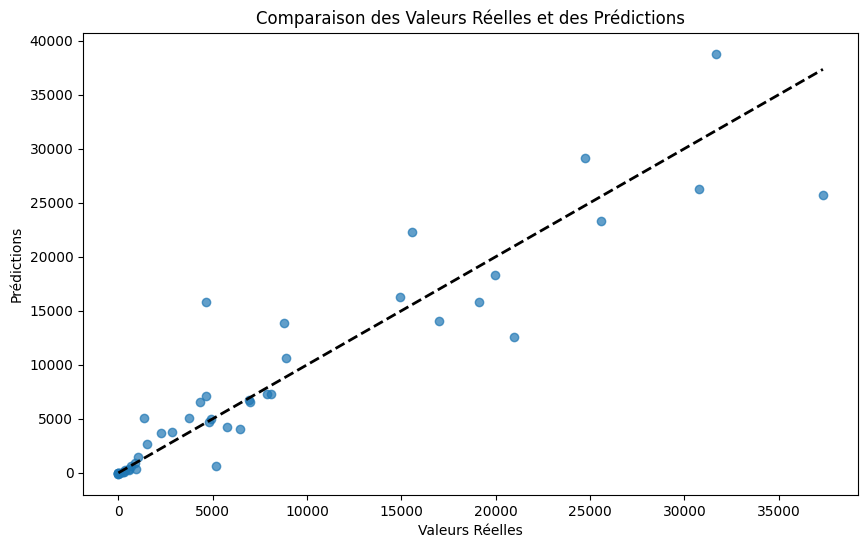

In [438]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

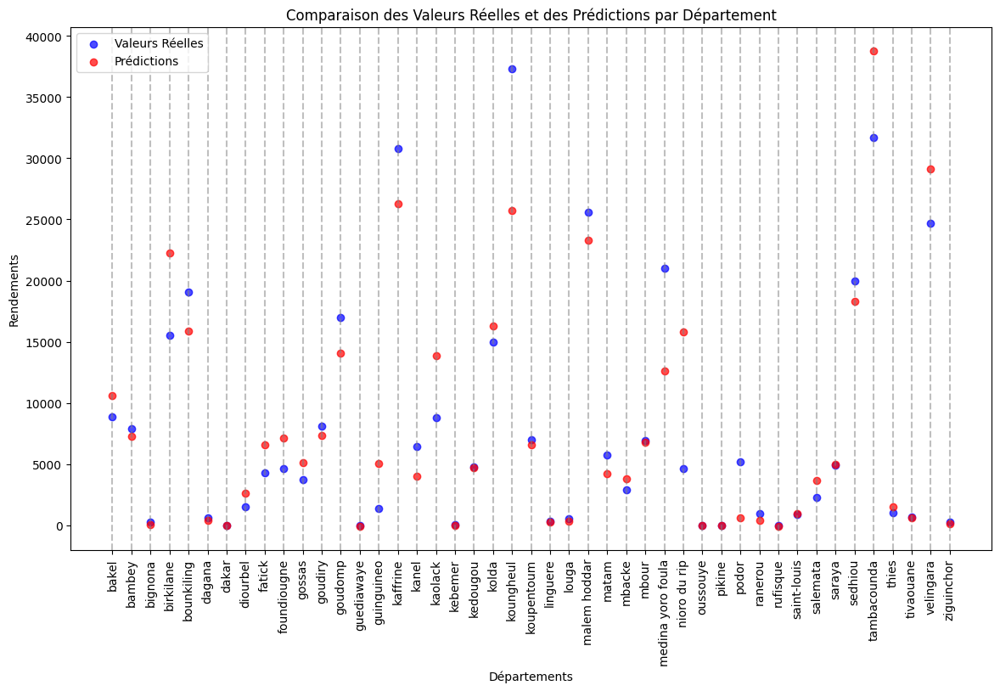

In [439]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Il faut noter que nous n'avons pas de département influent comme c'était le cas pour le manioc.

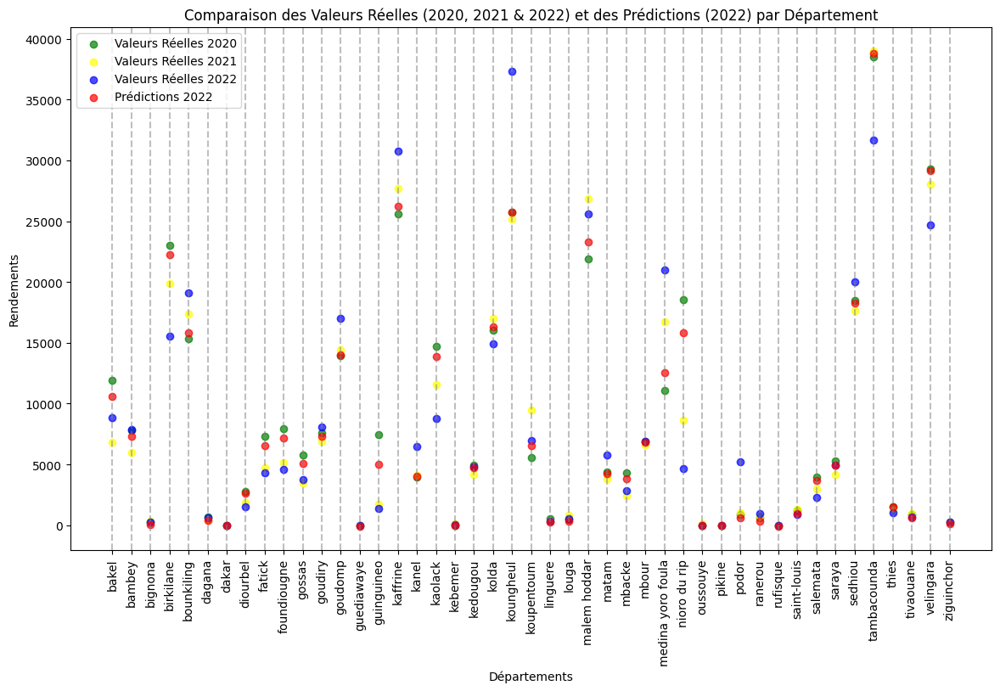

In [440]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Nous allons maintenant tester avec le modèle que j'avais appelé "fully_connected" afin de voir ce que nous obtenons comme résultat. Il s'agit du modèle où, en plus des couches de convolution, emploie des couches Relu et de batch normalization.

In [441]:
# Autre modèle de réseau de neurones


import torch
import torch.nn as nn

class SimpleNN3_fc(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 45)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x



In [495]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1.2)


36


In [496]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [497]:
# Entraîner le modèle
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 4208815.0000
Epoch [20/400], Loss: 4992249.5000
Epoch [30/400], Loss: 1974828.7500
Epoch [40/400], Loss: 1767039.1250
Epoch [50/400], Loss: 1055635.5000
Epoch [60/400], Loss: 223255.2188
Epoch [70/400], Loss: 112553.6875
Epoch [80/400], Loss: 9836.8320
Epoch [90/400], Loss: 14034.1143
Epoch [100/400], Loss: 1674.2352
Epoch [110/400], Loss: 1557.8348
Epoch [120/400], Loss: 463.4787
Epoch [130/400], Loss: 110.3531
Epoch [140/400], Loss: 85.5444
Epoch [150/400], Loss: 16.8959
Epoch [160/400], Loss: 5.7593
Epoch [170/400], Loss: 3.6936
Epoch [180/400], Loss: 0.3276
Epoch [190/400], Loss: 0.3544
Epoch [200/400], Loss: 0.1799
Epoch [210/400], Loss: 0.0338
Epoch [220/400], Loss: 0.0114
Epoch [230/400], Loss: 0.0083
Epoch [240/400], Loss: 0.0016
Epoch [250/400], Loss: 0.0005
Epoch [260/400], Loss: 0.0002
Epoch [270/400], Loss: 0.0001
Epoch [280/400], Loss: 0.0000
Epoch [290/400], Loss: 0.0000
Epoch [300/400], Loss: 0.0000
Epoch [310/400], Loss: 0.0000
Epoch [320/400], Los

In [498]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([45])
torch.Size([45])
Test Loss: 10093538.0000


In [499]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[6.7878096e+03 5.5736987e+03 2.7809299e+02 1.8113182e+04 1.5193944e+04
  4.5848734e+02 1.4188709e+01 1.7882622e+03 4.5840459e+03 4.9549990e+03
  3.3964072e+03 6.2048086e+03 1.2769894e+04 1.9103724e+01 2.3668433e+03
  2.4374037e+04 3.6379280e+03 1.0737508e+04 8.7941010e+01 3.7914482e+03
  1.5040914e+04 2.2506496e+04 7.8853159e+03 3.5889526e+02 6.8023730e+02
  2.3233520e+04 3.5003147e+03 2.4104009e+03 5.9167388e+03 1.4133171e+04
  9.0801221e+03 1.3252037e+02 1.3752800e+01 9.1592462e+02 6.4435718e+02
  1.9710291e+01 1.1671145e+03 2.7885542e+03 3.8849976e+03 1.5832753e+04
  3.4715395e+04 1.1596536e+03 8.3934424e+02 2.5158953e+04 2.5239139e+02]]
Véritables valeurs: [ 8866.789324    7888.37453      249.2678588  15539.78596
 19094.60586      579.7845153      0.          1524.6054
  4314.527541    4617.942       3748.78968     8083.390806
 16978.47041        0.          1370.653508   30794.786
  6454.106793    8774.7           71.39201144  4786.878051
 14945.16725    37340.66124 

In [500]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [4]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# est ce que c pas du surapprentissage ?
# j'essaie avec 200 epochs
# c'est encore pire
# et si je mets le lr à 1
# c mieux (0.85), et si je le mets à 1.2 ?
# 0.92 c bcp mieux
# je refais 2 exécutions voir si ça change bcp (est ce le hasard lol)
# 1: 0.8654
# 2: 0.8747
# bon c'était peut etre le hasard
# mais c quand meme tres bien
# maintenant je garde le 1.2 et je mets 300 epochs
# 0.8770
# 400 epochs ?
# 0.8935

# faudra vraiment que je fasse un apprentissage moyen, ça change de façon assez signifaicative entre les exécutions quand meme

NameError: name 'mean_absolute_error' is not defined

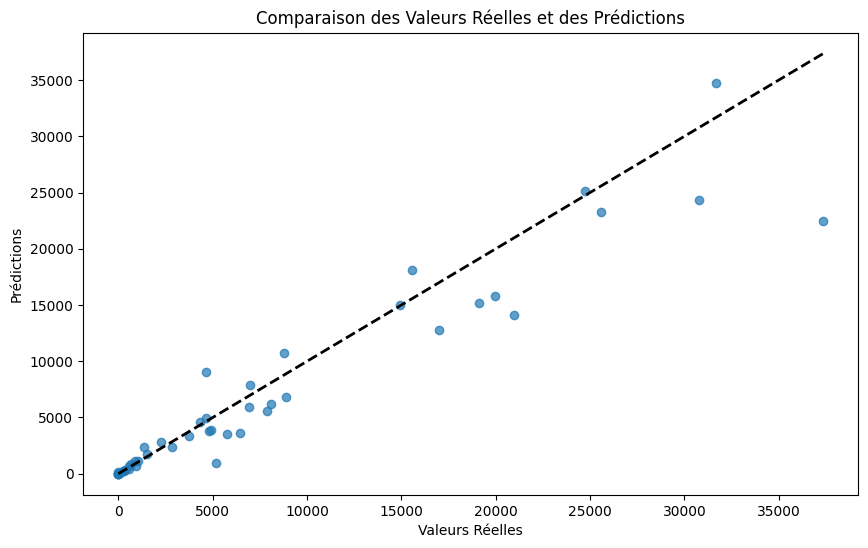

In [502]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()


# ajustement bon

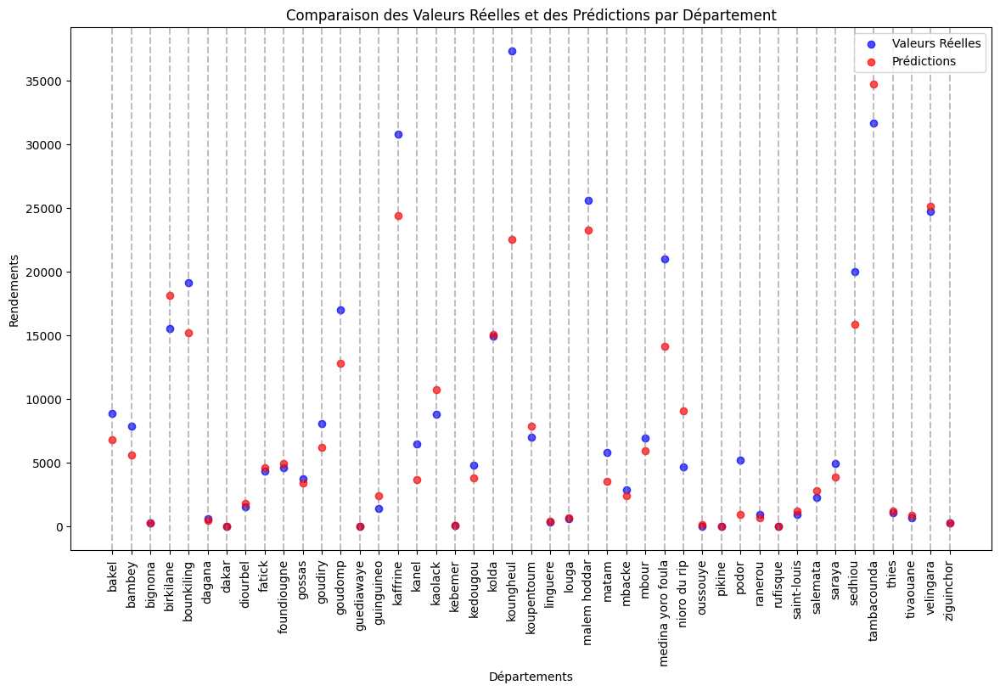

In [503]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

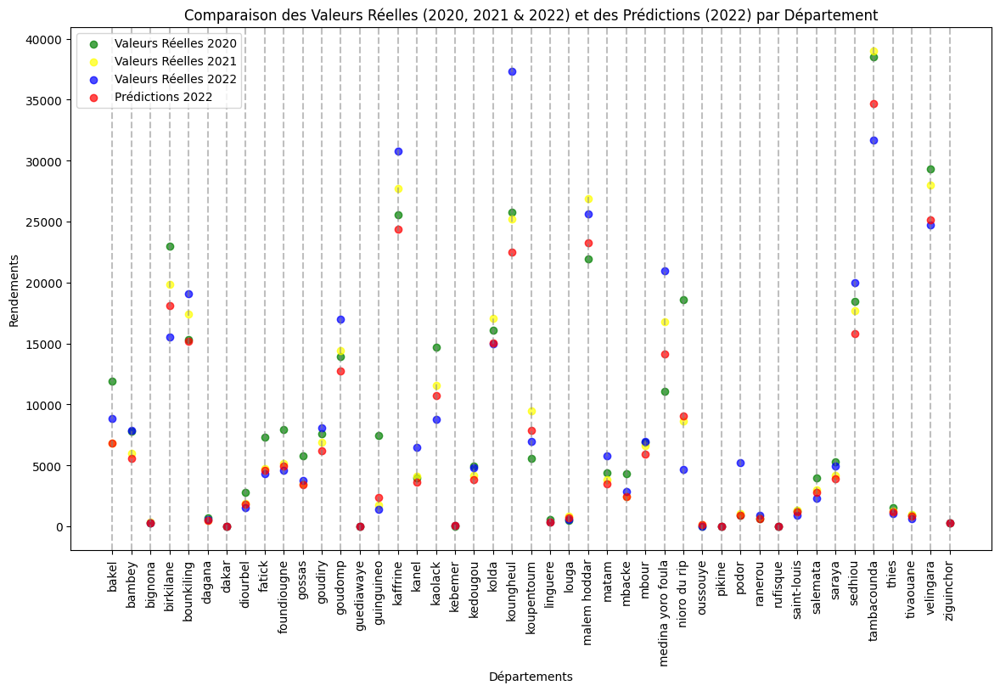

In [504]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()


# bonnes prédictions

Sans faire beaucoup plus d'efforts, les prédictions du modèle atteignent un taux d'ajustement très correct. Nous allons nous arrêter là.


Nous allons maintenant passer à une culture très consommée au Sénégal, le riz. Le pays n'est pas encore auto-suffisant en riz mais est sur la voie.

## Riz

Un premier modèle non élaboré où je laisse tous les départements où y'a des nan, et je mets des 0 à la place

In [614]:
# Chargement riz

import pandas as pd

# Charger le fichier Excel
file_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\yields\riz.csv"
data = pd.read_csv(file_path)

# Afficher les premières lignes des données
print(data.head())

# Afficher les informations générales sur les données
print(data.info())



                 Region       SN            SN-DK  SN-DK-RU  \
0           Region Name  SENEGAL  REGION DE DAKAR  RUFISQUE   
1  Region - Description      NaN              NaN       NaN   
2     Region - RegionId       SN            SN-DK  SN-DK-RU   
3               Culture      RIZ              RIZ       RIZ   
4          Culture Name      RIZ              RIZ       RIZ   

                SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK  \
0  REGION DE DIOURBEL    BAMBEY  DIOURBEL    MBACKE  REGION DE FATICK   
1                 NaN       NaN       NaN       NaN               NaN   
2               SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK   
3                 RIZ       RIZ       RIZ       RIZ               RIZ   
4                 RIZ       RIZ       RIZ       RIZ               RIZ   

   SN-FK-FD  ...    SN-TC-KO     SN-TC-TD            SN-TH  SN-TH-MB  \
0    FATICK  ...  KOUPENTOUM  TAMBACOUNDA  REGION DE THIES     MBOUR   
1       NaN  ...         NaN          

In [615]:
# Transposer le DataFrame
data_transposed = data.transpose()

# Liste des indices des colonnes à supprimer
columns_to_drop_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

# Supprimer les colonnes spécifiées du DataFrame transposé
data_cleaned = data_transposed.drop(columns_to_drop_indices, axis=1)


# Afficher les premières lignes du DataFrame nettoyé
print(data_cleaned.head(10))


                          0            18           19           20  \
Region           Region Name         2017         2018         2019   
SN                   SENEGAL  1014052.934  1156307.482  1155730.281   
SN-DK        REGION DE DAKAR          NaN          NaN            0   
SN-DK-RU            RUFISQUE          NaN          NaN          NaN   
SN-DB     REGION DE DIOURBEL    121.37559          NaN            0   
SN-DB-BA              BAMBEY          NaN          NaN          NaN   
SN-DB-DD            DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB              MBACKE  7.254340524          NaN          NaN   
SN-FK       REGION DE FATICK  12898.17798         7400    9780.4268   
SN-FK-FD              FATICK         6282          NaN    4284.0044   

                   21           22           23  
Region           2020         2021         2022  
SN        1349723.012  1346145.681  1409119.986  
SN-DK             NaN            0          NaN  
SN-DK-RU          

In [616]:
riz=data_cleaned

riz.head()

riz.rename(columns={0: 'Region Name'}, inplace=True)

riz.head()

,Region Name,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,1014052.934,1156307.482,1155730.281,1349723.012,1346145.681,1409119.986
SN-DK,REGION DE DAKAR,NaN,NaN,0,NaN,0,NaN
SN-DK-RU,RUFISQUE,NaN,NaN,NaN,NaN,0,NaN
SN-DB,REGION DE DIOURBEL,121.37559,NaN,0,NaN,0,NaN


In [617]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('REGION')]

# Vérifier le changement
print(riz)

# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('SENEGAL')]

# Vérifier le changement
print(riz)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN                  SENEGAL  1014052.934  1156307.482  1155730.281   
SN-DK-RU           RUFISQUE          NaN          NaN          NaN   
SN-DB-BA             BAMBEY          NaN          NaN          NaN   
SN-DB-DD           DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB             MBACKE  7.254340524          NaN          NaN   
SN-FK-FD             FATICK         6282          NaN    4284.0044   
SN-FK-FO        FOUNDIOUGNE         6300         7400    5496.4224   
SN-FK-GO             GOSSAS  316.1779815          NaN          NaN   
SN-KA-BI          BIRKILANE  202.6585293          NaN        77.44   
SN-KA-KA           KAFFRINE   314.792915  288.6019106      110.322   
SN-KA-KO          KOUNGHEUL  175.0791663          NaN       30.312   
SN-KA-MO       MALEM HODDAR      106.766          NaN         30.6   
SN-KL-GU         GUI

Comme depuis le début de notre travail, les productions pour les départements de Dakar, Pikine et Guédiawaye ne sont pas rensiegnées. Nous les rajoutons.

In [618]:
# Créer un DataFrame pour les nouvelles lignes
new_rows = pd.DataFrame({
    'Region Name': ['DAKAR', 'GUEDIAWAYE', 'PIKINE'],
    18: [0, 0, 0],
    19: [0, 0, 0],
    20: [0, 0, 0],
    21: [0, 0, 0],
    22: [0, 0, 0],
    23: [0, 0, 0]
})

# Ajouter les nouvelles lignes en haut du DataFrame existant
riz = pd.concat([new_rows, riz], ignore_index=True)

# Vérifier le changement
print(riz)

          Region Name           18           19           20           21  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
3         Region Name         2017         2018         2019         2020   
4            RUFISQUE          NaN          NaN          NaN          NaN   
5              BAMBEY          NaN          NaN          NaN          NaN   
6            DIOURBEL  114.1212495          NaN          NaN          NaN   
7              MBACKE  7.254340524          NaN          NaN          NaN   
8              FATICK         6282          NaN    4284.0044   7418.32173   
9         FOUNDIOUGNE         6300         7400    5496.4224     9772.218   
10             GOSSAS  316.1779815          NaN          NaN            0   
11          BIRKILANE  202.6585293          NaN        77.44  207.5416233   

In [619]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('Region Name')]

# Vérifier le changement
print(riz)



          Region Name           18           19           20           21  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE          NaN          NaN          NaN          NaN   
5              BAMBEY          NaN          NaN          NaN          NaN   
6            DIOURBEL  114.1212495          NaN          NaN          NaN   
7              MBACKE  7.254340524          NaN          NaN          NaN   
8              FATICK         6282          NaN    4284.0044   7418.32173   
9         FOUNDIOUGNE         6300         7400    5496.4224     9772.218   
10             GOSSAS  316.1779815          NaN          NaN            0   
11          BIRKILANE  202.6585293          NaN        77.44  207.5416233   
12           KAFFRINE   314.792915  288.6019106      110.322   194.649606   

In [620]:
riz.rename(columns={18: 2017}, inplace=True)
riz.rename(columns={19: 2018}, inplace=True)
riz.rename(columns={20: 2019}, inplace=True)
riz.rename(columns={21: 2020}, inplace=True)
riz.rename(columns={22: 2021}, inplace=True)
riz.rename(columns={23: 2022}, inplace=True)

print(riz)

          Region Name         2017         2018         2019         2020  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE          NaN          NaN          NaN          NaN   
5              BAMBEY          NaN          NaN          NaN          NaN   
6            DIOURBEL  114.1212495          NaN          NaN          NaN   
7              MBACKE  7.254340524          NaN          NaN          NaN   
8              FATICK         6282          NaN    4284.0044   7418.32173   
9         FOUNDIOUGNE         6300         7400    5496.4224     9772.218   
10             GOSSAS  316.1779815          NaN          NaN            0   
11          BIRKILANE  202.6585293          NaN        77.44  207.5416233   
12           KAFFRINE   314.792915  288.6019106      110.322   194.649606   

In [627]:
# ['Region Name'][2020][2021][2022]
print(riz[['Region Name', 2020, 2021, 2022]])

          Region Name         2020         2021         2022
0               DAKAR            0            0            0
1          GUEDIAWAYE            0            0            0
2              PIKINE            0            0            0
4            RUFISQUE          NaN            0          NaN
5              BAMBEY          NaN            0          NaN
6            DIOURBEL          NaN            0          NaN
7              MBACKE          NaN            0          NaN
8              FATICK   7418.32173    5596.6624     6053.025
9         FOUNDIOUGNE     9772.218  7988.326228     7984.404
10             GOSSAS            0            0          NaN
11          BIRKILANE  207.5416233            0            0
12           KAFFRINE   194.649606  199.0522251  250.8774014
13          KOUNGHEUL  82.61748133            0   321.029692
14       MALEM HODDAR  77.20441372   59.8579788  76.46114205
15         GUINGUINEO          NaN            0          NaN
16            KAOLACK  6

Quand on regarde les données de plus près, on se rend compte qu'il y a des évolutions brusques d'une année à une autre, plus que pour les autres cultures. Ces évolutions ne sont peut-être pas expliquées systématiquement par les features dont l'on dispose. Il faudrait un modèle plus large.



In [512]:
# Remplacer les NaN par 0
riz.fillna(0, inplace=True)

print(riz)


          Region Name         2017         2018         2019         2020  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
4            RUFISQUE            0            0            0            0   
5              BAMBEY            0            0            0            0   
6            DIOURBEL  114.1212495            0            0            0   
7              MBACKE  7.254340524            0            0            0   
8              FATICK         6282            0    4284.0044   7418.32173   
9         FOUNDIOUGNE         6300         7400    5496.4224     9772.218   
10             GOSSAS  316.1779815            0            0            0   
11          BIRKILANE  202.6585293            0        77.44  207.5416233   
12           KAFFRINE   314.792915  288.6019106      110.322   194.649606   

In [513]:
# Liste des noms des départements correspondant à l'ordre des géométries dans le GeoDataFrame
noms_departements = [
    'DAKAR', 'GUEDIAWAYE', 'PIKINE', 'RUFISQUE',
    'BAMBEY', 'DIOURBEL', 'MBACKE',
    'FATICK', 'FOUNDIOUGNE', 'GOSSAS',
    'BIRKILANE', 'KAFFRINE', 'KOUNGHEUL', 'MALEM HODDAR',
    'GUINGUINEO', 'KAOLACK', 'NIORO DU RIP',
    'KEDOUGOU', 'SALEMATA', 'SARAYA',
    'KOLDA', 'MEDINA YORO FOULA', 'VELINGARA',
    'KEBEMER', 'LINGUERE', 'LOUGA', 
    'KANEL', 'MATAM', 'RANEROU', 
    'DAGANA', 'PODOR', 'SAINT-LOUIS',
    'BOUNKILING', 'GOUDOMP', 'SEDHIOU',
    'BAKEL', 'GOUDIRY', 'KOUPENTOUM', 'TAMBACOUNDA',
    'MBOUR', 'THIES', 'TIVAOUANE',
    'BIGNONA', 'OUSSOUYE', 'ZIGUINCHOR'
]

# Vérifier que le nombre de noms correspond au nombre de géométries
print(len(noms_departements), len(gdf))

# Ajouter la colonne des noms des départements au GeoDataFrame
gdf['Region Name'] = noms_departements

# Afficher les premières lignes pour vérifier l'ajout
print(gdf.head())



45 45
                                            geometry Region Name
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY


In [514]:
# Fusionner les données
merged_gdf = gdf.merge(riz, on='Region Name')

# Afficher les premières lignes pour vérifier la fusion
print(merged_gdf.head())

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)



                                            geometry Region Name 2017 2018  \
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR    0    0   
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE    0    0   
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE    0    0   
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE    0    0   
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY    0    0   

  2019 2020 2021 2022  
0    0    0    0    0  
1    0    0    0    0  
2    0    0    0    0  
3    0    0    0    0  
4    0    0    0    0  
2017    object
2018    object
2019    object
2020    object
2021    object
2022    object
dtype: object


In [515]:
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    merged_gdf[year] = pd.to_numeric(merged_gdf[year], errors='coerce')

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)


2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
2022    float64
dtype: object


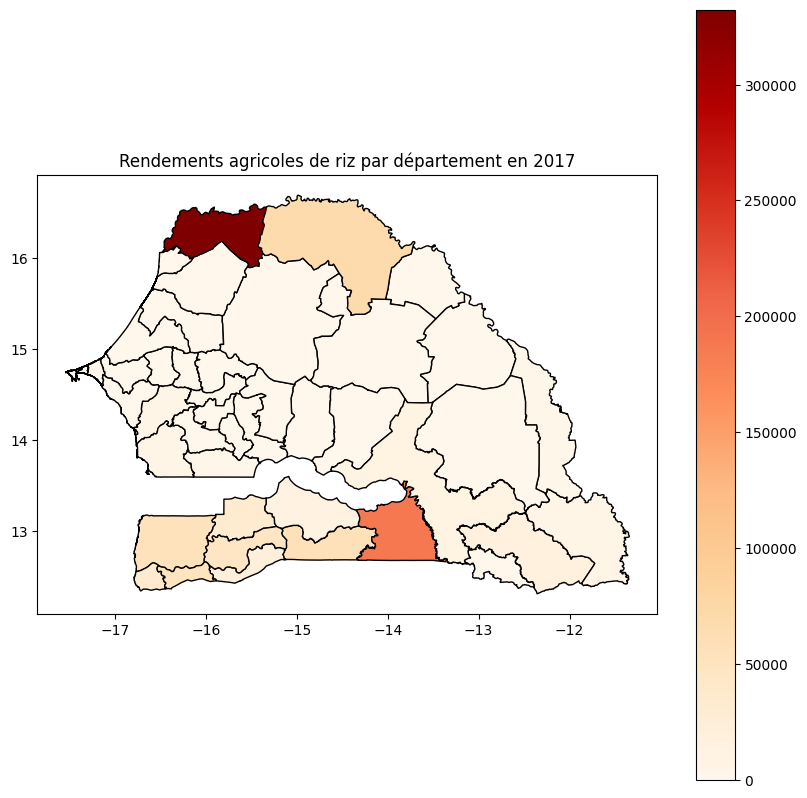

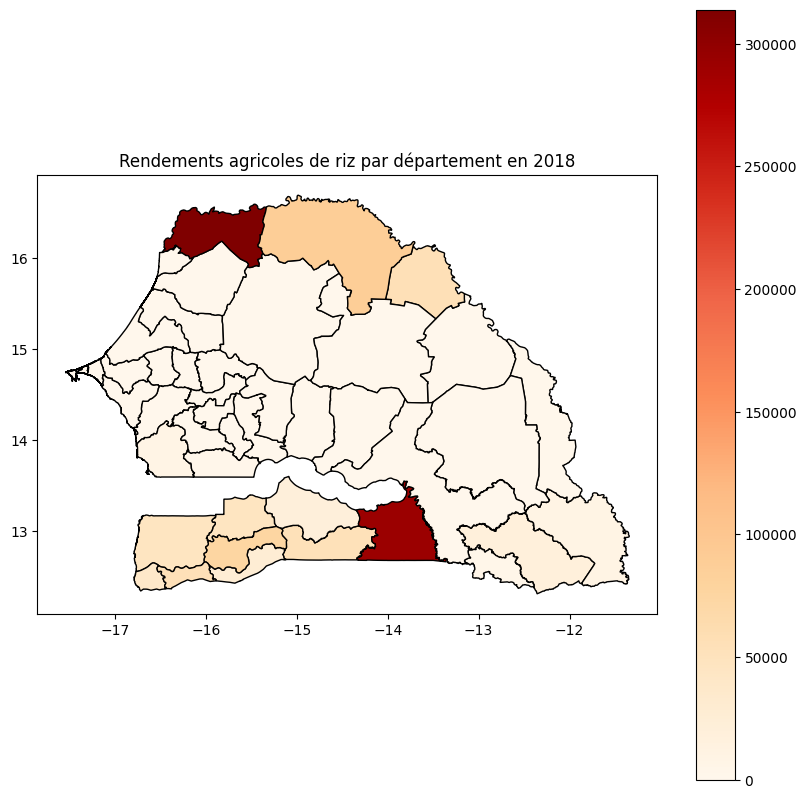

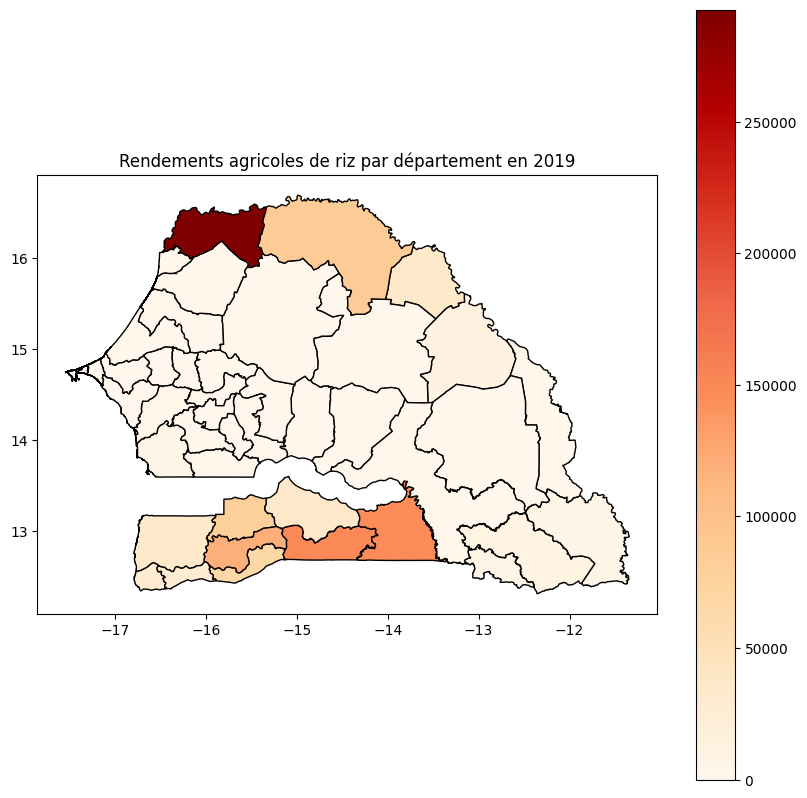

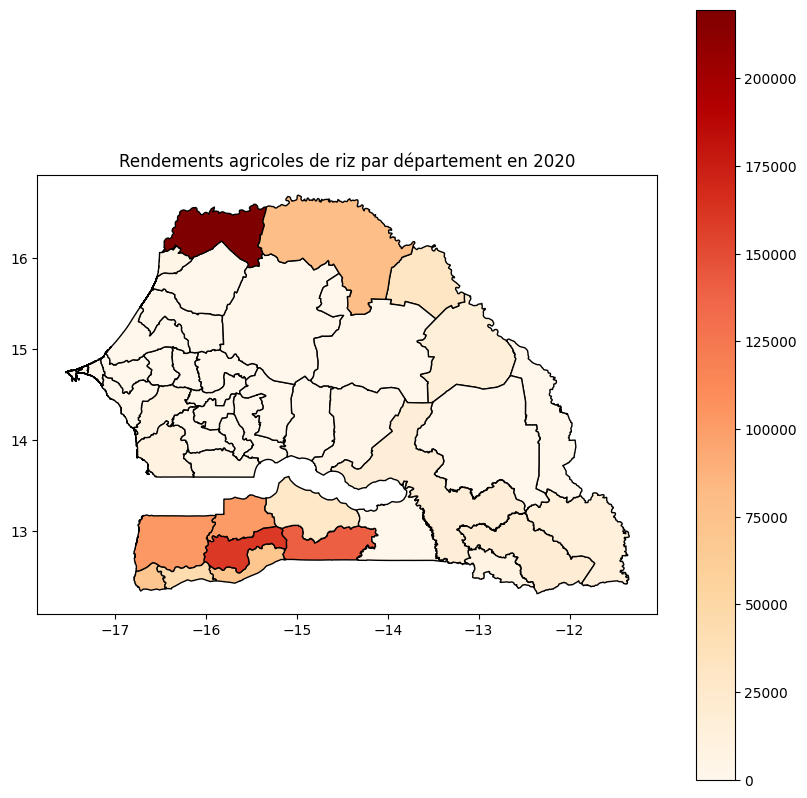

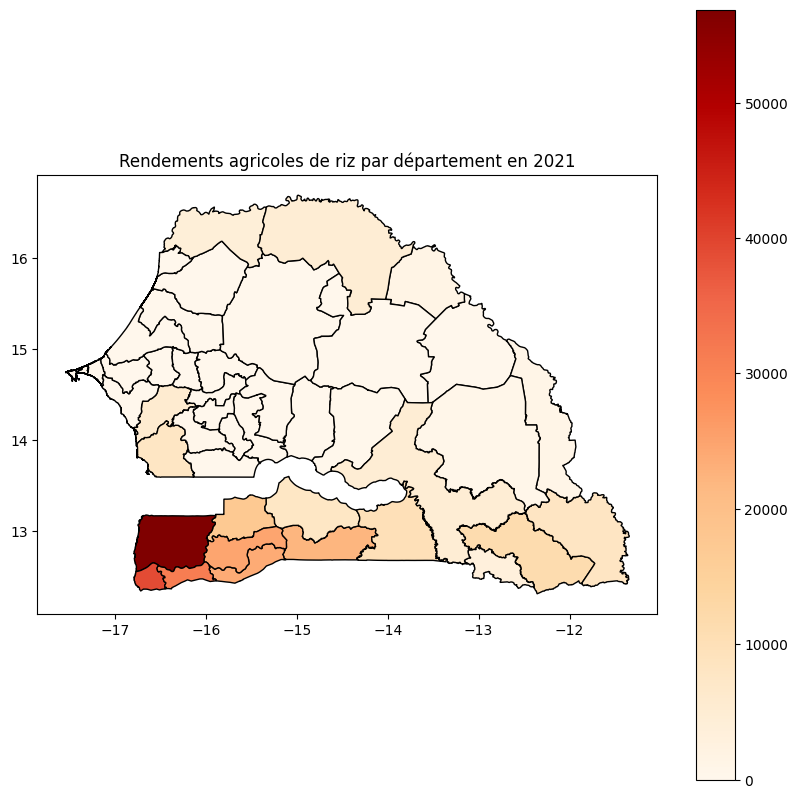

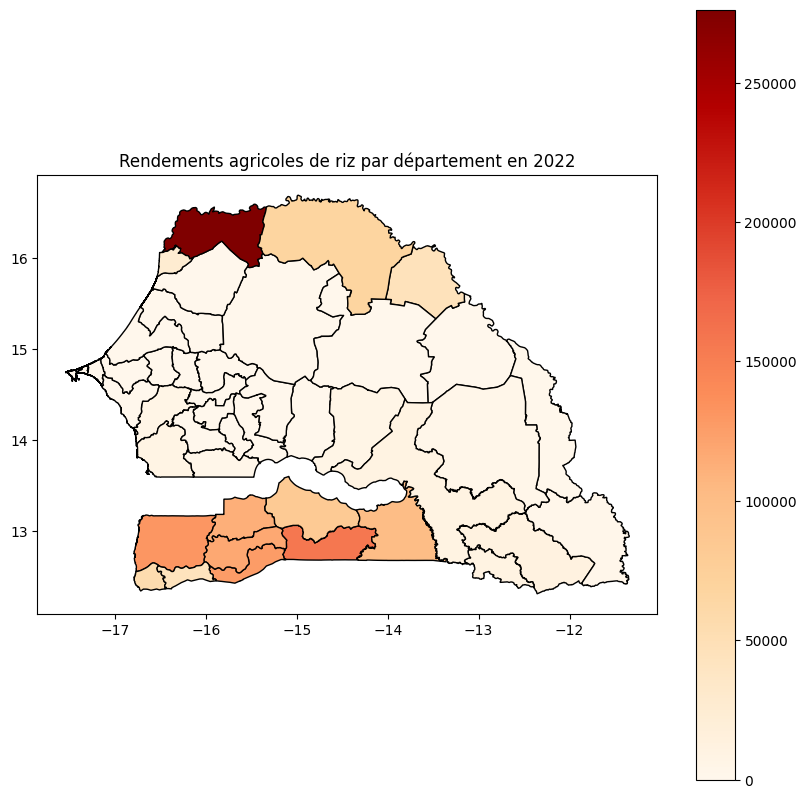

In [516]:
years = [2017, 2018, 2019, 2020, 2021, 2022]

for year in years:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    merged_gdf.plot(column=year, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
    plt.title(f'Rendements agricoles de riz par département en {year}')
    plt.show()


    
# on passe au riz. Là c'est très hétérogène

In [520]:
import geopandas as gpd

# Exemple d'initialisation si ce n'est pas déjà fait
# merged_gdf = gpd.read_file('path_to_your_geodatafile.shp')

# Tri du GeoDataFrame par ordre alphabétique de la colonne 'Region Name'
merged_gdf_sorted = merged_gdf.sort_values(by='Region Name').reset_index(drop=True)

# Afficher le GeoDataFrame trié
print(merged_gdf_sorted.head())



                                            geometry Region Name  \
0  POLYGON ((-12.06774 13.70753, -12.06079 13.700...       BAKEL   
1  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY   
2  POLYGON ((-15.99612 12.82992, -15.99748 12.829...     BIGNONA   
3  POLYGON ((-15.55763 13.86664, -15.55969 13.865...   BIRKILANE   
4  POLYGON ((-15.85103 13.18076, -15.82677 13.180...  BOUNKILING   

           2017         2018         2019           2020         2021  \
0   2657.040000   2110.00000    781.75000     936.000000    910.00000   
1      0.000000      0.00000      0.00000       0.000000      0.00000   
2  55381.431240  46253.90000  35094.02400  103055.215500  56873.50805   
3    202.658529      0.00000     77.44000     207.541623      0.00000   
4  33413.596000  45793.40909  79655.33413  102000.000000  17470.16823   

          2022  
0    1202.1500  
1       0.0000  
2  130805.9594  
3       0.0000  
4  112970.7619  


In [521]:

# Vérifiez la cohérence des noms de départements
ndvi_global['Department'] = ndvi_global['Department'].str.lower()
landtemp_global['Department'] = landtemp_global['Department'].str.lower()
rainfall_global['Department'] = rainfall_global['Department'].str.lower()
merged_gdf_sorted['Region Name'] = merged_gdf_sorted['Region Name'].str.lower()


In [522]:
merged_gdf_sorted

,geometry,Region Name,2017,2018,2019,2020,2021,2022
0,"POLYGON ((-12.06774 13.70753, -12.06079 13.700...",bakel,2657.040000,2110.000000,781.750000,936.000000,910.000000,1202.150000
1,"POLYGON ((-16.52628 14.60573, -16.52672 14.605...",bambey,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,"POLYGON ((-15.99612 12.82992, -15.99748 12.829...",bignona,55381.431240,46253.900000,35094.024000,103055.215500,56873.508050,130805.959400
3,"POLYGON ((-15.55763 13.86664, -15.55969 13.865...",birkilane,202.658529,0.000000,77.440000,207.541623,0.000000,0.000000
4,"POLYGON ((-15.85103 13.18076, -15.82677 13.180...",bounkiling,33413.596000,45793.409090,79655.334130,102000.000000,17470.168230,112970.761900
5,"POLYGON ((-15.44986 15.91898, -15.45394 15.916...",dagana,332422.684600,313926.000000,292624.650000,219667.500000,4068.750000,276278.720000
6,"MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...",dakar,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,"POLYGON ((-16.10407 14.80849, -16.09813 14.808...",diourbel,114.121250,0.000000,0.000000,0.000000,0.000000,0.000000
8,"POLYGON ((-16.72214 13.99249, -16.72281 13.992...",fatick,6282.000000,0.000000,4284.004400,7418.321730,5596.662400,6053.025000
9,"MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...",foundiougne,6300.000000,7400.000000,5496.422400,9772.218000,7988.326228,7984.404000


In [523]:
# Fusionner les features avec les données de rendements
def prepare_features(year):
    ndvi_year = ndvi_global.loc[str(year)].reset_index(drop=True)
    # print(ndvi_year)
    lst_year = landtemp_global.loc[str(year)].reset_index(drop=True)
    rainfall_year = rainfall_global.loc[str(year)].reset_index(drop=True)

    # Fusionner les features sur le nom du département
    # temp = ndvi_year.merge(lst_year, on='Department', suffixes=(str(year)+'_ndvi', str(year)+'_lst'))
    # features = temp.merge(rainfall_year, on='Department', suffixes=('_', str(year)+'_rain'))
    features = ndvi_year.merge(lst_year.merge(rainfall_year, on='Department', suffixes=(str(year)+'_lst', str(year)+'_rain')), on='Department').rename(columns = {'Jan': 'Jan'+str(year)+'_ndvi', 'Feb': 'Feb'+str(year)+'_ndvi', 'Mar': 'Mar'+str(year)+'_ndvi', 'Apr': 'Apr'+str(year)+'_ndvi', 'May': 'May'+str(year)+'_ndvi', 'Jun': 'Jun'+str(year)+'_ndvi', 'Jul': 'Jul'+str(year)+'_ndvi', 'Aug': 'Aug'+str(year)+'_ndvi', 'Sept': 'Sept'+str(year)+'_ndvi', 'Oct': 'Oct'+str(year)+'_ndvi', 'Nov': 'Nov'+str(year)+'_ndvi', 'Dec': 'Dec'+str(year)+'_ndvi'})
    # print(features)
    
    # Ajouter les données de rendements pour l'année donnée
    yields = merged_gdf_sorted[['Region Name', year]].rename(columns={'Region Name': 'Department', year: 'Yield'+str(year)})
    # print(yields)
    
    #print(yields.columns.tolist())
    #print(features.columns.tolist())
    
    # Joindre les rendements avec les features
    data = features.merge(yields, on='Department')
    # print(data)

    return data



In [524]:
# Préparer les données pour toutes les années disponibles
data_2020 = prepare_features(2020)
data_2021 = prepare_features(2021)
data_2022 = prepare_features(2022)
# print(data_2020)


In [525]:
# Concaténer toutes les données pour un ensemble complet
all_data = pd.concat([data_2020, data_2021, data_2022], ignore_index=False, axis=1)

# Afficher le DataFrame résultant
print(all_data)
print(all_data.columns)

    Jan2020_ndvi  Feb2020_ndvi  Mar2020_ndvi  Apr2020_ndvi  May2020_ndvi  \
0       0.261373      0.243739      0.223248      0.217857      0.212408   
1       0.226884      0.220627      0.207836      0.196056      0.187545   
2       0.450318      0.367808      0.325922      0.307612      0.306105   
3       0.239233      0.227222      0.214794      0.199590      0.188848   
4       0.371602      0.293450      0.277845      0.269917      0.272437   
5       0.198287      0.198479      0.193791      0.213732      0.217972   
6       0.150289      0.142762      0.135471      0.131776      0.123340   
7       0.224278      0.215301      0.202208      0.191190      0.182863   
8       0.208799      0.203343      0.194405      0.187499      0.184056   
9       0.314511      0.294715      0.271235      0.253902      0.253502   
10      0.225760      0.215473      0.202012      0.190561      0.180744   
11      0.279911      0.256492      0.238674      0.238304      0.234552   
12      0.50

In [526]:
print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Department', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', '

In [527]:
all_data = all_data.loc[:,~all_data.columns.duplicated()].copy()

print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [528]:
len(all_data.columns.tolist())

112

In [529]:
# shift column 'Name' to first position 
first_column = all_data.pop('Department') 
  
# insert column using insert(position,column_name, 
# first_column) function 
all_data.insert(0, 'Department', first_column) 

In [530]:
len(all_data.columns.tolist())

112

In [531]:
print(all_data.columns.tolist())


['Department', 'Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [532]:
all_data


,Department,Jan2020_ndvi,Feb2020_ndvi,Mar2020_ndvi,Apr2020_ndvi,May2020_ndvi,Jun2020_ndvi,Jul2020_ndvi,Aug2020_ndvi,Sept2020_ndvi,...,Apr2022_rain,May2022_rain,Jun2022_rain,Jul2022_rain,Aug2022_rain,Sept2022_rain,Oct2022_rain,Nov2022_rain,Dec2022_rain,Yield2022
0,bakel,0.261373,0.243739,0.223248,0.217857,0.212408,0.370194,0.512371,0.671292,0.651548,...,0.000000,0.866107,2.977087,4.399444,7.388785,7.243591,1.746660,0.005339,0.002446,1202.150000
1,bambey,0.226884,0.220627,0.207836,0.196056,0.187545,0.170401,0.284244,0.471026,0.562099,...,0.000000,0.050276,1.190531,4.575609,7.269067,8.766813,0.876772,0.022057,0.000000,0.000000
2,bignona,0.450318,0.367808,0.325922,0.307612,0.306105,0.345220,0.481271,0.580475,0.679081,...,0.001169,0.608071,3.893955,10.892989,13.504675,11.673111,4.672372,0.037030,0.017494,130805.959400
3,birkilane,0.239233,0.227222,0.214794,0.199590,0.188848,0.176756,0.351311,0.559009,0.672464,...,0.000000,0.226210,2.321544,5.137638,5.749611,8.109597,2.451720,0.026425,0.017775,0.000000
4,bounkiling,0.371602,0.293450,0.277845,0.269917,0.272437,0.339902,0.588389,0.671528,0.773928,...,0.000000,0.853228,3.876809,6.081213,8.588116,8.855931,4.012135,0.030140,0.021445,112970.761900
5,dagana,0.198287,0.198479,0.193791,0.213732,0.217972,0.186565,0.272792,0.367371,0.431870,...,0.000000,0.000606,0.235756,1.521307,4.326585,3.253017,0.336511,0.013001,0.000266,276278.720000
6,dakar,0.150289,0.142762,0.135471,0.131776,0.123340,0.099332,0.149810,0.235678,0.261945,...,0.000000,0.000000,0.601789,5.208088,8.485175,8.551696,2.164734,0.028748,0.000000,0.000000
7,diourbel,0.224278,0.215301,0.202208,0.191190,0.182863,0.169467,0.299093,0.500402,0.571452,...,0.000000,0.052294,1.467391,4.043882,6.940349,7.831623,1.002531,0.025236,0.000000,0.000000
8,fatick,0.208799,0.203343,0.194405,0.187499,0.184056,0.170761,0.260488,0.424824,0.498386,...,0.000000,0.063905,1.686016,5.685575,7.903929,9.155368,1.517372,0.028964,0.001491,6053.025000
9,foundiougne,0.314511,0.294715,0.271235,0.253902,0.253502,0.255724,0.406952,0.534988,0.598463,...,0.000000,0.119529,2.147411,7.046733,9.530447,9.533622,2.394796,0.035448,0.014554,7984.404000


In [533]:
# Renommer les colonnes pour 2020, 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2020 = all_data.filter(regex='2020')
features_2020 = rename_features(features_2020, '2020')

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')



In [534]:
# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


In [535]:
# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

X_train_scaled.shape



(45, 72)

In [536]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, 36, 45)

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, 36, 45)


X_train_scaled.shape

(2, 36, 45)

In [537]:
X_test_scaled.shape

(1, 36, 45)

In [538]:
# Autre modèle de réseau de neurones

class SimpleNN3(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=45, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(45)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [589]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1)


36


In [590]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [591]:
# Entraîner le modèle
num_epochs = 400
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/400], Loss: 4481192296448.0000
Epoch [20/400], Loss: 164811079680.0000
Epoch [30/400], Loss: 68796751872.0000
Epoch [40/400], Loss: 29766072320.0000
Epoch [50/400], Loss: 5572468736.0000
Epoch [60/400], Loss: 3024846336.0000
Epoch [70/400], Loss: 1962014464.0000
Epoch [80/400], Loss: 873601984.0000
Epoch [90/400], Loss: 624234304.0000
Epoch [100/400], Loss: 529760704.0000
Epoch [110/400], Loss: 426977632.0000
Epoch [120/400], Loss: 376217600.0000
Epoch [130/400], Loss: 343447520.0000
Epoch [140/400], Loss: 322325248.0000
Epoch [150/400], Loss: 307112832.0000
Epoch [160/400], Loss: 294563392.0000
Epoch [170/400], Loss: 286138656.0000
Epoch [180/400], Loss: 278700160.0000
Epoch [190/400], Loss: 272361792.0000
Epoch [200/400], Loss: 266734928.0000
Epoch [210/400], Loss: 261678368.0000
Epoch [220/400], Loss: 257076432.0000
Epoch [230/400], Loss: 252736080.0000
Epoch [240/400], Loss: 248678352.0000
Epoch [250/400], Loss: 244923296.0000
Epoch [260/400], Loss: 241463552.0000
Epoch [

In [592]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([45])
torch.Size([45])
Test Loss: 1058454848.0000


In [593]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[[ -2879.8445 ]
  [ -4720.9854 ]
  [ 99147.39   ]
  [ -3094.8445 ]
  [ 79144.67   ]
  [138115.92   ]
  [ -3087.852  ]
  [ -4814.588  ]
  [ -1390.3617 ]
  [  -188.65929]
  [ -4787.8115 ]
  [ -2799.5413 ]
  [ 57181.31   ]
  [ -3084.2834 ]
  [ -4736.57   ]
  [ -3040.7783 ]
  [  1204.6194 ]
  [ -2942.7695 ]
  [ -4724.4062 ]
  [  5179.969  ]
  [105342.625  ]
  [ -3124.0073 ]
  [ -2590.1997 ]
  [ -4771.0566 ]
  [ -3096.71   ]
  [ -3054.1082 ]
  [ 12610.954  ]
  [ -4757.341  ]
  [ -4719.2163 ]
  [ 10669.432  ]
  [ -2723.2622 ]
  [ 63343.535  ]
  [ -4735.747  ]
  [ 56868.344  ]
  [ -4752.477  ]
  [ -4700.3237 ]
  [ -2550.5576 ]
  [ -1865.1912 ]
  [  1499.3401 ]
  [117293.06   ]
  [  2789.2039 ]
  [ -3179.3064 ]
  [ -4713.578  ]
  [ -2601.243  ]
  [ 31981.215  ]]]
Véritables valeurs: [1.20215000e+03 0.00000000e+00 1.30805959e+05 0.00000000e+00
 1.12970762e+05 2.76278720e+05 0.00000000e+00 0.00000000e+00
 6.05302500e+03 7.98440400e+03 0.00000000e+00 4.30686386e+03
 1.26376519e+05 0

Il faut noter qu'à chaque fois que le modèle prédit une valeur négative, celle-ci doit être comprise comme étant 0. C'est un processus que lon devrait pouvoir automatiser.

In [594]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [595]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# wowww, là j'ai 400 epochs, lr à 0.1. Pas bon du tout
# 0.5773

Mean Absolute Error (MAE): 16632.7221
Mean Squared Error (MSE): 1058454873.9432
Root Mean Squared Error (RMSE): 32533.9035
R-squared (R²): 0.6744


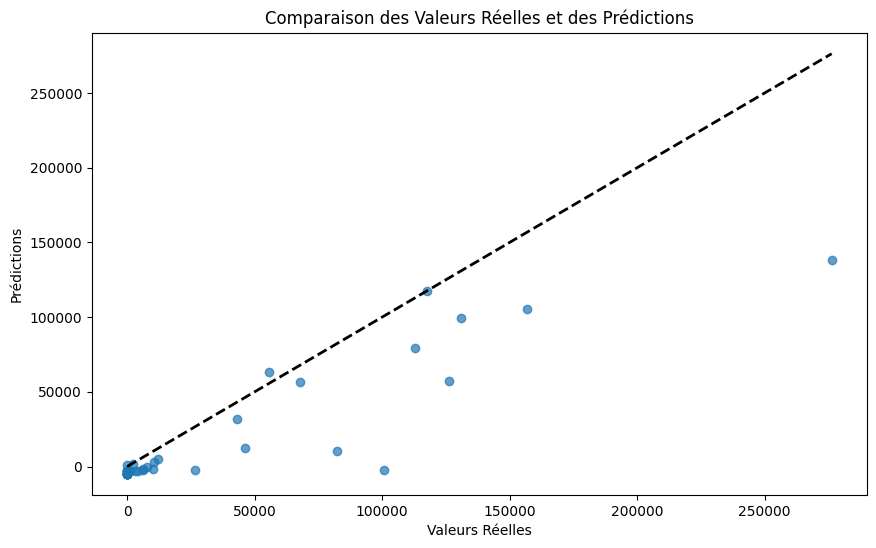

In [596]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

# le modele a tendance à sous évaluer les prédictions
# R2 pas très élevé

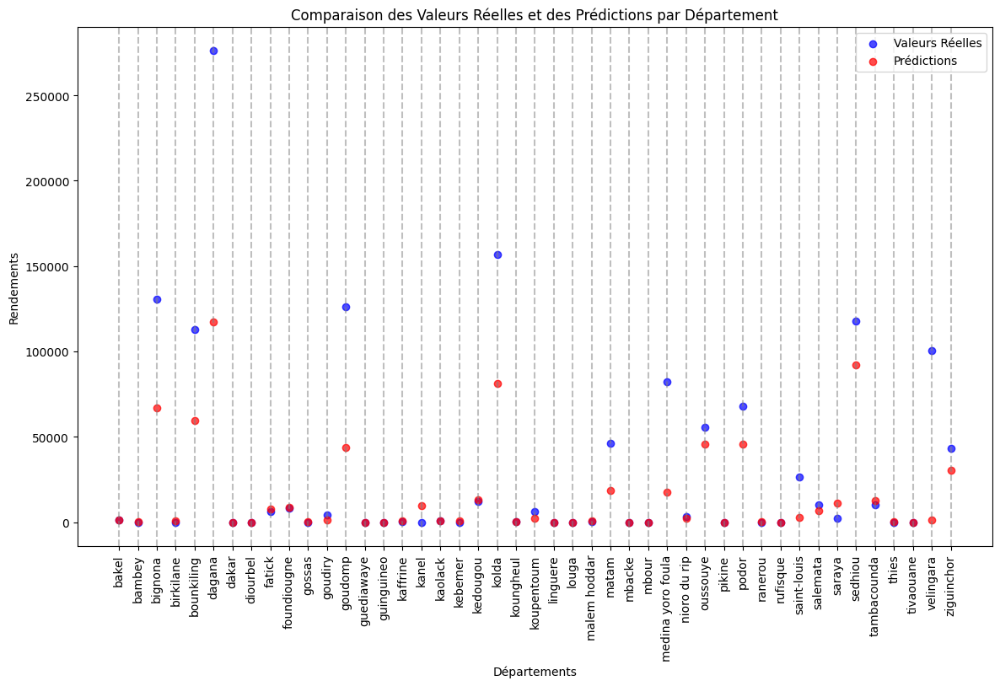

In [547]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

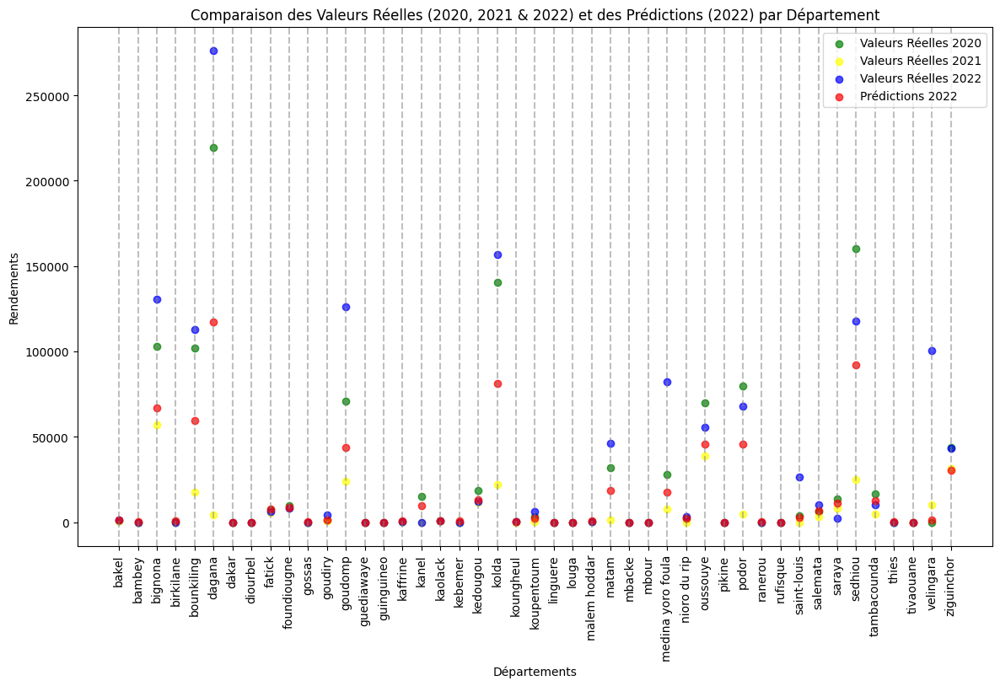

In [548]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Les résultats sont mitigés. Nous allons tester le modèle fully_connected afin de voir ce que l'on obtient.

In [549]:
# Modèle fully connected


import torch
import torch.nn as nn

class SimpleNN3_fc(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 45)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x



In [604]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.5)


36


In [605]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 45])
y_train_tensor shape: torch.Size([45, 2])


In [606]:
# Entraîner le modèle

num_epochs = 200
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/200], Loss: 341482432.0000
Epoch [20/200], Loss: 89835808.0000
Epoch [30/200], Loss: 41171464.0000
Epoch [40/200], Loss: 2809840.7500
Epoch [50/200], Loss: 2670391.0000
Epoch [60/200], Loss: 464295.1562
Epoch [70/200], Loss: 237153.7344
Epoch [80/200], Loss: 71484.2031
Epoch [90/200], Loss: 23310.2578
Epoch [100/200], Loss: 11783.7031
Epoch [110/200], Loss: 3216.1482
Epoch [120/200], Loss: 1446.2935
Epoch [130/200], Loss: 392.0385
Epoch [140/200], Loss: 144.2195
Epoch [150/200], Loss: 66.0064
Epoch [160/200], Loss: 14.4737
Epoch [170/200], Loss: 7.6626
Epoch [180/200], Loss: 1.9600
Epoch [190/200], Loss: 0.8552
Epoch [200/200], Loss: 0.3219


In [607]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([45])
torch.Size([45])
Test Loss: 978661376.0000


In [608]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[ 5.92284302e+02  3.70115013e+01  7.53689688e+04  9.67395706e+01
   7.24905391e+04  1.54546422e+05 -2.10995674e+01 -4.92473335e+01
   5.71568652e+03  7.30999805e+03  2.96552582e+01  9.01261292e+02
   5.09746523e+04 -5.03829336e+00  6.70931320e+01  8.87454758e+01
   1.07577852e+04  3.33469482e+02 -4.17383766e+01  1.34165244e+04
   1.00134961e+05  6.49766064e+00  2.11192871e+03 -1.03180237e+01
  -7.93787479e-01 -5.57472372e+00  2.22649707e+04  7.23559875e+01
   2.75481358e+01  1.98831934e+04  1.64179700e+03  5.12112383e+04
   1.87566319e+01  5.60074883e+04 -1.82969809e+00 -1.06408081e+01
   2.54010522e+03  4.92432764e+03  9.88676758e+03  1.14159836e+05
   1.20450029e+04  2.53021088e+01  4.58603477e+01  3.22384583e+02
   3.21004258e+04]]
Véritables valeurs: [1.20215000e+03 0.00000000e+00 1.30805959e+05 0.00000000e+00
 1.12970762e+05 2.76278720e+05 0.00000000e+00 0.00000000e+00
 6.05302500e+03 7.98440400e+03 0.00000000e+00 4.30686386e+03
 1.26376519e+05 0.00000000e+00 0.00000

In [609]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [610]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')


Mean Absolute Error (MAE): 14002.5660
Mean Squared Error (MSE): 978661406.3623
Root Mean Squared Error (RMSE): 31283.5645
R-squared (R²): 0.6990


Le R2 s'est légèrement amélioré.

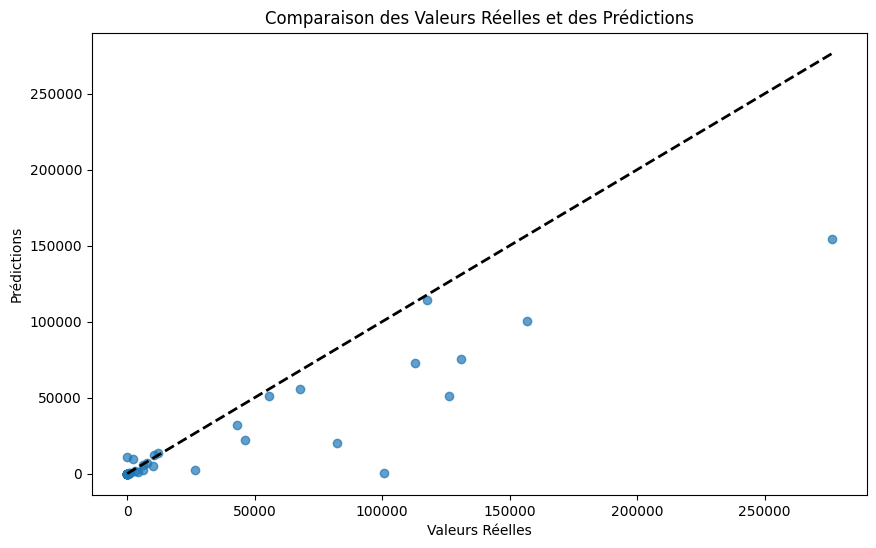

In [611]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

Nous notons tout de même que dans les 2 cas, le modèle a toujours tendance à sous-évaluer les productions agricoles en riz.

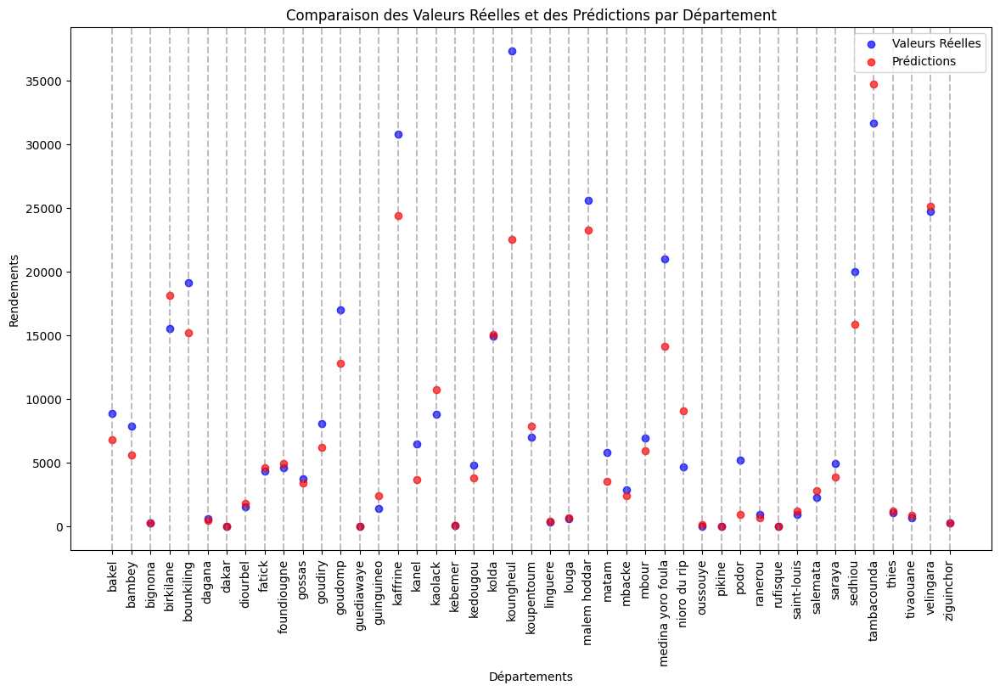

In [503]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

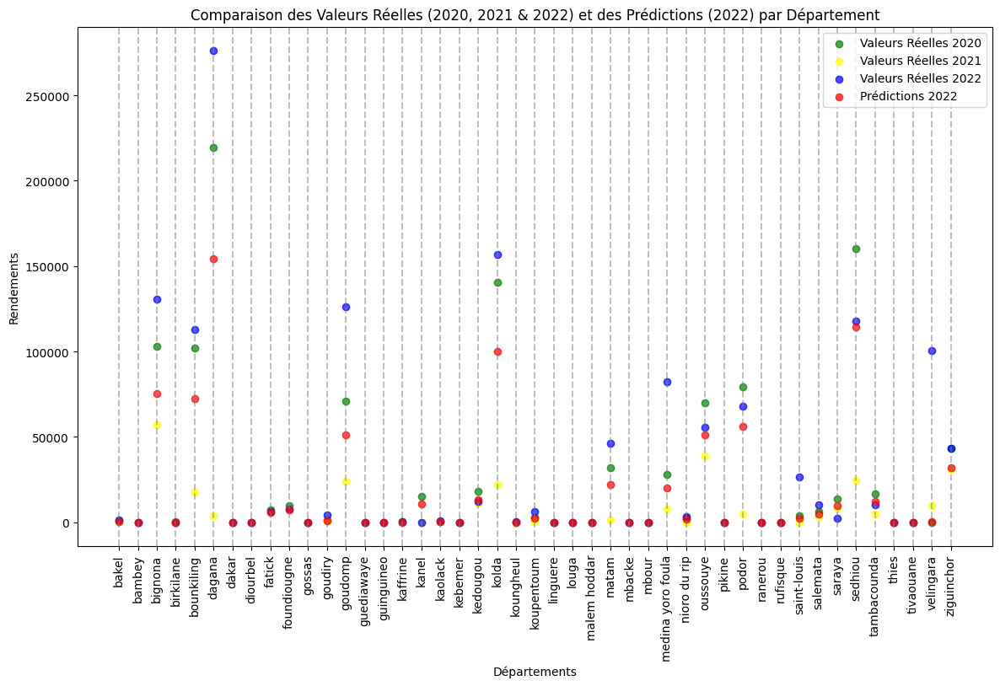

In [612]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Dans un premier temps, nous allons retirer les départements qui ont relativement plus de Na que les autres. Celà permettra peut-être de faire un meilleur apprentissage.

Pour savoir quoi faire exactement, on va mieux regarder les données

In [613]:
riz

,Region Name,2017,2018,2019,2020,2021,2022
0,DAKAR,0,0,0,0,0,0
1,GUEDIAWAYE,0,0,0,0,0,0
2,PIKINE,0,0,0,0,0,0
4,RUFISQUE,0,0,0,0,0,0
5,BAMBEY,0,0,0,0,0,0
6,DIOURBEL,114.1212495,0,0,0,0,0
7,MBACKE,7.254340524,0,0,0,0,0
8,FATICK,6282,0,4284.0044,7418.32173,5596.6624,6053.025
9,FOUNDIOUGNE,6300,7400,5496.4224,9772.218,7988.326228,7984.404
10,GOSSAS,316.1779815,0,0,0,0,0


Là ce n'est pas l'idéal parce que j'ai déjà remplacé les Nas par des 0. J'ai dû regardé plus haut. Voir les commentaires que je fais ci-dessous

In [628]:
# Jonni je vais charger arachides

import pandas as pd

# Charger le fichier Excel
file_path = r"C:\Users\ADIE\Documents\stage_ansd\test_departements\yields\riz.csv"
data = pd.read_csv(file_path)

# Afficher les premières lignes des données
print(data.head())

# Afficher les informations générales sur les données
print(data.info())



                 Region       SN            SN-DK  SN-DK-RU  \
0           Region Name  SENEGAL  REGION DE DAKAR  RUFISQUE   
1  Region - Description      NaN              NaN       NaN   
2     Region - RegionId       SN            SN-DK  SN-DK-RU   
3               Culture      RIZ              RIZ       RIZ   
4          Culture Name      RIZ              RIZ       RIZ   

                SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK  \
0  REGION DE DIOURBEL    BAMBEY  DIOURBEL    MBACKE  REGION DE FATICK   
1                 NaN       NaN       NaN       NaN               NaN   
2               SN-DB  SN-DB-BA  SN-DB-DD  SN-DB-MB             SN-FK   
3                 RIZ       RIZ       RIZ       RIZ               RIZ   
4                 RIZ       RIZ       RIZ       RIZ               RIZ   

   SN-FK-FD  ...    SN-TC-KO     SN-TC-TD            SN-TH  SN-TH-MB  \
0    FATICK  ...  KOUPENTOUM  TAMBACOUNDA  REGION DE THIES     MBOUR   
1       NaN  ...         NaN          

In [629]:
# Transposer le DataFrame
data_transposed = data.transpose()

# Liste des indices des colonnes à supprimer
columns_to_drop_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

# Supprimer les colonnes spécifiées du DataFrame transposé
data_cleaned = data_transposed.drop(columns_to_drop_indices, axis=1)


# Afficher les premières lignes du DataFrame nettoyé
print(data_cleaned.head(10))


                          0            18           19           20  \
Region           Region Name         2017         2018         2019   
SN                   SENEGAL  1014052.934  1156307.482  1155730.281   
SN-DK        REGION DE DAKAR          NaN          NaN            0   
SN-DK-RU            RUFISQUE          NaN          NaN          NaN   
SN-DB     REGION DE DIOURBEL    121.37559          NaN            0   
SN-DB-BA              BAMBEY          NaN          NaN          NaN   
SN-DB-DD            DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB              MBACKE  7.254340524          NaN          NaN   
SN-FK       REGION DE FATICK  12898.17798         7400    9780.4268   
SN-FK-FD              FATICK         6282          NaN    4284.0044   

                   21           22           23  
Region           2020         2021         2022  
SN        1349723.012  1346145.681  1409119.986  
SN-DK             NaN            0          NaN  
SN-DK-RU          

In [641]:
riz=data_cleaned

riz.head()

riz.rename(columns={0: 'Region Name'}, inplace=True)

riz.head()

,Region Name,18,19,20,21,22,23
Region,Region Name,2017,2018,2019,2020,2021,2022
SN,SENEGAL,1014052.934,1156307.482,1155730.281,1349723.012,1346145.681,1409119.986
SN-DK,REGION DE DAKAR,NaN,NaN,0,NaN,0,NaN
SN-DK-RU,RUFISQUE,NaN,NaN,NaN,NaN,0,NaN
SN-DB,REGION DE DIOURBEL,121.37559,NaN,0,NaN,0,NaN


In [642]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('REGION')]

# Vérifier le changement
print(riz)

# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('SENEGAL')]

# Vérifier le changement
print(riz)

                Region Name           18           19           20  \
Region          Region Name         2017         2018         2019   
SN                  SENEGAL  1014052.934  1156307.482  1155730.281   
SN-DK-RU           RUFISQUE          NaN          NaN          NaN   
SN-DB-BA             BAMBEY          NaN          NaN          NaN   
SN-DB-DD           DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB             MBACKE  7.254340524          NaN          NaN   
SN-FK-FD             FATICK         6282          NaN    4284.0044   
SN-FK-FO        FOUNDIOUGNE         6300         7400    5496.4224   
SN-FK-GO             GOSSAS  316.1779815          NaN          NaN   
SN-KA-BI          BIRKILANE  202.6585293          NaN        77.44   
SN-KA-KA           KAFFRINE   314.792915  288.6019106      110.322   
SN-KA-KO          KOUNGHEUL  175.0791663          NaN       30.312   
SN-KA-MO       MALEM HODDAR      106.766          NaN         30.6   
SN-KL-GU         GUI

In [632]:
# Créer un DataFrame pour les nouvelles lignes
new_rows = pd.DataFrame({
    'Region Name': ['DAKAR', 'GUEDIAWAYE', 'PIKINE'],
    18: [0, 0, 0],
    19: [0, 0, 0],
    20: [0, 0, 0],
    21: [0, 0, 0],
    22: [0, 0, 0],
    23: [0, 0, 0]
})

# Ajouter les nouvelles lignes en haut du DataFrame existant
riz = pd.concat([new_rows, riz], ignore_index=True)

# Vérifier le changement
print(riz)

          Region Name           18           19           20           21  \
0               DAKAR            0            0            0            0   
1          GUEDIAWAYE            0            0            0            0   
2              PIKINE            0            0            0            0   
3         Region Name         2017         2018         2019         2020   
4            RUFISQUE          NaN          NaN          NaN          NaN   
5              BAMBEY          NaN          NaN          NaN          NaN   
6            DIOURBEL  114.1212495          NaN          NaN          NaN   
7              MBACKE  7.254340524          NaN          NaN          NaN   
8              FATICK         6282          NaN    4284.0044   7418.32173   
9         FOUNDIOUGNE         6300         7400    5496.4224     9772.218   
10             GOSSAS  316.1779815          NaN          NaN            0   
11          BIRKILANE  202.6585293          NaN        77.44  207.5416233   

In [643]:
# Filtrer et supprimer les lignes où 'Nom_Region' commence par 'Region'
riz = riz[~riz['Region Name'].str.startswith('Region Name')]

# Vérifier le changement
print(riz)



                Region Name           18           19           20  \
SN-DK-RU           RUFISQUE          NaN          NaN          NaN   
SN-DB-BA             BAMBEY          NaN          NaN          NaN   
SN-DB-DD           DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB             MBACKE  7.254340524          NaN          NaN   
SN-FK-FD             FATICK         6282          NaN    4284.0044   
SN-FK-FO        FOUNDIOUGNE         6300         7400    5496.4224   
SN-FK-GO             GOSSAS  316.1779815          NaN          NaN   
SN-KA-BI          BIRKILANE  202.6585293          NaN        77.44   
SN-KA-KA           KAFFRINE   314.792915  288.6019106      110.322   
SN-KA-KO          KOUNGHEUL  175.0791663          NaN       30.312   
SN-KA-MO       MALEM HODDAR      106.766          NaN         30.6   
SN-KL-GU         GUINGUINEO  22.51873373          NaN          NaN   
SN-KL-KA            KAOLACK  1342.315215          845  343.2521951   
SN-KL-ND       NIORO

In [644]:
riz.rename(columns={18: 2017}, inplace=True)
riz.rename(columns={19: 2018}, inplace=True)
riz.rename(columns={20: 2019}, inplace=True)
riz.rename(columns={21: 2020}, inplace=True)
riz.rename(columns={22: 2021}, inplace=True)
riz.rename(columns={23: 2022}, inplace=True)

print(riz)

                Region Name         2017         2018         2019  \
SN-DK-RU           RUFISQUE          NaN          NaN          NaN   
SN-DB-BA             BAMBEY          NaN          NaN          NaN   
SN-DB-DD           DIOURBEL  114.1212495          NaN          NaN   
SN-DB-MB             MBACKE  7.254340524          NaN          NaN   
SN-FK-FD             FATICK         6282          NaN    4284.0044   
SN-FK-FO        FOUNDIOUGNE         6300         7400    5496.4224   
SN-FK-GO             GOSSAS  316.1779815          NaN          NaN   
SN-KA-BI          BIRKILANE  202.6585293          NaN        77.44   
SN-KA-KA           KAFFRINE   314.792915  288.6019106      110.322   
SN-KA-KO          KOUNGHEUL  175.0791663          NaN       30.312   
SN-KA-MO       MALEM HODDAR      106.766          NaN         30.6   
SN-KL-GU         GUINGUINEO  22.51873373          NaN          NaN   
SN-KL-KA            KAOLACK  1342.315215          845  343.2521951   
SN-KL-ND       NIORO

In [645]:
# ['Region Name'][2020][2021][2022]
print(riz[['Region Name', 2020, 2021, 2022]])

                Region Name         2020         2021         2022
SN-DK-RU           RUFISQUE          NaN            0          NaN
SN-DB-BA             BAMBEY          NaN            0          NaN
SN-DB-DD           DIOURBEL          NaN            0          NaN
SN-DB-MB             MBACKE          NaN            0          NaN
SN-FK-FD             FATICK   7418.32173    5596.6624     6053.025
SN-FK-FO        FOUNDIOUGNE     9772.218  7988.326228     7984.404
SN-FK-GO             GOSSAS            0            0          NaN
SN-KA-BI          BIRKILANE  207.5416233            0            0
SN-KA-KA           KAFFRINE   194.649606  199.0522251  250.8774014
SN-KA-KO          KOUNGHEUL  82.61748133            0   321.029692
SN-KA-MO       MALEM HODDAR  77.20441372   59.8579788  76.46114205
SN-KL-GU         GUINGUINEO          NaN            0          NaN
SN-KL-KA            KAOLACK  608.5334136  616.1301465  905.4495144
SN-KL-ND       NIORO DU RIP    2447.1772            0    3272.

Quand on regarde les données de plus près, on se rend compte qu'il y a des évolutions brusques d'une année à une autre, plus que pour les autres cultures. Ces évolutions ne sont peut-être pas expliquées systématiquement par les features dont l'on dispose. Il faudrait peut-être un modèle avec plus de variables explicatives ...



Nous allons supprimer les départements qui contiennent au moins 2 Nas sur les 3 années 2020, 2021 et 2022.

In [646]:
# Garder uniquement les lignes avec moins de 2 NaN dans les colonnes 2020, 2021, 2022
riz_filtered = riz.dropna(thresh=2, subset=[2020, 2021, 2022])

# Afficher le DataFrame filtré
print(riz_filtered[['Region Name', 2020, 2021, 2022]])


                Region Name         2020         2021         2022
SN-FK-FD             FATICK   7418.32173    5596.6624     6053.025
SN-FK-FO        FOUNDIOUGNE     9772.218  7988.326228     7984.404
SN-FK-GO             GOSSAS            0            0          NaN
SN-KA-BI          BIRKILANE  207.5416233            0            0
SN-KA-KA           KAFFRINE   194.649606  199.0522251  250.8774014
SN-KA-KO          KOUNGHEUL  82.61748133            0   321.029692
SN-KA-MO       MALEM HODDAR  77.20441372   59.8579788  76.46114205
SN-KL-KA            KAOLACK  608.5334136  616.1301465  905.4495144
SN-KL-ND       NIORO DU RIP    2447.1772            0    3272.9552
SN-KE-KE           KEDOUGOU  18378.24435  11449.21099  12283.00492
SN-KE-SL           SALEMATA   6411.15648  3249.696272  10113.39594
SN-KE-SA             SARAYA  13489.92275  8186.696609     2361.985
SN-KD-KD              KOLDA   140543.274  22124.96897  156708.6366
SN-KD-MY  MEDINA YORO FOULA   27926.3294  7581.086193  82131.6

Pour les Na restants, nous mettons des 0.

In [647]:
# Remplacer les NaN par 0
riz_filtered.fillna(0, inplace=True)

print(riz_filtered)


                Region Name         2017         2018         2019  \
SN-FK-FD             FATICK         6282            0    4284.0044   
SN-FK-FO        FOUNDIOUGNE         6300         7400    5496.4224   
SN-FK-GO             GOSSAS  316.1779815            0            0   
SN-KA-BI          BIRKILANE  202.6585293            0        77.44   
SN-KA-KA           KAFFRINE   314.792915  288.6019106      110.322   
SN-KA-KO          KOUNGHEUL  175.0791663            0       30.312   
SN-KA-MO       MALEM HODDAR      106.766            0         30.6   
SN-KL-KA            KAOLACK  1342.315215          845  343.2521951   
SN-KL-ND       NIORO DU RIP     2913.888         2480    1343.4992   
SN-KE-KE           KEDOUGOU     16423.77   18419.4912  11147.05297   
SN-KE-SL           SALEMATA         1450       4426.4  5498.403372   
SN-KE-SA             SARAYA      5244.84      9607.68  5344.651835   
SN-KD-KD              KOLDA    56468.608        53472  150443.9096   
SN-KD-MY  MEDINA YOR

In [649]:
riz = riz_filtered

In [650]:
# Liste des noms des départements correspondant à l'ordre des géométries dans le GeoDataFrame
noms_departements = [
    'DAKAR', 'GUEDIAWAYE', 'PIKINE', 'RUFISQUE',
    'BAMBEY', 'DIOURBEL', 'MBACKE',
    'FATICK', 'FOUNDIOUGNE', 'GOSSAS',
    'BIRKILANE', 'KAFFRINE', 'KOUNGHEUL', 'MALEM HODDAR',
    'GUINGUINEO', 'KAOLACK', 'NIORO DU RIP',
    'KEDOUGOU', 'SALEMATA', 'SARAYA',
    'KOLDA', 'MEDINA YORO FOULA', 'VELINGARA',
    'KEBEMER', 'LINGUERE', 'LOUGA', 
    'KANEL', 'MATAM', 'RANEROU', 
    'DAGANA', 'PODOR', 'SAINT-LOUIS',
    'BOUNKILING', 'GOUDOMP', 'SEDHIOU',
    'BAKEL', 'GOUDIRY', 'KOUPENTOUM', 'TAMBACOUNDA',
    'MBOUR', 'THIES', 'TIVAOUANE',
    'BIGNONA', 'OUSSOUYE', 'ZIGUINCHOR'
]

# Vérifier que le nombre de noms correspond au nombre de géométries
print(len(noms_departements), len(gdf))

# Ajouter la colonne des noms des départements au GeoDataFrame
gdf['Region Name'] = noms_departements

# Afficher les premières lignes pour vérifier l'ajout
print(gdf.head())



45 45
                                            geometry Region Name
0  MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ...       DAKAR
1  POLYGON ((-17.42902 14.76355, -17.42896 14.763...  GUEDIAWAYE
2  POLYGON ((-17.29675 14.75111, -17.29622 14.750...      PIKINE
3  POLYGON ((-17.25486 14.70375, -17.25486 14.704...    RUFISQUE
4  POLYGON ((-16.52628 14.60573, -16.52672 14.605...      BAMBEY


In [651]:
# Fusionner les données
merged_gdf = gdf.merge(riz, on='Region Name')

# Afficher les premières lignes pour vérifier la fusion
print(merged_gdf.head())

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)



                                            geometry  Region Name  \
0  POLYGON ((-16.72214 13.99249, -16.72281 13.992...       FATICK   
1  MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...  FOUNDIOUGNE   
2  POLYGON ((-16.10754 14.36886, -16.10828 14.370...       GOSSAS   
3  POLYGON ((-15.55763 13.86664, -15.55969 13.865...    BIRKILANE   
4  POLYGON ((-15.38576 13.76408, -15.38912 13.761...     KAFFRINE   

          2017         2018       2019         2020         2021         2022  
0         6282            0  4284.0044   7418.32173    5596.6624     6053.025  
1         6300         7400  5496.4224     9772.218  7988.326228     7984.404  
2  316.1779815            0          0            0            0            0  
3  202.6585293            0      77.44  207.5416233            0            0  
4   314.792915  288.6019106    110.322   194.649606  199.0522251  250.8774014  
2017    object
2018    object
2019    object
2020    object
2021    object
2022    object
dtype: object


In [652]:
for year in [2017, 2018, 2019, 2020, 2021, 2022]:
    merged_gdf[year] = pd.to_numeric(merged_gdf[year], errors='coerce')

print(merged_gdf[[2017, 2018, 2019, 2020, 2021, 2022]].dtypes)


2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
2022    float64
dtype: object


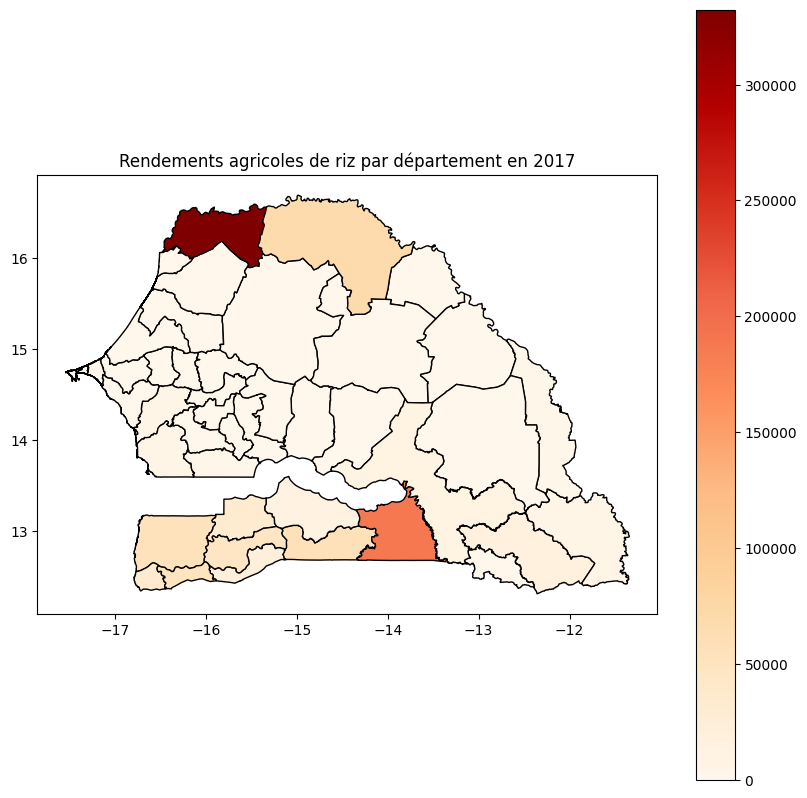

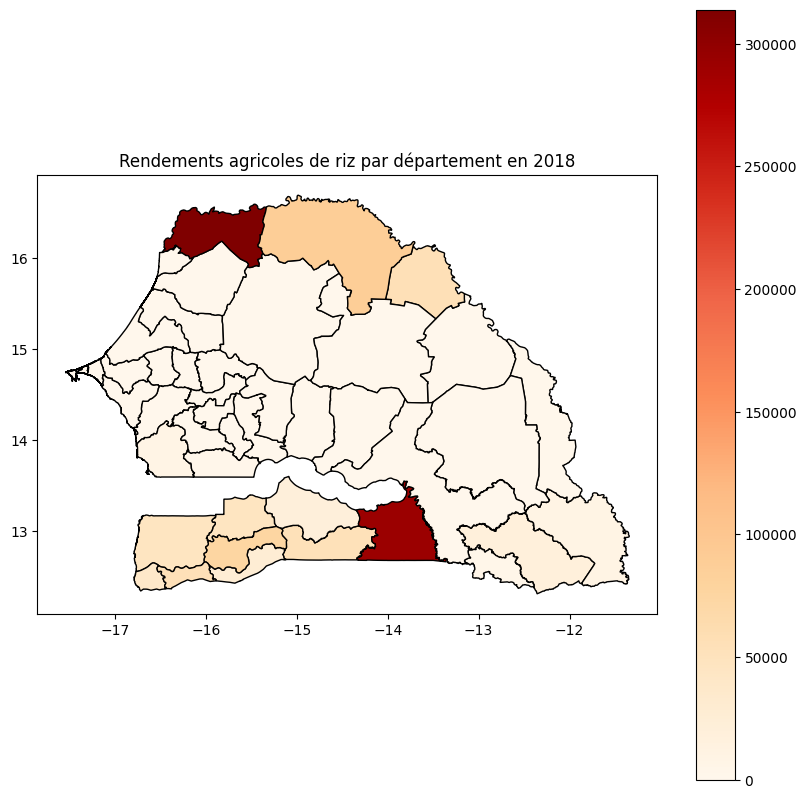

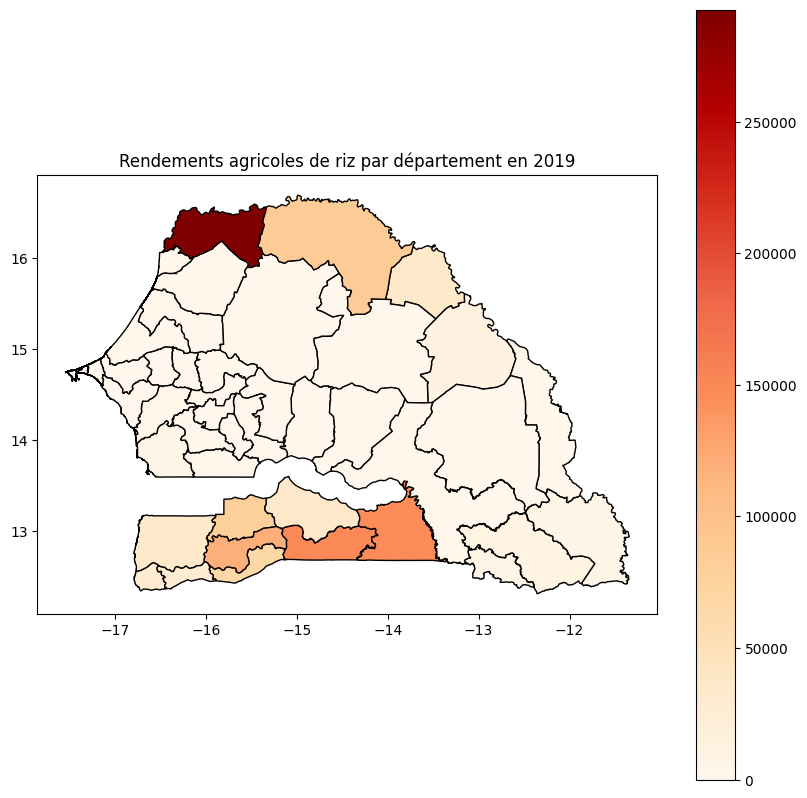

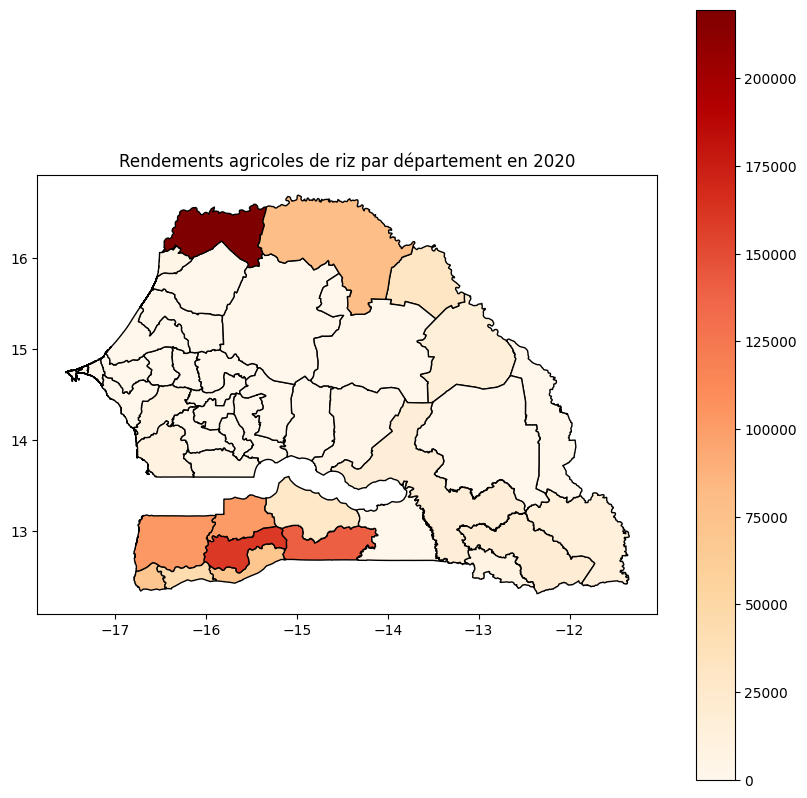

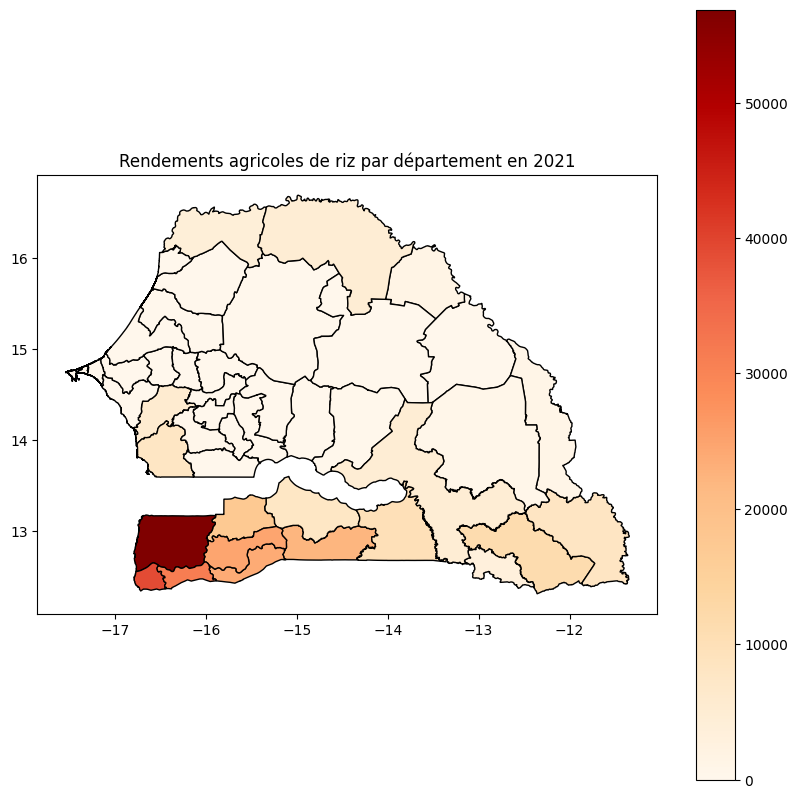

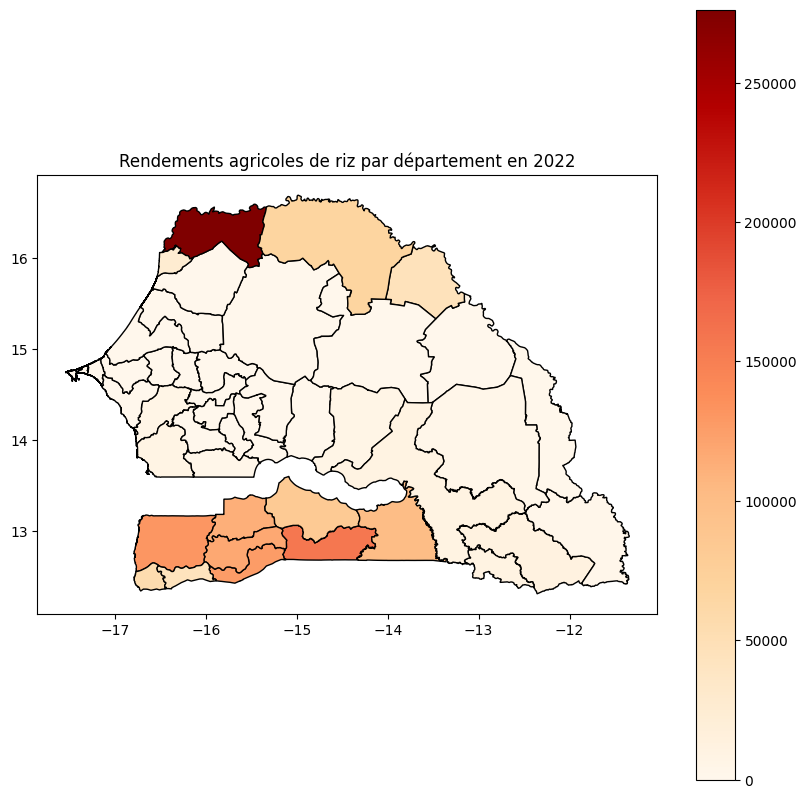

In [516]:
years = [2017, 2018, 2019, 2020, 2021, 2022]

for year in years:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    merged_gdf.plot(column=year, ax=ax, legend=True, cmap='OrRd', edgecolor='black')
    plt.title(f'Rendements agricoles de riz par département en {year}')
    plt.show()

# pointtt : on enleve les departements qui ne produisent pas de riz

In [654]:
import geopandas as gpd

# Exemple d'initialisation si ce n'est pas déjà fait
# merged_gdf = gpd.read_file('path_to_your_geodatafile.shp')

# Tri du GeoDataFrame par ordre alphabétique de la colonne 'Region Name'
merged_gdf_sorted = merged_gdf.sort_values(by='Region Name').reset_index(drop=True)

# Afficher le GeoDataFrame trié
print(merged_gdf_sorted.head())



                                            geometry Region Name  \
0  POLYGON ((-12.06774 13.70753, -12.06079 13.700...       BAKEL   
1  POLYGON ((-15.99612 12.82992, -15.99748 12.829...     BIGNONA   
2  POLYGON ((-15.55763 13.86664, -15.55969 13.865...   BIRKILANE   
3  POLYGON ((-15.85103 13.18076, -15.82677 13.180...  BOUNKILING   
4  POLYGON ((-15.44986 15.91898, -15.45394 15.916...      DAGANA   

            2017          2018          2019           2020         2021  \
0    2657.040000    2110.00000     781.75000     936.000000    910.00000   
1   55381.431240   46253.90000   35094.02400  103055.215500  56873.50805   
2     202.658529       0.00000      77.44000     207.541623      0.00000   
3   33413.596000   45793.40909   79655.33413  102000.000000  17470.16823   
4  332422.684600  313926.00000  292624.65000  219667.500000   4068.75000   

          2022  
0    1202.1500  
1  130805.9594  
2       0.0000  
3  112970.7619  
4  276278.7200  


In [655]:

# Vérifiez la cohérence des noms de départements
ndvi_global['Department'] = ndvi_global['Department'].str.lower()
landtemp_global['Department'] = landtemp_global['Department'].str.lower()
rainfall_global['Department'] = rainfall_global['Department'].str.lower()
merged_gdf_sorted['Region Name'] = merged_gdf_sorted['Region Name'].str.lower()


In [656]:
merged_gdf_sorted

,geometry,Region Name,2017,2018,2019,2020,2021,2022
0,"POLYGON ((-12.06774 13.70753, -12.06079 13.700...",bakel,2657.040000,2110.000000,781.750000,936.000000,910.000000,1202.150000
1,"POLYGON ((-15.99612 12.82992, -15.99748 12.829...",bignona,55381.431240,46253.900000,35094.024000,103055.215500,56873.508050,130805.959400
2,"POLYGON ((-15.55763 13.86664, -15.55969 13.865...",birkilane,202.658529,0.000000,77.440000,207.541623,0.000000,0.000000
3,"POLYGON ((-15.85103 13.18076, -15.82677 13.180...",bounkiling,33413.596000,45793.409090,79655.334130,102000.000000,17470.168230,112970.761900
4,"POLYGON ((-15.44986 15.91898, -15.45394 15.916...",dagana,332422.684600,313926.000000,292624.650000,219667.500000,4068.750000,276278.720000
5,"POLYGON ((-16.72214 13.99249, -16.72281 13.992...",fatick,6282.000000,0.000000,4284.004400,7418.321730,5596.662400,6053.025000
6,"MULTIPOLYGON (((-16.28756 13.59272, -16.31041 ...",foundiougne,6300.000000,7400.000000,5496.422400,9772.218000,7988.326228,7984.404000
7,"POLYGON ((-16.10754 14.36886, -16.10828 14.370...",gossas,316.177981,0.000000,0.000000,0.000000,0.000000,0.000000
8,"POLYGON ((-12.74425 13.55885, -12.74486 13.559...",goudiry,409.319018,678.000000,669.050000,1268.042591,804.073191,4306.863859
9,"POLYGON ((-15.54951 12.48514, -15.55566 12.482...",goudomp,21493.752000,26000.000000,65991.720500,70887.193800,23812.375480,126376.518800


In [657]:
# Fusionner les features avec les données de rendements
def prepare_features(year):
    ndvi_year = ndvi_global.loc[str(year)].reset_index(drop=True)
    # print(ndvi_year)
    lst_year = landtemp_global.loc[str(year)].reset_index(drop=True)
    rainfall_year = rainfall_global.loc[str(year)].reset_index(drop=True)

    # Fusionner les features sur le nom du département
    # temp = ndvi_year.merge(lst_year, on='Department', suffixes=(str(year)+'_ndvi', str(year)+'_lst'))
    # features = temp.merge(rainfall_year, on='Department', suffixes=('_', str(year)+'_rain'))
    features = ndvi_year.merge(lst_year.merge(rainfall_year, on='Department', suffixes=(str(year)+'_lst', str(year)+'_rain')), on='Department').rename(columns = {'Jan': 'Jan'+str(year)+'_ndvi', 'Feb': 'Feb'+str(year)+'_ndvi', 'Mar': 'Mar'+str(year)+'_ndvi', 'Apr': 'Apr'+str(year)+'_ndvi', 'May': 'May'+str(year)+'_ndvi', 'Jun': 'Jun'+str(year)+'_ndvi', 'Jul': 'Jul'+str(year)+'_ndvi', 'Aug': 'Aug'+str(year)+'_ndvi', 'Sept': 'Sept'+str(year)+'_ndvi', 'Oct': 'Oct'+str(year)+'_ndvi', 'Nov': 'Nov'+str(year)+'_ndvi', 'Dec': 'Dec'+str(year)+'_ndvi'})
    # print(features)
    
    # Ajouter les données de rendements pour l'année donnée
    yields = merged_gdf_sorted[['Region Name', year]].rename(columns={'Region Name': 'Department', year: 'Yield'+str(year)})
    # print(yields)
    
    #print(yields.columns.tolist())
    #print(features.columns.tolist())
    
    # Joindre les rendements avec les features
    data = features.merge(yields, on='Department')
    # print(data)

    return data



In [658]:
# Préparer les données pour toutes les années disponibles
data_2020 = prepare_features(2020)
data_2021 = prepare_features(2021)
data_2022 = prepare_features(2022)
# print(data_2020)


In [659]:
# Concaténer toutes les données pour un ensemble complet
all_data = pd.concat([data_2020, data_2021, data_2022], ignore_index=False, axis=1)

# Afficher le DataFrame résultant
print(all_data)
print(all_data.columns)

    Jan2020_ndvi  Feb2020_ndvi  Mar2020_ndvi  Apr2020_ndvi  May2020_ndvi  \
0       0.261373      0.243739      0.223248      0.217857      0.212408   
1       0.450318      0.367808      0.325922      0.307612      0.306105   
2       0.239233      0.227222      0.214794      0.199590      0.188848   
3       0.371602      0.293450      0.277845      0.269917      0.272437   
4       0.198287      0.198479      0.193791      0.213732      0.217972   
5       0.208799      0.203343      0.194405      0.187499      0.184056   
6       0.314511      0.294715      0.271235      0.253902      0.253502   
7       0.225760      0.215473      0.202012      0.190561      0.180744   
8       0.279911      0.256492      0.238674      0.238304      0.234552   
9       0.506290      0.435321      0.366894      0.352467      0.359042   
10      0.238710      0.223435      0.212348      0.198451      0.190370   
11      0.218174      0.207993      0.196425      0.188376      0.181277   
12      0.33

In [660]:
print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Department', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', '

In [661]:
all_data = all_data.loc[:,~all_data.columns.duplicated()].copy()

print(all_data.columns.tolist())


['Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Department', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [662]:
len(all_data.columns.tolist())

112

In [663]:
# shift column 'Name' to first position 
first_column = all_data.pop('Department') 
  
# insert column using insert(position,column_name, 
# first_column) function 
all_data.insert(0, 'Department', first_column) 

In [664]:
len(all_data.columns.tolist())

112

In [665]:
print(all_data.columns.tolist())


['Department', 'Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi', 'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi', 'Aug2020_ndvi', 'Sept2020_ndvi', 'Oct2020_ndvi', 'Nov2020_ndvi', 'Dec2020_ndvi', 'Jan2020_lst', 'Feb2020_lst', 'Mar2020_lst', 'Apr2020_lst', 'May2020_lst', 'Jun2020_lst', 'Jul2020_lst', 'Aug2020_lst', 'Sept2020_lst', 'Oct2020_lst', 'Nov2020_lst', 'Dec2020_lst', 'Jan2020_rain', 'Feb2020_rain', 'Mar2020_rain', 'Apr2020_rain', 'May2020_rain', 'Jun2020_rain', 'Jul2020_rain', 'Aug2020_rain', 'Sept2020_rain', 'Oct2020_rain', 'Nov2020_rain', 'Dec2020_rain', 'Yield2020', 'Jan2021_ndvi', 'Feb2021_ndvi', 'Mar2021_ndvi', 'Apr2021_ndvi', 'May2021_ndvi', 'Jun2021_ndvi', 'Jul2021_ndvi', 'Aug2021_ndvi', 'Sept2021_ndvi', 'Oct2021_ndvi', 'Nov2021_ndvi', 'Dec2021_ndvi', 'Jan2021_lst', 'Feb2021_lst', 'Mar2021_lst', 'Apr2021_lst', 'May2021_lst', 'Jun2021_lst', 'Jul2021_lst', 'Aug2021_lst', 'Sept2021_lst', 'Oct2021_lst', 'Nov2021_lst', 'Dec2021_lst', 'Jan2021_rain', 'Feb2021_rain',

In [666]:
all_data


,Department,Jan2020_ndvi,Feb2020_ndvi,Mar2020_ndvi,Apr2020_ndvi,May2020_ndvi,Jun2020_ndvi,Jul2020_ndvi,Aug2020_ndvi,Sept2020_ndvi,...,Apr2022_rain,May2022_rain,Jun2022_rain,Jul2022_rain,Aug2022_rain,Sept2022_rain,Oct2022_rain,Nov2022_rain,Dec2022_rain,Yield2022
0,bakel,0.261373,0.243739,0.223248,0.217857,0.212408,0.370194,0.512371,0.671292,0.651548,...,0.000000,0.866107,2.977087,4.399444,7.388785,7.243591,1.746660,0.005339,0.002446,1202.150000
1,bignona,0.450318,0.367808,0.325922,0.307612,0.306105,0.345220,0.481271,0.580475,0.679081,...,0.001169,0.608071,3.893955,10.892989,13.504675,11.673111,4.672372,0.037030,0.017494,130805.959400
2,birkilane,0.239233,0.227222,0.214794,0.199590,0.188848,0.176756,0.351311,0.559009,0.672464,...,0.000000,0.226210,2.321544,5.137638,5.749611,8.109597,2.451720,0.026425,0.017775,0.000000
3,bounkiling,0.371602,0.293450,0.277845,0.269917,0.272437,0.339902,0.588389,0.671528,0.773928,...,0.000000,0.853228,3.876809,6.081213,8.588116,8.855931,4.012135,0.030140,0.021445,112970.761900
4,dagana,0.198287,0.198479,0.193791,0.213732,0.217972,0.186565,0.272792,0.367371,0.431870,...,0.000000,0.000606,0.235756,1.521307,4.326585,3.253017,0.336511,0.013001,0.000266,276278.720000
5,fatick,0.208799,0.203343,0.194405,0.187499,0.184056,0.170761,0.260488,0.424824,0.498386,...,0.000000,0.063905,1.686016,5.685575,7.903929,9.155368,1.517372,0.028964,0.001491,6053.025000
6,foundiougne,0.314511,0.294715,0.271235,0.253902,0.253502,0.255724,0.406952,0.534988,0.598463,...,0.000000,0.119529,2.147411,7.046733,9.530447,9.533622,2.394796,0.035448,0.014554,7984.404000
7,gossas,0.225760,0.215473,0.202012,0.190561,0.180744,0.169447,0.291832,0.519529,0.585549,...,0.000000,0.053091,1.549988,3.789660,5.071430,7.529409,1.414293,0.029736,0.000000,0.000000
8,goudiry,0.279911,0.256492,0.238674,0.238304,0.234552,0.393187,0.565830,0.742578,0.703700,...,0.000000,1.094382,3.597229,4.261864,7.838847,8.023491,2.181208,0.005126,0.006621,4306.863859
9,goudomp,0.506290,0.435321,0.366894,0.352467,0.359042,0.449786,0.583407,0.647977,0.763729,...,0.000000,0.962288,4.900287,6.748049,11.758108,9.903139,6.348965,0.034792,0.042431,126376.518800


In [667]:
# Renommer les colonnes pour 2020, 2021 et 2022 de manière cohérente
def rename_features(df, year):
    columns = {col: col.replace(f'{year}', '') for col in df.columns if 'Yield' not in col}
    return df.rename(columns=columns)

features_2020 = all_data.filter(regex='2020')
features_2020 = rename_features(features_2020, '2020')

features_2021 = all_data.filter(regex='2021')
features_2021 = rename_features(features_2021, '2021')

features_2022 = all_data.filter(regex='2022')
features_2022 = rename_features(features_2022, '2022')



In [668]:
# Concaténer les features d'entraînement
X_train = pd.concat([features_2020.drop(columns='Yield2020'), features_2021.drop(columns='Yield2021')], axis=1)
y_train = pd.concat([features_2020['Yield2020'], features_2021['Yield2021']], axis=1)

# Features de test
X_test = features_2022.drop(columns='Yield2022')
y_test = features_2022['Yield2022']

# Concaténer X_train et X_test pour la normalisation
X_combined = pd.concat([X_train, X_test], axis=1)


In [669]:
# Normalisation des données
scaler = MinMaxScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Séparer les données normalisées
X_train_scaled = X_combined_scaled[:, :X_train.shape[1]]
X_test_scaled = X_combined_scaled[:, X_train.shape[1]:]

X_train_scaled.shape



(29, 72)

In [670]:
# Reshape X_train (chaque département a 2 années de données, 36 features par année)
X_train_scaled = X_train_scaled.reshape(2, X_train_scaled.shape[1] // 2, X_train_scaled.shape[0])

# Reshape X_test (chaque département a 1 année de données, 36 features)
X_test_scaled = X_test_scaled.reshape(1, X_test_scaled.shape[1], X_test_scaled.shape[0])


X_train_scaled.shape

(2, 36, 29)

In [671]:
X_test_scaled.shape

(1, 36, 29)

In [687]:
# Modèle de réseau de neurones

class SimpleNN3(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=29, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(29)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.softmax = nn.Softmax(dim=1)
        # self.dropout = nn.Dropout(0.3)
        self.relu = nn.LeakyReLU(0.1)


    def forward(self, x):
        # print(x.shape)
        x = self.conv1(x)
        # x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.conv2(x)  # Ajout du padding
        # x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.conv3(x)
        # x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.global_avgpool(x)
        # print(x.shape)
        # x = x.view(x.size(0), -1)  # Aplatir la dimension num_channels
        # print(x.shape)
        # x = self.softmax(x)
        # print(x.shape)
        return x



In [688]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [689]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 29])
y_train_tensor shape: torch.Size([29, 2])


In [690]:
# Entraîner le modèle
num_epochs = 200
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/200], Loss: 646056832.0000
Epoch [20/200], Loss: 89308480.0000
Epoch [30/200], Loss: 35014072.0000
Epoch [40/200], Loss: 14277727.0000
Epoch [50/200], Loss: 10078356.0000
Epoch [60/200], Loss: 2681287.7500
Epoch [70/200], Loss: 897685.3125
Epoch [80/200], Loss: 376223.6562
Epoch [90/200], Loss: 132780.3438
Epoch [100/200], Loss: 46187.0156
Epoch [110/200], Loss: 87913.0938
Epoch [120/200], Loss: 86829.8281
Epoch [130/200], Loss: 377575.8125
Epoch [140/200], Loss: 43170.6641
Epoch [150/200], Loss: 308237.4062
Epoch [160/200], Loss: 48378.1992
Epoch [170/200], Loss: 163916.0625
Epoch [180/200], Loss: 115895.6875
Epoch [190/200], Loss: 4842.4839
Epoch [200/200], Loss: 185097.7969


In [691]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([29])
torch.Size([29])
Test Loss: 2447548160.0000


In [692]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[[  -328.07047]
  [ 56241.645  ]
  [  -548.2685 ]
  [ 51633.547  ]
  [113002.734  ]
  [ -1413.3823 ]
  [  -925.83795]
  [ -1710.7559 ]
  [  -324.57812]
  [ 38302.312  ]
  [  -693.9116 ]
  [  -336.87875]
  [  4038.7498 ]
  [ 68753.2    ]
  [  -492.28296]
  [  -179.30919]
  [  -667.6277 ]
  [ 17719.904  ]
  [ 15918.92   ]
  [  -165.8628 ]
  [ 40734.707  ]
  [ 38618.28   ]
  [  4810.0454 ]
  [ -1653.1508 ]
  [  -474.46866]
  [ 80404.23   ]
  [  -316.137  ]
  [ -2096.4385 ]
  [ 27212.203  ]]]
Véritables valeurs: [1.20215000e+03 1.30805959e+05 0.00000000e+00 1.12970762e+05
 2.76278720e+05 6.05302500e+03 7.98440400e+03 0.00000000e+00
 4.30686386e+03 1.26376519e+05 2.50877401e+02 9.05449514e+02
 1.22830049e+04 1.56708637e+05 3.21029692e+02 6.33749913e+03
 7.64611421e+01 4.61467200e+04 8.21316157e+04 3.27295520e+03
 5.57999148e+04 6.79716200e+04 2.65205700e+04 1.01133959e+04
 2.36198500e+03 1.17692612e+05 1.03780189e+04 1.00649957e+05
 4.32192600e+04]


La remarque précédente faite pour les prédictions négatives est valable pour tout le notebook.

In [693]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [694]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# là je suis à 200 epochs et c à 0.31
# on verra si je peux améliorer ça inshaAllah

Mean Absolute Error (MAE): 29795.0506
Mean Squared Error (MSE): 2447548230.1258
Root Mean Squared Error (RMSE): 49472.7019
R-squared (R²): 0.4180


Ce premier résulat est très mauvais. L'a pprentissage du modèle n'a pas été bon

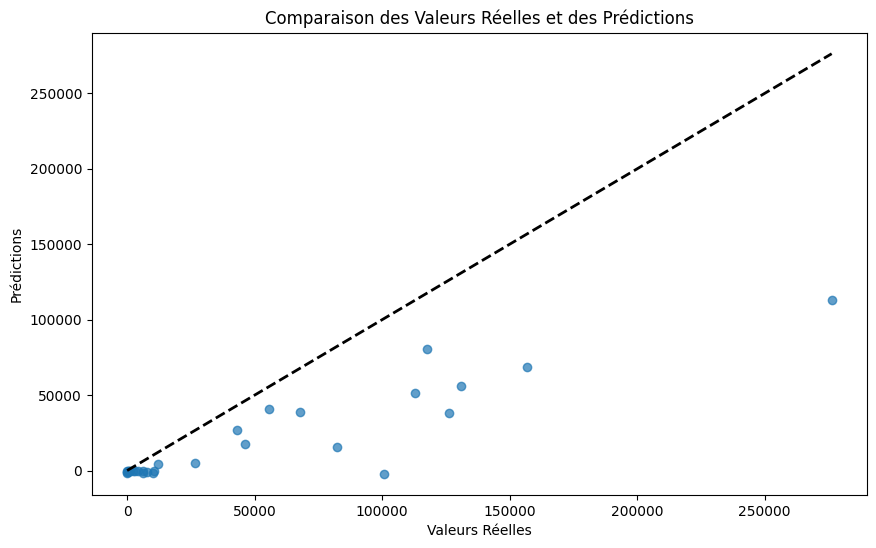

In [695]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

# le modele a tendance à sous évaluer les prédictions
# pointtt : toujours une tendance à sous évaluer

Les productions de riz continuent d'être largement sous-estimées pour l'année 2022. Celà indique que le problème n'était pas dû aux nombreux Nas.

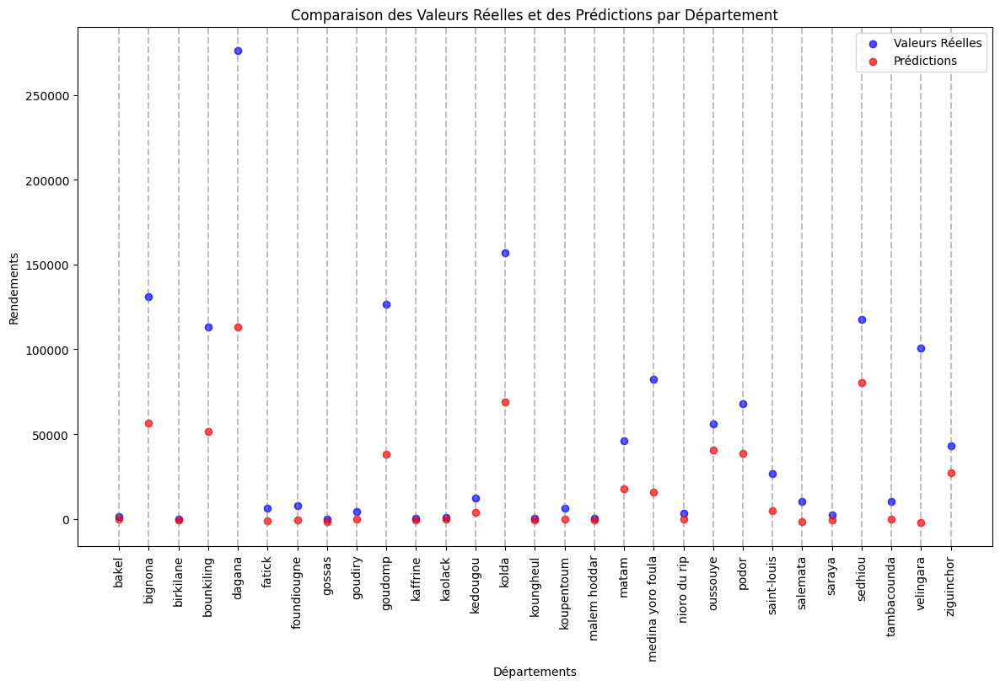

In [696]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

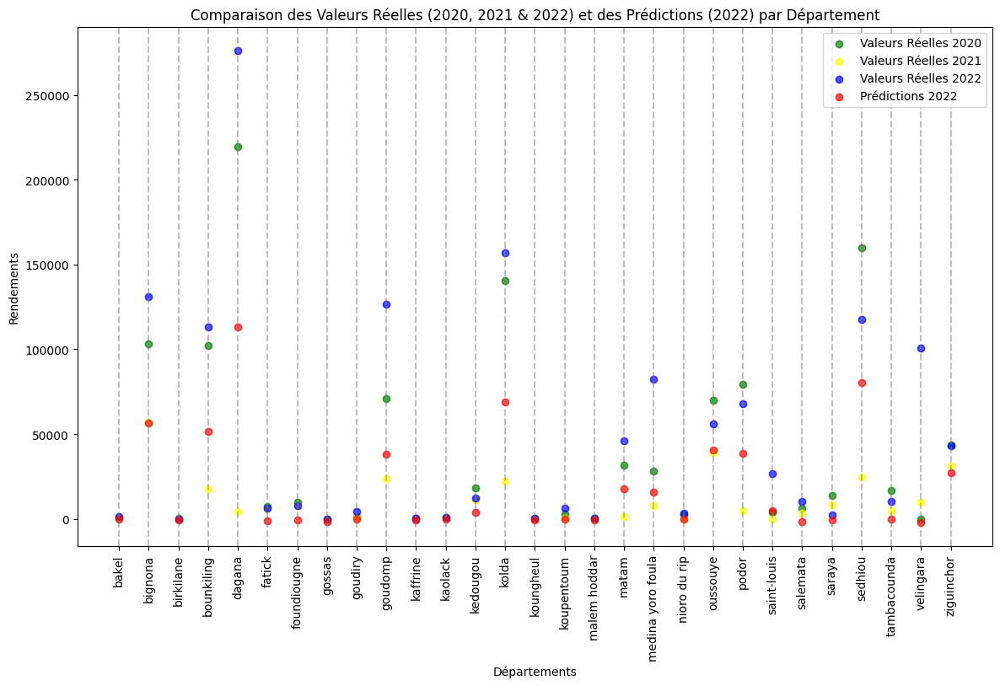

In [697]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Nous allons tout de même tenter la même approche en sophistiquant un peu plus le modèle.

In [702]:
# Modèle fully connected


import torch
import torch.nn as nn

class SimpleNN3_fc(nn.Module):
    def __init__(self, input_size):
        super(SimpleNN3_fc, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        self.relu = nn.LeakyReLU(0.1)

        # Ajout de couches Fully Connected pour mieux capturer les relations temporelles
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 29)

    def forward(self, x):
        # Appliquer les couches convolutives
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)

        # Global Average Pooling pour réduire la dimension
        x = self.global_avgpool(x).squeeze(-1)

        # Passer à travers les couches fully connected
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x



In [787]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [788]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 29])
y_train_tensor shape: torch.Size([29, 2])


In [789]:
# Entraîner le modèle
num_epochs = 200
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/200], Loss: 2309291264.0000
Epoch [20/200], Loss: 1094418560.0000
Epoch [30/200], Loss: 219594544.0000
Epoch [40/200], Loss: 117876232.0000
Epoch [50/200], Loss: 88979768.0000
Epoch [60/200], Loss: 80803264.0000
Epoch [70/200], Loss: 76611520.0000
Epoch [80/200], Loss: 75510072.0000
Epoch [90/200], Loss: 75127056.0000
Epoch [100/200], Loss: 74982704.0000
Epoch [110/200], Loss: 74910088.0000
Epoch [120/200], Loss: 74882768.0000
Epoch [130/200], Loss: 74863960.0000
Epoch [140/200], Loss: 74848328.0000
Epoch [150/200], Loss: 74834184.0000
Epoch [160/200], Loss: 74818808.0000
Epoch [170/200], Loss: 74802520.0000
Epoch [180/200], Loss: 74784512.0000
Epoch [190/200], Loss: 74764480.0000
Epoch [200/200], Loss: 74742000.0000


In [790]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([29])
torch.Size([29])
Test Loss: 1701686528.0000


In [791]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[ 7.06618591e+02  7.28109688e+04  1.25110245e+02  6.77645938e+04
   1.42184453e+05  5.42118896e+03  7.20550049e+03 -5.31605339e+00
   9.09725708e+02  4.83916523e+04  1.41870163e+02  4.59091217e+02
   1.31402881e+04  9.31384609e+04  4.75029221e+01  1.97790015e+03
   5.13048096e+01  2.06437539e+04  1.88702246e+04  1.58416760e+03
   4.95441836e+04  5.18713398e+04  2.34243872e+03  4.50951074e+03
   9.62777344e+03  1.06066719e+05  1.13855264e+04  1.10117603e+03
   3.15375293e+04]]
Véritables valeurs: [1.20215000e+03 1.30805959e+05 0.00000000e+00 1.12970762e+05
 2.76278720e+05 6.05302500e+03 7.98440400e+03 0.00000000e+00
 4.30686386e+03 1.26376519e+05 2.50877401e+02 9.05449514e+02
 1.22830049e+04 1.56708637e+05 3.21029692e+02 6.33749913e+03
 7.64611421e+01 4.61467200e+04 8.21316157e+04 3.27295520e+03
 5.57999148e+04 6.79716200e+04 2.65205700e+04 1.01133959e+04
 2.36198500e+03 1.17692612e+05 1.03780189e+04 1.00649957e+05
 4.32192600e+04]


In [792]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [793]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# 400 epochs, lr à 1.2, R2 négatif
# 200 epochs, lr à 1.2, R2 à 0.4065
# 200 epochs, lr à 0.1, R2 à 0.6194
# 200 epochs, lr à 0.01, R2 à 0.5504
# 200 epochs, lr à 0.5, R2 à 0.3437
# 200 epochs, lr à 0.05, R2 entre 0.10 et 0.15


# bon on va retenir que c'est 0.1 le bon lr
# essayons de changer le nombre d'epochs


Mean Absolute Error (MAE): 22899.1761
Mean Squared Error (MSE): 1701686803.3681
Root Mean Squared Error (RMSE): 41251.5067
R-squared (R²): 0.5954


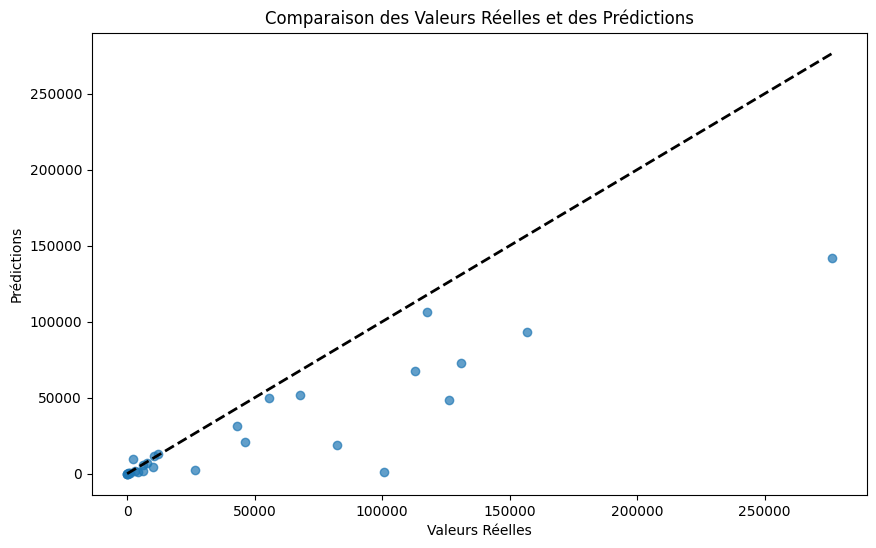

In [794]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

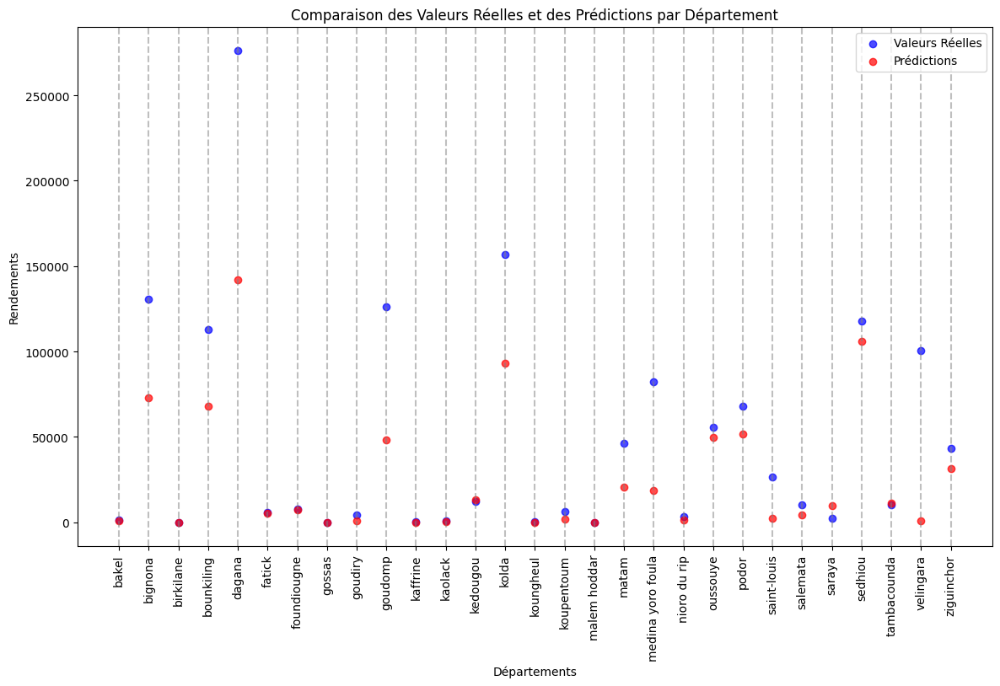

In [795]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

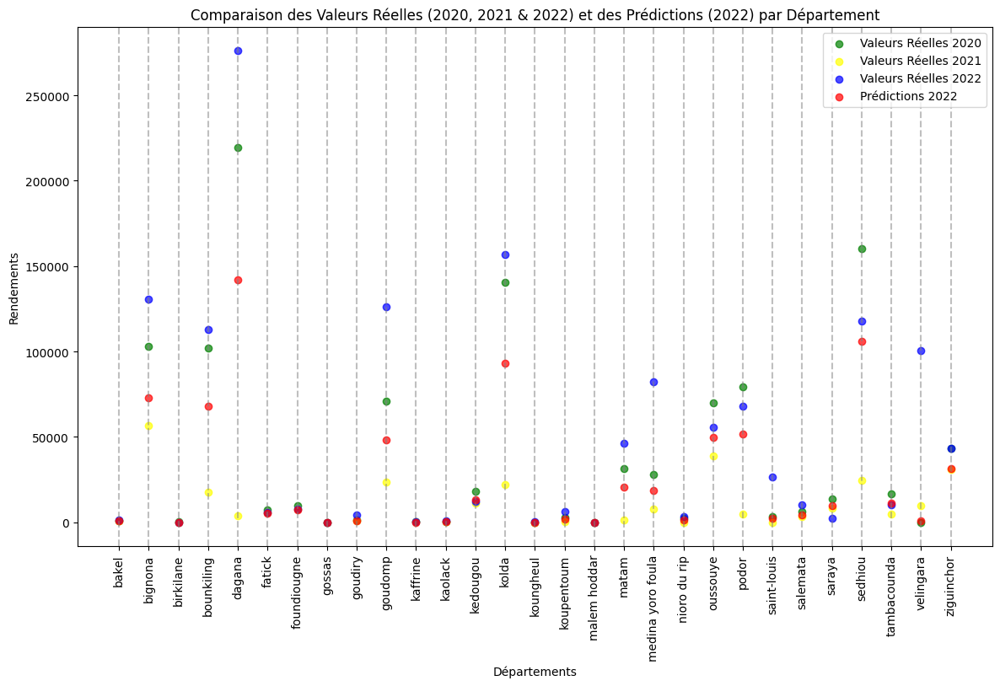

In [796]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Rappel: là il n'y a que les départements pour lesquels il y a au moins 2 années renseignées. S'il y a un Na, je l'ai remplacé par 0.

On voit que le modèle a tendance a sous-estimer les productions. Je vais essayer de modifier mon réseau pour prendre ça en compte... en changeant la fonction de perte notamment


Option 1: utiliser une autre fonction de perte déjà implémentée

huber is useful as a loss function in robust statistics or machine learning to reduce the influence of outliers as compared to the common squared error loss, residuals with a magnitude higher than delta are not squared

cf ici pour plus d'infos: https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.huber.html

In [896]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = nn.SmoothL1Loss()
optimizer = optim.Adam(model.parameters(), lr=0.01)


36


In [897]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 29])
y_train_tensor shape: torch.Size([29, 2])


In [898]:
# Entraîner le modèle
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/300], Loss: 24482.5000
Epoch [20/300], Loss: 24409.2617
Epoch [30/300], Loss: 24230.7793
Epoch [40/300], Loss: 23881.0996
Epoch [50/300], Loss: 23316.5059
Epoch [60/300], Loss: 22468.1875
Epoch [70/300], Loss: 21188.0977
Epoch [80/300], Loss: 19750.5840
Epoch [90/300], Loss: 18306.1523
Epoch [100/300], Loss: 16906.7305
Epoch [110/300], Loss: 15183.0000
Epoch [120/300], Loss: 13340.4512
Epoch [130/300], Loss: 11454.9395
Epoch [140/300], Loss: 9566.9580
Epoch [150/300], Loss: 8354.8223
Epoch [160/300], Loss: 7505.2974
Epoch [170/300], Loss: 6846.0532
Epoch [180/300], Loss: 6239.4009
Epoch [190/300], Loss: 5583.1421
Epoch [200/300], Loss: 4982.7749
Epoch [210/300], Loss: 4489.0410
Epoch [220/300], Loss: 4136.5854
Epoch [230/300], Loss: 3964.5305
Epoch [240/300], Loss: 3753.5413
Epoch [250/300], Loss: 3578.0034
Epoch [260/300], Loss: 3403.5693
Epoch [270/300], Loss: 3220.2053
Epoch [280/300], Loss: 3068.8550
Epoch [290/300], Loss: 3029.7366
Epoch [300/300], Loss: 2983.1614


In [899]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([29])
torch.Size([29])
Test Loss: 20837.0645


In [900]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[7.74805420e+02 7.53420078e+04 2.05452209e+02 7.42275547e+04
  1.59646266e+05 5.97868701e+03 7.67168848e+03 6.37616997e+01
  1.09761133e+03 5.19954336e+04 1.71230057e+02 6.11855286e+02
  1.38471650e+04 1.01715961e+05 1.01024651e+02 2.24019263e+03
  1.08161354e+02 2.25045410e+04 2.05917949e+04 1.66964075e+03
  5.13112578e+04 5.75050781e+04 2.37435522e+03 4.99314600e+03
  1.01844795e+04 1.16082086e+05 1.24377061e+04 9.69265259e+02
  3.19028887e+04]]
Véritables valeurs: [1.20215000e+03 1.30805959e+05 0.00000000e+00 1.12970762e+05
 2.76278720e+05 6.05302500e+03 7.98440400e+03 0.00000000e+00
 4.30686386e+03 1.26376519e+05 2.50877401e+02 9.05449514e+02
 1.22830049e+04 1.56708637e+05 3.21029692e+02 6.33749913e+03
 7.64611421e+01 4.61467200e+04 8.21316157e+04 3.27295520e+03
 5.57999148e+04 6.79716200e+04 2.65205700e+04 1.01133959e+04
 2.36198500e+03 1.17692612e+05 1.03780189e+04 1.00649957e+05
 4.32192600e+04]


In [901]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [902]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# 200 epochs, lr à 0.1, r2 à 0.2879
# 300 epochs, lr à 0.1, r2 à 0.5305
# 400 epochs, lr à 0.1, r2 à 0.5337
# 500 epochs, lr à 0.1, r2 à 0.4569

# donc on garde 400 epochs

# lr à 0.01, r2 à 0.7260
# lr à 0.001, r2 négatif
# lr à 0.005, r2 à 0.5449


# conclusion lr à 0.01 et 400 epochs
# update: avec 300 epochs j'ai 0.7645

Mean Absolute Error (MAE): 20837.5655
Mean Squared Error (MSE): 1447831643.9097
Root Mean Squared Error (RMSE): 38050.3830
R-squared (R²): 0.6557


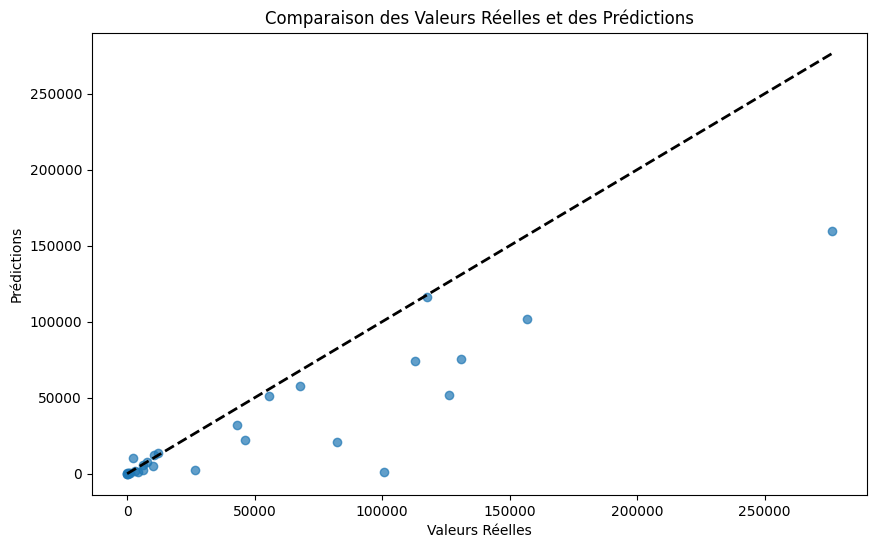

In [903]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()


# on change de fonction de perte. On utilise SmoothLoss. Ca s'améliore

ca a toujours tendance à sous-estimer mais c'est moins prononcé. Le r2 score s'est également amélioré.

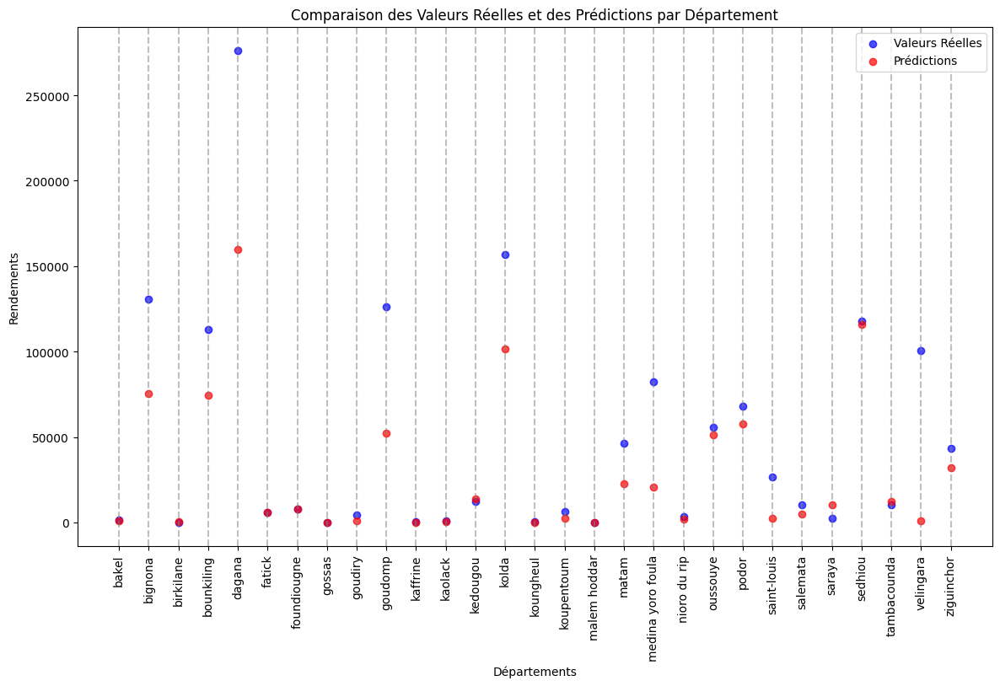

In [904]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

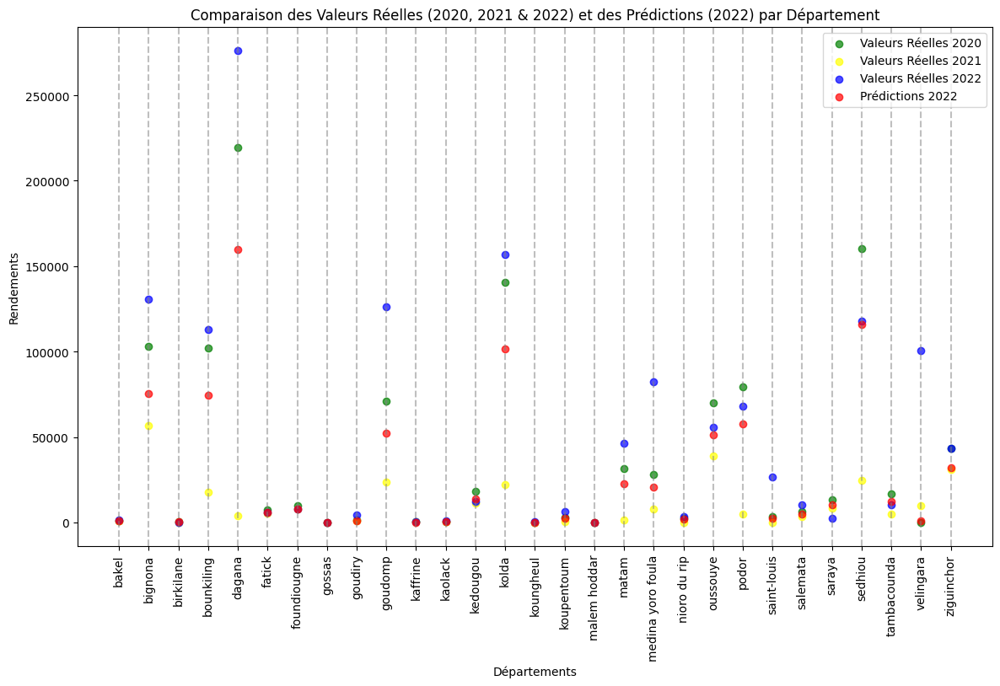

In [905]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Option 2: Ecrire ma propre fonction de perte, un peu comme j'avais fait tout à l'heure. Puisque notre modèle a toujours tendance à sous-estimer les productions malgrè nos nombreux changements, cette fonction de perte pénalisera plus les cas de sous que de sur-estimation.

In [981]:
class UnderEstimateLoss(nn.Module):
    def __init__(self):
        super(UnderEstimateLoss, self).__init__()
    
    def forward(self, outputs, targets):
        loss = torch.mean(torch.where(outputs < targets, 2 * (targets - outputs) ** 2, (outputs - targets) ** 2))
        return loss


In [1006]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = SimpleNN3_fc(input_size)
criterion = UnderEstimateLoss()
optimizer = optim.Adam(model.parameters(), lr=0.1)


36


In [1007]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 29])
y_train_tensor shape: torch.Size([29, 2])


In [1008]:
# Entraîner le modèle
num_epochs = 600
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/600], Loss: 2350556160.0000
Epoch [20/600], Loss: 1284290176.0000
Epoch [30/600], Loss: 372861504.0000
Epoch [40/600], Loss: 120529512.0000
Epoch [50/600], Loss: 91532008.0000
Epoch [60/600], Loss: 81556384.0000
Epoch [70/600], Loss: 77280424.0000
Epoch [80/600], Loss: 75256920.0000
Epoch [90/600], Loss: 74953800.0000
Epoch [100/600], Loss: 74458400.0000
Epoch [110/600], Loss: 74093168.0000
Epoch [120/600], Loss: 73583392.0000
Epoch [130/600], Loss: 72357848.0000
Epoch [140/600], Loss: 70347408.0000
Epoch [150/600], Loss: 67016132.0000
Epoch [160/600], Loss: 62045464.0000
Epoch [170/600], Loss: 56095784.0000
Epoch [180/600], Loss: 49262796.0000
Epoch [190/600], Loss: 40937252.0000
Epoch [200/600], Loss: 30306978.0000
Epoch [210/600], Loss: 17791298.0000
Epoch [220/600], Loss: 6319048.5000
Epoch [230/600], Loss: 1665420.8750
Epoch [240/600], Loss: 407051.7812
Epoch [250/600], Loss: 38118.3984
Epoch [260/600], Loss: 69812.1562
Epoch [270/600], Loss: 22548.8945
Epoch [280/600], 

In [1009]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([29])
torch.Size([29])
Test Loss: 2262853632.0000


In [1010]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[ 5.84124878e+02  6.22353477e+04  5.37833443e+01  5.55816406e+04
   1.15323734e+05  4.92265137e+03  6.58510352e+03 -4.14445610e+01
   7.37032471e+02  4.04019570e+04  5.82058487e+01  4.00142700e+02
   1.14918564e+04  7.62371641e+04  6.67358780e+00  1.56361035e+03
  -6.56552429e+01  1.67402754e+04  1.57356504e+04  1.22324548e+03
   4.23051367e+04  4.20756836e+04  1.82270203e+03  3.91782788e+03
   8.48098145e+03  8.67832188e+04  9.54272168e+03  1.69979688e+03
   2.74007129e+04]]
Véritables valeurs: [1.20215000e+03 1.30805959e+05 0.00000000e+00 1.12970762e+05
 2.76278720e+05 6.05302500e+03 7.98440400e+03 0.00000000e+00
 4.30686386e+03 1.26376519e+05 2.50877401e+02 9.05449514e+02
 1.22830049e+04 1.56708637e+05 3.21029692e+02 6.33749913e+03
 7.64611421e+01 4.61467200e+04 8.21316157e+04 3.27295520e+03
 5.57999148e+04 6.79716200e+04 2.65205700e+04 1.01133959e+04
 2.36198500e+03 1.17692612e+05 1.03780189e+04 1.00649957e+05
 4.32192600e+04]


In [1011]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [1012]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# 300 epochs, lr à 0.01, r2 à 0.5786 puis 0.6505 puis 0.5837
# 300 epochs, lr à 0.1, r2 à 0.6052 puis 0.6015 puis 0.6460
# 300 epochs, lr à 1, r2 à 0.2199 puis 0.6689 puis 0.4349 (c'est tres tres intable, là ça vient d'être négatif)
# 300 epochs, lr à 0.05, r2 à 

Mean Absolute Error (MAE): 27160.7470
Mean Squared Error (MSE): 2262853720.4229
Root Mean Squared Error (RMSE): 47569.4621
R-squared (R²): 0.4619


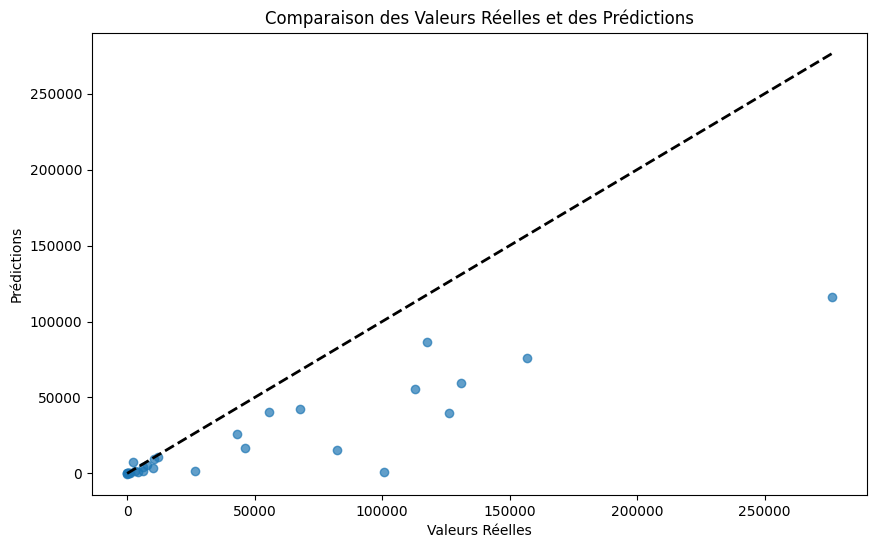

In [997]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

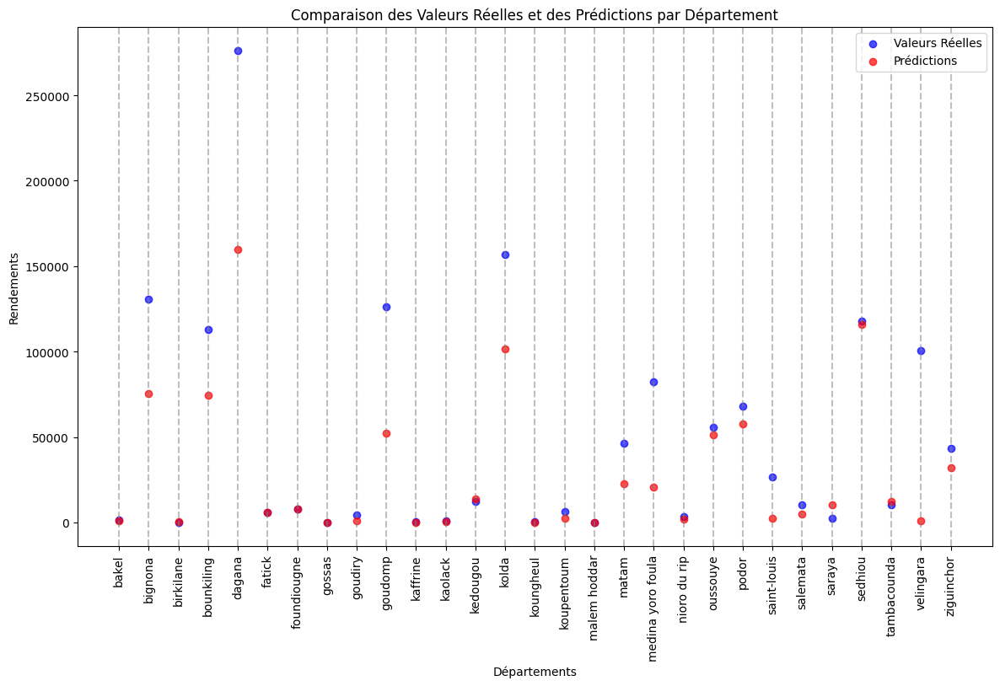

In [904]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

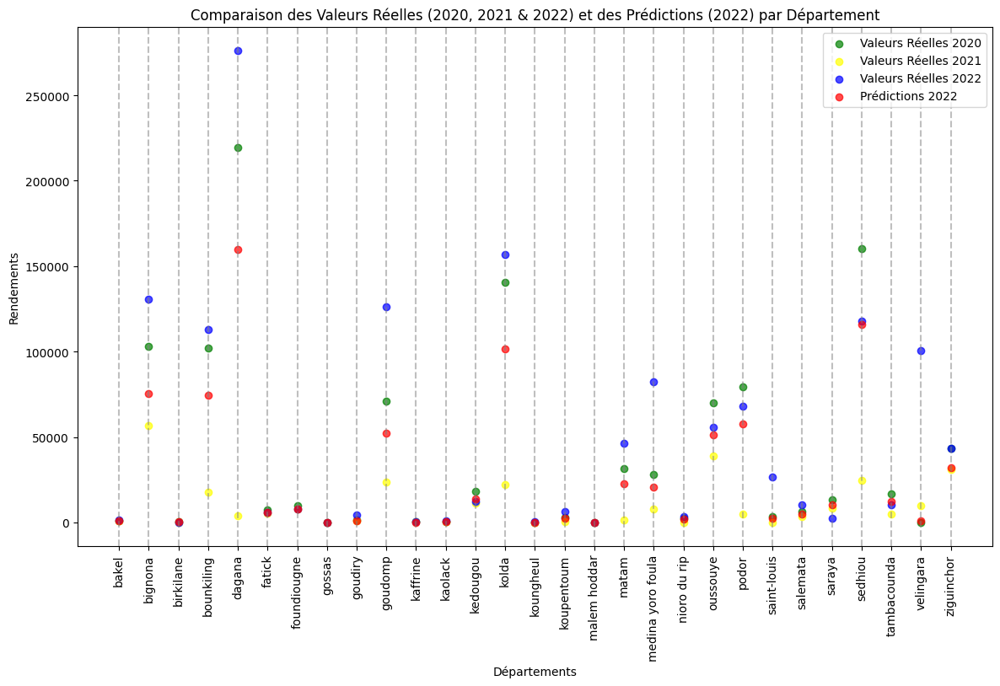

In [905]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

Notre problème se pose toujours. Nous allons essayer de modifier le réseau de neurones directement afin de mieux capter l'information durant l'apprentissage.

In [1079]:
import torch
import torch.nn as nn

class EnhancedNN(nn.Module):
    def __init__(self, input_size):
        super(EnhancedNN, self).__init__()
        
        # Convolutional layers with increased complexity
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8)
        self.conv2 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5)
        self.conv3 = nn.Conv1d(in_channels=256, out_channels=256, kernel_size=3)
        self.conv4 = nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3)
        
        # Batch Normalization layers
        self.batchnorm1 = nn.BatchNorm1d(128)
        self.batchnorm2 = nn.BatchNorm1d(256)
        self.batchnorm3 = nn.BatchNorm1d(256)
        self.batchnorm4 = nn.BatchNorm1d(128)
        
        # Activation function
        self.relu = nn.LeakyReLU(0.1)
        
        # Global Average Pooling
        self.global_avgpool = nn.AdaptiveAvgPool1d(1)
        
        # Fully connected layers for better temporal relationships
        self.fc1 = nn.Linear(128, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 29)  # Output layer
        
        # Dropout layers to prevent overfitting
        self.dropout = nn.Dropout(0.3)
        
    def forward(self, x):
        # Apply convolutional layers with batchnorm and activation
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)
        
        x = self.conv4(x)
        x = self.batchnorm4(x)
        x = self.relu(x)
        
        # Global Average Pooling
        x = self.global_avgpool(x).squeeze(-1)
        
        # Apply fully connected layers with dropout
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        # Output layer
        x = self.fc3(x)
        
        return x


Nous avons notamment augmenté le nombre de couches fortement connectées.

In [1155]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train_scaled.shape[1]
print(input_size)
model = EnhancedNN(input_size)
criterion = UnderEstimateLoss()
optimizer = optim.Adam(model.parameters(), lr=1.5)


36


In [1156]:
# Convertir les données en tenseurs PyTorch
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)


print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")


X_train_tensor shape: torch.Size([2, 36, 29])
y_train_tensor shape: torch.Size([29, 2])


In [1157]:
# Entraîner le modèle
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    # print(X_train_tensor.shape)
    outputs = model(X_train_tensor)
    # y_train_tensor = y_train_tensor.unsqueeze(1)
    outputs = outputs.squeeze()
    # print(outputs.shape)
    # print(y_train_tensor.shape)
    loss = criterion(outputs.T, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/300], Loss: 5827481600.0000
Epoch [20/300], Loss: 3496078592.0000
Epoch [30/300], Loss: 3154017280.0000
Epoch [40/300], Loss: 1507838976.0000
Epoch [50/300], Loss: 12662737920.0000
Epoch [60/300], Loss: 7778982912.0000
Epoch [70/300], Loss: 15819794432.0000
Epoch [80/300], Loss: 14635938816.0000
Epoch [90/300], Loss: 97137704960.0000
Epoch [100/300], Loss: 116494721024.0000
Epoch [110/300], Loss: 239424651264.0000
Epoch [120/300], Loss: 847035105280.0000
Epoch [130/300], Loss: 1643079008256.0000
Epoch [140/300], Loss: 1711657844736.0000
Epoch [150/300], Loss: 622960246784.0000
Epoch [160/300], Loss: 381638934528.0000
Epoch [170/300], Loss: 266153607168.0000
Epoch [180/300], Loss: 716949880832.0000
Epoch [190/300], Loss: 634592034816.0000
Epoch [200/300], Loss: 354264186880.0000
Epoch [210/300], Loss: 143589359616.0000
Epoch [220/300], Loss: 94241308672.0000
Epoch [230/300], Loss: 54910607360.0000
Epoch [240/300], Loss: 62299738112.0000
Epoch [250/300], Loss: 54481879040.0000


In [1158]:
# Évaluer le modèle
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    print(y_pred_tensor.squeeze().shape)
    print(y_test_tensor.shape)
    test_loss = criterion(y_pred_tensor.squeeze(), y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')


torch.Size([29])
torch.Size([29])
Test Loss: 18039093248.0000


In [1159]:

# Convertir les prédictions en NumPy pour l'affichage
y_pred = y_pred_tensor.numpy()

# Afficher quelques prédictions
print("Prédictions:", y_pred)
print("Véritables valeurs:", y_test.values)

Prédictions: [[ 157905.95    65207.53   -14041.196   49559.133   73900.31   168964.62
   189684.7   -145861.88   149703.25   135180.17   187723.22   123375.19
   153804.86   352153.22   -57385.78   -66306.64   103744.64     6311.179
    57190.176 -161172.39   126980.99    34199.07   -13688.895  114419.14
   139450.8    387236.     227732.45   -76034.8     81458.164]]
Véritables valeurs: [1.20215000e+03 1.30805959e+05 0.00000000e+00 1.12970762e+05
 2.76278720e+05 6.05302500e+03 7.98440400e+03 0.00000000e+00
 4.30686386e+03 1.26376519e+05 2.50877401e+02 9.05449514e+02
 1.22830049e+04 1.56708637e+05 3.21029692e+02 6.33749913e+03
 7.64611421e+01 4.61467200e+04 8.21316157e+04 3.27295520e+03
 5.57999148e+04 6.79716200e+04 2.65205700e+04 1.01133959e+04
 2.36198500e+03 1.17692612e+05 1.03780189e+04 1.00649957e+05
 4.32192600e+04]


In [1160]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prédictions sur les données de test
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor)
    y_pred = y_pred_tensor.squeeze().numpy()

In [1161]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# 300 epochs, lr à 0.01, r2 à 0.6842 puis 0.6160 puis 0.6479
# 300 epochs, lr à 0.1, r2 à 0.7799 puis 0.7983 puis 0.6625
# 300 epochs, lr à 1, r2 à 0.7016 puis 0.6655 puis 0.7524
# 300 epochs, lr à 1.2, r2 à 0.7600 puis négatif puis 0.8303
# 300 epochs, lr à 1.5, r2 à 3778 puis 0.7257 puis négatif

Mean Absolute Error (MAE): 115356.4268
Mean Squared Error (MSE): 18039092811.1982
Root Mean Squared Error (RMSE): 134309.6899
R-squared (R²): -3.2893


Les résultats s'améliorent considérablement. Pour certains taux d'apprentissage, nous dépassons les 70%, voire frôlons les 80% de R2 score.

Mais l'apprentissage est très instable quand meme ... Je vais essayer de le stabiliser avec une méthode de moyenne. Soit je fais la moyenne des prédictions obtenues pour les productions, soit la moyenne des paramètres de choix de modèles (r2, rmse, etc.). Il est plus pertinent de faire la moyenne des prédictions puis d'en tirer les métriques d'erreur globales.

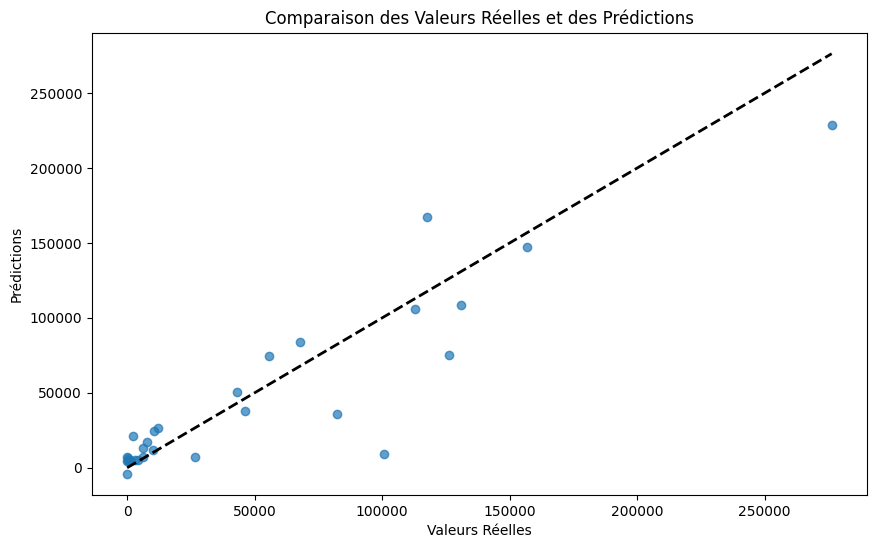

In [1140]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel("Valeurs Réelles")
plt.ylabel("Prédictions")
plt.title("Comparaison des Valeurs Réelles et des Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

l'ajustement est beaucoup mieux avec les parametres que j'ai renseignés plus haut. Le problème de sous-estimation des productions semble résolu.

Notons quand meme l'ajustement global est beaucoup mieux, mais au cas par cas, certaines productions sont extrêmement mal prédites. Il y en a même une prédite à 0 et qui est en faite à 100.000 (on voit en bas que c'est Velingara). Après ce département a une évolution très instable de ses productions: 

SN-KD-VE	VELINGARA	187610.8414	292359	148381.82	0	9913.571326	100649.9568

Erreurs de mesure ? peut-être

In [1046]:
riz

,Region Name,2017,2018,2019,2020,2021,2022
SN-FK-FD,FATICK,6282,0,4284.0044,7418.32173,5596.6624,6053.025
SN-FK-FO,FOUNDIOUGNE,6300,7400,5496.4224,9772.218,7988.326228,7984.404
SN-FK-GO,GOSSAS,316.1779815,0,0,0,0,0
SN-KA-BI,BIRKILANE,202.6585293,0,77.44,207.5416233,0,0
SN-KA-KA,KAFFRINE,314.792915,288.6019106,110.322,194.649606,199.0522251,250.8774014
SN-KA-KO,KOUNGHEUL,175.0791663,0,30.312,82.61748133,0,321.029692
SN-KA-MO,MALEM HODDAR,106.766,0,30.6,77.20441372,59.8579788,76.46114205
SN-KL-KA,KAOLACK,1342.315215,845,343.2521951,608.5334136,616.1301465,905.4495144
SN-KL-ND,NIORO DU RIP,2913.888,2480,1343.4992,2447.1772,0,3272.9552
SN-KE-KE,KEDOUGOU,16423.77,18419.4912,11147.05297,18378.24435,11449.21099,12283.00492


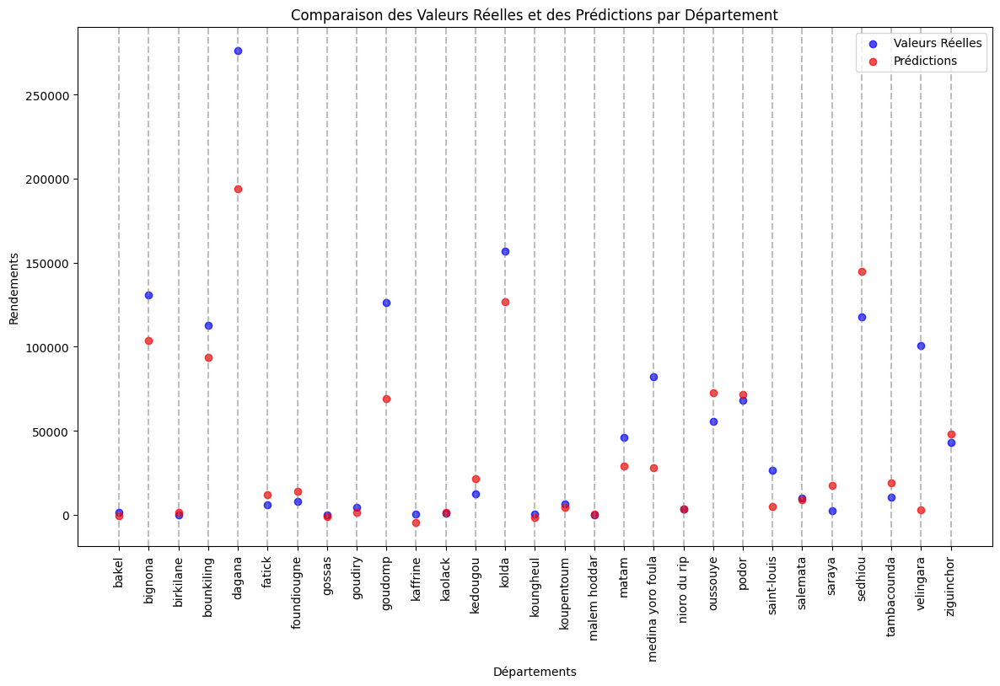

In [1045]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022, et `y_pred` contient les prédictions pour 2022

# Assurez-vous que `departments`, `y_test`, et `y_pred` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles et prédites pour chaque département
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles et des Prédictions par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

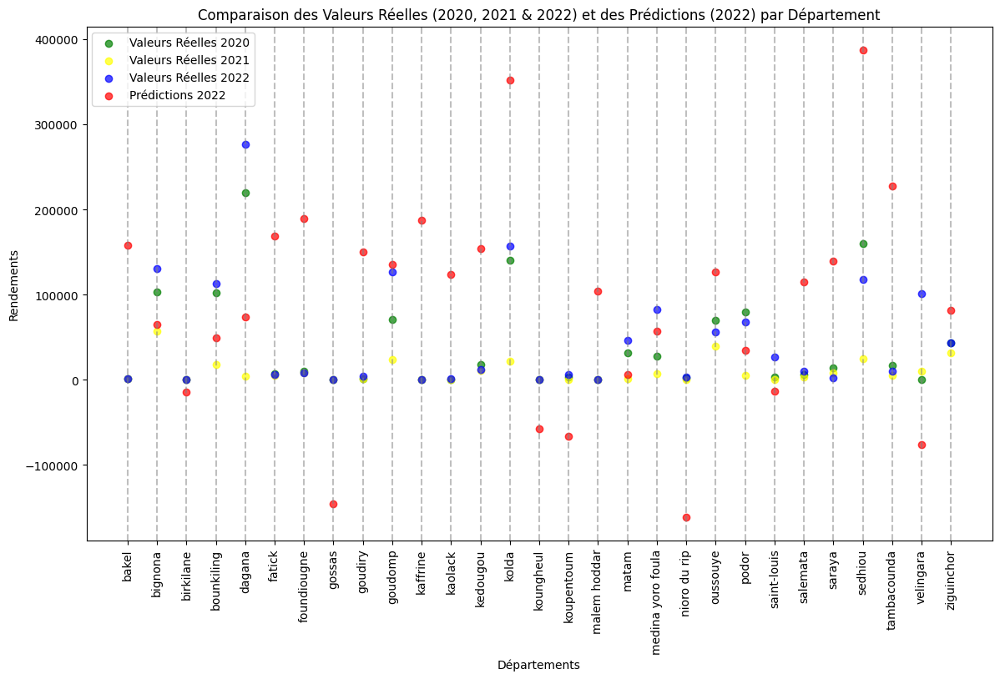

In [1163]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que `departments` soit une liste avec les noms des départements
# `y_test` contient les valeurs réelles pour 2022
# `y_pred` contient les prédictions pour 2022
# `y_train_2021` contient les valeurs réelles pour 2021 (année d'apprentissage)

# Assurez-vous que `departments`, `y_test`, `y_pred`, et `y_train_2021` sont alignés correctement
departments = all_data['Department'].unique()

# Tracer les valeurs réelles pour 2021, les valeurs réelles pour 2022 et les prévisions pour 2022
plt.figure(figsize=(14, 8))
plt.scatter(departments, y_train['Yield2020'], color='green', label='Valeurs Réelles 2020', alpha=0.7)
plt.scatter(departments, y_train['Yield2021'], color='yellow', label='Valeurs Réelles 2021', alpha=0.7)
plt.scatter(departments, y_test, color='blue', label='Valeurs Réelles 2022', alpha=0.7)
plt.scatter(departments, y_pred, color='red', label='Prédictions 2022', alpha=0.7)

# Ajouter des lignes verticales pour chaque département
for i in range(len(departments)):
    plt.axvline(x=departments[i], color='grey', linestyle='--', alpha=0.5)

plt.xlabel("Départements")
plt.ylabel("Rendements")
plt.title("Comparaison des Valeurs Réelles (2020, 2021 & 2022) et des Prédictions (2022) par Département")
plt.xticks(rotation=90)  # Pour incliner les noms des départements si nécessaire
plt.legend()
plt.show()

## Compléments

Bien maintenant, je veux pouvoir faire la moyenne de mes r2 score et de mes rmse. Je vais plutôt faire la moyenne des prédictions. C'est plus logique. Et puis ça fera de fait également la moyenne des métriques de calcul d'erreur.

In [1216]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

In [1217]:
# Assuming you have a DataLoader `train_loader` and `test_loader`
n_iterations = 30
predictions_list = []
mae_list = []
mse_list = []
rmse_list = []
r2_list = []

In [1218]:
# Custom loss class
class CustomLoss(nn.Module):
    def __init__(self):
        super(CustomLoss, self).__init__()
    
    def forward(self, outputs, targets):
        loss = torch.mean(torch.where(outputs < targets, (targets - outputs) ** 2, (outputs - targets) ** 2))
        return loss

In [1219]:
# Version modifiée
# Function to train and evaluate the model
def train_and_evaluate_model():
    model = SimpleNN3_fc(input_size=input_size)  # Assuming your_input_size is defined
    criterion = CustomLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.01)

    # Training loop (example with one epoch, adjust as needed)
    num_epochs = 300
    for epoch in range(num_epochs):  # Modify if you want more epochs
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        outputs = outputs.squeeze()
        loss = criterion(outputs.T, y_train_tensor)
        loss.backward()
        optimizer.step()

    # Evaluation on the test set
    model.eval()
    predictions = []
    # all_targets = []
    with torch.no_grad():
        y_pred_tensor = model(X_test_tensor)
        # outputs = model(inputs)
        predictions.append(y_pred_tensor.numpy())
        # all_targets.append(targets.numpy())

    # all_predictions = np.concatenate(all_predictions)
    # all_targets = np.concatenate(all_targets)
    
    y_pred = y_pred_tensor.numpy()
    # y_test = y_test_tensor.numpy()
    
    # Calculate error metrics
    mae = mean_absolute_error(y_test.squeeze(), y_pred.squeeze())
    mse = mean_squared_error(y_test.squeeze(), y_pred.squeeze())
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test.squeeze(), y_pred.squeeze())

    # return predictions, mae, mse, rmse, r2
    return predictions, mae, mse, rmse, r2

In [1220]:
input_size = X_train_scaled.shape[1]

# n_iterations, c'est le nombre d'apprentissages sur lequel nous souhaitons faire la moyenne de prédiction
n_iterations = 30

# Loop for multiple iterations
for i in range(n_iterations):
    predictions, mae, mse, rmse, r2 = train_and_evaluate_model()
    predictions_list.append(predictions)
    mae_list.append(mae)
    mse_list.append(mse)
    rmse_list.append(rmse)
    r2_list.append(r2)

In [1221]:
# Average predictions over all iterations
average_predictions = np.mean(predictions_list, axis=0)

In [1222]:
# Calculate final error metrics on averaged predictions
final_mae = mean_absolute_error(y_test.squeeze(), average_predictions.squeeze())
final_mse = mean_squared_error(y_test.squeeze(), average_predictions.squeeze())
final_rmse = np.sqrt(final_mse)
final_r2 = r2_score(y_test.squeeze(), average_predictions.squeeze())

In [1223]:
# j'ai fait les moyennes des prédictions puis j'en ai déduit le rmse et les r2 moyens


# Display final metrics
print(f"Final MAE: {final_mae}")
print(f"Final MSE: {final_mse}")
print(f"Final RMSE: {final_rmse}")
print(f"Final R²: {final_r2}")

Final MAE: 22596.077361080967
Final MSE: 1690699777.3640807
Final RMSE: 41118.11981795958
Final R²: 0.5979881519963719


Le R2 global n'est pas incroyable (0.59). Et je pense savoir pourquoi. En fait, l'apprentissage est tellement instable que certaines fois, quand j'exécutais, j'avais des R2 très bas, même négatifs certaines fois. Puis quand je ré exécute la fois d'après c'est ok. Je pense que c'est lié au taux d'apprentissage que je choisis...

On va afficher la liste des R2, je vais voir qu'est ce que ça va donner

In [1198]:
r2_list

[0.5295787088815886,
 0.5971852975624072,
 0.5743420818475186,
 0.5486101336964311,
 0.5811405978040979,
 0.5548476405329725,
 0.7734926414740072,
 0.5961006987157695,
 0.5978125162785948,
 0.5861027486013564,
 0.6199403652494355,
 0.48149155822559686,
 0.6332359187605054,
 0.5834225500494774,
 0.6322686014875447,
 0.5304852969557496,
 0.6324564725159145,
 0.6360639643074895,
 0.6317537541697222,
 0.6514763973382995,
 0.572890379045969,
 0.6529030356943315,
 0.5289553343242085,
 0.5988250989891298,
 0.5885141299459771,
 0.5424103534661133,
 0.5450007489617733,
 0.5221390665376578,
 0.6164973842049748,
 0.6739128576691775]

Il varie entre globalement 0.52 et 0.65. On a des pics à 0.48 et 0.77.

Je ré exécute voir si ça a moins permis de stabiliser les indicateurs, c'était le but initial.

J'ai 0.60. Je le refais 2 autres fois et c'est bon

0.60 et 0.61. C'est bon c'est assez stable. Bon de toutes façons si on veut plus stable, on augmente le nombre d'itérations d'entrainement.

Okay sinon autre chose. Une fois que le r2 moyen, rmse moyen, etc. sont calculés, il est peut être plus pertinent de conserver les prédictions qui maximisent le r2 (ou minimisent le rmse)

In [1224]:
len(mse_list)

30

In [1225]:
# Find maximum R² and its position
max_r2 = max(r2_list)
max_r2_index = r2_list.index(max_r2)

# Find minimum MAE, MSE, and RMSE and their positions
min_mae = min(mae_list)
min_mae_index = mae_list.index(min_mae)

min_mse = min(mse_list)
min_mse_index = mse_list.index(min_mse)

min_rmse = min(rmse_list)
min_rmse_index = rmse_list.index(min_rmse)

# Print or store the results
print(f"Maximum R²: {max_r2} at iteration {max_r2_index}")
print(f"Minimum MAE: {min_mae} at iteration {min_mae_index}")
print(f"Minimum MSE: {min_mse} at iteration {min_mse_index}")
print(f"Minimum RMSE: {min_rmse} at iteration {min_rmse_index}")

Maximum R²: 0.7635609485193644 at iteration 19
Minimum MAE: 17513.334297370995 at iteration 19
Minimum MSE: 994367339.3797023 at iteration 19
Minimum RMSE: 31533.590651552866 at iteration 19


In [ ]:
# Store metrics from individual runs
metrics_dict = {
    "MAE": mae_list,
    "MSE": mse_list,
    "RMSE": rmse_list,
    "R²": r2_list
}

C'est le même modèle pour les 4 indicateurs. Il s'agit de celui qui fait les meilleures performances

## ANNEXE

La partie qui suit correspond à des idées que j'ai eues mais que je n'ai pas pues finaliser par manque de temps. J'ai quand même décidé de la laisser car ça pourrait constituer des pistes pour des travaux complémentaires

J'ai envie d'analyser l'importance de chaque feature dans le modèle, leur pouvoir prédictif en quelque sorte

Approche 1: corrélation de Pearson

In statistics, the Pearson correlation coefficient (PCC) is a correlation coefficient that measures linear correlation between two sets of data. It is the ratio between the covariance of two variables and the product of their standard deviations; thus, it is essentially a normalized measurement of the covariance, such that the result always has a value between −1 and 1.

In [1227]:
# pointtt


correlation_matrix = X_train.corrwith(y_train)
print(correlation_matrix.to_list())


[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


In [1228]:
X_train.columns.to_list()

,Jan_ndvi,Feb_ndvi,Mar_ndvi,Apr_ndvi,May_ndvi,Jun_ndvi,Jul_ndvi,Aug_ndvi,Sept_ndvi,Oct_ndvi,...,Mar_rain,Apr_rain,May_rain,Jun_rain,Jul_rain,Aug_rain,Sept_rain,Oct_rain,Nov_rain,Dec_rain
0,0.261373,0.243739,0.223248,0.217857,0.212408,0.370194,0.512371,0.671292,0.651548,0.536969,...,0.000014,0.000045,0.208235,2.566674,3.893498,11.238800,4.248837,1.230169,0.030564,0.000892
1,0.450318,0.367808,0.325922,0.307612,0.306105,0.345220,0.481271,0.580475,0.679081,0.655149,...,0.000172,0.003802,0.019874,2.289953,6.200789,13.188679,10.219160,1.922315,0.029028,0.029404
2,0.239233,0.227222,0.214794,0.199590,0.188848,0.176756,0.351311,0.559009,0.672464,0.617560,...,0.000006,0.000000,0.000000,1.837314,3.653978,9.406191,4.870818,1.289661,0.004801,0.024869
3,0.371602,0.293450,0.277845,0.269917,0.272437,0.339902,0.588389,0.671528,0.773928,0.744116,...,0.000005,0.000000,0.024965,2.715240,5.648990,10.513983,7.231072,2.267598,0.026567,0.010117
4,0.198287,0.198479,0.193791,0.213732,0.217972,0.186565,0.272792,0.367371,0.431870,0.352461,...,0.000006,0.000017,0.000000,0.252603,0.120625,4.808416,2.224642,0.372102,0.002793,0.019077
5,0.208799,0.203343,0.194405,0.187499,0.184056,0.170761,0.260488,0.424824,0.498386,0.457478,...,0.000019,0.000000,0.000000,1.001756,1.810979,11.378980,3.953227,1.205274,0.006017,0.082908
6,0.314511,0.294715,0.271235,0.253902,0.253502,0.255724,0.406952,0.534988,0.598463,0.582398,...,0.000186,0.000000,0.000000,1.348988,2.761478,12.656536,5.769612,1.763327,0.002819,0.061052
7,0.225760,0.215473,0.202012,0.190561,0.180744,0.169447,0.291832,0.519529,0.585549,0.521962,...,0.000037,0.000000,0.000000,1.286039,1.856420,7.952595,3.775509,1.084538,0.003447,0.027162
8,0.279911,0.256492,0.238674,0.238304,0.234552,0.393187,0.565830,0.742578,0.703700,0.570833,...,0.002339,0.000854,0.054008,2.514055,4.963210,10.519022,5.367127,1.828186,0.019598,0.003969
9,0.506290,0.435321,0.366894,0.352467,0.359042,0.449786,0.583407,0.647977,0.763729,0.696571,...,0.000000,0.000032,0.020270,2.863999,8.040293,12.892276,8.687968,3.122945,0.065478,0.015191


In [1229]:
y_train

,Yield2020,Yield2021
0,936.000000,910.000000
1,103055.215500,56873.508050
2,207.541623,0.000000
3,102000.000000,17470.168230
4,219667.500000,4068.750000
5,7418.321730,5596.662400
6,9772.218000,7988.326228
7,0.000000,0.000000
8,1268.042591,804.073191
9,70887.193800,23812.375480


Ca donne que des Nas (j'essaierai de comprendre demain)

Méthode 2: Permuter les valeurs d'un feature puis mesurer les performances du modèle. Si, par exemple, pour un feature donné, elles baissent beraucoup, c'est que ce feature est important.

In [1230]:
from sklearn.inspection import permutation_importance

# Supposons que `model` soit votre réseau de neurones entraîné et `X_test` votre jeu de données de test
result = permutation_importance(model, X_test_tensor.numpy(), y_test_tensor.numpy(), n_repeats=10, random_state=42)

# Afficher l'importance des features
importance_df = pd.DataFrame(result.importances_mean, index=feature_names, columns=['Importance'])
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print(importance_df)


InvalidParameterError: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got EnhancedNN(
  (conv1): Conv1d(36, 128, kernel_size=(8,), stride=(1,))
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,))
  (conv3): Conv1d(256, 256, kernel_size=(3,), stride=(1,))
  (conv4): Conv1d(256, 128, kernel_size=(3,), stride=(1,))
  (batchnorm1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm3): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): LeakyReLU(negative_slope=0.1)
  (global_avgpool): AdaptiveAvgPool1d(output_size=1)
  (fc1): Linear(in_features=128, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=29, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
) instead.

Ce que j'ai utilisé plus haut est applicable à un modèle scikit-learn, ce qui n'est pas mon cas. Donc, on va faire notre propre méthode qui va faire ça.

In [1239]:
import numpy as np

def custom_permutation_importance(model, X_test, y_test, n_repeats=10):
    baseline_predictions = model(X_test).detach().numpy()
    baseline_score = mean_squared_error(y_test.squeeze().numpy(), baseline_predictions.squeeze())

    feature_importances = np.zeros(X_test.shape[1])

    for i in range(X_test.shape[1]):
        scores = np.zeros(n_repeats)
        for n in range(n_repeats):
            X_permuted = X_test.clone()
            X_permuted[:, i] = X_permuted[:, i][torch.randperm(X_test.shape[0])]
            
            permuted_predictions = model(X_permuted).detach().numpy()
            permuted_score = mean_squared_error(y_test.squeeze().numpy(), permuted_predictions.squeeze())
            scores[n] = permuted_score
        
        feature_importances[i] = np.mean(scores) - baseline_score
    
    return feature_importances



In [1240]:
# Utilisation de la fonction
feature_importances = custom_permutation_importance(model, X_test_tensor, y_test_tensor)
importance_df = pd.DataFrame(feature_importances, index=feature_names, columns=['Importance'])
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print(importance_df)


NameError: name 'feature_names' is not defined

In [324]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Supposons que votre dataframe `all_data` contienne les colonnes 'Yield2020', 'Yield2021', 'Yield2022'
department_name = 'bakel'  # Nom du département
department_data = all_data[all_data['Department'] == department_name]
print(department_data.columns)

# Reformatage pour les séries temporelles
yields = department_data[['Yield2020', 'Yield2021', 'Yield2022']].T
print(yields)
yields.index = [2020, 2021, 2022]  # Années comme index
yields.columns = ['Yield']
print(yields)



Index(['Department', 'Jan2020_ndvi', 'Feb2020_ndvi', 'Mar2020_ndvi',
       'Apr2020_ndvi', 'May2020_ndvi', 'Jun2020_ndvi', 'Jul2020_ndvi',
       'Aug2020_ndvi', 'Sept2020_ndvi',
       ...
       'Apr2022_rain', 'May2022_rain', 'Jun2022_rain', 'Jul2022_rain',
       'Aug2022_rain', 'Sept2022_rain', 'Oct2022_rain', 'Nov2022_rain',
       'Dec2022_rain', 'Yield2022'],
      dtype='object', length=112)
                     0
Yield2020  2843.907510
Yield2021   886.634974
Yield2022  1760.201815
            Yield
2020  2843.907510
2021   886.634974
2022  1760.201815


In [321]:
36*3+3+1

112

Et si on essayait avec des modèles de séries temporelles

In [325]:
# Ajustement du modèle ARIMA
model = ARIMA(yields['Yield'][:2], order=(1, 1, 1))  # Ajustement sur 2020-2021
model_fit = model.fit()

# Prédiction pour 2022
forecast = model_fit.forecast(steps=1)
print(f'Prévision pour 2022 : {forecast.values[0]}')

# Comparaison avec la valeur réelle
actual_2022 = yields.loc[2022, 'Yield']
print(f'Valeur réelle pour 2022 : {actual_2022}')

# Calcul de l'erreur
mae = mean_absolute_error([actual_2022], forecast)
rmse = np.sqrt(mean_squared_error([actual_2022], forecast))

print(f'MAE : {mae}')
print(f'RMSE : {rmse}')




C:\Users\ADIE\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADIE\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\ADIE\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


IndexError: too many indices for array: array is 0-dimensional, but 1 were indexed

In [ ]:
# Visualisation de la comparaison
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot([2020, 2021], yields['Yield'][:2], label='Valeurs Réelles')
plt.scatter([2022], forecast, color='red', label='Prévision 2022')
plt.scatter([2022], [actual_2022], color='green', label='Valeur Réelle 2022')
plt.legend()
plt.title(f'Comparaison des Prévisions et des Valeurs Réelles pour {department_name}')
plt.xlabel('Année')
plt.ylabel('Rendement')
plt.show()

Modele GRU

In [304]:
class GRUNN(nn.Module):
    def __init__(self, input_size):
        super(GRUNN, self).__init__()
        self.gru = nn.GRU(input_size, 50, batch_first=True)
        self.fc = nn.Linear(50, 1)

    def forward(self, x):
        h_0 = torch.zeros(1, x.size(0), 50).to(x.device)
        output, hn = self.gru(x, h_0)
        hn = hn.view(-1, 50)
        out = self.fc(hn)
        return out

# Initialiser et entraîner le modèle GRU
gru_model = GRUNN(input_size)
# y_pred_gru = train_and_evaluate(gru_model, X_train_tensor, y_train_tensor, X_test_tensor, y_test_tensor)


In [305]:
# Initialiser le modèle, la fonction de perte, et l'optimiseur
input_size = X_train.shape[2]
# model = GRUNN(input_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(gru_model.parameters(), lr=0.001)


Il faudrait voir les performances réaliser par des modèles "boîte noire" tels que LSTM, très utilisé dans l'étude des séries temporelles, ou ResNet (residual neural network) cf: https://en.wikipedia.org/wiki/Residual_neural_network 